In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
import os
from loguru import logger
from typing import Literal

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.sparse as sparse
import torch.optim as optim

import pandas as pd
import plotly.express as px
from pydantic import BaseModel
from dotenv import load_dotenv
import mlflow

load_dotenv()

sys.path.insert(0, '..')

from src.viz import blueq_colors

# Controller

In [3]:
class Args(BaseModel):
    testing: bool = False
    log_to_mlflow: bool = True
    experiment_name: str = "FSDS RecSys - L5 - Reco Algo"
    run_name: str = '056-mf'
    notebook_persist_dp: str = None
    random_seed: int = 41

    user_col: str = 'user_id'
    item_col: str = 'parent_asin'
    rating_col: str = 'rating'
    timestamp_col: str = 'timestamp'
    
    top_K: int = 100
    top_k: int = 10

    batch_size: int = 128

    embedding_dim: int = 128
    early_stopping_patience: int = 10
    learning_rate: float = 0.0003
    l2_reg: float = 1e-4

    def init(self):
        self.notebook_persist_dp = os.path.abspath(f"data/{self.run_name}")
        os.makedirs(self.notebook_persist_dp, exist_ok=True)

        if not os.environ.get("MLFLOW_TRACKING_URI"):
            logger.warning(
                f"Environment variable MLFLOW_TRACKING_URI is not set. Setting self.log_to_mlflow to false."
            )
            self.log_to_mlflow = False

        if self.log_to_mlflow:
            logger.info(
                f"Setting up MLflow experiment {self.experiment_name} - run {self.run_name}..."
            )
            import mlflow

            mlflow.set_experiment(self.experiment_name)
            mlflow.start_run(run_name=self.run_name)

        return self
    
args = Args().init()

print(args.model_dump_json(indent=2))

2024-09-20 22:04:31.934 | INFO     | __main__:init:34 - Setting up MLflow experiment FSDS RecSys - L5 - Reco Algo - run 056-mf...


{
  "testing": false,
  "log_to_mlflow": true,
  "experiment_name": "FSDS RecSys - L5 - Reco Algo",
  "run_name": "056-mf",
  "notebook_persist_dp": "/Users/dvq/frostmourne/reco-algo/notebooks/data/056-mf",
  "random_seed": 41,
  "user_col": "user_id",
  "item_col": "parent_asin",
  "rating_col": "rating",
  "timestamp_col": "timestamp",
  "top_K": 100,
  "top_k": 10,
  "batch_size": 128,
  "embedding_dim": 128,
  "early_stopping_patience": 10,
  "learning_rate": 0.0003
}


# Implement

In [4]:
from src.train_utils import train, MetricLogCallback, MLflowLogCallback
from src.model import MatrixFactorizationRatingPrediction
from torch.utils.data import DataLoader
from src.dataset_loader import UserItemRatingDFDataset

In [5]:
def init_model():
    model = MatrixFactorizationRatingPrediction(n_users, n_items, embedding_dim).to(device)
    return model

In [6]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
# device = 'cpu'
logger.info(f"Using {device} device")

2024-09-20 22:04:32.354 | INFO     | __main__:<module>:9 - Using mps device


# Test implementation

In [7]:
embedding_dim = 8
batch_size = 4

# Mock data
user_indices = [0, 0, 1, 2, 2]
item_indices = [0, 1, 2, 3, 4]
timestamps = [0, 1, 2, 3, 4]
ratings = [1, 4, 5, 3, 2]

train_df = pd.DataFrame(
    {
        "user_indice": user_indices,
        "item_indice": item_indices,
        args.timestamp_col: timestamps,
        args.rating_col: ratings
    }
)

val_timestamp = 5
n_users = len(set(user_indices))
n_items = len(set(item_indices))

val_user_indices = [0, 1, 2]
val_item_indices = [2, 1, 2]
val_timestamps = [6, 7, 8]
val_ratings = [2, 4, 5]

val_df = pd.DataFrame(
    {
        "user_indice": val_user_indices,
        "item_indice": val_item_indices,
        args.timestamp_col: val_timestamps,
        args.rating_col: val_ratings
    }
)

model = init_model()

# Example forward pass
model.eval()
user = torch.tensor([0], device=device)
target_item = torch.tensor([2], device=device)
predictions = model.predict(user, target_item)
print(predictions)

tensor([0.8539], device='mps:0', grad_fn=<SigmoidBackward0>)


In [8]:
import random
import numpy as np

rating_dataset = UserItemRatingDFDataset(train_df, "user_indice", "item_indice", args.rating_col, args.timestamp_col)
val_rating_dataset = UserItemRatingDFDataset(val_df, "user_indice", "item_indice", args.rating_col, args.timestamp_col)

dataloader = DataLoader(rating_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
val_dataloader = DataLoader(val_rating_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [9]:
for batch_input in dataloader:
    print(batch_input)

{'user': tensor([0, 0, 2, 1]), 'item': tensor([1, 0, 3, 2]), 'rating': tensor([4., 1., 3., 5.]), 'item_sequence': tensor([], size=(4, 0), dtype=torch.int64), 'item_metadata': []}


In [10]:
# Training loop
n_epochs = 2

model.train()
train(model, dataloader, val_dataloader, epochs=n_epochs, patience=n_epochs, print_steps=1, lr=0.0001, device=device, progress_bar_type='tqdm_notebook')

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

Training Epoch 1:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:33.027 | INFO     | src.train_utils:train:161 - Step 1, Global Loss: 22.1755
2024-09-20 22:04:33.027 | INFO     | src.train_utils:train:164 - Step 1, Learning Rate: 0.000100
2024-09-20 22:04:33.027 | INFO     | src.train_utils:train:167 - Step 1, Gradient Norms: {'grad_norm_user_embedding.weight': 18.00210952758789, 'grad_norm_item_embedding.weight': 11.222472190856934, 'total_grad_norm': 21.213670816665086}
2024-09-20 22:04:33.028 | INFO     | src.train_utils:train:179 - Epoch 1, Loss: 22.1755
2024-09-20 22:04:33.028 | INFO     | src.train_utils:train:209 - Epoch 1 time: 0.10 seconds


Training Epoch 2:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:33.036 | INFO     | src.train_utils:train:161 - Step 2, Global Loss: 8.2056
2024-09-20 22:04:33.036 | INFO     | src.train_utils:train:164 - Step 2, Learning Rate: 0.000100
2024-09-20 22:04:33.036 | INFO     | src.train_utils:train:167 - Step 2, Gradient Norms: {'grad_norm_user_embedding.weight': 6.058660507202148, 'grad_norm_item_embedding.weight': 6.590681552886963, 'total_grad_norm': 8.952343295087354}
2024-09-20 22:04:33.037 | INFO     | src.train_utils:train:179 - Epoch 2, Loss: 8.2056
2024-09-20 22:04:33.037 | INFO     | src.train_utils:train:209 - Epoch 2 time: 0.01 seconds
2024-09-20 22:04:33.038 | INFO     | src.train_utils:train:219 - Total training time: 0.11 seconds
2024-09-20 22:04:33.038 | INFO     | src.train_utils:train:220 - Average training time per epoch: 0.05 seconds


In [11]:
# Example forward pass
users = torch.tensor([0, 0, 0, 0], device=device)
items = torch.tensor([0, 1, 2, 3], device=device)
predictions = model.predict(users, items)
print(predictions)

tensor([0.0200, 0.8093, 0.8540, 0.1746], device='mps:0',
       grad_fn=<SigmoidBackward0>)


In [12]:
torch.onnx.export(model, (users, items), f'{args.notebook_persist_dp}/model.onnx')

# Prep data

In [13]:
from src.id_mapper import IDMapper
from src.train_utils import map_indice

In [14]:
train_df = pd.read_parquet("../data/train_features_neg_df.parquet")
val_df = pd.read_parquet("../data/val_features_neg_df.parquet")
idm = IDMapper().load("../data/idm.json")
# val_timestamp = 1628643414042  # https://amazon-reviews-2023.github.io/data_processing/5core.html
assert (val_df[args.timestamp_col].min() - train_df[args.timestamp_col].max()) > 0
val_timestamp = train_df[args.timestamp_col].max() + 1
print(f"{val_timestamp=}")

val_timestamp=np.int64(1628641464793)


In [15]:
user_col = args.user_col
item_col = args.item_col
timestamp_col = args.timestamp_col
rating_col = args.rating_col

In [16]:
user_ids = train_df[user_col].values
item_ids = train_df[item_col].values
unique_user_ids = list(set(user_ids))
unique_item_ids = list(set(item_ids))

logger.info(f"{len(unique_user_ids)=:,.0f}, {len(unique_item_ids)=:,.0f}")

2024-09-20 22:04:34.365 | INFO     | __main__:<module>:6 - len(unique_user_ids)=20,366, len(unique_item_ids)=4,696


In [17]:
train_df = train_df.pipe(map_indice, idm, args.user_col, args.item_col)
val_df = val_df.pipe(map_indice, idm, args.user_col, args.item_col)

user_indices = [idm.get_user_index(user_id) for user_id in user_ids]
item_indices = [idm.get_item_index(item_id) for item_id in item_ids]
ratings = train_df[rating_col].values.tolist()

val_user_indices = [idm.get_user_index(user_id) for user_id in val_df[user_col]]
val_item_indices = [idm.get_item_index(item_id) for item_id in val_df[item_col]]
val_ratings = val_df[rating_col].values.tolist()

# Train

In [18]:
batch_size = args.batch_size

rating_dataset = UserItemRatingDFDataset(train_df, "user_indice", "item_indice", args.rating_col, args.timestamp_col)
val_rating_dataset = UserItemRatingDFDataset(val_df, "user_indice", "item_indice", args.rating_col, args.timestamp_col)

dataloader = DataLoader(rating_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
val_dataloader = DataLoader(val_rating_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [19]:
embedding_dim = args.embedding_dim
n_items = len(unique_item_ids)
n_users = len(unique_user_ids)

#### Predict before train

In [20]:
val_df.sample(10)

,user_id,parent_asin,rating,timestamp,main_category,title,description,categories,price,user_indice,item_indice,item_sequence
38,AGNB2AYKD2IJS5ZTE3VNDIDTIQFA,B002I0EMBI,5.0,1650218469219,Video Games,Kid Icarus: Uprising,[Medusa has been resurrected and is gathering ...,"[Video Games, Legacy Systems, Nintendo Systems...",199.97,4405,3731,"[-1, -1, -1, 4198, 1140, 1211, 1263, 4136, 434..."
804,AGAWFGSEZLZRS43CPZL5CS3WJW5Q,B07P3RTHFD,0.0,1632521595485,Tools & Home Improvement,Pikmin 2 (Nintendo Selects) - Nintendo Wii,"[In Pikmin 2, Captain Olimar returns to the pl...","[Video Games, Legacy Systems, Nintendo Systems...",299.99,5647,3123,"[-1, -1, -1, -1, 4319, 993, 2133, 3910, 2478, ..."
234,AERGJT7DW2JKOMDJDEYEJJR4UO4A,B00KVOVBGM,0.0,1654415807427,Video Games,PlayStation 4 Console - Destiny Bundle [Discon...,"[Product Description, The ultimate Destiny exp...","[Video Games, Game Genre of the Month]",319.98,14334,3601,"[-1, -1, 3296, 1483, 3956, 3928, 3466, 128, 35..."
37,AEI5WU56ACPJTJITJYAVQTILEPWQ,B08JHX17ZZ,5.0,1636667760686,Video Games,Super Mario 3D World + Bowser's Fury - Nintend...,"[Power up, team up, one up to save the Sprixie...","[Video Games, Nintendo Switch, Games]",49.1,16963,4435,"[-1, 2460, 555, 1694, 3364, 1685, 1813, 2903, ..."
330,AHXO5KWH7Q2A2UTTLGQWIIR2ONPQ,B07YBXFF99,0.0,1643825018902,Video Games,Dishonored - PlayStation 3 Game of the Year Ed...,[Experience the definitive Dishonored collecti...,"[Video Games, Legacy Systems, PlayStation Syst...",19.99,3794,3833,"[3419, 2895, 1143, 1473, 4674, 3508, 4637, 147..."
1790,AGKKMX2QPFELPACFFPUBWRO55KNQ,B09C4DLF4P,5.0,1644262502158,Computers,Razer Kraken X Ultralight Gaming Headset: 7.1 ...,[The ultra-light Razer Kraken x is a multi-pla...,"[Video Games, PC, Accessories, Headsets]",29.99,10560,2506,"[-1, -1, -1, -1, -1, 4430, 1579, 4362, 4032, 597]"
1441,AHISAXFOOPCMNX2WS7HUOGJE6RHQ,B0BF1BQ3D2,4.0,1650520238082,Video Games,Biomutant - Collector's Edition - Xbox One,"[Biomutant - Collectors Edition for Xbox One, ...","[Video Games, Xbox One, Games]",72.57,19263,3997,"[-1, -1, -1, -1, -1, 4634, 2090, 1890, 2789, 3..."
1600,AFMOKN3YM6AG5LAER55ZQRSNO3GQ,B00O2OK4TM,1.0,1656979428915,Video Games,Battleborn [Online Game Code],[A tremendous band of badass heroes fight to p...,"[Video Games, PC, Games]",29.99,18877,3327,"[2720, 3355, 3087, 1060, 4517, 193, 1621, 2297..."
880,AGYJI6XSILTABA3ZWALFM6SMEVOQ,B00KWOSQC8,0.0,1639108030046,Video Games,Pokémon Alpha Sapphire - Nintendo 3DS,[Pokémon Alpha Sapphire],"[Video Games, Legacy Systems, Nintendo Systems...",54.0,3027,3296,"[-1, -1, 1783, 682, 2049, 2297, 949, 1524, 167..."
1551,AGB7L45VIPSNJL2IHBKCNQD4K4QQ,B079MRDY5V,0.0,1655862547038,Video Games,Street Fighter V - PlayStation 4 Standard Edition,[The legendary fighting franchise returns with...,"[Video Games, PlayStation 4, Games]",18.75,371,3034,"[-1, -1, -1, -1, 3414, 3728, 2119, 1261, 1802,..."


In [21]:
user_id = 'AE7VCHG4GNB23Z3LWF4WULXGCHWQ'
val_df.loc[lambda df: df[args.user_col].eq(user_id)]

,user_id,parent_asin,rating,timestamp,main_category,title,description,categories,price,user_indice,item_indice,item_sequence
450,AE7VCHG4GNB23Z3LWF4WULXGCHWQ,B07WJ6WP3G,1.0,1642401425078,Computers,Redragon S101 Wired RGB Backlit Gaming Keyboar...,[],"[Video Games, PC, Accessories, Gaming Keyboards]",54.99,11580,1807,"[1968, 1715, 1945, 173, 420, 3538, 3688, 1162,..."
1040,AE7VCHG4GNB23Z3LWF4WULXGCHWQ,B0BMGHMP23,4.0,1642403373617,Computers,Logitech G502 Lightspeed Wireless Gaming Mouse...,[G502 is the best gaming mouse from Logitech G...,"[Video Games, PC, Accessories, Gaming Mice]",87.95,11580,3523,"[1715, 1945, 173, 420, 3538, 3688, 1162, 447, ..."
1673,AE7VCHG4GNB23Z3LWF4WULXGCHWQ,B00AYABWYE,0.0,1642401425078,Video Games,Pokémon Mystery Dungeon: Gates to Infinity - 3DS,[Infinite Mystery Dungeons await you and your ...,"[Video Games, Legacy Systems, Nintendo Systems...",59.97,11580,1391,"[1968, 1715, 1945, 173, 420, 3538, 3688, 1162,..."
1764,AE7VCHG4GNB23Z3LWF4WULXGCHWQ,B00CJ9OTNE,0.0,1642403373617,Video Games,Call of Duty Ghosts - PS3 [Digital Code],"[About the Game, Outnumbered and outgunned, bu...","[Video Games, Legacy Systems, PlayStation Syst...",None,11580,532,"[1715, 1945, 173, 420, 3538, 3688, 1162, 447, ..."


In [22]:
item_id = 'B0853767GV'
user_indice = idm.get_user_index(user_id)
item_indice = idm.get_item_index(item_id)
user = torch.tensor([user_indice], device=device)
item = torch.tensor([item_indice], device=device)

model.eval()
model.predict(user, item)

tensor([0.5000], device='mps:0', grad_fn=<SigmoidBackward0>)

#### Training loop

##### Overfit 1 batch

In [23]:
batch_rating_dataset = UserItemRatingDFDataset(
    train_df.sample(n=args.batch_size, random_state=args.random_seed),
    "user_indice",
    "item_indice",
    args.rating_col,
    args.timestamp_col
)
batch_dataloader = DataLoader(batch_rating_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [24]:
n_epochs = 1000

metric_log_cb = MetricLogCallback()

model = init_model()

train(
    model,
    batch_dataloader,
    batch_dataloader,
    epochs=n_epochs,
    patience=args.early_stopping_patience,
    print_steps=5,
    lr=args.learning_rate,
    l2_reg=args.l2_reg,
    gradient_clipping=False,
    device=device,
    progress_bar_type='tqdm_notebook',
    callbacks=[metric_log_cb.process_payload]
)

Epochs:   0%|          | 0/1000 [00:00<?, ?it/s]

Training Epoch 1:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.824 | INFO     | src.train_utils:train:179 - Epoch 1, Loss: 115.4697
2024-09-20 22:04:34.829 | INFO     | src.train_utils:train:191 - Epoch 1, Validation Loss: 114.3952
2024-09-20 22:04:34.829 | INFO     | src.train_utils:train:209 - Epoch 1 time: 0.07 seconds


Training Epoch 2:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.842 | INFO     | src.train_utils:train:179 - Epoch 2, Loss: 114.3952
2024-09-20 22:04:34.846 | INFO     | src.train_utils:train:191 - Epoch 2, Validation Loss: 113.3281
2024-09-20 22:04:34.847 | INFO     | src.train_utils:train:209 - Epoch 2 time: 0.02 seconds


Training Epoch 3:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.858 | INFO     | src.train_utils:train:179 - Epoch 3, Loss: 113.3281
2024-09-20 22:04:34.863 | INFO     | src.train_utils:train:191 - Epoch 3, Validation Loss: 112.2686
2024-09-20 22:04:34.863 | INFO     | src.train_utils:train:209 - Epoch 3 time: 0.02 seconds


Training Epoch 4:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.877 | INFO     | src.train_utils:train:179 - Epoch 4, Loss: 112.2687
2024-09-20 22:04:34.885 | INFO     | src.train_utils:train:191 - Epoch 4, Validation Loss: 111.2169
2024-09-20 22:04:34.886 | INFO     | src.train_utils:train:209 - Epoch 4 time: 0.02 seconds


Training Epoch 5:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.906 | INFO     | src.train_utils:train:161 - Step 5, Global Loss: 111.2169
2024-09-20 22:04:34.906 | INFO     | src.train_utils:train:164 - Step 5, Learning Rate: 0.000300
2024-09-20 22:04:34.907 | INFO     | src.train_utils:train:167 - Step 5, Gradient Norms: {'grad_norm_user_embedding.weight': 21.306068420410156, 'grad_norm_item_embedding.weight': 21.07638931274414, 'total_grad_norm': 29.969363323193143}
2024-09-20 22:04:34.907 | INFO     | src.train_utils:train:179 - Epoch 5, Loss: 111.2169
2024-09-20 22:04:34.913 | INFO     | src.train_utils:train:191 - Epoch 5, Validation Loss: 110.1730
2024-09-20 22:04:34.913 | INFO     | src.train_utils:train:209 - Epoch 5 time: 0.03 seconds


Training Epoch 6:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.926 | INFO     | src.train_utils:train:179 - Epoch 6, Loss: 110.1730
2024-09-20 22:04:34.931 | INFO     | src.train_utils:train:191 - Epoch 6, Validation Loss: 109.1370
2024-09-20 22:04:34.931 | INFO     | src.train_utils:train:209 - Epoch 6 time: 0.02 seconds


Training Epoch 7:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.943 | INFO     | src.train_utils:train:179 - Epoch 7, Loss: 109.1370
2024-09-20 22:04:34.948 | INFO     | src.train_utils:train:191 - Epoch 7, Validation Loss: 108.1091
2024-09-20 22:04:34.948 | INFO     | src.train_utils:train:209 - Epoch 7 time: 0.02 seconds


Training Epoch 8:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.961 | INFO     | src.train_utils:train:179 - Epoch 8, Loss: 108.1091
2024-09-20 22:04:34.966 | INFO     | src.train_utils:train:191 - Epoch 8, Validation Loss: 107.0893
2024-09-20 22:04:34.966 | INFO     | src.train_utils:train:209 - Epoch 8 time: 0.02 seconds


Training Epoch 9:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.978 | INFO     | src.train_utils:train:179 - Epoch 9, Loss: 107.0893
2024-09-20 22:04:34.983 | INFO     | src.train_utils:train:191 - Epoch 9, Validation Loss: 106.0777
2024-09-20 22:04:34.983 | INFO     | src.train_utils:train:209 - Epoch 9 time: 0.02 seconds


Training Epoch 10:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:34.995 | INFO     | src.train_utils:train:161 - Step 10, Global Loss: 106.0777
2024-09-20 22:04:34.995 | INFO     | src.train_utils:train:164 - Step 10, Learning Rate: 0.000300
2024-09-20 22:04:34.995 | INFO     | src.train_utils:train:167 - Step 10, Gradient Norms: {'grad_norm_user_embedding.weight': 20.809329986572266, 'grad_norm_item_embedding.weight': 20.58102798461914, 'total_grad_norm': 29.267848014395113}
2024-09-20 22:04:34.996 | INFO     | src.train_utils:train:179 - Epoch 10, Loss: 106.0777
2024-09-20 22:04:35.002 | INFO     | src.train_utils:train:191 - Epoch 10, Validation Loss: 105.0743
2024-09-20 22:04:35.002 | INFO     | src.train_utils:train:209 - Epoch 10 time: 0.02 seconds


Training Epoch 11:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.014 | INFO     | src.train_utils:train:179 - Epoch 11, Loss: 105.0743
2024-09-20 22:04:35.018 | INFO     | src.train_utils:train:191 - Epoch 11, Validation Loss: 104.0793
2024-09-20 22:04:35.019 | INFO     | src.train_utils:train:209 - Epoch 11 time: 0.02 seconds


Training Epoch 12:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.031 | INFO     | src.train_utils:train:179 - Epoch 12, Loss: 104.0793
2024-09-20 22:04:35.035 | INFO     | src.train_utils:train:191 - Epoch 12, Validation Loss: 103.0927
2024-09-20 22:04:35.035 | INFO     | src.train_utils:train:209 - Epoch 12 time: 0.02 seconds


Training Epoch 13:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.047 | INFO     | src.train_utils:train:179 - Epoch 13, Loss: 103.0927
2024-09-20 22:04:35.051 | INFO     | src.train_utils:train:191 - Epoch 13, Validation Loss: 102.1146
2024-09-20 22:04:35.051 | INFO     | src.train_utils:train:209 - Epoch 13 time: 0.02 seconds


Training Epoch 14:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.062 | INFO     | src.train_utils:train:179 - Epoch 14, Loss: 102.1146
2024-09-20 22:04:35.067 | INFO     | src.train_utils:train:191 - Epoch 14, Validation Loss: 101.1449
2024-09-20 22:04:35.067 | INFO     | src.train_utils:train:209 - Epoch 14 time: 0.02 seconds


Training Epoch 15:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.080 | INFO     | src.train_utils:train:161 - Step 15, Global Loss: 101.1449
2024-09-20 22:04:35.080 | INFO     | src.train_utils:train:164 - Step 15, Learning Rate: 0.000300
2024-09-20 22:04:35.080 | INFO     | src.train_utils:train:167 - Step 15, Gradient Norms: {'grad_norm_user_embedding.weight': 20.321136474609375, 'grad_norm_item_embedding.weight': 20.09434700012207, 'total_grad_norm': 28.578512364729807}
2024-09-20 22:04:35.081 | INFO     | src.train_utils:train:179 - Epoch 15, Loss: 101.1449
2024-09-20 22:04:35.086 | INFO     | src.train_utils:train:191 - Epoch 15, Validation Loss: 100.1837
2024-09-20 22:04:35.086 | INFO     | src.train_utils:train:209 - Epoch 15 time: 0.02 seconds


Training Epoch 16:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.098 | INFO     | src.train_utils:train:179 - Epoch 16, Loss: 100.1837
2024-09-20 22:04:35.103 | INFO     | src.train_utils:train:191 - Epoch 16, Validation Loss: 99.2311
2024-09-20 22:04:35.103 | INFO     | src.train_utils:train:209 - Epoch 16 time: 0.02 seconds


Training Epoch 17:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.114 | INFO     | src.train_utils:train:179 - Epoch 17, Loss: 99.2311
2024-09-20 22:04:35.119 | INFO     | src.train_utils:train:191 - Epoch 17, Validation Loss: 98.2869
2024-09-20 22:04:35.119 | INFO     | src.train_utils:train:209 - Epoch 17 time: 0.02 seconds


Training Epoch 18:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.130 | INFO     | src.train_utils:train:179 - Epoch 18, Loss: 98.2869
2024-09-20 22:04:35.135 | INFO     | src.train_utils:train:191 - Epoch 18, Validation Loss: 97.3513
2024-09-20 22:04:35.135 | INFO     | src.train_utils:train:209 - Epoch 18 time: 0.02 seconds


Training Epoch 19:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.147 | INFO     | src.train_utils:train:179 - Epoch 19, Loss: 97.3513
2024-09-20 22:04:35.151 | INFO     | src.train_utils:train:191 - Epoch 19, Validation Loss: 96.4243
2024-09-20 22:04:35.152 | INFO     | src.train_utils:train:209 - Epoch 19 time: 0.02 seconds


Training Epoch 20:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.164 | INFO     | src.train_utils:train:161 - Step 20, Global Loss: 96.4243
2024-09-20 22:04:35.164 | INFO     | src.train_utils:train:164 - Step 20, Learning Rate: 0.000300
2024-09-20 22:04:35.164 | INFO     | src.train_utils:train:167 - Step 20, Gradient Norms: {'grad_norm_user_embedding.weight': 19.842702865600586, 'grad_norm_item_embedding.weight': 19.617563247680664, 'total_grad_norm': 27.903075901937136}
2024-09-20 22:04:35.165 | INFO     | src.train_utils:train:179 - Epoch 20, Loss: 96.4243
2024-09-20 22:04:35.170 | INFO     | src.train_utils:train:191 - Epoch 20, Validation Loss: 95.5058
2024-09-20 22:04:35.170 | INFO     | src.train_utils:train:209 - Epoch 20 time: 0.02 seconds


Training Epoch 21:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.182 | INFO     | src.train_utils:train:179 - Epoch 21, Loss: 95.5058
2024-09-20 22:04:35.186 | INFO     | src.train_utils:train:191 - Epoch 21, Validation Loss: 94.5958
2024-09-20 22:04:35.187 | INFO     | src.train_utils:train:209 - Epoch 21 time: 0.02 seconds


Training Epoch 22:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.198 | INFO     | src.train_utils:train:179 - Epoch 22, Loss: 94.5958
2024-09-20 22:04:35.203 | INFO     | src.train_utils:train:191 - Epoch 22, Validation Loss: 93.6943
2024-09-20 22:04:35.203 | INFO     | src.train_utils:train:209 - Epoch 22 time: 0.02 seconds


Training Epoch 23:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.214 | INFO     | src.train_utils:train:179 - Epoch 23, Loss: 93.6943
2024-09-20 22:04:35.219 | INFO     | src.train_utils:train:191 - Epoch 23, Validation Loss: 92.8013
2024-09-20 22:04:35.219 | INFO     | src.train_utils:train:209 - Epoch 23 time: 0.02 seconds


Training Epoch 24:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.230 | INFO     | src.train_utils:train:179 - Epoch 24, Loss: 92.8013
2024-09-20 22:04:35.235 | INFO     | src.train_utils:train:191 - Epoch 24, Validation Loss: 91.9167
2024-09-20 22:04:35.235 | INFO     | src.train_utils:train:209 - Epoch 24 time: 0.02 seconds


Training Epoch 25:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.247 | INFO     | src.train_utils:train:161 - Step 25, Global Loss: 91.9167
2024-09-20 22:04:35.247 | INFO     | src.train_utils:train:164 - Step 25, Learning Rate: 0.000300
2024-09-20 22:04:35.247 | INFO     | src.train_utils:train:167 - Step 25, Gradient Norms: {'grad_norm_user_embedding.weight': 19.374849319458008, 'grad_norm_item_embedding.weight': 19.151466369628906, 'total_grad_norm': 27.242677002430018}
2024-09-20 22:04:35.248 | INFO     | src.train_utils:train:179 - Epoch 25, Loss: 91.9167
2024-09-20 22:04:35.253 | INFO     | src.train_utils:train:191 - Epoch 25, Validation Loss: 91.0406
2024-09-20 22:04:35.253 | INFO     | src.train_utils:train:209 - Epoch 25 time: 0.02 seconds


Training Epoch 26:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.265 | INFO     | src.train_utils:train:179 - Epoch 26, Loss: 91.0406
2024-09-20 22:04:35.270 | INFO     | src.train_utils:train:191 - Epoch 26, Validation Loss: 90.1729
2024-09-20 22:04:35.270 | INFO     | src.train_utils:train:209 - Epoch 26 time: 0.02 seconds


Training Epoch 27:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.282 | INFO     | src.train_utils:train:179 - Epoch 27, Loss: 90.1729
2024-09-20 22:04:35.286 | INFO     | src.train_utils:train:191 - Epoch 27, Validation Loss: 89.3135
2024-09-20 22:04:35.286 | INFO     | src.train_utils:train:209 - Epoch 27 time: 0.02 seconds


Training Epoch 28:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.298 | INFO     | src.train_utils:train:179 - Epoch 28, Loss: 89.3135
2024-09-20 22:04:35.303 | INFO     | src.train_utils:train:191 - Epoch 28, Validation Loss: 88.4624
2024-09-20 22:04:35.303 | INFO     | src.train_utils:train:209 - Epoch 28 time: 0.02 seconds


Training Epoch 29:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.314 | INFO     | src.train_utils:train:179 - Epoch 29, Loss: 88.4624
2024-09-20 22:04:35.318 | INFO     | src.train_utils:train:191 - Epoch 29, Validation Loss: 87.6196
2024-09-20 22:04:35.319 | INFO     | src.train_utils:train:209 - Epoch 29 time: 0.02 seconds


Training Epoch 30:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.331 | INFO     | src.train_utils:train:161 - Step 30, Global Loss: 87.6197
2024-09-20 22:04:35.331 | INFO     | src.train_utils:train:164 - Step 30, Learning Rate: 0.000300
2024-09-20 22:04:35.331 | INFO     | src.train_utils:train:167 - Step 30, Gradient Norms: {'grad_norm_user_embedding.weight': 18.918092727661133, 'grad_norm_item_embedding.weight': 18.696517944335938, 'total_grad_norm': 26.59800773921349}
2024-09-20 22:04:35.332 | INFO     | src.train_utils:train:179 - Epoch 30, Loss: 87.6197
2024-09-20 22:04:35.337 | INFO     | src.train_utils:train:191 - Epoch 30, Validation Loss: 86.7851
2024-09-20 22:04:35.337 | INFO     | src.train_utils:train:209 - Epoch 30 time: 0.02 seconds


Training Epoch 31:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.349 | INFO     | src.train_utils:train:179 - Epoch 31, Loss: 86.7851
2024-09-20 22:04:35.353 | INFO     | src.train_utils:train:191 - Epoch 31, Validation Loss: 85.9587
2024-09-20 22:04:35.353 | INFO     | src.train_utils:train:209 - Epoch 31 time: 0.02 seconds


Training Epoch 32:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.364 | INFO     | src.train_utils:train:179 - Epoch 32, Loss: 85.9587
2024-09-20 22:04:35.369 | INFO     | src.train_utils:train:191 - Epoch 32, Validation Loss: 85.1404
2024-09-20 22:04:35.369 | INFO     | src.train_utils:train:209 - Epoch 32 time: 0.02 seconds


Training Epoch 33:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.380 | INFO     | src.train_utils:train:179 - Epoch 33, Loss: 85.1404
2024-09-20 22:04:35.384 | INFO     | src.train_utils:train:191 - Epoch 33, Validation Loss: 84.3302
2024-09-20 22:04:35.385 | INFO     | src.train_utils:train:209 - Epoch 33 time: 0.02 seconds


Training Epoch 34:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.396 | INFO     | src.train_utils:train:179 - Epoch 34, Loss: 84.3302
2024-09-20 22:04:35.400 | INFO     | src.train_utils:train:191 - Epoch 34, Validation Loss: 83.5281
2024-09-20 22:04:35.401 | INFO     | src.train_utils:train:209 - Epoch 34 time: 0.02 seconds


Training Epoch 35:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.413 | INFO     | src.train_utils:train:161 - Step 35, Global Loss: 83.5281
2024-09-20 22:04:35.413 | INFO     | src.train_utils:train:164 - Step 35, Learning Rate: 0.000300
2024-09-20 22:04:35.413 | INFO     | src.train_utils:train:167 - Step 35, Gradient Norms: {'grad_norm_user_embedding.weight': 18.47270965576172, 'grad_norm_item_embedding.weight': 18.25296401977539, 'total_grad_norm': 25.969437759283263}
2024-09-20 22:04:35.414 | INFO     | src.train_utils:train:179 - Epoch 35, Loss: 83.5281
2024-09-20 22:04:35.419 | INFO     | src.train_utils:train:191 - Epoch 35, Validation Loss: 82.7338
2024-09-20 22:04:35.419 | INFO     | src.train_utils:train:209 - Epoch 35 time: 0.02 seconds


Training Epoch 36:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.430 | INFO     | src.train_utils:train:179 - Epoch 36, Loss: 82.7338
2024-09-20 22:04:35.435 | INFO     | src.train_utils:train:191 - Epoch 36, Validation Loss: 81.9475
2024-09-20 22:04:35.435 | INFO     | src.train_utils:train:209 - Epoch 36 time: 0.02 seconds


Training Epoch 37:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.446 | INFO     | src.train_utils:train:179 - Epoch 37, Loss: 81.9475
2024-09-20 22:04:35.451 | INFO     | src.train_utils:train:191 - Epoch 37, Validation Loss: 81.1690
2024-09-20 22:04:35.451 | INFO     | src.train_utils:train:209 - Epoch 37 time: 0.02 seconds


Training Epoch 38:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.462 | INFO     | src.train_utils:train:179 - Epoch 38, Loss: 81.1690
2024-09-20 22:04:35.466 | INFO     | src.train_utils:train:191 - Epoch 38, Validation Loss: 80.3982
2024-09-20 22:04:35.467 | INFO     | src.train_utils:train:209 - Epoch 38 time: 0.02 seconds


Training Epoch 39:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.478 | INFO     | src.train_utils:train:179 - Epoch 39, Loss: 80.3982
2024-09-20 22:04:35.482 | INFO     | src.train_utils:train:191 - Epoch 39, Validation Loss: 79.6352
2024-09-20 22:04:35.483 | INFO     | src.train_utils:train:209 - Epoch 39 time: 0.02 seconds


Training Epoch 40:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.495 | INFO     | src.train_utils:train:161 - Step 40, Global Loss: 79.6352
2024-09-20 22:04:35.495 | INFO     | src.train_utils:train:164 - Step 40, Learning Rate: 0.000300
2024-09-20 22:04:35.495 | INFO     | src.train_utils:train:167 - Step 40, Gradient Norms: {'grad_norm_user_embedding.weight': 18.038782119750977, 'grad_norm_item_embedding.weight': 17.82085609436035, 'total_grad_norm': 25.35706158646439}
2024-09-20 22:04:35.496 | INFO     | src.train_utils:train:179 - Epoch 40, Loss: 79.6352
2024-09-20 22:04:35.502 | INFO     | src.train_utils:train:191 - Epoch 40, Validation Loss: 78.8798
2024-09-20 22:04:35.502 | INFO     | src.train_utils:train:209 - Epoch 40 time: 0.02 seconds


Training Epoch 41:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.514 | INFO     | src.train_utils:train:179 - Epoch 41, Loss: 78.8798
2024-09-20 22:04:35.518 | INFO     | src.train_utils:train:191 - Epoch 41, Validation Loss: 78.1319
2024-09-20 22:04:35.518 | INFO     | src.train_utils:train:209 - Epoch 41 time: 0.02 seconds


Training Epoch 42:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.530 | INFO     | src.train_utils:train:179 - Epoch 42, Loss: 78.1319
2024-09-20 22:04:35.535 | INFO     | src.train_utils:train:191 - Epoch 42, Validation Loss: 77.3916
2024-09-20 22:04:35.535 | INFO     | src.train_utils:train:209 - Epoch 42 time: 0.02 seconds


Training Epoch 43:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.546 | INFO     | src.train_utils:train:179 - Epoch 43, Loss: 77.3916
2024-09-20 22:04:35.551 | INFO     | src.train_utils:train:191 - Epoch 43, Validation Loss: 76.6586
2024-09-20 22:04:35.551 | INFO     | src.train_utils:train:209 - Epoch 43 time: 0.02 seconds


Training Epoch 44:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.563 | INFO     | src.train_utils:train:179 - Epoch 44, Loss: 76.6586
2024-09-20 22:04:35.567 | INFO     | src.train_utils:train:191 - Epoch 44, Validation Loss: 75.9331
2024-09-20 22:04:35.568 | INFO     | src.train_utils:train:209 - Epoch 44 time: 0.02 seconds


Training Epoch 45:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.580 | INFO     | src.train_utils:train:161 - Step 45, Global Loss: 75.9331
2024-09-20 22:04:35.580 | INFO     | src.train_utils:train:164 - Step 45, Learning Rate: 0.000300
2024-09-20 22:04:35.580 | INFO     | src.train_utils:train:167 - Step 45, Gradient Norms: {'grad_norm_user_embedding.weight': 17.616228103637695, 'grad_norm_item_embedding.weight': 17.400089263916016, 'total_grad_norm': 24.76074714122415}
2024-09-20 22:04:35.581 | INFO     | src.train_utils:train:179 - Epoch 45, Loss: 75.9331
2024-09-20 22:04:35.586 | INFO     | src.train_utils:train:191 - Epoch 45, Validation Loss: 75.2147
2024-09-20 22:04:35.586 | INFO     | src.train_utils:train:209 - Epoch 45 time: 0.02 seconds


Training Epoch 46:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.597 | INFO     | src.train_utils:train:179 - Epoch 46, Loss: 75.2147
2024-09-20 22:04:35.602 | INFO     | src.train_utils:train:191 - Epoch 46, Validation Loss: 74.5036
2024-09-20 22:04:35.603 | INFO     | src.train_utils:train:209 - Epoch 46 time: 0.02 seconds


Training Epoch 47:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.616 | INFO     | src.train_utils:train:179 - Epoch 47, Loss: 74.5036
2024-09-20 22:04:35.620 | INFO     | src.train_utils:train:191 - Epoch 47, Validation Loss: 73.7997
2024-09-20 22:04:35.620 | INFO     | src.train_utils:train:209 - Epoch 47 time: 0.02 seconds


Training Epoch 48:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.632 | INFO     | src.train_utils:train:179 - Epoch 48, Loss: 73.7997
2024-09-20 22:04:35.636 | INFO     | src.train_utils:train:191 - Epoch 48, Validation Loss: 73.1028
2024-09-20 22:04:35.637 | INFO     | src.train_utils:train:209 - Epoch 48 time: 0.02 seconds


Training Epoch 49:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.649 | INFO     | src.train_utils:train:179 - Epoch 49, Loss: 73.1028
2024-09-20 22:04:35.654 | INFO     | src.train_utils:train:191 - Epoch 49, Validation Loss: 72.4128
2024-09-20 22:04:35.654 | INFO     | src.train_utils:train:209 - Epoch 49 time: 0.02 seconds


Training Epoch 50:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.666 | INFO     | src.train_utils:train:161 - Step 50, Global Loss: 72.4128
2024-09-20 22:04:35.667 | INFO     | src.train_utils:train:164 - Step 50, Learning Rate: 0.000300
2024-09-20 22:04:35.667 | INFO     | src.train_utils:train:167 - Step 50, Gradient Norms: {'grad_norm_user_embedding.weight': 17.204835891723633, 'grad_norm_item_embedding.weight': 16.990432739257812, 'total_grad_norm': 24.180181610740345}
2024-09-20 22:04:35.667 | INFO     | src.train_utils:train:179 - Epoch 50, Loss: 72.4128
2024-09-20 22:04:35.672 | INFO     | src.train_utils:train:191 - Epoch 50, Validation Loss: 71.7298
2024-09-20 22:04:35.673 | INFO     | src.train_utils:train:209 - Epoch 50 time: 0.02 seconds


Training Epoch 51:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.684 | INFO     | src.train_utils:train:179 - Epoch 51, Loss: 71.7298
2024-09-20 22:04:35.689 | INFO     | src.train_utils:train:191 - Epoch 51, Validation Loss: 71.0536
2024-09-20 22:04:35.689 | INFO     | src.train_utils:train:209 - Epoch 51 time: 0.02 seconds


Training Epoch 52:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.701 | INFO     | src.train_utils:train:179 - Epoch 52, Loss: 71.0536
2024-09-20 22:04:35.705 | INFO     | src.train_utils:train:191 - Epoch 52, Validation Loss: 70.3842
2024-09-20 22:04:35.706 | INFO     | src.train_utils:train:209 - Epoch 52 time: 0.02 seconds


Training Epoch 53:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.717 | INFO     | src.train_utils:train:179 - Epoch 53, Loss: 70.3841
2024-09-20 22:04:35.722 | INFO     | src.train_utils:train:191 - Epoch 53, Validation Loss: 69.7214
2024-09-20 22:04:35.722 | INFO     | src.train_utils:train:209 - Epoch 53 time: 0.02 seconds


Training Epoch 54:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.733 | INFO     | src.train_utils:train:179 - Epoch 54, Loss: 69.7214
2024-09-20 22:04:35.738 | INFO     | src.train_utils:train:191 - Epoch 54, Validation Loss: 69.0653
2024-09-20 22:04:35.738 | INFO     | src.train_utils:train:209 - Epoch 54 time: 0.02 seconds


Training Epoch 55:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.750 | INFO     | src.train_utils:train:161 - Step 55, Global Loss: 69.0653
2024-09-20 22:04:35.751 | INFO     | src.train_utils:train:164 - Step 55, Learning Rate: 0.000300
2024-09-20 22:04:35.751 | INFO     | src.train_utils:train:167 - Step 55, Gradient Norms: {'grad_norm_user_embedding.weight': 16.80430793762207, 'grad_norm_item_embedding.weight': 16.591569900512695, 'total_grad_norm': 23.61493080714036}
2024-09-20 22:04:35.751 | INFO     | src.train_utils:train:179 - Epoch 55, Loss: 69.0653
2024-09-20 22:04:35.756 | INFO     | src.train_utils:train:191 - Epoch 55, Validation Loss: 68.4157
2024-09-20 22:04:35.757 | INFO     | src.train_utils:train:209 - Epoch 55 time: 0.02 seconds


Training Epoch 56:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.768 | INFO     | src.train_utils:train:179 - Epoch 56, Loss: 68.4157
2024-09-20 22:04:35.772 | INFO     | src.train_utils:train:191 - Epoch 56, Validation Loss: 67.7725
2024-09-20 22:04:35.772 | INFO     | src.train_utils:train:209 - Epoch 56 time: 0.02 seconds


Training Epoch 57:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.784 | INFO     | src.train_utils:train:179 - Epoch 57, Loss: 67.7725
2024-09-20 22:04:35.788 | INFO     | src.train_utils:train:191 - Epoch 57, Validation Loss: 67.1358
2024-09-20 22:04:35.788 | INFO     | src.train_utils:train:209 - Epoch 57 time: 0.02 seconds


Training Epoch 58:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.800 | INFO     | src.train_utils:train:179 - Epoch 58, Loss: 67.1358
2024-09-20 22:04:35.805 | INFO     | src.train_utils:train:191 - Epoch 58, Validation Loss: 66.5054
2024-09-20 22:04:35.805 | INFO     | src.train_utils:train:209 - Epoch 58 time: 0.02 seconds


Training Epoch 59:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.816 | INFO     | src.train_utils:train:179 - Epoch 59, Loss: 66.5054
2024-09-20 22:04:35.821 | INFO     | src.train_utils:train:191 - Epoch 59, Validation Loss: 65.8813
2024-09-20 22:04:35.821 | INFO     | src.train_utils:train:209 - Epoch 59 time: 0.02 seconds


Training Epoch 60:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.834 | INFO     | src.train_utils:train:161 - Step 60, Global Loss: 65.8813
2024-09-20 22:04:35.834 | INFO     | src.train_utils:train:164 - Step 60, Learning Rate: 0.000300
2024-09-20 22:04:35.834 | INFO     | src.train_utils:train:167 - Step 60, Gradient Norms: {'grad_norm_user_embedding.weight': 16.41429901123047, 'grad_norm_item_embedding.weight': 16.203155517578125, 'total_grad_norm': 23.064506514488965}
2024-09-20 22:04:35.835 | INFO     | src.train_utils:train:179 - Epoch 60, Loss: 65.8813
2024-09-20 22:04:35.841 | INFO     | src.train_utils:train:191 - Epoch 60, Validation Loss: 65.2633
2024-09-20 22:04:35.841 | INFO     | src.train_utils:train:209 - Epoch 60 time: 0.02 seconds


Training Epoch 61:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.853 | INFO     | src.train_utils:train:179 - Epoch 61, Loss: 65.2633
2024-09-20 22:04:35.858 | INFO     | src.train_utils:train:191 - Epoch 61, Validation Loss: 64.6515
2024-09-20 22:04:35.858 | INFO     | src.train_utils:train:209 - Epoch 61 time: 0.02 seconds


Training Epoch 62:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.869 | INFO     | src.train_utils:train:179 - Epoch 62, Loss: 64.6515
2024-09-20 22:04:35.873 | INFO     | src.train_utils:train:191 - Epoch 62, Validation Loss: 64.0457
2024-09-20 22:04:35.873 | INFO     | src.train_utils:train:209 - Epoch 62 time: 0.01 seconds


Training Epoch 63:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.885 | INFO     | src.train_utils:train:179 - Epoch 63, Loss: 64.0457
2024-09-20 22:04:35.889 | INFO     | src.train_utils:train:191 - Epoch 63, Validation Loss: 63.4459
2024-09-20 22:04:35.889 | INFO     | src.train_utils:train:209 - Epoch 63 time: 0.02 seconds


Training Epoch 64:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.900 | INFO     | src.train_utils:train:179 - Epoch 64, Loss: 63.4459
2024-09-20 22:04:35.905 | INFO     | src.train_utils:train:191 - Epoch 64, Validation Loss: 62.8520
2024-09-20 22:04:35.905 | INFO     | src.train_utils:train:209 - Epoch 64 time: 0.02 seconds


Training Epoch 65:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.917 | INFO     | src.train_utils:train:161 - Step 65, Global Loss: 62.8520
2024-09-20 22:04:35.917 | INFO     | src.train_utils:train:164 - Step 65, Learning Rate: 0.000300
2024-09-20 22:04:35.917 | INFO     | src.train_utils:train:167 - Step 65, Gradient Norms: {'grad_norm_user_embedding.weight': 16.034454345703125, 'grad_norm_item_embedding.weight': 15.824831008911133, 'total_grad_norm': 22.528404351507746}
2024-09-20 22:04:35.918 | INFO     | src.train_utils:train:179 - Epoch 65, Loss: 62.8520
2024-09-20 22:04:35.923 | INFO     | src.train_utils:train:191 - Epoch 65, Validation Loss: 62.2640
2024-09-20 22:04:35.923 | INFO     | src.train_utils:train:209 - Epoch 65 time: 0.02 seconds


Training Epoch 66:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.935 | INFO     | src.train_utils:train:179 - Epoch 66, Loss: 62.2640
2024-09-20 22:04:35.939 | INFO     | src.train_utils:train:191 - Epoch 66, Validation Loss: 61.6818
2024-09-20 22:04:35.939 | INFO     | src.train_utils:train:209 - Epoch 66 time: 0.02 seconds


Training Epoch 67:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.950 | INFO     | src.train_utils:train:179 - Epoch 67, Loss: 61.6818
2024-09-20 22:04:35.955 | INFO     | src.train_utils:train:191 - Epoch 67, Validation Loss: 61.1053
2024-09-20 22:04:35.955 | INFO     | src.train_utils:train:209 - Epoch 67 time: 0.02 seconds


Training Epoch 68:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.968 | INFO     | src.train_utils:train:179 - Epoch 68, Loss: 61.1053
2024-09-20 22:04:35.973 | INFO     | src.train_utils:train:191 - Epoch 68, Validation Loss: 60.5344
2024-09-20 22:04:35.973 | INFO     | src.train_utils:train:209 - Epoch 68 time: 0.02 seconds


Training Epoch 69:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:35.986 | INFO     | src.train_utils:train:179 - Epoch 69, Loss: 60.5344
2024-09-20 22:04:35.992 | INFO     | src.train_utils:train:191 - Epoch 69, Validation Loss: 59.9692
2024-09-20 22:04:35.992 | INFO     | src.train_utils:train:209 - Epoch 69 time: 0.02 seconds


Training Epoch 70:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.006 | INFO     | src.train_utils:train:161 - Step 70, Global Loss: 59.9692
2024-09-20 22:04:36.006 | INFO     | src.train_utils:train:164 - Step 70, Learning Rate: 0.000300
2024-09-20 22:04:36.006 | INFO     | src.train_utils:train:167 - Step 70, Gradient Norms: {'grad_norm_user_embedding.weight': 15.664417266845703, 'grad_norm_item_embedding.weight': 15.45624828338623, 'total_grad_norm': 22.00612594955172}
2024-09-20 22:04:36.007 | INFO     | src.train_utils:train:179 - Epoch 70, Loss: 59.9692
2024-09-20 22:04:36.013 | INFO     | src.train_utils:train:191 - Epoch 70, Validation Loss: 59.4094
2024-09-20 22:04:36.014 | INFO     | src.train_utils:train:209 - Epoch 70 time: 0.02 seconds


Training Epoch 71:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.027 | INFO     | src.train_utils:train:179 - Epoch 71, Loss: 59.4094
2024-09-20 22:04:36.032 | INFO     | src.train_utils:train:191 - Epoch 71, Validation Loss: 58.8552
2024-09-20 22:04:36.032 | INFO     | src.train_utils:train:209 - Epoch 71 time: 0.02 seconds


Training Epoch 72:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.044 | INFO     | src.train_utils:train:179 - Epoch 72, Loss: 58.8552
2024-09-20 22:04:36.049 | INFO     | src.train_utils:train:191 - Epoch 72, Validation Loss: 58.3064
2024-09-20 22:04:36.049 | INFO     | src.train_utils:train:209 - Epoch 72 time: 0.02 seconds


Training Epoch 73:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.061 | INFO     | src.train_utils:train:179 - Epoch 73, Loss: 58.3064
2024-09-20 22:04:36.066 | INFO     | src.train_utils:train:191 - Epoch 73, Validation Loss: 57.7629
2024-09-20 22:04:36.066 | INFO     | src.train_utils:train:209 - Epoch 73 time: 0.02 seconds


Training Epoch 74:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.078 | INFO     | src.train_utils:train:179 - Epoch 74, Loss: 57.7629
2024-09-20 22:04:36.083 | INFO     | src.train_utils:train:191 - Epoch 74, Validation Loss: 57.2247
2024-09-20 22:04:36.083 | INFO     | src.train_utils:train:209 - Epoch 74 time: 0.02 seconds


Training Epoch 75:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.095 | INFO     | src.train_utils:train:161 - Step 75, Global Loss: 57.2247
2024-09-20 22:04:36.095 | INFO     | src.train_utils:train:164 - Step 75, Learning Rate: 0.000300
2024-09-20 22:04:36.095 | INFO     | src.train_utils:train:167 - Step 75, Gradient Norms: {'grad_norm_user_embedding.weight': 15.303837776184082, 'grad_norm_item_embedding.weight': 15.097063064575195, 'total_grad_norm': 21.4971803698885}
2024-09-20 22:04:36.096 | INFO     | src.train_utils:train:179 - Epoch 75, Loss: 57.2247
2024-09-20 22:04:36.101 | INFO     | src.train_utils:train:191 - Epoch 75, Validation Loss: 56.6918
2024-09-20 22:04:36.102 | INFO     | src.train_utils:train:209 - Epoch 75 time: 0.02 seconds


Training Epoch 76:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.115 | INFO     | src.train_utils:train:179 - Epoch 76, Loss: 56.6918
2024-09-20 22:04:36.120 | INFO     | src.train_utils:train:191 - Epoch 76, Validation Loss: 56.1640
2024-09-20 22:04:36.120 | INFO     | src.train_utils:train:209 - Epoch 76 time: 0.02 seconds


Training Epoch 77:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.203 | INFO     | src.train_utils:train:179 - Epoch 77, Loss: 56.1640
2024-09-20 22:04:36.207 | INFO     | src.train_utils:train:191 - Epoch 77, Validation Loss: 55.6414
2024-09-20 22:04:36.208 | INFO     | src.train_utils:train:209 - Epoch 77 time: 0.09 seconds


Training Epoch 78:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.219 | INFO     | src.train_utils:train:179 - Epoch 78, Loss: 55.6414
2024-09-20 22:04:36.224 | INFO     | src.train_utils:train:191 - Epoch 78, Validation Loss: 55.1238
2024-09-20 22:04:36.224 | INFO     | src.train_utils:train:209 - Epoch 78 time: 0.02 seconds


Training Epoch 79:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.236 | INFO     | src.train_utils:train:179 - Epoch 79, Loss: 55.1238
2024-09-20 22:04:36.240 | INFO     | src.train_utils:train:191 - Epoch 79, Validation Loss: 54.6113
2024-09-20 22:04:36.240 | INFO     | src.train_utils:train:209 - Epoch 79 time: 0.02 seconds


Training Epoch 80:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.253 | INFO     | src.train_utils:train:161 - Step 80, Global Loss: 54.6113
2024-09-20 22:04:36.253 | INFO     | src.train_utils:train:164 - Step 80, Learning Rate: 0.000300
2024-09-20 22:04:36.253 | INFO     | src.train_utils:train:167 - Step 80, Gradient Norms: {'grad_norm_user_embedding.weight': 14.952374458312988, 'grad_norm_item_embedding.weight': 14.746947288513184, 'total_grad_norm': 21.001094168442677}
2024-09-20 22:04:36.254 | INFO     | src.train_utils:train:179 - Epoch 80, Loss: 54.6113
2024-09-20 22:04:36.259 | INFO     | src.train_utils:train:191 - Epoch 80, Validation Loss: 54.1037
2024-09-20 22:04:36.260 | INFO     | src.train_utils:train:209 - Epoch 80 time: 0.02 seconds


Training Epoch 81:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.271 | INFO     | src.train_utils:train:179 - Epoch 81, Loss: 54.1037
2024-09-20 22:04:36.276 | INFO     | src.train_utils:train:191 - Epoch 81, Validation Loss: 53.6010
2024-09-20 22:04:36.276 | INFO     | src.train_utils:train:209 - Epoch 81 time: 0.02 seconds


Training Epoch 82:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.287 | INFO     | src.train_utils:train:179 - Epoch 82, Loss: 53.6010
2024-09-20 22:04:36.292 | INFO     | src.train_utils:train:191 - Epoch 82, Validation Loss: 53.1031
2024-09-20 22:04:36.292 | INFO     | src.train_utils:train:209 - Epoch 82 time: 0.02 seconds


Training Epoch 83:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.303 | INFO     | src.train_utils:train:179 - Epoch 83, Loss: 53.1031
2024-09-20 22:04:36.308 | INFO     | src.train_utils:train:191 - Epoch 83, Validation Loss: 52.6101
2024-09-20 22:04:36.308 | INFO     | src.train_utils:train:209 - Epoch 83 time: 0.02 seconds


Training Epoch 84:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.319 | INFO     | src.train_utils:train:179 - Epoch 84, Loss: 52.6101
2024-09-20 22:04:36.324 | INFO     | src.train_utils:train:191 - Epoch 84, Validation Loss: 52.1218
2024-09-20 22:04:36.324 | INFO     | src.train_utils:train:209 - Epoch 84 time: 0.02 seconds


Training Epoch 85:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.337 | INFO     | src.train_utils:train:161 - Step 85, Global Loss: 52.1218
2024-09-20 22:04:36.337 | INFO     | src.train_utils:train:164 - Step 85, Learning Rate: 0.000300
2024-09-20 22:04:36.337 | INFO     | src.train_utils:train:167 - Step 85, Gradient Norms: {'grad_norm_user_embedding.weight': 14.609699249267578, 'grad_norm_item_embedding.weight': 14.405585289001465, 'total_grad_norm': 20.51741210954113}
2024-09-20 22:04:36.338 | INFO     | src.train_utils:train:179 - Epoch 85, Loss: 52.1218
2024-09-20 22:04:36.343 | INFO     | src.train_utils:train:191 - Epoch 85, Validation Loss: 51.6382
2024-09-20 22:04:36.344 | INFO     | src.train_utils:train:209 - Epoch 85 time: 0.02 seconds


Training Epoch 86:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.355 | INFO     | src.train_utils:train:179 - Epoch 86, Loss: 51.6382
2024-09-20 22:04:36.359 | INFO     | src.train_utils:train:191 - Epoch 86, Validation Loss: 51.1592
2024-09-20 22:04:36.359 | INFO     | src.train_utils:train:209 - Epoch 86 time: 0.02 seconds


Training Epoch 87:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.371 | INFO     | src.train_utils:train:179 - Epoch 87, Loss: 51.1592
2024-09-20 22:04:36.375 | INFO     | src.train_utils:train:191 - Epoch 87, Validation Loss: 50.6848
2024-09-20 22:04:36.375 | INFO     | src.train_utils:train:209 - Epoch 87 time: 0.02 seconds


Training Epoch 88:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.386 | INFO     | src.train_utils:train:179 - Epoch 88, Loss: 50.6848
2024-09-20 22:04:36.391 | INFO     | src.train_utils:train:191 - Epoch 88, Validation Loss: 50.2150
2024-09-20 22:04:36.391 | INFO     | src.train_utils:train:209 - Epoch 88 time: 0.02 seconds


Training Epoch 89:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.403 | INFO     | src.train_utils:train:179 - Epoch 89, Loss: 50.2150
2024-09-20 22:04:36.408 | INFO     | src.train_utils:train:191 - Epoch 89, Validation Loss: 49.7496
2024-09-20 22:04:36.408 | INFO     | src.train_utils:train:209 - Epoch 89 time: 0.02 seconds


Training Epoch 90:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.422 | INFO     | src.train_utils:train:161 - Step 90, Global Loss: 49.7497
2024-09-20 22:04:36.422 | INFO     | src.train_utils:train:164 - Step 90, Learning Rate: 0.000300
2024-09-20 22:04:36.422 | INFO     | src.train_utils:train:167 - Step 90, Gradient Norms: {'grad_norm_user_embedding.weight': 14.275504112243652, 'grad_norm_item_embedding.weight': 14.072680473327637, 'total_grad_norm': 20.04570660672909}
2024-09-20 22:04:36.423 | INFO     | src.train_utils:train:179 - Epoch 90, Loss: 49.7497
2024-09-20 22:04:36.428 | INFO     | src.train_utils:train:191 - Epoch 90, Validation Loss: 49.2888
2024-09-20 22:04:36.429 | INFO     | src.train_utils:train:209 - Epoch 90 time: 0.02 seconds


Training Epoch 91:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.441 | INFO     | src.train_utils:train:179 - Epoch 91, Loss: 49.2888
2024-09-20 22:04:36.445 | INFO     | src.train_utils:train:191 - Epoch 91, Validation Loss: 48.8323
2024-09-20 22:04:36.446 | INFO     | src.train_utils:train:209 - Epoch 91 time: 0.02 seconds


Training Epoch 92:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.457 | INFO     | src.train_utils:train:179 - Epoch 92, Loss: 48.8323
2024-09-20 22:04:36.461 | INFO     | src.train_utils:train:191 - Epoch 92, Validation Loss: 48.3801
2024-09-20 22:04:36.461 | INFO     | src.train_utils:train:209 - Epoch 92 time: 0.02 seconds


Training Epoch 93:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.472 | INFO     | src.train_utils:train:179 - Epoch 93, Loss: 48.3801
2024-09-20 22:04:36.477 | INFO     | src.train_utils:train:191 - Epoch 93, Validation Loss: 47.9323
2024-09-20 22:04:36.477 | INFO     | src.train_utils:train:209 - Epoch 93 time: 0.02 seconds


Training Epoch 94:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.488 | INFO     | src.train_utils:train:179 - Epoch 94, Loss: 47.9323
2024-09-20 22:04:36.493 | INFO     | src.train_utils:train:191 - Epoch 94, Validation Loss: 47.4887
2024-09-20 22:04:36.493 | INFO     | src.train_utils:train:209 - Epoch 94 time: 0.02 seconds


Training Epoch 95:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.505 | INFO     | src.train_utils:train:161 - Step 95, Global Loss: 47.4887
2024-09-20 22:04:36.506 | INFO     | src.train_utils:train:164 - Step 95, Learning Rate: 0.000300
2024-09-20 22:04:36.506 | INFO     | src.train_utils:train:167 - Step 95, Gradient Norms: {'grad_norm_user_embedding.weight': 13.949491500854492, 'grad_norm_item_embedding.weight': 13.747946739196777, 'total_grad_norm': 19.58556490572082}
2024-09-20 22:04:36.506 | INFO     | src.train_utils:train:179 - Epoch 95, Loss: 47.4887
2024-09-20 22:04:36.512 | INFO     | src.train_utils:train:191 - Epoch 95, Validation Loss: 47.0494
2024-09-20 22:04:36.512 | INFO     | src.train_utils:train:209 - Epoch 95 time: 0.02 seconds


Training Epoch 96:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.523 | INFO     | src.train_utils:train:179 - Epoch 96, Loss: 47.0494
2024-09-20 22:04:36.528 | INFO     | src.train_utils:train:191 - Epoch 96, Validation Loss: 46.6142
2024-09-20 22:04:36.528 | INFO     | src.train_utils:train:209 - Epoch 96 time: 0.02 seconds


Training Epoch 97:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.539 | INFO     | src.train_utils:train:179 - Epoch 97, Loss: 46.6142
2024-09-20 22:04:36.544 | INFO     | src.train_utils:train:191 - Epoch 97, Validation Loss: 46.1831
2024-09-20 22:04:36.544 | INFO     | src.train_utils:train:209 - Epoch 97 time: 0.02 seconds


Training Epoch 98:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.556 | INFO     | src.train_utils:train:179 - Epoch 98, Loss: 46.1831
2024-09-20 22:04:36.560 | INFO     | src.train_utils:train:191 - Epoch 98, Validation Loss: 45.7561
2024-09-20 22:04:36.560 | INFO     | src.train_utils:train:209 - Epoch 98 time: 0.02 seconds


Training Epoch 99:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.572 | INFO     | src.train_utils:train:179 - Epoch 99, Loss: 45.7561
2024-09-20 22:04:36.576 | INFO     | src.train_utils:train:191 - Epoch 99, Validation Loss: 45.3332
2024-09-20 22:04:36.576 | INFO     | src.train_utils:train:209 - Epoch 99 time: 0.02 seconds


Training Epoch 100:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.589 | INFO     | src.train_utils:train:161 - Step 100, Global Loss: 45.3332
2024-09-20 22:04:36.589 | INFO     | src.train_utils:train:164 - Step 100, Learning Rate: 0.000300
2024-09-20 22:04:36.589 | INFO     | src.train_utils:train:167 - Step 100, Gradient Norms: {'grad_norm_user_embedding.weight': 13.631380081176758, 'grad_norm_item_embedding.weight': 13.43111515045166, 'total_grad_norm': 19.136597845547012}
2024-09-20 22:04:36.590 | INFO     | src.train_utils:train:179 - Epoch 100, Loss: 45.3332
2024-09-20 22:04:36.595 | INFO     | src.train_utils:train:191 - Epoch 100, Validation Loss: 44.9142
2024-09-20 22:04:36.595 | INFO     | src.train_utils:train:209 - Epoch 100 time: 0.02 seconds


Training Epoch 101:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.607 | INFO     | src.train_utils:train:179 - Epoch 101, Loss: 44.9142
2024-09-20 22:04:36.612 | INFO     | src.train_utils:train:191 - Epoch 101, Validation Loss: 44.4993
2024-09-20 22:04:36.612 | INFO     | src.train_utils:train:209 - Epoch 101 time: 0.02 seconds


Training Epoch 102:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.625 | INFO     | src.train_utils:train:179 - Epoch 102, Loss: 44.4993
2024-09-20 22:04:36.629 | INFO     | src.train_utils:train:191 - Epoch 102, Validation Loss: 44.0882
2024-09-20 22:04:36.630 | INFO     | src.train_utils:train:209 - Epoch 102 time: 0.02 seconds


Training Epoch 103:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.643 | INFO     | src.train_utils:train:179 - Epoch 103, Loss: 44.0882
2024-09-20 22:04:36.648 | INFO     | src.train_utils:train:191 - Epoch 103, Validation Loss: 43.6810
2024-09-20 22:04:36.649 | INFO     | src.train_utils:train:209 - Epoch 103 time: 0.02 seconds


Training Epoch 104:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.662 | INFO     | src.train_utils:train:179 - Epoch 104, Loss: 43.6810
2024-09-20 22:04:36.667 | INFO     | src.train_utils:train:191 - Epoch 104, Validation Loss: 43.2776
2024-09-20 22:04:36.667 | INFO     | src.train_utils:train:209 - Epoch 104 time: 0.02 seconds


Training Epoch 105:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.680 | INFO     | src.train_utils:train:161 - Step 105, Global Loss: 43.2776
2024-09-20 22:04:36.681 | INFO     | src.train_utils:train:164 - Step 105, Learning Rate: 0.000300
2024-09-20 22:04:36.681 | INFO     | src.train_utils:train:167 - Step 105, Gradient Norms: {'grad_norm_user_embedding.weight': 13.320901870727539, 'grad_norm_item_embedding.weight': 13.121927261352539, 'total_grad_norm': 18.698433134938856}
2024-09-20 22:04:36.682 | INFO     | src.train_utils:train:179 - Epoch 105, Loss: 43.2776
2024-09-20 22:04:36.687 | INFO     | src.train_utils:train:191 - Epoch 105, Validation Loss: 42.8781
2024-09-20 22:04:36.687 | INFO     | src.train_utils:train:209 - Epoch 105 time: 0.02 seconds


Training Epoch 106:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.699 | INFO     | src.train_utils:train:179 - Epoch 106, Loss: 42.8781
2024-09-20 22:04:36.704 | INFO     | src.train_utils:train:191 - Epoch 106, Validation Loss: 42.4822
2024-09-20 22:04:36.704 | INFO     | src.train_utils:train:209 - Epoch 106 time: 0.02 seconds


Training Epoch 107:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.716 | INFO     | src.train_utils:train:179 - Epoch 107, Loss: 42.4822
2024-09-20 22:04:36.721 | INFO     | src.train_utils:train:191 - Epoch 107, Validation Loss: 42.0901
2024-09-20 22:04:36.721 | INFO     | src.train_utils:train:209 - Epoch 107 time: 0.02 seconds


Training Epoch 108:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.734 | INFO     | src.train_utils:train:179 - Epoch 108, Loss: 42.0901
2024-09-20 22:04:36.739 | INFO     | src.train_utils:train:191 - Epoch 108, Validation Loss: 41.7017
2024-09-20 22:04:36.739 | INFO     | src.train_utils:train:209 - Epoch 108 time: 0.02 seconds


Training Epoch 109:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.751 | INFO     | src.train_utils:train:179 - Epoch 109, Loss: 41.7017
2024-09-20 22:04:36.755 | INFO     | src.train_utils:train:191 - Epoch 109, Validation Loss: 41.3169
2024-09-20 22:04:36.756 | INFO     | src.train_utils:train:209 - Epoch 109 time: 0.02 seconds


Training Epoch 110:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.768 | INFO     | src.train_utils:train:161 - Step 110, Global Loss: 41.3169
2024-09-20 22:04:36.768 | INFO     | src.train_utils:train:164 - Step 110, Learning Rate: 0.000300
2024-09-20 22:04:36.769 | INFO     | src.train_utils:train:167 - Step 110, Gradient Norms: {'grad_norm_user_embedding.weight': 13.017803192138672, 'grad_norm_item_embedding.weight': 12.820137977600098, 'total_grad_norm': 18.27071804045917}
2024-09-20 22:04:36.769 | INFO     | src.train_utils:train:179 - Epoch 110, Loss: 41.3169
2024-09-20 22:04:36.775 | INFO     | src.train_utils:train:191 - Epoch 110, Validation Loss: 40.9357
2024-09-20 22:04:36.775 | INFO     | src.train_utils:train:209 - Epoch 110 time: 0.02 seconds


Training Epoch 111:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.788 | INFO     | src.train_utils:train:179 - Epoch 111, Loss: 40.9357
2024-09-20 22:04:36.792 | INFO     | src.train_utils:train:191 - Epoch 111, Validation Loss: 40.5581
2024-09-20 22:04:36.792 | INFO     | src.train_utils:train:209 - Epoch 111 time: 0.02 seconds


Training Epoch 112:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.804 | INFO     | src.train_utils:train:179 - Epoch 112, Loss: 40.5581
2024-09-20 22:04:36.809 | INFO     | src.train_utils:train:191 - Epoch 112, Validation Loss: 40.1840
2024-09-20 22:04:36.809 | INFO     | src.train_utils:train:209 - Epoch 112 time: 0.02 seconds


Training Epoch 113:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.821 | INFO     | src.train_utils:train:179 - Epoch 113, Loss: 40.1840
2024-09-20 22:04:36.826 | INFO     | src.train_utils:train:191 - Epoch 113, Validation Loss: 39.8134
2024-09-20 22:04:36.826 | INFO     | src.train_utils:train:209 - Epoch 113 time: 0.02 seconds


Training Epoch 114:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.838 | INFO     | src.train_utils:train:179 - Epoch 114, Loss: 39.8134
2024-09-20 22:04:36.842 | INFO     | src.train_utils:train:191 - Epoch 114, Validation Loss: 39.4463
2024-09-20 22:04:36.843 | INFO     | src.train_utils:train:209 - Epoch 114 time: 0.02 seconds


Training Epoch 115:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.854 | INFO     | src.train_utils:train:161 - Step 115, Global Loss: 39.4463
2024-09-20 22:04:36.855 | INFO     | src.train_utils:train:164 - Step 115, Learning Rate: 0.000300
2024-09-20 22:04:36.855 | INFO     | src.train_utils:train:167 - Step 115, Gradient Norms: {'grad_norm_user_embedding.weight': 12.721842765808105, 'grad_norm_item_embedding.weight': 12.525514602661133, 'total_grad_norm': 17.853117358585344}
2024-09-20 22:04:36.856 | INFO     | src.train_utils:train:179 - Epoch 115, Loss: 39.4463
2024-09-20 22:04:36.861 | INFO     | src.train_utils:train:191 - Epoch 115, Validation Loss: 39.0826
2024-09-20 22:04:36.861 | INFO     | src.train_utils:train:209 - Epoch 115 time: 0.02 seconds


Training Epoch 116:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.875 | INFO     | src.train_utils:train:179 - Epoch 116, Loss: 39.0826
2024-09-20 22:04:36.880 | INFO     | src.train_utils:train:191 - Epoch 116, Validation Loss: 38.7222
2024-09-20 22:04:36.880 | INFO     | src.train_utils:train:209 - Epoch 116 time: 0.02 seconds


Training Epoch 117:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.893 | INFO     | src.train_utils:train:179 - Epoch 117, Loss: 38.7222
2024-09-20 22:04:36.898 | INFO     | src.train_utils:train:191 - Epoch 117, Validation Loss: 38.3653
2024-09-20 22:04:36.899 | INFO     | src.train_utils:train:209 - Epoch 117 time: 0.02 seconds


Training Epoch 118:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.911 | INFO     | src.train_utils:train:179 - Epoch 118, Loss: 38.3653
2024-09-20 22:04:36.916 | INFO     | src.train_utils:train:191 - Epoch 118, Validation Loss: 38.0116
2024-09-20 22:04:36.916 | INFO     | src.train_utils:train:209 - Epoch 118 time: 0.02 seconds


Training Epoch 119:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.929 | INFO     | src.train_utils:train:179 - Epoch 119, Loss: 38.0116
2024-09-20 22:04:36.935 | INFO     | src.train_utils:train:191 - Epoch 119, Validation Loss: 37.6612
2024-09-20 22:04:36.935 | INFO     | src.train_utils:train:209 - Epoch 119 time: 0.02 seconds


Training Epoch 120:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.949 | INFO     | src.train_utils:train:161 - Step 120, Global Loss: 37.6612
2024-09-20 22:04:36.949 | INFO     | src.train_utils:train:164 - Step 120, Learning Rate: 0.000300
2024-09-20 22:04:36.949 | INFO     | src.train_utils:train:167 - Step 120, Gradient Norms: {'grad_norm_user_embedding.weight': 12.432794570922852, 'grad_norm_item_embedding.weight': 12.237839698791504, 'total_grad_norm': 17.445317461602297}
2024-09-20 22:04:36.950 | INFO     | src.train_utils:train:179 - Epoch 120, Loss: 37.6612
2024-09-20 22:04:36.955 | INFO     | src.train_utils:train:191 - Epoch 120, Validation Loss: 37.3141
2024-09-20 22:04:36.955 | INFO     | src.train_utils:train:209 - Epoch 120 time: 0.02 seconds


Training Epoch 121:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.968 | INFO     | src.train_utils:train:179 - Epoch 121, Loss: 37.3141
2024-09-20 22:04:36.973 | INFO     | src.train_utils:train:191 - Epoch 121, Validation Loss: 36.9702
2024-09-20 22:04:36.973 | INFO     | src.train_utils:train:209 - Epoch 121 time: 0.02 seconds


Training Epoch 122:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:36.985 | INFO     | src.train_utils:train:179 - Epoch 122, Loss: 36.9702
2024-09-20 22:04:36.989 | INFO     | src.train_utils:train:191 - Epoch 122, Validation Loss: 36.6295
2024-09-20 22:04:36.990 | INFO     | src.train_utils:train:209 - Epoch 122 time: 0.02 seconds


Training Epoch 123:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.000 | INFO     | src.train_utils:train:179 - Epoch 123, Loss: 36.6295
2024-09-20 22:04:37.005 | INFO     | src.train_utils:train:191 - Epoch 123, Validation Loss: 36.2920
2024-09-20 22:04:37.005 | INFO     | src.train_utils:train:209 - Epoch 123 time: 0.02 seconds


Training Epoch 124:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.016 | INFO     | src.train_utils:train:179 - Epoch 124, Loss: 36.2920
2024-09-20 22:04:37.021 | INFO     | src.train_utils:train:191 - Epoch 124, Validation Loss: 35.9575
2024-09-20 22:04:37.021 | INFO     | src.train_utils:train:209 - Epoch 124 time: 0.02 seconds


Training Epoch 125:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.035 | INFO     | src.train_utils:train:161 - Step 125, Global Loss: 35.9575
2024-09-20 22:04:37.035 | INFO     | src.train_utils:train:164 - Step 125, Learning Rate: 0.000300
2024-09-20 22:04:37.035 | INFO     | src.train_utils:train:167 - Step 125, Gradient Norms: {'grad_norm_user_embedding.weight': 12.150443077087402, 'grad_norm_item_embedding.weight': 11.956901550292969, 'total_grad_norm': 17.04701620967551}
2024-09-20 22:04:37.036 | INFO     | src.train_utils:train:179 - Epoch 125, Loss: 35.9575
2024-09-20 22:04:37.042 | INFO     | src.train_utils:train:191 - Epoch 125, Validation Loss: 35.6262
2024-09-20 22:04:37.042 | INFO     | src.train_utils:train:209 - Epoch 125 time: 0.02 seconds


Training Epoch 126:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.054 | INFO     | src.train_utils:train:179 - Epoch 126, Loss: 35.6262
2024-09-20 22:04:37.058 | INFO     | src.train_utils:train:191 - Epoch 126, Validation Loss: 35.2979
2024-09-20 22:04:37.058 | INFO     | src.train_utils:train:209 - Epoch 126 time: 0.02 seconds


Training Epoch 127:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.069 | INFO     | src.train_utils:train:179 - Epoch 127, Loss: 35.2979
2024-09-20 22:04:37.074 | INFO     | src.train_utils:train:191 - Epoch 127, Validation Loss: 34.9727
2024-09-20 22:04:37.074 | INFO     | src.train_utils:train:209 - Epoch 127 time: 0.02 seconds


Training Epoch 128:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.085 | INFO     | src.train_utils:train:179 - Epoch 128, Loss: 34.9727
2024-09-20 22:04:37.089 | INFO     | src.train_utils:train:191 - Epoch 128, Validation Loss: 34.6505
2024-09-20 22:04:37.090 | INFO     | src.train_utils:train:209 - Epoch 128 time: 0.02 seconds


Training Epoch 129:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.101 | INFO     | src.train_utils:train:179 - Epoch 129, Loss: 34.6505
2024-09-20 22:04:37.105 | INFO     | src.train_utils:train:191 - Epoch 129, Validation Loss: 34.3312
2024-09-20 22:04:37.105 | INFO     | src.train_utils:train:209 - Epoch 129 time: 0.02 seconds


Training Epoch 130:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.117 | INFO     | src.train_utils:train:161 - Step 130, Global Loss: 34.3312
2024-09-20 22:04:37.117 | INFO     | src.train_utils:train:164 - Step 130, Learning Rate: 0.000300
2024-09-20 22:04:37.117 | INFO     | src.train_utils:train:167 - Step 130, Gradient Norms: {'grad_norm_user_embedding.weight': 11.874584197998047, 'grad_norm_item_embedding.weight': 11.682503700256348, 'total_grad_norm': 16.65793032107675}
2024-09-20 22:04:37.118 | INFO     | src.train_utils:train:179 - Epoch 130, Loss: 34.3312
2024-09-20 22:04:37.123 | INFO     | src.train_utils:train:191 - Epoch 130, Validation Loss: 34.0149
2024-09-20 22:04:37.123 | INFO     | src.train_utils:train:209 - Epoch 130 time: 0.02 seconds


Training Epoch 131:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.135 | INFO     | src.train_utils:train:179 - Epoch 131, Loss: 34.0149
2024-09-20 22:04:37.139 | INFO     | src.train_utils:train:191 - Epoch 131, Validation Loss: 33.7015
2024-09-20 22:04:37.139 | INFO     | src.train_utils:train:209 - Epoch 131 time: 0.02 seconds


Training Epoch 132:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.150 | INFO     | src.train_utils:train:179 - Epoch 132, Loss: 33.7015
2024-09-20 22:04:37.155 | INFO     | src.train_utils:train:191 - Epoch 132, Validation Loss: 33.3910
2024-09-20 22:04:37.155 | INFO     | src.train_utils:train:209 - Epoch 132 time: 0.02 seconds


Training Epoch 133:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.167 | INFO     | src.train_utils:train:179 - Epoch 133, Loss: 33.3910
2024-09-20 22:04:37.172 | INFO     | src.train_utils:train:191 - Epoch 133, Validation Loss: 33.0833
2024-09-20 22:04:37.172 | INFO     | src.train_utils:train:209 - Epoch 133 time: 0.02 seconds


Training Epoch 134:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.184 | INFO     | src.train_utils:train:179 - Epoch 134, Loss: 33.0833
2024-09-20 22:04:37.188 | INFO     | src.train_utils:train:191 - Epoch 134, Validation Loss: 32.7785
2024-09-20 22:04:37.189 | INFO     | src.train_utils:train:209 - Epoch 134 time: 0.02 seconds


Training Epoch 135:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.201 | INFO     | src.train_utils:train:161 - Step 135, Global Loss: 32.7785
2024-09-20 22:04:37.201 | INFO     | src.train_utils:train:164 - Step 135, Learning Rate: 0.000300
2024-09-20 22:04:37.201 | INFO     | src.train_utils:train:167 - Step 135, Gradient Norms: {'grad_norm_user_embedding.weight': 11.60502815246582, 'grad_norm_item_embedding.weight': 11.414461135864258, 'total_grad_norm': 16.27779473521152}
2024-09-20 22:04:37.202 | INFO     | src.train_utils:train:179 - Epoch 135, Loss: 32.7785
2024-09-20 22:04:37.208 | INFO     | src.train_utils:train:191 - Epoch 135, Validation Loss: 32.4765
2024-09-20 22:04:37.208 | INFO     | src.train_utils:train:209 - Epoch 135 time: 0.02 seconds


Training Epoch 136:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.221 | INFO     | src.train_utils:train:179 - Epoch 136, Loss: 32.4765
2024-09-20 22:04:37.226 | INFO     | src.train_utils:train:191 - Epoch 136, Validation Loss: 32.1773
2024-09-20 22:04:37.227 | INFO     | src.train_utils:train:209 - Epoch 136 time: 0.02 seconds


Training Epoch 137:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.239 | INFO     | src.train_utils:train:179 - Epoch 137, Loss: 32.1773
2024-09-20 22:04:37.244 | INFO     | src.train_utils:train:191 - Epoch 137, Validation Loss: 31.8808
2024-09-20 22:04:37.245 | INFO     | src.train_utils:train:209 - Epoch 137 time: 0.02 seconds


Training Epoch 138:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.257 | INFO     | src.train_utils:train:179 - Epoch 138, Loss: 31.8808
2024-09-20 22:04:37.261 | INFO     | src.train_utils:train:191 - Epoch 138, Validation Loss: 31.5870
2024-09-20 22:04:37.262 | INFO     | src.train_utils:train:209 - Epoch 138 time: 0.02 seconds


Training Epoch 139:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.276 | INFO     | src.train_utils:train:179 - Epoch 139, Loss: 31.5870
2024-09-20 22:04:37.282 | INFO     | src.train_utils:train:191 - Epoch 139, Validation Loss: 31.2960
2024-09-20 22:04:37.282 | INFO     | src.train_utils:train:209 - Epoch 139 time: 0.02 seconds


Training Epoch 140:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.294 | INFO     | src.train_utils:train:161 - Step 140, Global Loss: 31.2960
2024-09-20 22:04:37.294 | INFO     | src.train_utils:train:164 - Step 140, Learning Rate: 0.000300
2024-09-20 22:04:37.294 | INFO     | src.train_utils:train:167 - Step 140, Gradient Norms: {'grad_norm_user_embedding.weight': 11.341593742370605, 'grad_norm_item_embedding.weight': 11.152596473693848, 'total_grad_norm': 15.906355859279287}
2024-09-20 22:04:37.295 | INFO     | src.train_utils:train:179 - Epoch 140, Loss: 31.2960
2024-09-20 22:04:37.300 | INFO     | src.train_utils:train:191 - Epoch 140, Validation Loss: 31.0076
2024-09-20 22:04:37.300 | INFO     | src.train_utils:train:209 - Epoch 140 time: 0.02 seconds


Training Epoch 141:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.312 | INFO     | src.train_utils:train:179 - Epoch 141, Loss: 31.0076
2024-09-20 22:04:37.316 | INFO     | src.train_utils:train:191 - Epoch 141, Validation Loss: 30.7219
2024-09-20 22:04:37.317 | INFO     | src.train_utils:train:209 - Epoch 141 time: 0.02 seconds


Training Epoch 142:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.328 | INFO     | src.train_utils:train:179 - Epoch 142, Loss: 30.7219
2024-09-20 22:04:37.332 | INFO     | src.train_utils:train:191 - Epoch 142, Validation Loss: 30.4387
2024-09-20 22:04:37.333 | INFO     | src.train_utils:train:209 - Epoch 142 time: 0.02 seconds


Training Epoch 143:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.344 | INFO     | src.train_utils:train:179 - Epoch 143, Loss: 30.4387
2024-09-20 22:04:37.349 | INFO     | src.train_utils:train:191 - Epoch 143, Validation Loss: 30.1582
2024-09-20 22:04:37.349 | INFO     | src.train_utils:train:209 - Epoch 143 time: 0.02 seconds


Training Epoch 144:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.372 | INFO     | src.train_utils:train:179 - Epoch 144, Loss: 30.1582
2024-09-20 22:04:37.377 | INFO     | src.train_utils:train:191 - Epoch 144, Validation Loss: 29.8803
2024-09-20 22:04:37.378 | INFO     | src.train_utils:train:209 - Epoch 144 time: 0.03 seconds


Training Epoch 145:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.393 | INFO     | src.train_utils:train:161 - Step 145, Global Loss: 29.8803
2024-09-20 22:04:37.393 | INFO     | src.train_utils:train:164 - Step 145, Learning Rate: 0.000300
2024-09-20 22:04:37.394 | INFO     | src.train_utils:train:167 - Step 145, Gradient Norms: {'grad_norm_user_embedding.weight': 11.08410930633545, 'grad_norm_item_embedding.weight': 10.89674186706543, 'total_grad_norm': 15.54337358594487}
2024-09-20 22:04:37.394 | INFO     | src.train_utils:train:179 - Epoch 145, Loss: 29.8803
2024-09-20 22:04:37.402 | INFO     | src.train_utils:train:191 - Epoch 145, Validation Loss: 29.6048
2024-09-20 22:04:37.402 | INFO     | src.train_utils:train:209 - Epoch 145 time: 0.02 seconds


Training Epoch 146:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.419 | INFO     | src.train_utils:train:179 - Epoch 146, Loss: 29.6049
2024-09-20 22:04:37.423 | INFO     | src.train_utils:train:191 - Epoch 146, Validation Loss: 29.3320
2024-09-20 22:04:37.424 | INFO     | src.train_utils:train:209 - Epoch 146 time: 0.02 seconds


Training Epoch 147:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.436 | INFO     | src.train_utils:train:179 - Epoch 147, Loss: 29.3320
2024-09-20 22:04:37.441 | INFO     | src.train_utils:train:191 - Epoch 147, Validation Loss: 29.0616
2024-09-20 22:04:37.441 | INFO     | src.train_utils:train:209 - Epoch 147 time: 0.02 seconds


Training Epoch 148:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.453 | INFO     | src.train_utils:train:179 - Epoch 148, Loss: 29.0616
2024-09-20 22:04:37.458 | INFO     | src.train_utils:train:191 - Epoch 148, Validation Loss: 28.7937
2024-09-20 22:04:37.459 | INFO     | src.train_utils:train:209 - Epoch 148 time: 0.02 seconds


Training Epoch 149:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.471 | INFO     | src.train_utils:train:179 - Epoch 149, Loss: 28.7937
2024-09-20 22:04:37.475 | INFO     | src.train_utils:train:191 - Epoch 149, Validation Loss: 28.5282
2024-09-20 22:04:37.476 | INFO     | src.train_utils:train:209 - Epoch 149 time: 0.02 seconds


Training Epoch 150:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.488 | INFO     | src.train_utils:train:161 - Step 150, Global Loss: 28.5282
2024-09-20 22:04:37.488 | INFO     | src.train_utils:train:164 - Step 150, Learning Rate: 0.000300
2024-09-20 22:04:37.489 | INFO     | src.train_utils:train:167 - Step 150, Gradient Norms: {'grad_norm_user_embedding.weight': 10.832413673400879, 'grad_norm_item_embedding.weight': 10.646738052368164, 'total_grad_norm': 15.188621305023922}
2024-09-20 22:04:37.489 | INFO     | src.train_utils:train:179 - Epoch 150, Loss: 28.5282
2024-09-20 22:04:37.496 | INFO     | src.train_utils:train:191 - Epoch 150, Validation Loss: 28.2652
2024-09-20 22:04:37.496 | INFO     | src.train_utils:train:209 - Epoch 150 time: 0.02 seconds


Training Epoch 151:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.509 | INFO     | src.train_utils:train:179 - Epoch 151, Loss: 28.2652
2024-09-20 22:04:37.515 | INFO     | src.train_utils:train:191 - Epoch 151, Validation Loss: 28.0046
2024-09-20 22:04:37.515 | INFO     | src.train_utils:train:209 - Epoch 151 time: 0.02 seconds


Training Epoch 152:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.527 | INFO     | src.train_utils:train:179 - Epoch 152, Loss: 28.0046
2024-09-20 22:04:37.532 | INFO     | src.train_utils:train:191 - Epoch 152, Validation Loss: 27.7463
2024-09-20 22:04:37.533 | INFO     | src.train_utils:train:209 - Epoch 152 time: 0.02 seconds


Training Epoch 153:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.545 | INFO     | src.train_utils:train:179 - Epoch 153, Loss: 27.7463
2024-09-20 22:04:37.549 | INFO     | src.train_utils:train:191 - Epoch 153, Validation Loss: 27.4905
2024-09-20 22:04:37.549 | INFO     | src.train_utils:train:209 - Epoch 153 time: 0.02 seconds


Training Epoch 154:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.561 | INFO     | src.train_utils:train:179 - Epoch 154, Loss: 27.4905
2024-09-20 22:04:37.566 | INFO     | src.train_utils:train:191 - Epoch 154, Validation Loss: 27.2369
2024-09-20 22:04:37.566 | INFO     | src.train_utils:train:209 - Epoch 154 time: 0.02 seconds


Training Epoch 155:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.579 | INFO     | src.train_utils:train:161 - Step 155, Global Loss: 27.2369
2024-09-20 22:04:37.579 | INFO     | src.train_utils:train:164 - Step 155, Learning Rate: 0.000300
2024-09-20 22:04:37.579 | INFO     | src.train_utils:train:167 - Step 155, Gradient Norms: {'grad_norm_user_embedding.weight': 10.586353302001953, 'grad_norm_item_embedding.weight': 10.402434349060059, 'total_grad_norm': 14.841883863624329}
2024-09-20 22:04:37.580 | INFO     | src.train_utils:train:179 - Epoch 155, Loss: 27.2369
2024-09-20 22:04:37.586 | INFO     | src.train_utils:train:191 - Epoch 155, Validation Loss: 26.9857
2024-09-20 22:04:37.586 | INFO     | src.train_utils:train:209 - Epoch 155 time: 0.02 seconds


Training Epoch 156:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.599 | INFO     | src.train_utils:train:179 - Epoch 156, Loss: 26.9857
2024-09-20 22:04:37.604 | INFO     | src.train_utils:train:191 - Epoch 156, Validation Loss: 26.7368
2024-09-20 22:04:37.604 | INFO     | src.train_utils:train:209 - Epoch 156 time: 0.02 seconds


Training Epoch 157:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.616 | INFO     | src.train_utils:train:179 - Epoch 157, Loss: 26.7368
2024-09-20 22:04:37.620 | INFO     | src.train_utils:train:191 - Epoch 157, Validation Loss: 26.4901
2024-09-20 22:04:37.621 | INFO     | src.train_utils:train:209 - Epoch 157 time: 0.02 seconds


Training Epoch 158:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.631 | INFO     | src.train_utils:train:179 - Epoch 158, Loss: 26.4901
2024-09-20 22:04:37.635 | INFO     | src.train_utils:train:191 - Epoch 158, Validation Loss: 26.2457
2024-09-20 22:04:37.635 | INFO     | src.train_utils:train:209 - Epoch 158 time: 0.01 seconds


Training Epoch 159:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.647 | INFO     | src.train_utils:train:179 - Epoch 159, Loss: 26.2457
2024-09-20 22:04:37.651 | INFO     | src.train_utils:train:191 - Epoch 159, Validation Loss: 26.0035
2024-09-20 22:04:37.651 | INFO     | src.train_utils:train:209 - Epoch 159 time: 0.02 seconds


Training Epoch 160:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.663 | INFO     | src.train_utils:train:161 - Step 160, Global Loss: 26.0035
2024-09-20 22:04:37.663 | INFO     | src.train_utils:train:164 - Step 160, Learning Rate: 0.000300
2024-09-20 22:04:37.663 | INFO     | src.train_utils:train:167 - Step 160, Gradient Norms: {'grad_norm_user_embedding.weight': 10.345781326293945, 'grad_norm_item_embedding.weight': 10.163683891296387, 'total_grad_norm': 14.502953543802386}
2024-09-20 22:04:37.664 | INFO     | src.train_utils:train:179 - Epoch 160, Loss: 26.0035
2024-09-20 22:04:37.668 | INFO     | src.train_utils:train:191 - Epoch 160, Validation Loss: 25.7636
2024-09-20 22:04:37.668 | INFO     | src.train_utils:train:209 - Epoch 160 time: 0.02 seconds


Training Epoch 161:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.679 | INFO     | src.train_utils:train:179 - Epoch 161, Loss: 25.7636
2024-09-20 22:04:37.684 | INFO     | src.train_utils:train:191 - Epoch 161, Validation Loss: 25.5258
2024-09-20 22:04:37.684 | INFO     | src.train_utils:train:209 - Epoch 161 time: 0.02 seconds


Training Epoch 162:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.695 | INFO     | src.train_utils:train:179 - Epoch 162, Loss: 25.5258
2024-09-20 22:04:37.699 | INFO     | src.train_utils:train:191 - Epoch 162, Validation Loss: 25.2902
2024-09-20 22:04:37.700 | INFO     | src.train_utils:train:209 - Epoch 162 time: 0.02 seconds


Training Epoch 163:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.711 | INFO     | src.train_utils:train:179 - Epoch 163, Loss: 25.2902
2024-09-20 22:04:37.715 | INFO     | src.train_utils:train:191 - Epoch 163, Validation Loss: 25.0568
2024-09-20 22:04:37.716 | INFO     | src.train_utils:train:209 - Epoch 163 time: 0.02 seconds


Training Epoch 164:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.727 | INFO     | src.train_utils:train:179 - Epoch 164, Loss: 25.0568
2024-09-20 22:04:37.732 | INFO     | src.train_utils:train:191 - Epoch 164, Validation Loss: 24.8254
2024-09-20 22:04:37.732 | INFO     | src.train_utils:train:209 - Epoch 164 time: 0.02 seconds


Training Epoch 165:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.744 | INFO     | src.train_utils:train:161 - Step 165, Global Loss: 24.8254
2024-09-20 22:04:37.744 | INFO     | src.train_utils:train:164 - Step 165, Learning Rate: 0.000300
2024-09-20 22:04:37.744 | INFO     | src.train_utils:train:167 - Step 165, Gradient Norms: {'grad_norm_user_embedding.weight': 10.11055850982666, 'grad_norm_item_embedding.weight': 9.930347442626953, 'total_grad_norm': 14.171633417214684}
2024-09-20 22:04:37.745 | INFO     | src.train_utils:train:179 - Epoch 165, Loss: 24.8254
2024-09-20 22:04:37.750 | INFO     | src.train_utils:train:191 - Epoch 165, Validation Loss: 24.5962
2024-09-20 22:04:37.750 | INFO     | src.train_utils:train:209 - Epoch 165 time: 0.02 seconds


Training Epoch 166:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.761 | INFO     | src.train_utils:train:179 - Epoch 166, Loss: 24.5962
2024-09-20 22:04:37.765 | INFO     | src.train_utils:train:191 - Epoch 166, Validation Loss: 24.3691
2024-09-20 22:04:37.766 | INFO     | src.train_utils:train:209 - Epoch 166 time: 0.02 seconds


Training Epoch 167:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.778 | INFO     | src.train_utils:train:179 - Epoch 167, Loss: 24.3691
2024-09-20 22:04:37.782 | INFO     | src.train_utils:train:191 - Epoch 167, Validation Loss: 24.1441
2024-09-20 22:04:37.782 | INFO     | src.train_utils:train:209 - Epoch 167 time: 0.02 seconds


Training Epoch 168:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.793 | INFO     | src.train_utils:train:179 - Epoch 168, Loss: 24.1441
2024-09-20 22:04:37.798 | INFO     | src.train_utils:train:191 - Epoch 168, Validation Loss: 23.9211
2024-09-20 22:04:37.798 | INFO     | src.train_utils:train:209 - Epoch 168 time: 0.02 seconds


Training Epoch 169:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.810 | INFO     | src.train_utils:train:179 - Epoch 169, Loss: 23.9211
2024-09-20 22:04:37.814 | INFO     | src.train_utils:train:191 - Epoch 169, Validation Loss: 23.7001
2024-09-20 22:04:37.814 | INFO     | src.train_utils:train:209 - Epoch 169 time: 0.02 seconds


Training Epoch 170:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.826 | INFO     | src.train_utils:train:161 - Step 170, Global Loss: 23.7001
2024-09-20 22:04:37.826 | INFO     | src.train_utils:train:164 - Step 170, Learning Rate: 0.000300
2024-09-20 22:04:37.827 | INFO     | src.train_utils:train:167 - Step 170, Gradient Norms: {'grad_norm_user_embedding.weight': 9.8805513381958, 'grad_norm_item_embedding.weight': 9.702293395996094, 'total_grad_norm': 13.847735984221833}
2024-09-20 22:04:37.827 | INFO     | src.train_utils:train:179 - Epoch 170, Loss: 23.7001
2024-09-20 22:04:37.832 | INFO     | src.train_utils:train:191 - Epoch 170, Validation Loss: 23.4812
2024-09-20 22:04:37.832 | INFO     | src.train_utils:train:209 - Epoch 170 time: 0.02 seconds


Training Epoch 171:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.845 | INFO     | src.train_utils:train:179 - Epoch 171, Loss: 23.4812
2024-09-20 22:04:37.849 | INFO     | src.train_utils:train:191 - Epoch 171, Validation Loss: 23.2642
2024-09-20 22:04:37.849 | INFO     | src.train_utils:train:209 - Epoch 171 time: 0.02 seconds


Training Epoch 172:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.861 | INFO     | src.train_utils:train:179 - Epoch 172, Loss: 23.2642
2024-09-20 22:04:37.865 | INFO     | src.train_utils:train:191 - Epoch 172, Validation Loss: 23.0492
2024-09-20 22:04:37.866 | INFO     | src.train_utils:train:209 - Epoch 172 time: 0.02 seconds


Training Epoch 173:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.877 | INFO     | src.train_utils:train:179 - Epoch 173, Loss: 23.0492
2024-09-20 22:04:37.882 | INFO     | src.train_utils:train:191 - Epoch 173, Validation Loss: 22.8362
2024-09-20 22:04:37.882 | INFO     | src.train_utils:train:209 - Epoch 173 time: 0.02 seconds


Training Epoch 174:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.893 | INFO     | src.train_utils:train:179 - Epoch 174, Loss: 22.8362
2024-09-20 22:04:37.898 | INFO     | src.train_utils:train:191 - Epoch 174, Validation Loss: 22.6251
2024-09-20 22:04:37.898 | INFO     | src.train_utils:train:209 - Epoch 174 time: 0.02 seconds


Training Epoch 175:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.909 | INFO     | src.train_utils:train:161 - Step 175, Global Loss: 22.6251
2024-09-20 22:04:37.909 | INFO     | src.train_utils:train:164 - Step 175, Learning Rate: 0.000300
2024-09-20 22:04:37.909 | INFO     | src.train_utils:train:167 - Step 175, Gradient Norms: {'grad_norm_user_embedding.weight': 9.655632019042969, 'grad_norm_item_embedding.weight': 9.479391098022461, 'total_grad_norm': 13.531078496425748}
2024-09-20 22:04:37.910 | INFO     | src.train_utils:train:179 - Epoch 175, Loss: 22.6251
2024-09-20 22:04:37.915 | INFO     | src.train_utils:train:191 - Epoch 175, Validation Loss: 22.4160
2024-09-20 22:04:37.915 | INFO     | src.train_utils:train:209 - Epoch 175 time: 0.02 seconds


Training Epoch 176:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.926 | INFO     | src.train_utils:train:179 - Epoch 176, Loss: 22.4160
2024-09-20 22:04:37.931 | INFO     | src.train_utils:train:191 - Epoch 176, Validation Loss: 22.2088
2024-09-20 22:04:37.931 | INFO     | src.train_utils:train:209 - Epoch 176 time: 0.02 seconds


Training Epoch 177:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.943 | INFO     | src.train_utils:train:179 - Epoch 177, Loss: 22.2088
2024-09-20 22:04:37.948 | INFO     | src.train_utils:train:191 - Epoch 177, Validation Loss: 22.0034
2024-09-20 22:04:37.948 | INFO     | src.train_utils:train:209 - Epoch 177 time: 0.02 seconds


Training Epoch 178:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.960 | INFO     | src.train_utils:train:179 - Epoch 178, Loss: 22.0034
2024-09-20 22:04:37.965 | INFO     | src.train_utils:train:191 - Epoch 178, Validation Loss: 21.7999
2024-09-20 22:04:37.965 | INFO     | src.train_utils:train:209 - Epoch 178 time: 0.02 seconds


Training Epoch 179:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.976 | INFO     | src.train_utils:train:179 - Epoch 179, Loss: 21.7999
2024-09-20 22:04:37.981 | INFO     | src.train_utils:train:191 - Epoch 179, Validation Loss: 21.5983
2024-09-20 22:04:37.981 | INFO     | src.train_utils:train:209 - Epoch 179 time: 0.02 seconds


Training Epoch 180:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:37.994 | INFO     | src.train_utils:train:161 - Step 180, Global Loss: 21.5983
2024-09-20 22:04:37.994 | INFO     | src.train_utils:train:164 - Step 180, Learning Rate: 0.000300
2024-09-20 22:04:37.994 | INFO     | src.train_utils:train:167 - Step 180, Gradient Norms: {'grad_norm_user_embedding.weight': 9.435676574707031, 'grad_norm_item_embedding.weight': 9.261518478393555, 'total_grad_norm': 13.221486941645416}
2024-09-20 22:04:37.995 | INFO     | src.train_utils:train:179 - Epoch 180, Loss: 21.5983
2024-09-20 22:04:38.001 | INFO     | src.train_utils:train:191 - Epoch 180, Validation Loss: 21.3985
2024-09-20 22:04:38.001 | INFO     | src.train_utils:train:209 - Epoch 180 time: 0.02 seconds


Training Epoch 181:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.014 | INFO     | src.train_utils:train:179 - Epoch 181, Loss: 21.3985
2024-09-20 22:04:38.019 | INFO     | src.train_utils:train:191 - Epoch 181, Validation Loss: 21.2005
2024-09-20 22:04:38.019 | INFO     | src.train_utils:train:209 - Epoch 181 time: 0.02 seconds


Training Epoch 182:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.031 | INFO     | src.train_utils:train:179 - Epoch 182, Loss: 21.2005
2024-09-20 22:04:38.036 | INFO     | src.train_utils:train:191 - Epoch 182, Validation Loss: 21.0043
2024-09-20 22:04:38.036 | INFO     | src.train_utils:train:209 - Epoch 182 time: 0.02 seconds


Training Epoch 183:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.049 | INFO     | src.train_utils:train:179 - Epoch 183, Loss: 21.0043
2024-09-20 22:04:38.055 | INFO     | src.train_utils:train:191 - Epoch 183, Validation Loss: 20.8099
2024-09-20 22:04:38.055 | INFO     | src.train_utils:train:209 - Epoch 183 time: 0.02 seconds


Training Epoch 184:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.068 | INFO     | src.train_utils:train:179 - Epoch 184, Loss: 20.8099
2024-09-20 22:04:38.073 | INFO     | src.train_utils:train:191 - Epoch 184, Validation Loss: 20.6173
2024-09-20 22:04:38.073 | INFO     | src.train_utils:train:209 - Epoch 184 time: 0.02 seconds


Training Epoch 185:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.085 | INFO     | src.train_utils:train:161 - Step 185, Global Loss: 20.6173
2024-09-20 22:04:38.085 | INFO     | src.train_utils:train:164 - Step 185, Learning Rate: 0.000300
2024-09-20 22:04:38.085 | INFO     | src.train_utils:train:167 - Step 185, Gradient Norms: {'grad_norm_user_embedding.weight': 9.220566749572754, 'grad_norm_item_embedding.weight': 9.048554420471191, 'total_grad_norm': 12.918792059769187}
2024-09-20 22:04:38.086 | INFO     | src.train_utils:train:179 - Epoch 185, Loss: 20.6173
2024-09-20 22:04:38.091 | INFO     | src.train_utils:train:191 - Epoch 185, Validation Loss: 20.4265
2024-09-20 22:04:38.092 | INFO     | src.train_utils:train:209 - Epoch 185 time: 0.02 seconds


Training Epoch 186:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.103 | INFO     | src.train_utils:train:179 - Epoch 186, Loss: 20.4265
2024-09-20 22:04:38.108 | INFO     | src.train_utils:train:191 - Epoch 186, Validation Loss: 20.2373
2024-09-20 22:04:38.108 | INFO     | src.train_utils:train:209 - Epoch 186 time: 0.02 seconds


Training Epoch 187:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.121 | INFO     | src.train_utils:train:179 - Epoch 187, Loss: 20.2373
2024-09-20 22:04:38.125 | INFO     | src.train_utils:train:191 - Epoch 187, Validation Loss: 20.0499
2024-09-20 22:04:38.126 | INFO     | src.train_utils:train:209 - Epoch 187 time: 0.02 seconds


Training Epoch 188:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.138 | INFO     | src.train_utils:train:179 - Epoch 188, Loss: 20.0499
2024-09-20 22:04:38.145 | INFO     | src.train_utils:train:191 - Epoch 188, Validation Loss: 19.8643
2024-09-20 22:04:38.145 | INFO     | src.train_utils:train:209 - Epoch 188 time: 0.02 seconds


Training Epoch 189:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.162 | INFO     | src.train_utils:train:179 - Epoch 189, Loss: 19.8643
2024-09-20 22:04:38.171 | INFO     | src.train_utils:train:191 - Epoch 189, Validation Loss: 19.6802
2024-09-20 22:04:38.172 | INFO     | src.train_utils:train:209 - Epoch 189 time: 0.03 seconds


Training Epoch 190:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.191 | INFO     | src.train_utils:train:161 - Step 190, Global Loss: 19.6802
2024-09-20 22:04:38.192 | INFO     | src.train_utils:train:164 - Step 190, Learning Rate: 0.000300
2024-09-20 22:04:38.192 | INFO     | src.train_utils:train:167 - Step 190, Gradient Norms: {'grad_norm_user_embedding.weight': 9.010188102722168, 'grad_norm_item_embedding.weight': 8.840380668640137, 'total_grad_norm': 12.622829318853295}
2024-09-20 22:04:38.193 | INFO     | src.train_utils:train:179 - Epoch 190, Loss: 19.6802
2024-09-20 22:04:38.207 | INFO     | src.train_utils:train:191 - Epoch 190, Validation Loss: 19.4979
2024-09-20 22:04:38.208 | INFO     | src.train_utils:train:209 - Epoch 190 time: 0.04 seconds


Training Epoch 191:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.227 | INFO     | src.train_utils:train:179 - Epoch 191, Loss: 19.4979
2024-09-20 22:04:38.236 | INFO     | src.train_utils:train:191 - Epoch 191, Validation Loss: 19.3173
2024-09-20 22:04:38.236 | INFO     | src.train_utils:train:209 - Epoch 191 time: 0.03 seconds


Training Epoch 192:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.251 | INFO     | src.train_utils:train:179 - Epoch 192, Loss: 19.3173
2024-09-20 22:04:38.256 | INFO     | src.train_utils:train:191 - Epoch 192, Validation Loss: 19.1382
2024-09-20 22:04:38.256 | INFO     | src.train_utils:train:209 - Epoch 192 time: 0.02 seconds


Training Epoch 193:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.269 | INFO     | src.train_utils:train:179 - Epoch 193, Loss: 19.1382
2024-09-20 22:04:38.274 | INFO     | src.train_utils:train:191 - Epoch 193, Validation Loss: 18.9608
2024-09-20 22:04:38.274 | INFO     | src.train_utils:train:209 - Epoch 193 time: 0.02 seconds


Training Epoch 194:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.286 | INFO     | src.train_utils:train:179 - Epoch 194, Loss: 18.9608
2024-09-20 22:04:38.320 | INFO     | src.train_utils:train:191 - Epoch 194, Validation Loss: 18.7851
2024-09-20 22:04:38.327 | INFO     | src.train_utils:train:209 - Epoch 194 time: 0.05 seconds


Training Epoch 195:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.363 | INFO     | src.train_utils:train:161 - Step 195, Global Loss: 18.7851
2024-09-20 22:04:38.363 | INFO     | src.train_utils:train:164 - Step 195, Learning Rate: 0.000300
2024-09-20 22:04:38.363 | INFO     | src.train_utils:train:167 - Step 195, Gradient Norms: {'grad_norm_user_embedding.weight': 8.804428100585938, 'grad_norm_item_embedding.weight': 8.636886596679688, 'total_grad_norm': 12.333440893047348}
2024-09-20 22:04:38.364 | INFO     | src.train_utils:train:179 - Epoch 195, Loss: 18.7851
2024-09-20 22:04:38.384 | INFO     | src.train_utils:train:191 - Epoch 195, Validation Loss: 18.6109
2024-09-20 22:04:38.395 | INFO     | src.train_utils:train:209 - Epoch 195 time: 0.06 seconds


Training Epoch 196:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.414 | INFO     | src.train_utils:train:179 - Epoch 196, Loss: 18.6109
2024-09-20 22:04:38.420 | INFO     | src.train_utils:train:191 - Epoch 196, Validation Loss: 18.4383
2024-09-20 22:04:38.420 | INFO     | src.train_utils:train:209 - Epoch 196 time: 0.02 seconds


Training Epoch 197:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.432 | INFO     | src.train_utils:train:179 - Epoch 197, Loss: 18.4383
2024-09-20 22:04:38.437 | INFO     | src.train_utils:train:191 - Epoch 197, Validation Loss: 18.2673
2024-09-20 22:04:38.437 | INFO     | src.train_utils:train:209 - Epoch 197 time: 0.02 seconds


Training Epoch 198:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.449 | INFO     | src.train_utils:train:179 - Epoch 198, Loss: 18.2673
2024-09-20 22:04:38.454 | INFO     | src.train_utils:train:191 - Epoch 198, Validation Loss: 18.0978
2024-09-20 22:04:38.455 | INFO     | src.train_utils:train:209 - Epoch 198 time: 0.02 seconds


Training Epoch 199:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.466 | INFO     | src.train_utils:train:179 - Epoch 199, Loss: 18.0978
2024-09-20 22:04:38.470 | INFO     | src.train_utils:train:191 - Epoch 199, Validation Loss: 17.9299
2024-09-20 22:04:38.471 | INFO     | src.train_utils:train:209 - Epoch 199 time: 0.02 seconds


Training Epoch 200:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.483 | INFO     | src.train_utils:train:161 - Step 200, Global Loss: 17.9299
2024-09-20 22:04:38.484 | INFO     | src.train_utils:train:164 - Step 200, Learning Rate: 0.000300
2024-09-20 22:04:38.484 | INFO     | src.train_utils:train:167 - Step 200, Gradient Norms: {'grad_norm_user_embedding.weight': 8.603180885314941, 'grad_norm_item_embedding.weight': 8.437960624694824, 'total_grad_norm': 12.050473055002806}
2024-09-20 22:04:38.484 | INFO     | src.train_utils:train:179 - Epoch 200, Loss: 17.9299
2024-09-20 22:04:38.490 | INFO     | src.train_utils:train:191 - Epoch 200, Validation Loss: 17.7635
2024-09-20 22:04:38.491 | INFO     | src.train_utils:train:209 - Epoch 200 time: 0.02 seconds


Training Epoch 201:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.503 | INFO     | src.train_utils:train:179 - Epoch 201, Loss: 17.7635
2024-09-20 22:04:38.508 | INFO     | src.train_utils:train:191 - Epoch 201, Validation Loss: 17.5986
2024-09-20 22:04:38.508 | INFO     | src.train_utils:train:209 - Epoch 201 time: 0.02 seconds


Training Epoch 202:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.520 | INFO     | src.train_utils:train:179 - Epoch 202, Loss: 17.5986
2024-09-20 22:04:38.525 | INFO     | src.train_utils:train:191 - Epoch 202, Validation Loss: 17.4353
2024-09-20 22:04:38.525 | INFO     | src.train_utils:train:209 - Epoch 202 time: 0.02 seconds


Training Epoch 203:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.537 | INFO     | src.train_utils:train:179 - Epoch 203, Loss: 17.4353
2024-09-20 22:04:38.541 | INFO     | src.train_utils:train:191 - Epoch 203, Validation Loss: 17.2734
2024-09-20 22:04:38.541 | INFO     | src.train_utils:train:209 - Epoch 203 time: 0.02 seconds


Training Epoch 204:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.553 | INFO     | src.train_utils:train:179 - Epoch 204, Loss: 17.2734
2024-09-20 22:04:38.557 | INFO     | src.train_utils:train:191 - Epoch 204, Validation Loss: 17.1130
2024-09-20 22:04:38.557 | INFO     | src.train_utils:train:209 - Epoch 204 time: 0.02 seconds


Training Epoch 205:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.570 | INFO     | src.train_utils:train:161 - Step 205, Global Loss: 17.1130
2024-09-20 22:04:38.570 | INFO     | src.train_utils:train:164 - Step 205, Learning Rate: 0.000300
2024-09-20 22:04:38.571 | INFO     | src.train_utils:train:167 - Step 205, Gradient Norms: {'grad_norm_user_embedding.weight': 8.406339645385742, 'grad_norm_item_embedding.weight': 8.243494987487793, 'total_grad_norm': 11.77377406961423}
2024-09-20 22:04:38.571 | INFO     | src.train_utils:train:179 - Epoch 205, Loss: 17.1130
2024-09-20 22:04:38.577 | INFO     | src.train_utils:train:191 - Epoch 205, Validation Loss: 16.9540
2024-09-20 22:04:38.577 | INFO     | src.train_utils:train:209 - Epoch 205 time: 0.02 seconds


Training Epoch 206:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.589 | INFO     | src.train_utils:train:179 - Epoch 206, Loss: 16.9540
2024-09-20 22:04:38.593 | INFO     | src.train_utils:train:191 - Epoch 206, Validation Loss: 16.7965
2024-09-20 22:04:38.593 | INFO     | src.train_utils:train:209 - Epoch 206 time: 0.02 seconds


Training Epoch 207:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.604 | INFO     | src.train_utils:train:179 - Epoch 207, Loss: 16.7965
2024-09-20 22:04:38.609 | INFO     | src.train_utils:train:191 - Epoch 207, Validation Loss: 16.6405
2024-09-20 22:04:38.609 | INFO     | src.train_utils:train:209 - Epoch 207 time: 0.02 seconds


Training Epoch 208:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.621 | INFO     | src.train_utils:train:179 - Epoch 208, Loss: 16.6405
2024-09-20 22:04:38.625 | INFO     | src.train_utils:train:191 - Epoch 208, Validation Loss: 16.4858
2024-09-20 22:04:38.626 | INFO     | src.train_utils:train:209 - Epoch 208 time: 0.02 seconds


Training Epoch 209:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.637 | INFO     | src.train_utils:train:179 - Epoch 209, Loss: 16.4858
2024-09-20 22:04:38.642 | INFO     | src.train_utils:train:191 - Epoch 209, Validation Loss: 16.3326
2024-09-20 22:04:38.642 | INFO     | src.train_utils:train:209 - Epoch 209 time: 0.02 seconds


Training Epoch 210:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.655 | INFO     | src.train_utils:train:161 - Step 210, Global Loss: 16.3326
2024-09-20 22:04:38.655 | INFO     | src.train_utils:train:164 - Step 210, Learning Rate: 0.000300
2024-09-20 22:04:38.655 | INFO     | src.train_utils:train:167 - Step 210, Gradient Norms: {'grad_norm_user_embedding.weight': 8.213805198669434, 'grad_norm_item_embedding.weight': 8.053387641906738, 'total_grad_norm': 11.503201656604356}
2024-09-20 22:04:38.656 | INFO     | src.train_utils:train:179 - Epoch 210, Loss: 16.3326
2024-09-20 22:04:38.662 | INFO     | src.train_utils:train:191 - Epoch 210, Validation Loss: 16.1807
2024-09-20 22:04:38.662 | INFO     | src.train_utils:train:209 - Epoch 210 time: 0.02 seconds


Training Epoch 211:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.675 | INFO     | src.train_utils:train:179 - Epoch 211, Loss: 16.1807
2024-09-20 22:04:38.681 | INFO     | src.train_utils:train:191 - Epoch 211, Validation Loss: 16.0303
2024-09-20 22:04:38.681 | INFO     | src.train_utils:train:209 - Epoch 211 time: 0.02 seconds


Training Epoch 212:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.692 | INFO     | src.train_utils:train:179 - Epoch 212, Loss: 16.0303
2024-09-20 22:04:38.697 | INFO     | src.train_utils:train:191 - Epoch 212, Validation Loss: 15.8812
2024-09-20 22:04:38.697 | INFO     | src.train_utils:train:209 - Epoch 212 time: 0.02 seconds


Training Epoch 213:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.710 | INFO     | src.train_utils:train:179 - Epoch 213, Loss: 15.8812
2024-09-20 22:04:38.714 | INFO     | src.train_utils:train:191 - Epoch 213, Validation Loss: 15.7335
2024-09-20 22:04:38.715 | INFO     | src.train_utils:train:209 - Epoch 213 time: 0.02 seconds


Training Epoch 214:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.726 | INFO     | src.train_utils:train:179 - Epoch 214, Loss: 15.7335
2024-09-20 22:04:38.731 | INFO     | src.train_utils:train:191 - Epoch 214, Validation Loss: 15.5871
2024-09-20 22:04:38.731 | INFO     | src.train_utils:train:209 - Epoch 214 time: 0.02 seconds


Training Epoch 215:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.743 | INFO     | src.train_utils:train:161 - Step 215, Global Loss: 15.5871
2024-09-20 22:04:38.744 | INFO     | src.train_utils:train:164 - Step 215, Learning Rate: 0.000300
2024-09-20 22:04:38.744 | INFO     | src.train_utils:train:167 - Step 215, Gradient Norms: {'grad_norm_user_embedding.weight': 8.02547550201416, 'grad_norm_item_embedding.weight': 7.867535591125488, 'total_grad_norm': 11.23861082656819}
2024-09-20 22:04:38.744 | INFO     | src.train_utils:train:179 - Epoch 215, Loss: 15.5871
2024-09-20 22:04:38.751 | INFO     | src.train_utils:train:191 - Epoch 215, Validation Loss: 15.4420
2024-09-20 22:04:38.751 | INFO     | src.train_utils:train:209 - Epoch 215 time: 0.02 seconds


Training Epoch 216:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.763 | INFO     | src.train_utils:train:179 - Epoch 216, Loss: 15.4420
2024-09-20 22:04:38.767 | INFO     | src.train_utils:train:191 - Epoch 216, Validation Loss: 15.2983
2024-09-20 22:04:38.767 | INFO     | src.train_utils:train:209 - Epoch 216 time: 0.02 seconds


Training Epoch 217:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.779 | INFO     | src.train_utils:train:179 - Epoch 217, Loss: 15.2983
2024-09-20 22:04:38.784 | INFO     | src.train_utils:train:191 - Epoch 217, Validation Loss: 15.1559
2024-09-20 22:04:38.784 | INFO     | src.train_utils:train:209 - Epoch 217 time: 0.02 seconds


Training Epoch 218:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.796 | INFO     | src.train_utils:train:179 - Epoch 218, Loss: 15.1559
2024-09-20 22:04:38.801 | INFO     | src.train_utils:train:191 - Epoch 218, Validation Loss: 15.0148
2024-09-20 22:04:38.801 | INFO     | src.train_utils:train:209 - Epoch 218 time: 0.02 seconds


Training Epoch 219:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.813 | INFO     | src.train_utils:train:179 - Epoch 219, Loss: 15.0148
2024-09-20 22:04:38.817 | INFO     | src.train_utils:train:191 - Epoch 219, Validation Loss: 14.8749
2024-09-20 22:04:38.817 | INFO     | src.train_utils:train:209 - Epoch 219 time: 0.02 seconds


Training Epoch 220:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.830 | INFO     | src.train_utils:train:161 - Step 220, Global Loss: 14.8749
2024-09-20 22:04:38.830 | INFO     | src.train_utils:train:164 - Step 220, Learning Rate: 0.000300
2024-09-20 22:04:38.831 | INFO     | src.train_utils:train:167 - Step 220, Gradient Norms: {'grad_norm_user_embedding.weight': 7.841257095336914, 'grad_norm_item_embedding.weight': 7.685839653015137, 'total_grad_norm': 10.979865391116201}
2024-09-20 22:04:38.831 | INFO     | src.train_utils:train:179 - Epoch 220, Loss: 14.8749
2024-09-20 22:04:38.837 | INFO     | src.train_utils:train:191 - Epoch 220, Validation Loss: 14.7364
2024-09-20 22:04:38.837 | INFO     | src.train_utils:train:209 - Epoch 220 time: 0.02 seconds


Training Epoch 221:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.850 | INFO     | src.train_utils:train:179 - Epoch 221, Loss: 14.7364
2024-09-20 22:04:38.855 | INFO     | src.train_utils:train:191 - Epoch 221, Validation Loss: 14.5991
2024-09-20 22:04:38.855 | INFO     | src.train_utils:train:209 - Epoch 221 time: 0.02 seconds


Training Epoch 222:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.867 | INFO     | src.train_utils:train:179 - Epoch 222, Loss: 14.5991
2024-09-20 22:04:38.872 | INFO     | src.train_utils:train:191 - Epoch 222, Validation Loss: 14.4630
2024-09-20 22:04:38.872 | INFO     | src.train_utils:train:209 - Epoch 222 time: 0.02 seconds


Training Epoch 223:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.883 | INFO     | src.train_utils:train:179 - Epoch 223, Loss: 14.4630
2024-09-20 22:04:38.888 | INFO     | src.train_utils:train:191 - Epoch 223, Validation Loss: 14.3282
2024-09-20 22:04:38.888 | INFO     | src.train_utils:train:209 - Epoch 223 time: 0.02 seconds


Training Epoch 224:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.899 | INFO     | src.train_utils:train:179 - Epoch 224, Loss: 14.3282
2024-09-20 22:04:38.904 | INFO     | src.train_utils:train:191 - Epoch 224, Validation Loss: 14.1946
2024-09-20 22:04:38.904 | INFO     | src.train_utils:train:209 - Epoch 224 time: 0.02 seconds


Training Epoch 225:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.917 | INFO     | src.train_utils:train:161 - Step 225, Global Loss: 14.1946
2024-09-20 22:04:38.917 | INFO     | src.train_utils:train:164 - Step 225, Learning Rate: 0.000300
2024-09-20 22:04:38.917 | INFO     | src.train_utils:train:167 - Step 225, Gradient Norms: {'grad_norm_user_embedding.weight': 7.661055088043213, 'grad_norm_item_embedding.weight': 7.508203029632568, 'total_grad_norm': 10.726829811095936}
2024-09-20 22:04:38.918 | INFO     | src.train_utils:train:179 - Epoch 225, Loss: 14.1946
2024-09-20 22:04:38.923 | INFO     | src.train_utils:train:191 - Epoch 225, Validation Loss: 14.0623
2024-09-20 22:04:38.923 | INFO     | src.train_utils:train:209 - Epoch 225 time: 0.02 seconds


Training Epoch 226:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.935 | INFO     | src.train_utils:train:179 - Epoch 226, Loss: 14.0623
2024-09-20 22:04:38.940 | INFO     | src.train_utils:train:191 - Epoch 226, Validation Loss: 13.9311
2024-09-20 22:04:38.940 | INFO     | src.train_utils:train:209 - Epoch 226 time: 0.02 seconds


Training Epoch 227:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.952 | INFO     | src.train_utils:train:179 - Epoch 227, Loss: 13.9311
2024-09-20 22:04:38.957 | INFO     | src.train_utils:train:191 - Epoch 227, Validation Loss: 13.8012
2024-09-20 22:04:38.957 | INFO     | src.train_utils:train:209 - Epoch 227 time: 0.02 seconds


Training Epoch 228:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.970 | INFO     | src.train_utils:train:179 - Epoch 228, Loss: 13.8012
2024-09-20 22:04:38.975 | INFO     | src.train_utils:train:191 - Epoch 228, Validation Loss: 13.6724
2024-09-20 22:04:38.975 | INFO     | src.train_utils:train:209 - Epoch 228 time: 0.02 seconds


Training Epoch 229:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:38.989 | INFO     | src.train_utils:train:179 - Epoch 229, Loss: 13.6724
2024-09-20 22:04:38.995 | INFO     | src.train_utils:train:191 - Epoch 229, Validation Loss: 13.5448
2024-09-20 22:04:38.995 | INFO     | src.train_utils:train:209 - Epoch 229 time: 0.02 seconds


Training Epoch 230:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.010 | INFO     | src.train_utils:train:161 - Step 230, Global Loss: 13.5448
2024-09-20 22:04:39.010 | INFO     | src.train_utils:train:164 - Step 230, Learning Rate: 0.000300
2024-09-20 22:04:39.011 | INFO     | src.train_utils:train:167 - Step 230, Gradient Norms: {'grad_norm_user_embedding.weight': 7.484778881072998, 'grad_norm_item_embedding.weight': 7.334532737731934, 'total_grad_norm': 10.479374283773714}
2024-09-20 22:04:39.011 | INFO     | src.train_utils:train:179 - Epoch 230, Loss: 13.5448
2024-09-20 22:04:39.016 | INFO     | src.train_utils:train:191 - Epoch 230, Validation Loss: 13.4183
2024-09-20 22:04:39.017 | INFO     | src.train_utils:train:209 - Epoch 230 time: 0.02 seconds


Training Epoch 231:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.029 | INFO     | src.train_utils:train:179 - Epoch 231, Loss: 13.4183
2024-09-20 22:04:39.033 | INFO     | src.train_utils:train:191 - Epoch 231, Validation Loss: 13.2931
2024-09-20 22:04:39.033 | INFO     | src.train_utils:train:209 - Epoch 231 time: 0.02 seconds


Training Epoch 232:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.046 | INFO     | src.train_utils:train:179 - Epoch 232, Loss: 13.2931
2024-09-20 22:04:39.050 | INFO     | src.train_utils:train:191 - Epoch 232, Validation Loss: 13.1689
2024-09-20 22:04:39.050 | INFO     | src.train_utils:train:209 - Epoch 232 time: 0.02 seconds


Training Epoch 233:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.062 | INFO     | src.train_utils:train:179 - Epoch 233, Loss: 13.1689
2024-09-20 22:04:39.066 | INFO     | src.train_utils:train:191 - Epoch 233, Validation Loss: 13.0459
2024-09-20 22:04:39.066 | INFO     | src.train_utils:train:209 - Epoch 233 time: 0.02 seconds


Training Epoch 234:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.078 | INFO     | src.train_utils:train:179 - Epoch 234, Loss: 13.0459
2024-09-20 22:04:39.083 | INFO     | src.train_utils:train:191 - Epoch 234, Validation Loss: 12.9240
2024-09-20 22:04:39.084 | INFO     | src.train_utils:train:209 - Epoch 234 time: 0.02 seconds


Training Epoch 235:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.095 | INFO     | src.train_utils:train:161 - Step 235, Global Loss: 12.9240
2024-09-20 22:04:39.095 | INFO     | src.train_utils:train:164 - Step 235, Learning Rate: 0.000300
2024-09-20 22:04:39.096 | INFO     | src.train_utils:train:167 - Step 235, Gradient Norms: {'grad_norm_user_embedding.weight': 7.312338352203369, 'grad_norm_item_embedding.weight': 7.164735794067383, 'total_grad_norm': 10.237369348416353}
2024-09-20 22:04:39.096 | INFO     | src.train_utils:train:179 - Epoch 235, Loss: 12.9240
2024-09-20 22:04:39.101 | INFO     | src.train_utils:train:191 - Epoch 235, Validation Loss: 12.8032
2024-09-20 22:04:39.102 | INFO     | src.train_utils:train:209 - Epoch 235 time: 0.02 seconds


Training Epoch 236:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.113 | INFO     | src.train_utils:train:179 - Epoch 236, Loss: 12.8032
2024-09-20 22:04:39.118 | INFO     | src.train_utils:train:191 - Epoch 236, Validation Loss: 12.6836
2024-09-20 22:04:39.118 | INFO     | src.train_utils:train:209 - Epoch 236 time: 0.02 seconds


Training Epoch 237:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.130 | INFO     | src.train_utils:train:179 - Epoch 237, Loss: 12.6836
2024-09-20 22:04:39.134 | INFO     | src.train_utils:train:191 - Epoch 237, Validation Loss: 12.5650
2024-09-20 22:04:39.134 | INFO     | src.train_utils:train:209 - Epoch 237 time: 0.02 seconds


Training Epoch 238:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.146 | INFO     | src.train_utils:train:179 - Epoch 238, Loss: 12.5650
2024-09-20 22:04:39.151 | INFO     | src.train_utils:train:191 - Epoch 238, Validation Loss: 12.4475
2024-09-20 22:04:39.151 | INFO     | src.train_utils:train:209 - Epoch 238 time: 0.02 seconds


Training Epoch 239:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.163 | INFO     | src.train_utils:train:179 - Epoch 239, Loss: 12.4475
2024-09-20 22:04:39.167 | INFO     | src.train_utils:train:191 - Epoch 239, Validation Loss: 12.3310
2024-09-20 22:04:39.168 | INFO     | src.train_utils:train:209 - Epoch 239 time: 0.02 seconds


Training Epoch 240:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.180 | INFO     | src.train_utils:train:161 - Step 240, Global Loss: 12.3310
2024-09-20 22:04:39.180 | INFO     | src.train_utils:train:164 - Step 240, Learning Rate: 0.000300
2024-09-20 22:04:39.181 | INFO     | src.train_utils:train:167 - Step 240, Gradient Norms: {'grad_norm_user_embedding.weight': 7.14364767074585, 'grad_norm_item_embedding.weight': 6.998723030090332, 'total_grad_norm': 10.000691280890006}
2024-09-20 22:04:39.181 | INFO     | src.train_utils:train:179 - Epoch 240, Loss: 12.3310
2024-09-20 22:04:39.187 | INFO     | src.train_utils:train:191 - Epoch 240, Validation Loss: 12.2157
2024-09-20 22:04:39.187 | INFO     | src.train_utils:train:209 - Epoch 240 time: 0.02 seconds


Training Epoch 241:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.200 | INFO     | src.train_utils:train:179 - Epoch 241, Loss: 12.2157
2024-09-20 22:04:39.205 | INFO     | src.train_utils:train:191 - Epoch 241, Validation Loss: 12.1013
2024-09-20 22:04:39.205 | INFO     | src.train_utils:train:209 - Epoch 241 time: 0.02 seconds


Training Epoch 242:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.217 | INFO     | src.train_utils:train:179 - Epoch 242, Loss: 12.1013
2024-09-20 22:04:39.221 | INFO     | src.train_utils:train:191 - Epoch 242, Validation Loss: 11.9881
2024-09-20 22:04:39.222 | INFO     | src.train_utils:train:209 - Epoch 242 time: 0.02 seconds


Training Epoch 243:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.233 | INFO     | src.train_utils:train:179 - Epoch 243, Loss: 11.9881
2024-09-20 22:04:39.237 | INFO     | src.train_utils:train:191 - Epoch 243, Validation Loss: 11.8758
2024-09-20 22:04:39.237 | INFO     | src.train_utils:train:209 - Epoch 243 time: 0.02 seconds


Training Epoch 244:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.249 | INFO     | src.train_utils:train:179 - Epoch 244, Loss: 11.8758
2024-09-20 22:04:39.253 | INFO     | src.train_utils:train:191 - Epoch 244, Validation Loss: 11.7646
2024-09-20 22:04:39.254 | INFO     | src.train_utils:train:209 - Epoch 244 time: 0.02 seconds


Training Epoch 245:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.268 | INFO     | src.train_utils:train:161 - Step 245, Global Loss: 11.7646
2024-09-20 22:04:39.268 | INFO     | src.train_utils:train:164 - Step 245, Learning Rate: 0.000300
2024-09-20 22:04:39.268 | INFO     | src.train_utils:train:167 - Step 245, Gradient Norms: {'grad_norm_user_embedding.weight': 6.978622913360596, 'grad_norm_item_embedding.weight': 6.836406707763672, 'total_grad_norm': 9.769218722131143}
2024-09-20 22:04:39.269 | INFO     | src.train_utils:train:179 - Epoch 245, Loss: 11.7646
2024-09-20 22:04:39.276 | INFO     | src.train_utils:train:191 - Epoch 245, Validation Loss: 11.6544
2024-09-20 22:04:39.276 | INFO     | src.train_utils:train:209 - Epoch 245 time: 0.02 seconds


Training Epoch 246:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.288 | INFO     | src.train_utils:train:179 - Epoch 246, Loss: 11.6544
2024-09-20 22:04:39.292 | INFO     | src.train_utils:train:191 - Epoch 246, Validation Loss: 11.5452
2024-09-20 22:04:39.292 | INFO     | src.train_utils:train:209 - Epoch 246 time: 0.02 seconds


Training Epoch 247:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.303 | INFO     | src.train_utils:train:179 - Epoch 247, Loss: 11.5452
2024-09-20 22:04:39.307 | INFO     | src.train_utils:train:191 - Epoch 247, Validation Loss: 11.4370
2024-09-20 22:04:39.308 | INFO     | src.train_utils:train:209 - Epoch 247 time: 0.01 seconds


Training Epoch 248:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.318 | INFO     | src.train_utils:train:179 - Epoch 248, Loss: 11.4370
2024-09-20 22:04:39.323 | INFO     | src.train_utils:train:191 - Epoch 248, Validation Loss: 11.3298
2024-09-20 22:04:39.323 | INFO     | src.train_utils:train:209 - Epoch 248 time: 0.02 seconds


Training Epoch 249:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.335 | INFO     | src.train_utils:train:179 - Epoch 249, Loss: 11.3298
2024-09-20 22:04:39.339 | INFO     | src.train_utils:train:191 - Epoch 249, Validation Loss: 11.2236
2024-09-20 22:04:39.339 | INFO     | src.train_utils:train:209 - Epoch 249 time: 0.02 seconds


Training Epoch 250:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.352 | INFO     | src.train_utils:train:161 - Step 250, Global Loss: 11.2236
2024-09-20 22:04:39.352 | INFO     | src.train_utils:train:164 - Step 250, Learning Rate: 0.000300
2024-09-20 22:04:39.352 | INFO     | src.train_utils:train:167 - Step 250, Gradient Norms: {'grad_norm_user_embedding.weight': 6.81718111038208, 'grad_norm_item_embedding.weight': 6.677702903747559, 'total_grad_norm': 9.54283366524162}
2024-09-20 22:04:39.353 | INFO     | src.train_utils:train:179 - Epoch 250, Loss: 11.2236
2024-09-20 22:04:39.358 | INFO     | src.train_utils:train:191 - Epoch 250, Validation Loss: 11.1183
2024-09-20 22:04:39.358 | INFO     | src.train_utils:train:209 - Epoch 250 time: 0.02 seconds


Training Epoch 251:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.370 | INFO     | src.train_utils:train:179 - Epoch 251, Loss: 11.1183
2024-09-20 22:04:39.375 | INFO     | src.train_utils:train:191 - Epoch 251, Validation Loss: 11.0140
2024-09-20 22:04:39.375 | INFO     | src.train_utils:train:209 - Epoch 251 time: 0.02 seconds


Training Epoch 252:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.386 | INFO     | src.train_utils:train:179 - Epoch 252, Loss: 11.0140
2024-09-20 22:04:39.391 | INFO     | src.train_utils:train:191 - Epoch 252, Validation Loss: 10.9107
2024-09-20 22:04:39.391 | INFO     | src.train_utils:train:209 - Epoch 252 time: 0.02 seconds


Training Epoch 253:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.403 | INFO     | src.train_utils:train:179 - Epoch 253, Loss: 10.9107
2024-09-20 22:04:39.407 | INFO     | src.train_utils:train:191 - Epoch 253, Validation Loss: 10.8082
2024-09-20 22:04:39.407 | INFO     | src.train_utils:train:209 - Epoch 253 time: 0.02 seconds


Training Epoch 254:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.419 | INFO     | src.train_utils:train:179 - Epoch 254, Loss: 10.8082
2024-09-20 22:04:39.423 | INFO     | src.train_utils:train:191 - Epoch 254, Validation Loss: 10.7068
2024-09-20 22:04:39.424 | INFO     | src.train_utils:train:209 - Epoch 254 time: 0.02 seconds


Training Epoch 255:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.436 | INFO     | src.train_utils:train:161 - Step 255, Global Loss: 10.7068
2024-09-20 22:04:39.436 | INFO     | src.train_utils:train:164 - Step 255, Learning Rate: 0.000300
2024-09-20 22:04:39.437 | INFO     | src.train_utils:train:167 - Step 255, Gradient Norms: {'grad_norm_user_embedding.weight': 6.659243106842041, 'grad_norm_item_embedding.weight': 6.522526741027832, 'total_grad_norm': 9.321420162370453}
2024-09-20 22:04:39.437 | INFO     | src.train_utils:train:179 - Epoch 255, Loss: 10.7068
2024-09-20 22:04:39.442 | INFO     | src.train_utils:train:191 - Epoch 255, Validation Loss: 10.6062
2024-09-20 22:04:39.443 | INFO     | src.train_utils:train:209 - Epoch 255 time: 0.02 seconds


Training Epoch 256:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.455 | INFO     | src.train_utils:train:179 - Epoch 256, Loss: 10.6062
2024-09-20 22:04:39.460 | INFO     | src.train_utils:train:191 - Epoch 256, Validation Loss: 10.5066
2024-09-20 22:04:39.460 | INFO     | src.train_utils:train:209 - Epoch 256 time: 0.02 seconds


Training Epoch 257:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.472 | INFO     | src.train_utils:train:179 - Epoch 257, Loss: 10.5066
2024-09-20 22:04:39.477 | INFO     | src.train_utils:train:191 - Epoch 257, Validation Loss: 10.4079
2024-09-20 22:04:39.477 | INFO     | src.train_utils:train:209 - Epoch 257 time: 0.02 seconds


Training Epoch 258:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.488 | INFO     | src.train_utils:train:179 - Epoch 258, Loss: 10.4079
2024-09-20 22:04:39.493 | INFO     | src.train_utils:train:191 - Epoch 258, Validation Loss: 10.3101
2024-09-20 22:04:39.493 | INFO     | src.train_utils:train:209 - Epoch 258 time: 0.02 seconds


Training Epoch 259:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.504 | INFO     | src.train_utils:train:179 - Epoch 259, Loss: 10.3101
2024-09-20 22:04:39.509 | INFO     | src.train_utils:train:191 - Epoch 259, Validation Loss: 10.2132
2024-09-20 22:04:39.509 | INFO     | src.train_utils:train:209 - Epoch 259 time: 0.02 seconds


Training Epoch 260:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.554 | INFO     | src.train_utils:train:161 - Step 260, Global Loss: 10.2132
2024-09-20 22:04:39.556 | INFO     | src.train_utils:train:164 - Step 260, Learning Rate: 0.000300
2024-09-20 22:04:39.557 | INFO     | src.train_utils:train:167 - Step 260, Gradient Norms: {'grad_norm_user_embedding.weight': 6.504729747772217, 'grad_norm_item_embedding.weight': 6.370798587799072, 'total_grad_norm': 9.104865937390592}
2024-09-20 22:04:39.564 | INFO     | src.train_utils:train:179 - Epoch 260, Loss: 10.2132
2024-09-20 22:04:39.585 | INFO     | src.train_utils:train:191 - Epoch 260, Validation Loss: 10.1171
2024-09-20 22:04:39.589 | INFO     | src.train_utils:train:209 - Epoch 260 time: 0.08 seconds


Training Epoch 261:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.652 | INFO     | src.train_utils:train:179 - Epoch 261, Loss: 10.1171
2024-09-20 22:04:39.674 | INFO     | src.train_utils:train:191 - Epoch 261, Validation Loss: 10.0220
2024-09-20 22:04:39.675 | INFO     | src.train_utils:train:209 - Epoch 261 time: 0.08 seconds


Training Epoch 262:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.710 | INFO     | src.train_utils:train:179 - Epoch 262, Loss: 10.0220
2024-09-20 22:04:39.728 | INFO     | src.train_utils:train:191 - Epoch 262, Validation Loss: 9.9277
2024-09-20 22:04:39.729 | INFO     | src.train_utils:train:209 - Epoch 262 time: 0.05 seconds


Training Epoch 263:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.809 | INFO     | src.train_utils:train:179 - Epoch 263, Loss: 9.9277
2024-09-20 22:04:39.834 | INFO     | src.train_utils:train:191 - Epoch 263, Validation Loss: 9.8342
2024-09-20 22:04:39.835 | INFO     | src.train_utils:train:209 - Epoch 263 time: 0.11 seconds


Training Epoch 264:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.884 | INFO     | src.train_utils:train:179 - Epoch 264, Loss: 9.8342
2024-09-20 22:04:39.897 | INFO     | src.train_utils:train:191 - Epoch 264, Validation Loss: 9.7417
2024-09-20 22:04:39.898 | INFO     | src.train_utils:train:209 - Epoch 264 time: 0.06 seconds


Training Epoch 265:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.951 | INFO     | src.train_utils:train:161 - Step 265, Global Loss: 9.7417
2024-09-20 22:04:39.952 | INFO     | src.train_utils:train:164 - Step 265, Learning Rate: 0.000300
2024-09-20 22:04:39.953 | INFO     | src.train_utils:train:167 - Step 265, Gradient Norms: {'grad_norm_user_embedding.weight': 6.3535661697387695, 'grad_norm_item_embedding.weight': 6.222438812255859, 'total_grad_norm': 8.893061781271795}
2024-09-20 22:04:39.955 | INFO     | src.train_utils:train:179 - Epoch 265, Loss: 9.7417
2024-09-20 22:04:39.971 | INFO     | src.train_utils:train:191 - Epoch 265, Validation Loss: 9.6499
2024-09-20 22:04:39.974 | INFO     | src.train_utils:train:209 - Epoch 265 time: 0.07 seconds


Training Epoch 266:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:39.987 | INFO     | src.train_utils:train:179 - Epoch 266, Loss: 9.6499
2024-09-20 22:04:40.009 | INFO     | src.train_utils:train:191 - Epoch 266, Validation Loss: 9.5591
2024-09-20 22:04:40.009 | INFO     | src.train_utils:train:209 - Epoch 266 time: 0.04 seconds


Training Epoch 267:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.036 | INFO     | src.train_utils:train:179 - Epoch 267, Loss: 9.5591
2024-09-20 22:04:40.041 | INFO     | src.train_utils:train:191 - Epoch 267, Validation Loss: 9.4690
2024-09-20 22:04:40.041 | INFO     | src.train_utils:train:209 - Epoch 267 time: 0.03 seconds


Training Epoch 268:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.052 | INFO     | src.train_utils:train:179 - Epoch 268, Loss: 9.4690
2024-09-20 22:04:40.057 | INFO     | src.train_utils:train:191 - Epoch 268, Validation Loss: 9.3798
2024-09-20 22:04:40.057 | INFO     | src.train_utils:train:209 - Epoch 268 time: 0.02 seconds


Training Epoch 269:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.069 | INFO     | src.train_utils:train:179 - Epoch 269, Loss: 9.3798
2024-09-20 22:04:40.074 | INFO     | src.train_utils:train:191 - Epoch 269, Validation Loss: 9.2914
2024-09-20 22:04:40.074 | INFO     | src.train_utils:train:209 - Epoch 269 time: 0.02 seconds


Training Epoch 270:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.088 | INFO     | src.train_utils:train:161 - Step 270, Global Loss: 9.2914
2024-09-20 22:04:40.089 | INFO     | src.train_utils:train:164 - Step 270, Learning Rate: 0.000300
2024-09-20 22:04:40.089 | INFO     | src.train_utils:train:167 - Step 270, Gradient Norms: {'grad_norm_user_embedding.weight': 6.2056779861450195, 'grad_norm_item_embedding.weight': 6.077371120452881, 'total_grad_norm': 8.685901162426362}
2024-09-20 22:04:40.089 | INFO     | src.train_utils:train:179 - Epoch 270, Loss: 9.2914
2024-09-20 22:04:40.096 | INFO     | src.train_utils:train:191 - Epoch 270, Validation Loss: 9.2037
2024-09-20 22:04:40.096 | INFO     | src.train_utils:train:209 - Epoch 270 time: 0.02 seconds


Training Epoch 271:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.108 | INFO     | src.train_utils:train:179 - Epoch 271, Loss: 9.2037
2024-09-20 22:04:40.113 | INFO     | src.train_utils:train:191 - Epoch 271, Validation Loss: 9.1169
2024-09-20 22:04:40.113 | INFO     | src.train_utils:train:209 - Epoch 271 time: 0.02 seconds


Training Epoch 272:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.126 | INFO     | src.train_utils:train:179 - Epoch 272, Loss: 9.1169
2024-09-20 22:04:40.130 | INFO     | src.train_utils:train:191 - Epoch 272, Validation Loss: 9.0309
2024-09-20 22:04:40.131 | INFO     | src.train_utils:train:209 - Epoch 272 time: 0.02 seconds


Training Epoch 273:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.143 | INFO     | src.train_utils:train:179 - Epoch 273, Loss: 9.0309
2024-09-20 22:04:40.153 | INFO     | src.train_utils:train:191 - Epoch 273, Validation Loss: 8.9457
2024-09-20 22:04:40.155 | INFO     | src.train_utils:train:209 - Epoch 273 time: 0.02 seconds


Training Epoch 274:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.234 | INFO     | src.train_utils:train:179 - Epoch 274, Loss: 8.9457
2024-09-20 22:04:40.243 | INFO     | src.train_utils:train:191 - Epoch 274, Validation Loss: 8.8613
2024-09-20 22:04:40.244 | INFO     | src.train_utils:train:209 - Epoch 274 time: 0.09 seconds


Training Epoch 275:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.264 | INFO     | src.train_utils:train:161 - Step 275, Global Loss: 8.8613
2024-09-20 22:04:40.264 | INFO     | src.train_utils:train:164 - Step 275, Learning Rate: 0.000300
2024-09-20 22:04:40.265 | INFO     | src.train_utils:train:167 - Step 275, Gradient Norms: {'grad_norm_user_embedding.weight': 6.06099271774292, 'grad_norm_item_embedding.weight': 5.935519695281982, 'total_grad_norm': 8.483279246707196}
2024-09-20 22:04:40.265 | INFO     | src.train_utils:train:179 - Epoch 275, Loss: 8.8613
2024-09-20 22:04:40.272 | INFO     | src.train_utils:train:191 - Epoch 275, Validation Loss: 8.7776
2024-09-20 22:04:40.272 | INFO     | src.train_utils:train:209 - Epoch 275 time: 0.03 seconds


Training Epoch 276:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.284 | INFO     | src.train_utils:train:179 - Epoch 276, Loss: 8.7776
2024-09-20 22:04:40.289 | INFO     | src.train_utils:train:191 - Epoch 276, Validation Loss: 8.6947
2024-09-20 22:04:40.290 | INFO     | src.train_utils:train:209 - Epoch 276 time: 0.02 seconds


Training Epoch 277:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.301 | INFO     | src.train_utils:train:179 - Epoch 277, Loss: 8.6947
2024-09-20 22:04:40.307 | INFO     | src.train_utils:train:191 - Epoch 277, Validation Loss: 8.6125
2024-09-20 22:04:40.307 | INFO     | src.train_utils:train:209 - Epoch 277 time: 0.02 seconds


Training Epoch 278:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.319 | INFO     | src.train_utils:train:179 - Epoch 278, Loss: 8.6125
2024-09-20 22:04:40.324 | INFO     | src.train_utils:train:191 - Epoch 278, Validation Loss: 8.5311
2024-09-20 22:04:40.325 | INFO     | src.train_utils:train:209 - Epoch 278 time: 0.02 seconds


Training Epoch 279:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.336 | INFO     | src.train_utils:train:179 - Epoch 279, Loss: 8.5311
2024-09-20 22:04:40.341 | INFO     | src.train_utils:train:191 - Epoch 279, Validation Loss: 8.4505
2024-09-20 22:04:40.341 | INFO     | src.train_utils:train:209 - Epoch 279 time: 0.02 seconds


Training Epoch 280:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.355 | INFO     | src.train_utils:train:161 - Step 280, Global Loss: 8.4505
2024-09-20 22:04:40.355 | INFO     | src.train_utils:train:164 - Step 280, Learning Rate: 0.000300
2024-09-20 22:04:40.355 | INFO     | src.train_utils:train:167 - Step 280, Gradient Norms: {'grad_norm_user_embedding.weight': 5.919440269470215, 'grad_norm_item_embedding.weight': 5.796811580657959, 'total_grad_norm': 8.285094906244336}
2024-09-20 22:04:40.356 | INFO     | src.train_utils:train:179 - Epoch 280, Loss: 8.4505
2024-09-20 22:04:40.362 | INFO     | src.train_utils:train:191 - Epoch 280, Validation Loss: 8.3706
2024-09-20 22:04:40.363 | INFO     | src.train_utils:train:209 - Epoch 280 time: 0.02 seconds


Training Epoch 281:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.375 | INFO     | src.train_utils:train:179 - Epoch 281, Loss: 8.3706
2024-09-20 22:04:40.380 | INFO     | src.train_utils:train:191 - Epoch 281, Validation Loss: 8.2914
2024-09-20 22:04:40.380 | INFO     | src.train_utils:train:209 - Epoch 281 time: 0.02 seconds


Training Epoch 282:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.392 | INFO     | src.train_utils:train:179 - Epoch 282, Loss: 8.2914
2024-09-20 22:04:40.397 | INFO     | src.train_utils:train:191 - Epoch 282, Validation Loss: 8.2130
2024-09-20 22:04:40.397 | INFO     | src.train_utils:train:209 - Epoch 282 time: 0.02 seconds


Training Epoch 283:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.409 | INFO     | src.train_utils:train:179 - Epoch 283, Loss: 8.2130
2024-09-20 22:04:40.414 | INFO     | src.train_utils:train:191 - Epoch 283, Validation Loss: 8.1352
2024-09-20 22:04:40.415 | INFO     | src.train_utils:train:209 - Epoch 283 time: 0.02 seconds


Training Epoch 284:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.426 | INFO     | src.train_utils:train:179 - Epoch 284, Loss: 8.1352
2024-09-20 22:04:40.431 | INFO     | src.train_utils:train:191 - Epoch 284, Validation Loss: 8.0582
2024-09-20 22:04:40.432 | INFO     | src.train_utils:train:209 - Epoch 284 time: 0.02 seconds


Training Epoch 285:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.448 | INFO     | src.train_utils:train:161 - Step 285, Global Loss: 8.0582
2024-09-20 22:04:40.448 | INFO     | src.train_utils:train:164 - Step 285, Learning Rate: 0.000300
2024-09-20 22:04:40.449 | INFO     | src.train_utils:train:167 - Step 285, Gradient Norms: {'grad_norm_user_embedding.weight': 5.780952453613281, 'grad_norm_item_embedding.weight': 5.661176681518555, 'total_grad_norm': 8.091250378668729}
2024-09-20 22:04:40.449 | INFO     | src.train_utils:train:179 - Epoch 285, Loss: 8.0582
2024-09-20 22:04:40.455 | INFO     | src.train_utils:train:191 - Epoch 285, Validation Loss: 7.9819
2024-09-20 22:04:40.455 | INFO     | src.train_utils:train:209 - Epoch 285 time: 0.02 seconds


Training Epoch 286:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.466 | INFO     | src.train_utils:train:179 - Epoch 286, Loss: 7.9819
2024-09-20 22:04:40.471 | INFO     | src.train_utils:train:191 - Epoch 286, Validation Loss: 7.9063
2024-09-20 22:04:40.471 | INFO     | src.train_utils:train:209 - Epoch 286 time: 0.02 seconds


Training Epoch 287:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.484 | INFO     | src.train_utils:train:179 - Epoch 287, Loss: 7.9063
2024-09-20 22:04:40.489 | INFO     | src.train_utils:train:191 - Epoch 287, Validation Loss: 7.8313
2024-09-20 22:04:40.490 | INFO     | src.train_utils:train:209 - Epoch 287 time: 0.02 seconds


Training Epoch 288:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.503 | INFO     | src.train_utils:train:179 - Epoch 288, Loss: 7.8313
2024-09-20 22:04:40.508 | INFO     | src.train_utils:train:191 - Epoch 288, Validation Loss: 7.7571
2024-09-20 22:04:40.508 | INFO     | src.train_utils:train:209 - Epoch 288 time: 0.02 seconds


Training Epoch 289:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.521 | INFO     | src.train_utils:train:179 - Epoch 289, Loss: 7.7571
2024-09-20 22:04:40.526 | INFO     | src.train_utils:train:191 - Epoch 289, Validation Loss: 7.6836
2024-09-20 22:04:40.527 | INFO     | src.train_utils:train:209 - Epoch 289 time: 0.02 seconds


Training Epoch 290:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.539 | INFO     | src.train_utils:train:161 - Step 290, Global Loss: 7.6836
2024-09-20 22:04:40.540 | INFO     | src.train_utils:train:164 - Step 290, Learning Rate: 0.000300
2024-09-20 22:04:40.540 | INFO     | src.train_utils:train:167 - Step 290, Gradient Norms: {'grad_norm_user_embedding.weight': 5.6454620361328125, 'grad_norm_item_embedding.weight': 5.528543949127197, 'total_grad_norm': 7.901647916659397}
2024-09-20 22:04:40.540 | INFO     | src.train_utils:train:179 - Epoch 290, Loss: 7.6836
2024-09-20 22:04:40.546 | INFO     | src.train_utils:train:191 - Epoch 290, Validation Loss: 7.6107
2024-09-20 22:04:40.546 | INFO     | src.train_utils:train:209 - Epoch 290 time: 0.02 seconds


Training Epoch 291:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.559 | INFO     | src.train_utils:train:179 - Epoch 291, Loss: 7.6107
2024-09-20 22:04:40.564 | INFO     | src.train_utils:train:191 - Epoch 291, Validation Loss: 7.5385
2024-09-20 22:04:40.564 | INFO     | src.train_utils:train:209 - Epoch 291 time: 0.02 seconds


Training Epoch 292:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.577 | INFO     | src.train_utils:train:179 - Epoch 292, Loss: 7.5385
2024-09-20 22:04:40.582 | INFO     | src.train_utils:train:191 - Epoch 292, Validation Loss: 7.4669
2024-09-20 22:04:40.582 | INFO     | src.train_utils:train:209 - Epoch 292 time: 0.02 seconds


Training Epoch 293:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.594 | INFO     | src.train_utils:train:179 - Epoch 293, Loss: 7.4669
2024-09-20 22:04:40.599 | INFO     | src.train_utils:train:191 - Epoch 293, Validation Loss: 7.3960
2024-09-20 22:04:40.599 | INFO     | src.train_utils:train:209 - Epoch 293 time: 0.02 seconds


Training Epoch 294:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.611 | INFO     | src.train_utils:train:179 - Epoch 294, Loss: 7.3960
2024-09-20 22:04:40.615 | INFO     | src.train_utils:train:191 - Epoch 294, Validation Loss: 7.3258
2024-09-20 22:04:40.616 | INFO     | src.train_utils:train:209 - Epoch 294 time: 0.02 seconds


Training Epoch 295:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.628 | INFO     | src.train_utils:train:161 - Step 295, Global Loss: 7.3258
2024-09-20 22:04:40.628 | INFO     | src.train_utils:train:164 - Step 295, Learning Rate: 0.000300
2024-09-20 22:04:40.628 | INFO     | src.train_utils:train:167 - Step 295, Gradient Norms: {'grad_norm_user_embedding.weight': 5.512904167175293, 'grad_norm_item_embedding.weight': 5.398845672607422, 'total_grad_norm': 7.716193812566568}
2024-09-20 22:04:40.629 | INFO     | src.train_utils:train:179 - Epoch 295, Loss: 7.3258
2024-09-20 22:04:40.634 | INFO     | src.train_utils:train:191 - Epoch 295, Validation Loss: 7.2562
2024-09-20 22:04:40.634 | INFO     | src.train_utils:train:209 - Epoch 295 time: 0.02 seconds


Training Epoch 296:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.646 | INFO     | src.train_utils:train:179 - Epoch 296, Loss: 7.2562
2024-09-20 22:04:40.651 | INFO     | src.train_utils:train:191 - Epoch 296, Validation Loss: 7.1872
2024-09-20 22:04:40.651 | INFO     | src.train_utils:train:209 - Epoch 296 time: 0.02 seconds


Training Epoch 297:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.663 | INFO     | src.train_utils:train:179 - Epoch 297, Loss: 7.1872
2024-09-20 22:04:40.667 | INFO     | src.train_utils:train:191 - Epoch 297, Validation Loss: 7.1189
2024-09-20 22:04:40.668 | INFO     | src.train_utils:train:209 - Epoch 297 time: 0.02 seconds


Training Epoch 298:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.679 | INFO     | src.train_utils:train:179 - Epoch 298, Loss: 7.1189
2024-09-20 22:04:40.684 | INFO     | src.train_utils:train:191 - Epoch 298, Validation Loss: 7.0512
2024-09-20 22:04:40.684 | INFO     | src.train_utils:train:209 - Epoch 298 time: 0.02 seconds


Training Epoch 299:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.696 | INFO     | src.train_utils:train:179 - Epoch 299, Loss: 7.0512
2024-09-20 22:04:40.701 | INFO     | src.train_utils:train:191 - Epoch 299, Validation Loss: 6.9841
2024-09-20 22:04:40.702 | INFO     | src.train_utils:train:209 - Epoch 299 time: 0.02 seconds


Training Epoch 300:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.714 | INFO     | src.train_utils:train:161 - Step 300, Global Loss: 6.9841
2024-09-20 22:04:40.714 | INFO     | src.train_utils:train:164 - Step 300, Learning Rate: 0.000300
2024-09-20 22:04:40.714 | INFO     | src.train_utils:train:167 - Step 300, Gradient Norms: {'grad_norm_user_embedding.weight': 5.38321590423584, 'grad_norm_item_embedding.weight': 5.272017478942871, 'total_grad_norm': 7.5347980576719396}
2024-09-20 22:04:40.715 | INFO     | src.train_utils:train:179 - Epoch 300, Loss: 6.9841
2024-09-20 22:04:40.722 | INFO     | src.train_utils:train:191 - Epoch 300, Validation Loss: 6.9177
2024-09-20 22:04:40.722 | INFO     | src.train_utils:train:209 - Epoch 300 time: 0.02 seconds


Training Epoch 301:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.734 | INFO     | src.train_utils:train:179 - Epoch 301, Loss: 6.9177
2024-09-20 22:04:40.738 | INFO     | src.train_utils:train:191 - Epoch 301, Validation Loss: 6.8518
2024-09-20 22:04:40.739 | INFO     | src.train_utils:train:209 - Epoch 301 time: 0.02 seconds


Training Epoch 302:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.750 | INFO     | src.train_utils:train:179 - Epoch 302, Loss: 6.8518
2024-09-20 22:04:40.755 | INFO     | src.train_utils:train:191 - Epoch 302, Validation Loss: 6.7866
2024-09-20 22:04:40.755 | INFO     | src.train_utils:train:209 - Epoch 302 time: 0.02 seconds


Training Epoch 303:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.767 | INFO     | src.train_utils:train:179 - Epoch 303, Loss: 6.7866
2024-09-20 22:04:40.771 | INFO     | src.train_utils:train:191 - Epoch 303, Validation Loss: 6.7219
2024-09-20 22:04:40.771 | INFO     | src.train_utils:train:209 - Epoch 303 time: 0.02 seconds


Training Epoch 304:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.783 | INFO     | src.train_utils:train:179 - Epoch 304, Loss: 6.7219
2024-09-20 22:04:40.787 | INFO     | src.train_utils:train:191 - Epoch 304, Validation Loss: 6.6579
2024-09-20 22:04:40.788 | INFO     | src.train_utils:train:209 - Epoch 304 time: 0.02 seconds


Training Epoch 305:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.801 | INFO     | src.train_utils:train:161 - Step 305, Global Loss: 6.6579
2024-09-20 22:04:40.801 | INFO     | src.train_utils:train:164 - Step 305, Learning Rate: 0.000300
2024-09-20 22:04:40.801 | INFO     | src.train_utils:train:167 - Step 305, Gradient Norms: {'grad_norm_user_embedding.weight': 5.256335258483887, 'grad_norm_item_embedding.weight': 5.147993564605713, 'total_grad_norm': 7.357370324429966}
2024-09-20 22:04:40.802 | INFO     | src.train_utils:train:179 - Epoch 305, Loss: 6.6579
2024-09-20 22:04:40.808 | INFO     | src.train_utils:train:191 - Epoch 305, Validation Loss: 6.5944
2024-09-20 22:04:40.808 | INFO     | src.train_utils:train:209 - Epoch 305 time: 0.02 seconds


Training Epoch 306:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.820 | INFO     | src.train_utils:train:179 - Epoch 306, Loss: 6.5944
2024-09-20 22:04:40.824 | INFO     | src.train_utils:train:191 - Epoch 306, Validation Loss: 6.5316
2024-09-20 22:04:40.824 | INFO     | src.train_utils:train:209 - Epoch 306 time: 0.02 seconds


Training Epoch 307:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.836 | INFO     | src.train_utils:train:179 - Epoch 307, Loss: 6.5316
2024-09-20 22:04:40.840 | INFO     | src.train_utils:train:191 - Epoch 307, Validation Loss: 6.4693
2024-09-20 22:04:40.840 | INFO     | src.train_utils:train:209 - Epoch 307 time: 0.02 seconds


Training Epoch 308:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.852 | INFO     | src.train_utils:train:179 - Epoch 308, Loss: 6.4693
2024-09-20 22:04:40.856 | INFO     | src.train_utils:train:191 - Epoch 308, Validation Loss: 6.4075
2024-09-20 22:04:40.856 | INFO     | src.train_utils:train:209 - Epoch 308 time: 0.02 seconds


Training Epoch 309:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.868 | INFO     | src.train_utils:train:179 - Epoch 309, Loss: 6.4075
2024-09-20 22:04:40.872 | INFO     | src.train_utils:train:191 - Epoch 309, Validation Loss: 6.3464
2024-09-20 22:04:40.872 | INFO     | src.train_utils:train:209 - Epoch 309 time: 0.02 seconds


Training Epoch 310:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.885 | INFO     | src.train_utils:train:161 - Step 310, Global Loss: 6.3464
2024-09-20 22:04:40.885 | INFO     | src.train_utils:train:164 - Step 310, Learning Rate: 0.000300
2024-09-20 22:04:40.885 | INFO     | src.train_utils:train:167 - Step 310, Gradient Norms: {'grad_norm_user_embedding.weight': 5.132202625274658, 'grad_norm_item_embedding.weight': 5.026712894439697, 'total_grad_norm': 7.183825325688425}
2024-09-20 22:04:40.886 | INFO     | src.train_utils:train:179 - Epoch 310, Loss: 6.3464
2024-09-20 22:04:40.891 | INFO     | src.train_utils:train:191 - Epoch 310, Validation Loss: 6.2858
2024-09-20 22:04:40.892 | INFO     | src.train_utils:train:209 - Epoch 310 time: 0.02 seconds


Training Epoch 311:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.904 | INFO     | src.train_utils:train:179 - Epoch 311, Loss: 6.2858
2024-09-20 22:04:40.908 | INFO     | src.train_utils:train:191 - Epoch 311, Validation Loss: 6.2258
2024-09-20 22:04:40.908 | INFO     | src.train_utils:train:209 - Epoch 311 time: 0.02 seconds


Training Epoch 312:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.920 | INFO     | src.train_utils:train:179 - Epoch 312, Loss: 6.2258
2024-09-20 22:04:40.925 | INFO     | src.train_utils:train:191 - Epoch 312, Validation Loss: 6.1663
2024-09-20 22:04:40.926 | INFO     | src.train_utils:train:209 - Epoch 312 time: 0.02 seconds


Training Epoch 313:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.938 | INFO     | src.train_utils:train:179 - Epoch 313, Loss: 6.1663
2024-09-20 22:04:40.942 | INFO     | src.train_utils:train:191 - Epoch 313, Validation Loss: 6.1074
2024-09-20 22:04:40.942 | INFO     | src.train_utils:train:209 - Epoch 313 time: 0.02 seconds


Training Epoch 314:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.953 | INFO     | src.train_utils:train:179 - Epoch 314, Loss: 6.1074
2024-09-20 22:04:40.958 | INFO     | src.train_utils:train:191 - Epoch 314, Validation Loss: 6.0490
2024-09-20 22:04:40.958 | INFO     | src.train_utils:train:209 - Epoch 314 time: 0.02 seconds


Training Epoch 315:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.971 | INFO     | src.train_utils:train:161 - Step 315, Global Loss: 6.0490
2024-09-20 22:04:40.971 | INFO     | src.train_utils:train:164 - Step 315, Learning Rate: 0.000300
2024-09-20 22:04:40.971 | INFO     | src.train_utils:train:167 - Step 315, Gradient Norms: {'grad_norm_user_embedding.weight': 5.0107598304748535, 'grad_norm_item_embedding.weight': 4.908113479614258, 'total_grad_norm': 7.014078129552846}
2024-09-20 22:04:40.972 | INFO     | src.train_utils:train:179 - Epoch 315, Loss: 6.0490
2024-09-20 22:04:40.978 | INFO     | src.train_utils:train:191 - Epoch 315, Validation Loss: 5.9911
2024-09-20 22:04:40.978 | INFO     | src.train_utils:train:209 - Epoch 315 time: 0.02 seconds


Training Epoch 316:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:40.991 | INFO     | src.train_utils:train:179 - Epoch 316, Loss: 5.9911
2024-09-20 22:04:40.996 | INFO     | src.train_utils:train:191 - Epoch 316, Validation Loss: 5.9338
2024-09-20 22:04:40.996 | INFO     | src.train_utils:train:209 - Epoch 316 time: 0.02 seconds


Training Epoch 317:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.008 | INFO     | src.train_utils:train:179 - Epoch 317, Loss: 5.9338
2024-09-20 22:04:41.012 | INFO     | src.train_utils:train:191 - Epoch 317, Validation Loss: 5.8770
2024-09-20 22:04:41.013 | INFO     | src.train_utils:train:209 - Epoch 317 time: 0.02 seconds


Training Epoch 318:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.025 | INFO     | src.train_utils:train:179 - Epoch 318, Loss: 5.8770
2024-09-20 22:04:41.030 | INFO     | src.train_utils:train:191 - Epoch 318, Validation Loss: 5.8207
2024-09-20 22:04:41.031 | INFO     | src.train_utils:train:209 - Epoch 318 time: 0.02 seconds


Training Epoch 319:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.043 | INFO     | src.train_utils:train:179 - Epoch 319, Loss: 5.8207
2024-09-20 22:04:41.048 | INFO     | src.train_utils:train:191 - Epoch 319, Validation Loss: 5.7650
2024-09-20 22:04:41.048 | INFO     | src.train_utils:train:209 - Epoch 319 time: 0.02 seconds


Training Epoch 320:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.064 | INFO     | src.train_utils:train:161 - Step 320, Global Loss: 5.7650
2024-09-20 22:04:41.064 | INFO     | src.train_utils:train:164 - Step 320, Learning Rate: 0.000300
2024-09-20 22:04:41.064 | INFO     | src.train_utils:train:167 - Step 320, Gradient Norms: {'grad_norm_user_embedding.weight': 4.891948223114014, 'grad_norm_item_embedding.weight': 4.792134761810303, 'total_grad_norm': 6.848044464880397}
2024-09-20 22:04:41.065 | INFO     | src.train_utils:train:179 - Epoch 320, Loss: 5.7650
2024-09-20 22:04:41.070 | INFO     | src.train_utils:train:191 - Epoch 320, Validation Loss: 5.7098
2024-09-20 22:04:41.070 | INFO     | src.train_utils:train:209 - Epoch 320 time: 0.02 seconds


Training Epoch 321:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.082 | INFO     | src.train_utils:train:179 - Epoch 321, Loss: 5.7098
2024-09-20 22:04:41.087 | INFO     | src.train_utils:train:191 - Epoch 321, Validation Loss: 5.6550
2024-09-20 22:04:41.087 | INFO     | src.train_utils:train:209 - Epoch 321 time: 0.02 seconds


Training Epoch 322:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.098 | INFO     | src.train_utils:train:179 - Epoch 322, Loss: 5.6550
2024-09-20 22:04:41.103 | INFO     | src.train_utils:train:191 - Epoch 322, Validation Loss: 5.6008
2024-09-20 22:04:41.103 | INFO     | src.train_utils:train:209 - Epoch 322 time: 0.02 seconds


Training Epoch 323:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.115 | INFO     | src.train_utils:train:179 - Epoch 323, Loss: 5.6008
2024-09-20 22:04:41.119 | INFO     | src.train_utils:train:191 - Epoch 323, Validation Loss: 5.5471
2024-09-20 22:04:41.120 | INFO     | src.train_utils:train:209 - Epoch 323 time: 0.02 seconds


Training Epoch 324:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.131 | INFO     | src.train_utils:train:179 - Epoch 324, Loss: 5.5471
2024-09-20 22:04:41.136 | INFO     | src.train_utils:train:191 - Epoch 324, Validation Loss: 5.4939
2024-09-20 22:04:41.136 | INFO     | src.train_utils:train:209 - Epoch 324 time: 0.02 seconds


Training Epoch 325:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.148 | INFO     | src.train_utils:train:161 - Step 325, Global Loss: 5.4939
2024-09-20 22:04:41.149 | INFO     | src.train_utils:train:164 - Step 325, Learning Rate: 0.000300
2024-09-20 22:04:41.149 | INFO     | src.train_utils:train:167 - Step 325, Gradient Norms: {'grad_norm_user_embedding.weight': 4.7757134437561035, 'grad_norm_item_embedding.weight': 4.678719997406006, 'total_grad_norm': 6.6856457961067335}
2024-09-20 22:04:41.149 | INFO     | src.train_utils:train:179 - Epoch 325, Loss: 5.4939
2024-09-20 22:04:41.155 | INFO     | src.train_utils:train:191 - Epoch 325, Validation Loss: 5.4411
2024-09-20 22:04:41.155 | INFO     | src.train_utils:train:209 - Epoch 325 time: 0.02 seconds


Training Epoch 326:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.166 | INFO     | src.train_utils:train:179 - Epoch 326, Loss: 5.4411
2024-09-20 22:04:41.170 | INFO     | src.train_utils:train:191 - Epoch 326, Validation Loss: 5.3889
2024-09-20 22:04:41.171 | INFO     | src.train_utils:train:209 - Epoch 326 time: 0.02 seconds


Training Epoch 327:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.183 | INFO     | src.train_utils:train:179 - Epoch 327, Loss: 5.3889
2024-09-20 22:04:41.187 | INFO     | src.train_utils:train:191 - Epoch 327, Validation Loss: 5.3371
2024-09-20 22:04:41.188 | INFO     | src.train_utils:train:209 - Epoch 327 time: 0.02 seconds


Training Epoch 328:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.199 | INFO     | src.train_utils:train:179 - Epoch 328, Loss: 5.3371
2024-09-20 22:04:41.204 | INFO     | src.train_utils:train:191 - Epoch 328, Validation Loss: 5.2859
2024-09-20 22:04:41.204 | INFO     | src.train_utils:train:209 - Epoch 328 time: 0.02 seconds


Training Epoch 329:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.216 | INFO     | src.train_utils:train:179 - Epoch 329, Loss: 5.2859
2024-09-20 22:04:41.220 | INFO     | src.train_utils:train:191 - Epoch 329, Validation Loss: 5.2351
2024-09-20 22:04:41.221 | INFO     | src.train_utils:train:209 - Epoch 329 time: 0.02 seconds


Training Epoch 330:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.233 | INFO     | src.train_utils:train:161 - Step 330, Global Loss: 5.2351
2024-09-20 22:04:41.233 | INFO     | src.train_utils:train:164 - Step 330, Learning Rate: 0.000300
2024-09-20 22:04:41.234 | INFO     | src.train_utils:train:167 - Step 330, Gradient Norms: {'grad_norm_user_embedding.weight': 4.6620001792907715, 'grad_norm_item_embedding.weight': 4.567812919616699, 'total_grad_norm': 6.526803240509432}
2024-09-20 22:04:41.234 | INFO     | src.train_utils:train:179 - Epoch 330, Loss: 5.2351
2024-09-20 22:04:41.240 | INFO     | src.train_utils:train:191 - Epoch 330, Validation Loss: 5.1847
2024-09-20 22:04:41.241 | INFO     | src.train_utils:train:209 - Epoch 330 time: 0.02 seconds


Training Epoch 331:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.253 | INFO     | src.train_utils:train:179 - Epoch 331, Loss: 5.1847
2024-09-20 22:04:41.259 | INFO     | src.train_utils:train:191 - Epoch 331, Validation Loss: 5.1348
2024-09-20 22:04:41.259 | INFO     | src.train_utils:train:209 - Epoch 331 time: 0.02 seconds


Training Epoch 332:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.272 | INFO     | src.train_utils:train:179 - Epoch 332, Loss: 5.1348
2024-09-20 22:04:41.281 | INFO     | src.train_utils:train:191 - Epoch 332, Validation Loss: 5.0854
2024-09-20 22:04:41.281 | INFO     | src.train_utils:train:209 - Epoch 332 time: 0.02 seconds


Training Epoch 333:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.294 | INFO     | src.train_utils:train:179 - Epoch 333, Loss: 5.0854
2024-09-20 22:04:41.298 | INFO     | src.train_utils:train:191 - Epoch 333, Validation Loss: 5.0365
2024-09-20 22:04:41.298 | INFO     | src.train_utils:train:209 - Epoch 333 time: 0.02 seconds


Training Epoch 334:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.310 | INFO     | src.train_utils:train:179 - Epoch 334, Loss: 5.0365
2024-09-20 22:04:41.315 | INFO     | src.train_utils:train:191 - Epoch 334, Validation Loss: 4.9880
2024-09-20 22:04:41.315 | INFO     | src.train_utils:train:209 - Epoch 334 time: 0.02 seconds


Training Epoch 335:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.327 | INFO     | src.train_utils:train:161 - Step 335, Global Loss: 4.9880
2024-09-20 22:04:41.328 | INFO     | src.train_utils:train:164 - Step 335, Learning Rate: 0.000300
2024-09-20 22:04:41.328 | INFO     | src.train_utils:train:167 - Step 335, Gradient Norms: {'grad_norm_user_embedding.weight': 4.550756454467773, 'grad_norm_item_embedding.weight': 4.459357261657715, 'total_grad_norm': 6.371440299883496}
2024-09-20 22:04:41.328 | INFO     | src.train_utils:train:179 - Epoch 335, Loss: 4.9880
2024-09-20 22:04:41.334 | INFO     | src.train_utils:train:191 - Epoch 335, Validation Loss: 4.9399
2024-09-20 22:04:41.335 | INFO     | src.train_utils:train:209 - Epoch 335 time: 0.02 seconds


Training Epoch 336:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.346 | INFO     | src.train_utils:train:179 - Epoch 336, Loss: 4.9399
2024-09-20 22:04:41.351 | INFO     | src.train_utils:train:191 - Epoch 336, Validation Loss: 4.8923
2024-09-20 22:04:41.351 | INFO     | src.train_utils:train:209 - Epoch 336 time: 0.02 seconds


Training Epoch 337:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.364 | INFO     | src.train_utils:train:179 - Epoch 337, Loss: 4.8923
2024-09-20 22:04:41.368 | INFO     | src.train_utils:train:191 - Epoch 337, Validation Loss: 4.8452
2024-09-20 22:04:41.368 | INFO     | src.train_utils:train:209 - Epoch 337 time: 0.02 seconds


Training Epoch 338:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.380 | INFO     | src.train_utils:train:179 - Epoch 338, Loss: 4.8452
2024-09-20 22:04:41.384 | INFO     | src.train_utils:train:191 - Epoch 338, Validation Loss: 4.7984
2024-09-20 22:04:41.384 | INFO     | src.train_utils:train:209 - Epoch 338 time: 0.02 seconds


Training Epoch 339:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.396 | INFO     | src.train_utils:train:179 - Epoch 339, Loss: 4.7984
2024-09-20 22:04:41.401 | INFO     | src.train_utils:train:191 - Epoch 339, Validation Loss: 4.7521
2024-09-20 22:04:41.401 | INFO     | src.train_utils:train:209 - Epoch 339 time: 0.02 seconds


Training Epoch 340:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.414 | INFO     | src.train_utils:train:161 - Step 340, Global Loss: 4.7521
2024-09-20 22:04:41.414 | INFO     | src.train_utils:train:164 - Step 340, Learning Rate: 0.000300
2024-09-20 22:04:41.414 | INFO     | src.train_utils:train:167 - Step 340, Gradient Norms: {'grad_norm_user_embedding.weight': 4.441930770874023, 'grad_norm_item_embedding.weight': 4.35330057144165, 'total_grad_norm': 6.219483486476324}
2024-09-20 22:04:41.415 | INFO     | src.train_utils:train:179 - Epoch 340, Loss: 4.7521
2024-09-20 22:04:41.421 | INFO     | src.train_utils:train:191 - Epoch 340, Validation Loss: 4.7063
2024-09-20 22:04:41.421 | INFO     | src.train_utils:train:209 - Epoch 340 time: 0.02 seconds


Training Epoch 341:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.433 | INFO     | src.train_utils:train:179 - Epoch 341, Loss: 4.7063
2024-09-20 22:04:41.439 | INFO     | src.train_utils:train:191 - Epoch 341, Validation Loss: 4.6608
2024-09-20 22:04:41.439 | INFO     | src.train_utils:train:209 - Epoch 341 time: 0.02 seconds


Training Epoch 342:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.450 | INFO     | src.train_utils:train:179 - Epoch 342, Loss: 4.6608
2024-09-20 22:04:41.455 | INFO     | src.train_utils:train:191 - Epoch 342, Validation Loss: 4.6158
2024-09-20 22:04:41.455 | INFO     | src.train_utils:train:209 - Epoch 342 time: 0.02 seconds


Training Epoch 343:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.468 | INFO     | src.train_utils:train:179 - Epoch 343, Loss: 4.6158
2024-09-20 22:04:41.473 | INFO     | src.train_utils:train:191 - Epoch 343, Validation Loss: 4.5712
2024-09-20 22:04:41.474 | INFO     | src.train_utils:train:209 - Epoch 343 time: 0.02 seconds


Training Epoch 344:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.486 | INFO     | src.train_utils:train:179 - Epoch 344, Loss: 4.5712
2024-09-20 22:04:41.491 | INFO     | src.train_utils:train:191 - Epoch 344, Validation Loss: 4.5270
2024-09-20 22:04:41.492 | INFO     | src.train_utils:train:209 - Epoch 344 time: 0.02 seconds


Training Epoch 345:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.503 | INFO     | src.train_utils:train:161 - Step 345, Global Loss: 4.5270
2024-09-20 22:04:41.504 | INFO     | src.train_utils:train:164 - Step 345, Learning Rate: 0.000300
2024-09-20 22:04:41.504 | INFO     | src.train_utils:train:167 - Step 345, Gradient Norms: {'grad_norm_user_embedding.weight': 4.335472106933594, 'grad_norm_item_embedding.weight': 4.249589443206787, 'total_grad_norm': 6.070858985828429}
2024-09-20 22:04:41.504 | INFO     | src.train_utils:train:179 - Epoch 345, Loss: 4.5270
2024-09-20 22:04:41.510 | INFO     | src.train_utils:train:191 - Epoch 345, Validation Loss: 4.4832
2024-09-20 22:04:41.511 | INFO     | src.train_utils:train:209 - Epoch 345 time: 0.02 seconds


Training Epoch 346:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.522 | INFO     | src.train_utils:train:179 - Epoch 346, Loss: 4.4832
2024-09-20 22:04:41.527 | INFO     | src.train_utils:train:191 - Epoch 346, Validation Loss: 4.4399
2024-09-20 22:04:41.528 | INFO     | src.train_utils:train:209 - Epoch 346 time: 0.02 seconds


Training Epoch 347:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.540 | INFO     | src.train_utils:train:179 - Epoch 347, Loss: 4.4399
2024-09-20 22:04:41.544 | INFO     | src.train_utils:train:191 - Epoch 347, Validation Loss: 4.3969
2024-09-20 22:04:41.545 | INFO     | src.train_utils:train:209 - Epoch 347 time: 0.02 seconds


Training Epoch 348:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.556 | INFO     | src.train_utils:train:179 - Epoch 348, Loss: 4.3969
2024-09-20 22:04:41.561 | INFO     | src.train_utils:train:191 - Epoch 348, Validation Loss: 4.3543
2024-09-20 22:04:41.561 | INFO     | src.train_utils:train:209 - Epoch 348 time: 0.02 seconds


Training Epoch 349:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.573 | INFO     | src.train_utils:train:179 - Epoch 349, Loss: 4.3543
2024-09-20 22:04:41.577 | INFO     | src.train_utils:train:191 - Epoch 349, Validation Loss: 4.3122
2024-09-20 22:04:41.577 | INFO     | src.train_utils:train:209 - Epoch 349 time: 0.02 seconds


Training Epoch 350:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.596 | INFO     | src.train_utils:train:161 - Step 350, Global Loss: 4.3122
2024-09-20 22:04:41.596 | INFO     | src.train_utils:train:164 - Step 350, Learning Rate: 0.000300
2024-09-20 22:04:41.596 | INFO     | src.train_utils:train:167 - Step 350, Gradient Norms: {'grad_norm_user_embedding.weight': 4.231331825256348, 'grad_norm_item_embedding.weight': 4.1481733322143555, 'total_grad_norm': 5.925496688845718}
2024-09-20 22:04:41.597 | INFO     | src.train_utils:train:179 - Epoch 350, Loss: 4.3122
2024-09-20 22:04:41.602 | INFO     | src.train_utils:train:191 - Epoch 350, Validation Loss: 4.2704
2024-09-20 22:04:41.602 | INFO     | src.train_utils:train:209 - Epoch 350 time: 0.02 seconds


Training Epoch 351:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.614 | INFO     | src.train_utils:train:179 - Epoch 351, Loss: 4.2704
2024-09-20 22:04:41.619 | INFO     | src.train_utils:train:191 - Epoch 351, Validation Loss: 4.2290
2024-09-20 22:04:41.619 | INFO     | src.train_utils:train:209 - Epoch 351 time: 0.02 seconds


Training Epoch 352:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.630 | INFO     | src.train_utils:train:179 - Epoch 352, Loss: 4.2290
2024-09-20 22:04:41.635 | INFO     | src.train_utils:train:191 - Epoch 352, Validation Loss: 4.1880
2024-09-20 22:04:41.635 | INFO     | src.train_utils:train:209 - Epoch 352 time: 0.02 seconds


Training Epoch 353:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.646 | INFO     | src.train_utils:train:179 - Epoch 353, Loss: 4.1880
2024-09-20 22:04:41.651 | INFO     | src.train_utils:train:191 - Epoch 353, Validation Loss: 4.1474
2024-09-20 22:04:41.651 | INFO     | src.train_utils:train:209 - Epoch 353 time: 0.02 seconds


Training Epoch 354:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.663 | INFO     | src.train_utils:train:179 - Epoch 354, Loss: 4.1474
2024-09-20 22:04:41.667 | INFO     | src.train_utils:train:191 - Epoch 354, Validation Loss: 4.1071
2024-09-20 22:04:41.668 | INFO     | src.train_utils:train:209 - Epoch 354 time: 0.02 seconds


Training Epoch 355:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.680 | INFO     | src.train_utils:train:161 - Step 355, Global Loss: 4.1071
2024-09-20 22:04:41.681 | INFO     | src.train_utils:train:164 - Step 355, Learning Rate: 0.000300
2024-09-20 22:04:41.681 | INFO     | src.train_utils:train:167 - Step 355, Gradient Norms: {'grad_norm_user_embedding.weight': 4.129462242126465, 'grad_norm_item_embedding.weight': 4.049002170562744, 'total_grad_norm': 5.783327501220206}
2024-09-20 22:04:41.681 | INFO     | src.train_utils:train:179 - Epoch 355, Loss: 4.1071
2024-09-20 22:04:41.687 | INFO     | src.train_utils:train:191 - Epoch 355, Validation Loss: 4.0672
2024-09-20 22:04:41.687 | INFO     | src.train_utils:train:209 - Epoch 355 time: 0.02 seconds


Training Epoch 356:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.698 | INFO     | src.train_utils:train:179 - Epoch 356, Loss: 4.0672
2024-09-20 22:04:41.703 | INFO     | src.train_utils:train:191 - Epoch 356, Validation Loss: 4.0277
2024-09-20 22:04:41.703 | INFO     | src.train_utils:train:209 - Epoch 356 time: 0.02 seconds


Training Epoch 357:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.715 | INFO     | src.train_utils:train:179 - Epoch 357, Loss: 4.0277
2024-09-20 22:04:41.720 | INFO     | src.train_utils:train:191 - Epoch 357, Validation Loss: 3.9886
2024-09-20 22:04:41.720 | INFO     | src.train_utils:train:209 - Epoch 357 time: 0.02 seconds


Training Epoch 358:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.731 | INFO     | src.train_utils:train:179 - Epoch 358, Loss: 3.9886
2024-09-20 22:04:41.736 | INFO     | src.train_utils:train:191 - Epoch 358, Validation Loss: 3.9498
2024-09-20 22:04:41.736 | INFO     | src.train_utils:train:209 - Epoch 358 time: 0.02 seconds


Training Epoch 359:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.747 | INFO     | src.train_utils:train:179 - Epoch 359, Loss: 3.9498
2024-09-20 22:04:41.752 | INFO     | src.train_utils:train:191 - Epoch 359, Validation Loss: 3.9114
2024-09-20 22:04:41.752 | INFO     | src.train_utils:train:209 - Epoch 359 time: 0.02 seconds


Training Epoch 360:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.765 | INFO     | src.train_utils:train:161 - Step 360, Global Loss: 3.9114
2024-09-20 22:04:41.765 | INFO     | src.train_utils:train:164 - Step 360, Learning Rate: 0.000300
2024-09-20 22:04:41.765 | INFO     | src.train_utils:train:167 - Step 360, Gradient Norms: {'grad_norm_user_embedding.weight': 4.029817581176758, 'grad_norm_item_embedding.weight': 3.9520277976989746, 'total_grad_norm': 5.644285025700483}
2024-09-20 22:04:41.766 | INFO     | src.train_utils:train:179 - Epoch 360, Loss: 3.9114
2024-09-20 22:04:41.771 | INFO     | src.train_utils:train:191 - Epoch 360, Validation Loss: 3.8734
2024-09-20 22:04:41.771 | INFO     | src.train_utils:train:209 - Epoch 360 time: 0.02 seconds


Training Epoch 361:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.784 | INFO     | src.train_utils:train:179 - Epoch 361, Loss: 3.8734
2024-09-20 22:04:41.789 | INFO     | src.train_utils:train:191 - Epoch 361, Validation Loss: 3.8357
2024-09-20 22:04:41.790 | INFO     | src.train_utils:train:209 - Epoch 361 time: 0.02 seconds


Training Epoch 362:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.801 | INFO     | src.train_utils:train:179 - Epoch 362, Loss: 3.8357
2024-09-20 22:04:41.805 | INFO     | src.train_utils:train:191 - Epoch 362, Validation Loss: 3.7983
2024-09-20 22:04:41.805 | INFO     | src.train_utils:train:209 - Epoch 362 time: 0.02 seconds


Training Epoch 363:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.817 | INFO     | src.train_utils:train:179 - Epoch 363, Loss: 3.7983
2024-09-20 22:04:41.822 | INFO     | src.train_utils:train:191 - Epoch 363, Validation Loss: 3.7613
2024-09-20 22:04:41.822 | INFO     | src.train_utils:train:209 - Epoch 363 time: 0.02 seconds


Training Epoch 364:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.833 | INFO     | src.train_utils:train:179 - Epoch 364, Loss: 3.7613
2024-09-20 22:04:41.838 | INFO     | src.train_utils:train:191 - Epoch 364, Validation Loss: 3.7247
2024-09-20 22:04:41.838 | INFO     | src.train_utils:train:209 - Epoch 364 time: 0.02 seconds


Training Epoch 365:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.851 | INFO     | src.train_utils:train:161 - Step 365, Global Loss: 3.7247
2024-09-20 22:04:41.851 | INFO     | src.train_utils:train:164 - Step 365, Learning Rate: 0.000300
2024-09-20 22:04:41.851 | INFO     | src.train_utils:train:167 - Step 365, Gradient Norms: {'grad_norm_user_embedding.weight': 3.9323506355285645, 'grad_norm_item_embedding.weight': 3.857203483581543, 'total_grad_norm': 5.508302845205181}
2024-09-20 22:04:41.852 | INFO     | src.train_utils:train:179 - Epoch 365, Loss: 3.7247
2024-09-20 22:04:41.858 | INFO     | src.train_utils:train:191 - Epoch 365, Validation Loss: 3.6884
2024-09-20 22:04:41.859 | INFO     | src.train_utils:train:209 - Epoch 365 time: 0.02 seconds


Training Epoch 366:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.870 | INFO     | src.train_utils:train:179 - Epoch 366, Loss: 3.6884
2024-09-20 22:04:41.875 | INFO     | src.train_utils:train:191 - Epoch 366, Validation Loss: 3.6524
2024-09-20 22:04:41.875 | INFO     | src.train_utils:train:209 - Epoch 366 time: 0.02 seconds


Training Epoch 367:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.886 | INFO     | src.train_utils:train:179 - Epoch 367, Loss: 3.6524
2024-09-20 22:04:41.891 | INFO     | src.train_utils:train:191 - Epoch 367, Validation Loss: 3.6168
2024-09-20 22:04:41.891 | INFO     | src.train_utils:train:209 - Epoch 367 time: 0.02 seconds


Training Epoch 368:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.902 | INFO     | src.train_utils:train:179 - Epoch 368, Loss: 3.6168
2024-09-20 22:04:41.908 | INFO     | src.train_utils:train:191 - Epoch 368, Validation Loss: 3.5815
2024-09-20 22:04:41.908 | INFO     | src.train_utils:train:209 - Epoch 368 time: 0.02 seconds


Training Epoch 369:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.920 | INFO     | src.train_utils:train:179 - Epoch 369, Loss: 3.5815
2024-09-20 22:04:41.924 | INFO     | src.train_utils:train:191 - Epoch 369, Validation Loss: 3.5465
2024-09-20 22:04:41.924 | INFO     | src.train_utils:train:209 - Epoch 369 time: 0.02 seconds


Training Epoch 370:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.936 | INFO     | src.train_utils:train:161 - Step 370, Global Loss: 3.5465
2024-09-20 22:04:41.937 | INFO     | src.train_utils:train:164 - Step 370, Learning Rate: 0.000300
2024-09-20 22:04:41.937 | INFO     | src.train_utils:train:167 - Step 370, Gradient Norms: {'grad_norm_user_embedding.weight': 3.837017297744751, 'grad_norm_item_embedding.weight': 3.76448130607605, 'total_grad_norm': 5.375315920668149}
2024-09-20 22:04:41.937 | INFO     | src.train_utils:train:179 - Epoch 370, Loss: 3.5465
2024-09-20 22:04:41.943 | INFO     | src.train_utils:train:191 - Epoch 370, Validation Loss: 3.5119
2024-09-20 22:04:41.943 | INFO     | src.train_utils:train:209 - Epoch 370 time: 0.02 seconds


Training Epoch 371:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.955 | INFO     | src.train_utils:train:179 - Epoch 371, Loss: 3.5119
2024-09-20 22:04:41.961 | INFO     | src.train_utils:train:191 - Epoch 371, Validation Loss: 3.4776
2024-09-20 22:04:41.961 | INFO     | src.train_utils:train:209 - Epoch 371 time: 0.02 seconds


Training Epoch 372:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.972 | INFO     | src.train_utils:train:179 - Epoch 372, Loss: 3.4776
2024-09-20 22:04:41.977 | INFO     | src.train_utils:train:191 - Epoch 372, Validation Loss: 3.4436
2024-09-20 22:04:41.977 | INFO     | src.train_utils:train:209 - Epoch 372 time: 0.02 seconds


Training Epoch 373:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:41.989 | INFO     | src.train_utils:train:179 - Epoch 373, Loss: 3.4436
2024-09-20 22:04:41.993 | INFO     | src.train_utils:train:191 - Epoch 373, Validation Loss: 3.4099
2024-09-20 22:04:41.994 | INFO     | src.train_utils:train:209 - Epoch 373 time: 0.02 seconds


Training Epoch 374:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.005 | INFO     | src.train_utils:train:179 - Epoch 374, Loss: 3.4099
2024-09-20 22:04:42.010 | INFO     | src.train_utils:train:191 - Epoch 374, Validation Loss: 3.3765
2024-09-20 22:04:42.010 | INFO     | src.train_utils:train:209 - Epoch 374 time: 0.02 seconds


Training Epoch 375:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.023 | INFO     | src.train_utils:train:161 - Step 375, Global Loss: 3.3765
2024-09-20 22:04:42.023 | INFO     | src.train_utils:train:164 - Step 375, Learning Rate: 0.000300
2024-09-20 22:04:42.023 | INFO     | src.train_utils:train:167 - Step 375, Gradient Norms: {'grad_norm_user_embedding.weight': 3.743773937225342, 'grad_norm_item_embedding.weight': 3.6738176345825195, 'total_grad_norm': 5.245262558272678}
2024-09-20 22:04:42.024 | INFO     | src.train_utils:train:179 - Epoch 375, Loss: 3.3765
2024-09-20 22:04:42.029 | INFO     | src.train_utils:train:191 - Epoch 375, Validation Loss: 3.3435
2024-09-20 22:04:42.030 | INFO     | src.train_utils:train:209 - Epoch 375 time: 0.02 seconds


Training Epoch 376:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.041 | INFO     | src.train_utils:train:179 - Epoch 376, Loss: 3.3435
2024-09-20 22:04:42.046 | INFO     | src.train_utils:train:191 - Epoch 376, Validation Loss: 3.3107
2024-09-20 22:04:42.046 | INFO     | src.train_utils:train:209 - Epoch 376 time: 0.02 seconds


Training Epoch 377:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.058 | INFO     | src.train_utils:train:179 - Epoch 377, Loss: 3.3107
2024-09-20 22:04:42.063 | INFO     | src.train_utils:train:191 - Epoch 377, Validation Loss: 3.2783
2024-09-20 22:04:42.063 | INFO     | src.train_utils:train:209 - Epoch 377 time: 0.02 seconds


Training Epoch 378:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.074 | INFO     | src.train_utils:train:179 - Epoch 378, Loss: 3.2783
2024-09-20 22:04:42.079 | INFO     | src.train_utils:train:191 - Epoch 378, Validation Loss: 3.2462
2024-09-20 22:04:42.079 | INFO     | src.train_utils:train:209 - Epoch 378 time: 0.02 seconds


Training Epoch 379:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.091 | INFO     | src.train_utils:train:179 - Epoch 379, Loss: 3.2462
2024-09-20 22:04:42.095 | INFO     | src.train_utils:train:191 - Epoch 379, Validation Loss: 3.2144
2024-09-20 22:04:42.096 | INFO     | src.train_utils:train:209 - Epoch 379 time: 0.02 seconds


Training Epoch 380:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.108 | INFO     | src.train_utils:train:161 - Step 380, Global Loss: 3.2144
2024-09-20 22:04:42.109 | INFO     | src.train_utils:train:164 - Step 380, Learning Rate: 0.000300
2024-09-20 22:04:42.109 | INFO     | src.train_utils:train:167 - Step 380, Gradient Norms: {'grad_norm_user_embedding.weight': 3.652578115463257, 'grad_norm_item_embedding.weight': 3.585167646408081, 'total_grad_norm': 5.11808108009363}
2024-09-20 22:04:42.110 | INFO     | src.train_utils:train:179 - Epoch 380, Loss: 3.2144
2024-09-20 22:04:42.115 | INFO     | src.train_utils:train:191 - Epoch 380, Validation Loss: 3.1828
2024-09-20 22:04:42.116 | INFO     | src.train_utils:train:209 - Epoch 380 time: 0.02 seconds


Training Epoch 381:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.128 | INFO     | src.train_utils:train:179 - Epoch 381, Loss: 3.1828
2024-09-20 22:04:42.133 | INFO     | src.train_utils:train:191 - Epoch 381, Validation Loss: 3.1516
2024-09-20 22:04:42.134 | INFO     | src.train_utils:train:209 - Epoch 381 time: 0.02 seconds


Training Epoch 382:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.144 | INFO     | src.train_utils:train:179 - Epoch 382, Loss: 3.1516
2024-09-20 22:04:42.149 | INFO     | src.train_utils:train:191 - Epoch 382, Validation Loss: 3.1207
2024-09-20 22:04:42.149 | INFO     | src.train_utils:train:209 - Epoch 382 time: 0.02 seconds


Training Epoch 383:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.161 | INFO     | src.train_utils:train:179 - Epoch 383, Loss: 3.1207
2024-09-20 22:04:42.165 | INFO     | src.train_utils:train:191 - Epoch 383, Validation Loss: 3.0900
2024-09-20 22:04:42.165 | INFO     | src.train_utils:train:209 - Epoch 383 time: 0.02 seconds


Training Epoch 384:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.177 | INFO     | src.train_utils:train:179 - Epoch 384, Loss: 3.0900
2024-09-20 22:04:42.181 | INFO     | src.train_utils:train:191 - Epoch 384, Validation Loss: 3.0597
2024-09-20 22:04:42.182 | INFO     | src.train_utils:train:209 - Epoch 384 time: 0.02 seconds


Training Epoch 385:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.196 | INFO     | src.train_utils:train:161 - Step 385, Global Loss: 3.0597
2024-09-20 22:04:42.196 | INFO     | src.train_utils:train:164 - Step 385, Learning Rate: 0.000300
2024-09-20 22:04:42.196 | INFO     | src.train_utils:train:167 - Step 385, Gradient Norms: {'grad_norm_user_embedding.weight': 3.5633890628814697, 'grad_norm_item_embedding.weight': 3.4984889030456543, 'total_grad_norm': 4.993712668766282}
2024-09-20 22:04:42.197 | INFO     | src.train_utils:train:179 - Epoch 385, Loss: 3.0597
2024-09-20 22:04:42.203 | INFO     | src.train_utils:train:191 - Epoch 385, Validation Loss: 3.0296
2024-09-20 22:04:42.203 | INFO     | src.train_utils:train:209 - Epoch 385 time: 0.02 seconds


Training Epoch 386:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.215 | INFO     | src.train_utils:train:179 - Epoch 386, Loss: 3.0296
2024-09-20 22:04:42.220 | INFO     | src.train_utils:train:191 - Epoch 386, Validation Loss: 2.9998
2024-09-20 22:04:42.221 | INFO     | src.train_utils:train:209 - Epoch 386 time: 0.02 seconds


Training Epoch 387:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.231 | INFO     | src.train_utils:train:179 - Epoch 387, Loss: 2.9998
2024-09-20 22:04:42.236 | INFO     | src.train_utils:train:191 - Epoch 387, Validation Loss: 2.9703
2024-09-20 22:04:42.236 | INFO     | src.train_utils:train:209 - Epoch 387 time: 0.02 seconds


Training Epoch 388:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.247 | INFO     | src.train_utils:train:179 - Epoch 388, Loss: 2.9703
2024-09-20 22:04:42.252 | INFO     | src.train_utils:train:191 - Epoch 388, Validation Loss: 2.9410
2024-09-20 22:04:42.252 | INFO     | src.train_utils:train:209 - Epoch 388 time: 0.02 seconds


Training Epoch 389:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.264 | INFO     | src.train_utils:train:179 - Epoch 389, Loss: 2.9410
2024-09-20 22:04:42.268 | INFO     | src.train_utils:train:191 - Epoch 389, Validation Loss: 2.9121
2024-09-20 22:04:42.269 | INFO     | src.train_utils:train:209 - Epoch 389 time: 0.02 seconds


Training Epoch 390:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.281 | INFO     | src.train_utils:train:161 - Step 390, Global Loss: 2.9121
2024-09-20 22:04:42.281 | INFO     | src.train_utils:train:164 - Step 390, Learning Rate: 0.000300
2024-09-20 22:04:42.281 | INFO     | src.train_utils:train:167 - Step 390, Gradient Norms: {'grad_norm_user_embedding.weight': 3.476166248321533, 'grad_norm_item_embedding.weight': 3.4137399196624756, 'total_grad_norm': 4.872099344745237}
2024-09-20 22:04:42.282 | INFO     | src.train_utils:train:179 - Epoch 390, Loss: 2.9121
2024-09-20 22:04:42.288 | INFO     | src.train_utils:train:191 - Epoch 390, Validation Loss: 2.8834
2024-09-20 22:04:42.289 | INFO     | src.train_utils:train:209 - Epoch 390 time: 0.02 seconds


Training Epoch 391:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.303 | INFO     | src.train_utils:train:179 - Epoch 391, Loss: 2.8834
2024-09-20 22:04:42.310 | INFO     | src.train_utils:train:191 - Epoch 391, Validation Loss: 2.8550
2024-09-20 22:04:42.310 | INFO     | src.train_utils:train:209 - Epoch 391 time: 0.02 seconds


Training Epoch 392:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.323 | INFO     | src.train_utils:train:179 - Epoch 392, Loss: 2.8550
2024-09-20 22:04:42.328 | INFO     | src.train_utils:train:191 - Epoch 392, Validation Loss: 2.8268
2024-09-20 22:04:42.328 | INFO     | src.train_utils:train:209 - Epoch 392 time: 0.02 seconds


Training Epoch 393:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.340 | INFO     | src.train_utils:train:179 - Epoch 393, Loss: 2.8268
2024-09-20 22:04:42.344 | INFO     | src.train_utils:train:191 - Epoch 393, Validation Loss: 2.7990
2024-09-20 22:04:42.345 | INFO     | src.train_utils:train:209 - Epoch 393 time: 0.02 seconds


Training Epoch 394:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.357 | INFO     | src.train_utils:train:179 - Epoch 394, Loss: 2.7990
2024-09-20 22:04:42.362 | INFO     | src.train_utils:train:191 - Epoch 394, Validation Loss: 2.7713
2024-09-20 22:04:42.362 | INFO     | src.train_utils:train:209 - Epoch 394 time: 0.02 seconds


Training Epoch 395:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.375 | INFO     | src.train_utils:train:161 - Step 395, Global Loss: 2.7713
2024-09-20 22:04:42.375 | INFO     | src.train_utils:train:164 - Step 395, Learning Rate: 0.000300
2024-09-20 22:04:42.375 | INFO     | src.train_utils:train:167 - Step 395, Gradient Norms: {'grad_norm_user_embedding.weight': 3.390869140625, 'grad_norm_item_embedding.weight': 3.330878496170044, 'total_grad_norm': 4.753182626944913}
2024-09-20 22:04:42.376 | INFO     | src.train_utils:train:179 - Epoch 395, Loss: 2.7713
2024-09-20 22:04:42.381 | INFO     | src.train_utils:train:191 - Epoch 395, Validation Loss: 2.7440
2024-09-20 22:04:42.381 | INFO     | src.train_utils:train:209 - Epoch 395 time: 0.02 seconds


Training Epoch 396:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.393 | INFO     | src.train_utils:train:179 - Epoch 396, Loss: 2.7440
2024-09-20 22:04:42.398 | INFO     | src.train_utils:train:191 - Epoch 396, Validation Loss: 2.7169
2024-09-20 22:04:42.398 | INFO     | src.train_utils:train:209 - Epoch 396 time: 0.02 seconds


Training Epoch 397:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.411 | INFO     | src.train_utils:train:179 - Epoch 397, Loss: 2.7169
2024-09-20 22:04:42.416 | INFO     | src.train_utils:train:191 - Epoch 397, Validation Loss: 2.6900
2024-09-20 22:04:42.416 | INFO     | src.train_utils:train:209 - Epoch 397 time: 0.02 seconds


Training Epoch 398:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.427 | INFO     | src.train_utils:train:179 - Epoch 398, Loss: 2.6900
2024-09-20 22:04:42.432 | INFO     | src.train_utils:train:191 - Epoch 398, Validation Loss: 2.6635
2024-09-20 22:04:42.432 | INFO     | src.train_utils:train:209 - Epoch 398 time: 0.02 seconds


Training Epoch 399:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.444 | INFO     | src.train_utils:train:179 - Epoch 399, Loss: 2.6635
2024-09-20 22:04:42.449 | INFO     | src.train_utils:train:191 - Epoch 399, Validation Loss: 2.6371
2024-09-20 22:04:42.449 | INFO     | src.train_utils:train:209 - Epoch 399 time: 0.02 seconds


Training Epoch 400:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.461 | INFO     | src.train_utils:train:161 - Step 400, Global Loss: 2.6371
2024-09-20 22:04:42.461 | INFO     | src.train_utils:train:164 - Step 400, Learning Rate: 0.000300
2024-09-20 22:04:42.462 | INFO     | src.train_utils:train:167 - Step 400, Gradient Norms: {'grad_norm_user_embedding.weight': 3.307460308074951, 'grad_norm_item_embedding.weight': 3.249866485595703, 'total_grad_norm': 4.636909085122267}
2024-09-20 22:04:42.462 | INFO     | src.train_utils:train:179 - Epoch 400, Loss: 2.6371
2024-09-20 22:04:42.468 | INFO     | src.train_utils:train:191 - Epoch 400, Validation Loss: 2.6110
2024-09-20 22:04:42.468 | INFO     | src.train_utils:train:209 - Epoch 400 time: 0.02 seconds


Training Epoch 401:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.480 | INFO     | src.train_utils:train:179 - Epoch 401, Loss: 2.6110
2024-09-20 22:04:42.486 | INFO     | src.train_utils:train:191 - Epoch 401, Validation Loss: 2.5852
2024-09-20 22:04:42.486 | INFO     | src.train_utils:train:209 - Epoch 401 time: 0.02 seconds


Training Epoch 402:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.497 | INFO     | src.train_utils:train:179 - Epoch 402, Loss: 2.5852
2024-09-20 22:04:42.502 | INFO     | src.train_utils:train:191 - Epoch 402, Validation Loss: 2.5596
2024-09-20 22:04:42.502 | INFO     | src.train_utils:train:209 - Epoch 402 time: 0.02 seconds


Training Epoch 403:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.514 | INFO     | src.train_utils:train:179 - Epoch 403, Loss: 2.5596
2024-09-20 22:04:42.519 | INFO     | src.train_utils:train:191 - Epoch 403, Validation Loss: 2.5342
2024-09-20 22:04:42.519 | INFO     | src.train_utils:train:209 - Epoch 403 time: 0.02 seconds


Training Epoch 404:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.531 | INFO     | src.train_utils:train:179 - Epoch 404, Loss: 2.5342
2024-09-20 22:04:42.535 | INFO     | src.train_utils:train:191 - Epoch 404, Validation Loss: 2.5091
2024-09-20 22:04:42.536 | INFO     | src.train_utils:train:209 - Epoch 404 time: 0.02 seconds


Training Epoch 405:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.547 | INFO     | src.train_utils:train:161 - Step 405, Global Loss: 2.5091
2024-09-20 22:04:42.548 | INFO     | src.train_utils:train:164 - Step 405, Learning Rate: 0.000300
2024-09-20 22:04:42.548 | INFO     | src.train_utils:train:167 - Step 405, Gradient Norms: {'grad_norm_user_embedding.weight': 3.225900888442993, 'grad_norm_item_embedding.weight': 3.170663833618164, 'total_grad_norm': 4.523222931480553}
2024-09-20 22:04:42.548 | INFO     | src.train_utils:train:179 - Epoch 405, Loss: 2.5091
2024-09-20 22:04:42.554 | INFO     | src.train_utils:train:191 - Epoch 405, Validation Loss: 2.4842
2024-09-20 22:04:42.554 | INFO     | src.train_utils:train:209 - Epoch 405 time: 0.02 seconds


Training Epoch 406:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.566 | INFO     | src.train_utils:train:179 - Epoch 406, Loss: 2.4842
2024-09-20 22:04:42.570 | INFO     | src.train_utils:train:191 - Epoch 406, Validation Loss: 2.4596
2024-09-20 22:04:42.571 | INFO     | src.train_utils:train:209 - Epoch 406 time: 0.02 seconds


Training Epoch 407:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.582 | INFO     | src.train_utils:train:179 - Epoch 407, Loss: 2.4596
2024-09-20 22:04:42.587 | INFO     | src.train_utils:train:191 - Epoch 407, Validation Loss: 2.4352
2024-09-20 22:04:42.587 | INFO     | src.train_utils:train:209 - Epoch 407 time: 0.02 seconds


Training Epoch 408:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.599 | INFO     | src.train_utils:train:179 - Epoch 408, Loss: 2.4352
2024-09-20 22:04:42.604 | INFO     | src.train_utils:train:191 - Epoch 408, Validation Loss: 2.4110
2024-09-20 22:04:42.604 | INFO     | src.train_utils:train:209 - Epoch 408 time: 0.02 seconds


Training Epoch 409:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.615 | INFO     | src.train_utils:train:179 - Epoch 409, Loss: 2.4110
2024-09-20 22:04:42.620 | INFO     | src.train_utils:train:191 - Epoch 409, Validation Loss: 2.3871
2024-09-20 22:04:42.620 | INFO     | src.train_utils:train:209 - Epoch 409 time: 0.02 seconds


Training Epoch 410:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.633 | INFO     | src.train_utils:train:161 - Step 410, Global Loss: 2.3871
2024-09-20 22:04:42.633 | INFO     | src.train_utils:train:164 - Step 410, Learning Rate: 0.000300
2024-09-20 22:04:42.633 | INFO     | src.train_utils:train:167 - Step 410, Gradient Norms: {'grad_norm_user_embedding.weight': 3.146153688430786, 'grad_norm_item_embedding.weight': 3.0932326316833496, 'total_grad_norm': 4.412071072063248}
2024-09-20 22:04:42.634 | INFO     | src.train_utils:train:179 - Epoch 410, Loss: 2.3871
2024-09-20 22:04:42.639 | INFO     | src.train_utils:train:191 - Epoch 410, Validation Loss: 2.3634
2024-09-20 22:04:42.640 | INFO     | src.train_utils:train:209 - Epoch 410 time: 0.02 seconds


Training Epoch 411:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.651 | INFO     | src.train_utils:train:179 - Epoch 411, Loss: 2.3634
2024-09-20 22:04:42.656 | INFO     | src.train_utils:train:191 - Epoch 411, Validation Loss: 2.3399
2024-09-20 22:04:42.656 | INFO     | src.train_utils:train:209 - Epoch 411 time: 0.02 seconds


Training Epoch 412:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.668 | INFO     | src.train_utils:train:179 - Epoch 412, Loss: 2.3399
2024-09-20 22:04:42.673 | INFO     | src.train_utils:train:191 - Epoch 412, Validation Loss: 2.3166
2024-09-20 22:04:42.673 | INFO     | src.train_utils:train:209 - Epoch 412 time: 0.02 seconds


Training Epoch 413:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.685 | INFO     | src.train_utils:train:179 - Epoch 413, Loss: 2.3166
2024-09-20 22:04:42.690 | INFO     | src.train_utils:train:191 - Epoch 413, Validation Loss: 2.2935
2024-09-20 22:04:42.690 | INFO     | src.train_utils:train:209 - Epoch 413 time: 0.02 seconds


Training Epoch 414:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.702 | INFO     | src.train_utils:train:179 - Epoch 414, Loss: 2.2935
2024-09-20 22:04:42.706 | INFO     | src.train_utils:train:191 - Epoch 414, Validation Loss: 2.2707
2024-09-20 22:04:42.706 | INFO     | src.train_utils:train:209 - Epoch 414 time: 0.02 seconds


Training Epoch 415:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.719 | INFO     | src.train_utils:train:161 - Step 415, Global Loss: 2.2707
2024-09-20 22:04:42.719 | INFO     | src.train_utils:train:164 - Step 415, Learning Rate: 0.000300
2024-09-20 22:04:42.719 | INFO     | src.train_utils:train:167 - Step 415, Gradient Norms: {'grad_norm_user_embedding.weight': 3.068183183670044, 'grad_norm_item_embedding.weight': 3.01753568649292, 'total_grad_norm': 4.303402103895701}
2024-09-20 22:04:42.720 | INFO     | src.train_utils:train:179 - Epoch 415, Loss: 2.2707
2024-09-20 22:04:42.726 | INFO     | src.train_utils:train:191 - Epoch 415, Validation Loss: 2.2481
2024-09-20 22:04:42.727 | INFO     | src.train_utils:train:209 - Epoch 415 time: 0.02 seconds


Training Epoch 416:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.738 | INFO     | src.train_utils:train:179 - Epoch 416, Loss: 2.2481
2024-09-20 22:04:42.742 | INFO     | src.train_utils:train:191 - Epoch 416, Validation Loss: 2.2257
2024-09-20 22:04:42.743 | INFO     | src.train_utils:train:209 - Epoch 416 time: 0.02 seconds


Training Epoch 417:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.754 | INFO     | src.train_utils:train:179 - Epoch 417, Loss: 2.2257
2024-09-20 22:04:42.759 | INFO     | src.train_utils:train:191 - Epoch 417, Validation Loss: 2.2035
2024-09-20 22:04:42.759 | INFO     | src.train_utils:train:209 - Epoch 417 time: 0.02 seconds


Training Epoch 418:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.770 | INFO     | src.train_utils:train:179 - Epoch 418, Loss: 2.2035
2024-09-20 22:04:42.775 | INFO     | src.train_utils:train:191 - Epoch 418, Validation Loss: 2.1815
2024-09-20 22:04:42.775 | INFO     | src.train_utils:train:209 - Epoch 418 time: 0.02 seconds


Training Epoch 419:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.787 | INFO     | src.train_utils:train:179 - Epoch 419, Loss: 2.1815
2024-09-20 22:04:42.792 | INFO     | src.train_utils:train:191 - Epoch 419, Validation Loss: 2.1598
2024-09-20 22:04:42.792 | INFO     | src.train_utils:train:209 - Epoch 419 time: 0.02 seconds


Training Epoch 420:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.806 | INFO     | src.train_utils:train:161 - Step 420, Global Loss: 2.1598
2024-09-20 22:04:42.806 | INFO     | src.train_utils:train:164 - Step 420, Learning Rate: 0.000300
2024-09-20 22:04:42.806 | INFO     | src.train_utils:train:167 - Step 420, Gradient Norms: {'grad_norm_user_embedding.weight': 2.991952896118164, 'grad_norm_item_embedding.weight': 2.9435369968414307, 'total_grad_norm': 4.197164779272329}
2024-09-20 22:04:42.807 | INFO     | src.train_utils:train:179 - Epoch 420, Loss: 2.1598
2024-09-20 22:04:42.813 | INFO     | src.train_utils:train:191 - Epoch 420, Validation Loss: 2.1382
2024-09-20 22:04:42.813 | INFO     | src.train_utils:train:209 - Epoch 420 time: 0.02 seconds


Training Epoch 421:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.826 | INFO     | src.train_utils:train:179 - Epoch 421, Loss: 2.1382
2024-09-20 22:04:42.830 | INFO     | src.train_utils:train:191 - Epoch 421, Validation Loss: 2.1169
2024-09-20 22:04:42.830 | INFO     | src.train_utils:train:209 - Epoch 421 time: 0.02 seconds


Training Epoch 422:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.842 | INFO     | src.train_utils:train:179 - Epoch 422, Loss: 2.1169
2024-09-20 22:04:42.847 | INFO     | src.train_utils:train:191 - Epoch 422, Validation Loss: 2.0957
2024-09-20 22:04:42.847 | INFO     | src.train_utils:train:209 - Epoch 422 time: 0.02 seconds


Training Epoch 423:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.858 | INFO     | src.train_utils:train:179 - Epoch 423, Loss: 2.0957
2024-09-20 22:04:42.863 | INFO     | src.train_utils:train:191 - Epoch 423, Validation Loss: 2.0748
2024-09-20 22:04:42.863 | INFO     | src.train_utils:train:209 - Epoch 423 time: 0.02 seconds


Training Epoch 424:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.874 | INFO     | src.train_utils:train:179 - Epoch 424, Loss: 2.0748
2024-09-20 22:04:42.879 | INFO     | src.train_utils:train:191 - Epoch 424, Validation Loss: 2.0540
2024-09-20 22:04:42.879 | INFO     | src.train_utils:train:209 - Epoch 424 time: 0.02 seconds


Training Epoch 425:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.892 | INFO     | src.train_utils:train:161 - Step 425, Global Loss: 2.0540
2024-09-20 22:04:42.892 | INFO     | src.train_utils:train:164 - Step 425, Learning Rate: 0.000300
2024-09-20 22:04:42.892 | INFO     | src.train_utils:train:167 - Step 425, Gradient Norms: {'grad_norm_user_embedding.weight': 2.917429208755493, 'grad_norm_item_embedding.weight': 2.8712003231048584, 'total_grad_norm': 4.09330972240034}
2024-09-20 22:04:42.893 | INFO     | src.train_utils:train:179 - Epoch 425, Loss: 2.0540
2024-09-20 22:04:42.898 | INFO     | src.train_utils:train:191 - Epoch 425, Validation Loss: 2.0335
2024-09-20 22:04:42.899 | INFO     | src.train_utils:train:209 - Epoch 425 time: 0.02 seconds


Training Epoch 426:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.910 | INFO     | src.train_utils:train:179 - Epoch 426, Loss: 2.0335
2024-09-20 22:04:42.914 | INFO     | src.train_utils:train:191 - Epoch 426, Validation Loss: 2.0131
2024-09-20 22:04:42.914 | INFO     | src.train_utils:train:209 - Epoch 426 time: 0.02 seconds


Training Epoch 427:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.926 | INFO     | src.train_utils:train:179 - Epoch 427, Loss: 2.0131
2024-09-20 22:04:42.931 | INFO     | src.train_utils:train:191 - Epoch 427, Validation Loss: 1.9930
2024-09-20 22:04:42.931 | INFO     | src.train_utils:train:209 - Epoch 427 time: 0.02 seconds


Training Epoch 428:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.943 | INFO     | src.train_utils:train:179 - Epoch 428, Loss: 1.9930
2024-09-20 22:04:42.947 | INFO     | src.train_utils:train:191 - Epoch 428, Validation Loss: 1.9730
2024-09-20 22:04:42.948 | INFO     | src.train_utils:train:209 - Epoch 428 time: 0.02 seconds


Training Epoch 429:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.959 | INFO     | src.train_utils:train:179 - Epoch 429, Loss: 1.9730
2024-09-20 22:04:42.963 | INFO     | src.train_utils:train:191 - Epoch 429, Validation Loss: 1.9532
2024-09-20 22:04:42.964 | INFO     | src.train_utils:train:209 - Epoch 429 time: 0.02 seconds


Training Epoch 430:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.976 | INFO     | src.train_utils:train:161 - Step 430, Global Loss: 1.9532
2024-09-20 22:04:42.976 | INFO     | src.train_utils:train:164 - Step 430, Learning Rate: 0.000300
2024-09-20 22:04:42.977 | INFO     | src.train_utils:train:167 - Step 430, Gradient Norms: {'grad_norm_user_embedding.weight': 2.844576358795166, 'grad_norm_item_embedding.weight': 2.8004908561706543, 'total_grad_norm': 3.9917870304553835}
2024-09-20 22:04:42.977 | INFO     | src.train_utils:train:179 - Epoch 430, Loss: 1.9532
2024-09-20 22:04:42.982 | INFO     | src.train_utils:train:191 - Epoch 430, Validation Loss: 1.9337
2024-09-20 22:04:42.983 | INFO     | src.train_utils:train:209 - Epoch 430 time: 0.02 seconds


Training Epoch 431:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:42.994 | INFO     | src.train_utils:train:179 - Epoch 431, Loss: 1.9337
2024-09-20 22:04:43.000 | INFO     | src.train_utils:train:191 - Epoch 431, Validation Loss: 1.9143
2024-09-20 22:04:43.000 | INFO     | src.train_utils:train:209 - Epoch 431 time: 0.02 seconds


Training Epoch 432:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.012 | INFO     | src.train_utils:train:179 - Epoch 432, Loss: 1.9143
2024-09-20 22:04:43.017 | INFO     | src.train_utils:train:191 - Epoch 432, Validation Loss: 1.8950
2024-09-20 22:04:43.017 | INFO     | src.train_utils:train:209 - Epoch 432 time: 0.02 seconds


Training Epoch 433:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.029 | INFO     | src.train_utils:train:179 - Epoch 433, Loss: 1.8950
2024-09-20 22:04:43.033 | INFO     | src.train_utils:train:191 - Epoch 433, Validation Loss: 1.8760
2024-09-20 22:04:43.033 | INFO     | src.train_utils:train:209 - Epoch 433 time: 0.02 seconds


Training Epoch 434:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.046 | INFO     | src.train_utils:train:179 - Epoch 434, Loss: 1.8760
2024-09-20 22:04:43.051 | INFO     | src.train_utils:train:191 - Epoch 434, Validation Loss: 1.8572
2024-09-20 22:04:43.052 | INFO     | src.train_utils:train:209 - Epoch 434 time: 0.02 seconds


Training Epoch 435:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.063 | INFO     | src.train_utils:train:161 - Step 435, Global Loss: 1.8572
2024-09-20 22:04:43.063 | INFO     | src.train_utils:train:164 - Step 435, Learning Rate: 0.000300
2024-09-20 22:04:43.064 | INFO     | src.train_utils:train:167 - Step 435, Gradient Norms: {'grad_norm_user_embedding.weight': 2.773362636566162, 'grad_norm_item_embedding.weight': 2.7313754558563232, 'total_grad_norm': 3.8925508596234875}
2024-09-20 22:04:43.064 | INFO     | src.train_utils:train:179 - Epoch 435, Loss: 1.8572
2024-09-20 22:04:43.070 | INFO     | src.train_utils:train:191 - Epoch 435, Validation Loss: 1.8385
2024-09-20 22:04:43.070 | INFO     | src.train_utils:train:209 - Epoch 435 time: 0.02 seconds


Training Epoch 436:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.081 | INFO     | src.train_utils:train:179 - Epoch 436, Loss: 1.8385
2024-09-20 22:04:43.086 | INFO     | src.train_utils:train:191 - Epoch 436, Validation Loss: 1.8200
2024-09-20 22:04:43.086 | INFO     | src.train_utils:train:209 - Epoch 436 time: 0.02 seconds


Training Epoch 437:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.099 | INFO     | src.train_utils:train:179 - Epoch 437, Loss: 1.8200
2024-09-20 22:04:43.104 | INFO     | src.train_utils:train:191 - Epoch 437, Validation Loss: 1.8017
2024-09-20 22:04:43.104 | INFO     | src.train_utils:train:209 - Epoch 437 time: 0.02 seconds


Training Epoch 438:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.117 | INFO     | src.train_utils:train:179 - Epoch 438, Loss: 1.8017
2024-09-20 22:04:43.122 | INFO     | src.train_utils:train:191 - Epoch 438, Validation Loss: 1.7836
2024-09-20 22:04:43.123 | INFO     | src.train_utils:train:209 - Epoch 438 time: 0.02 seconds


Training Epoch 439:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.136 | INFO     | src.train_utils:train:179 - Epoch 439, Loss: 1.7836
2024-09-20 22:04:43.141 | INFO     | src.train_utils:train:191 - Epoch 439, Validation Loss: 1.7656
2024-09-20 22:04:43.141 | INFO     | src.train_utils:train:209 - Epoch 439 time: 0.02 seconds


Training Epoch 440:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.154 | INFO     | src.train_utils:train:161 - Step 440, Global Loss: 1.7656
2024-09-20 22:04:43.154 | INFO     | src.train_utils:train:164 - Step 440, Learning Rate: 0.000300
2024-09-20 22:04:43.154 | INFO     | src.train_utils:train:167 - Step 440, Gradient Norms: {'grad_norm_user_embedding.weight': 2.703754186630249, 'grad_norm_item_embedding.weight': 2.6638200283050537, 'total_grad_norm': 3.7955531671839005}
2024-09-20 22:04:43.155 | INFO     | src.train_utils:train:179 - Epoch 440, Loss: 1.7656
2024-09-20 22:04:43.160 | INFO     | src.train_utils:train:191 - Epoch 440, Validation Loss: 1.7479
2024-09-20 22:04:43.161 | INFO     | src.train_utils:train:209 - Epoch 440 time: 0.02 seconds


Training Epoch 441:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.173 | INFO     | src.train_utils:train:179 - Epoch 441, Loss: 1.7479
2024-09-20 22:04:43.177 | INFO     | src.train_utils:train:191 - Epoch 441, Validation Loss: 1.7302
2024-09-20 22:04:43.178 | INFO     | src.train_utils:train:209 - Epoch 441 time: 0.02 seconds


Training Epoch 442:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.189 | INFO     | src.train_utils:train:179 - Epoch 442, Loss: 1.7302
2024-09-20 22:04:43.194 | INFO     | src.train_utils:train:191 - Epoch 442, Validation Loss: 1.7128
2024-09-20 22:04:43.194 | INFO     | src.train_utils:train:209 - Epoch 442 time: 0.02 seconds


Training Epoch 443:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.205 | INFO     | src.train_utils:train:179 - Epoch 443, Loss: 1.7128
2024-09-20 22:04:43.210 | INFO     | src.train_utils:train:191 - Epoch 443, Validation Loss: 1.6955
2024-09-20 22:04:43.210 | INFO     | src.train_utils:train:209 - Epoch 443 time: 0.02 seconds


Training Epoch 444:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.222 | INFO     | src.train_utils:train:179 - Epoch 444, Loss: 1.6955
2024-09-20 22:04:43.226 | INFO     | src.train_utils:train:191 - Epoch 444, Validation Loss: 1.6784
2024-09-20 22:04:43.227 | INFO     | src.train_utils:train:209 - Epoch 444 time: 0.02 seconds


Training Epoch 445:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.239 | INFO     | src.train_utils:train:161 - Step 445, Global Loss: 1.6784
2024-09-20 22:04:43.239 | INFO     | src.train_utils:train:164 - Step 445, Learning Rate: 0.000300
2024-09-20 22:04:43.240 | INFO     | src.train_utils:train:167 - Step 445, Gradient Norms: {'grad_norm_user_embedding.weight': 2.6357192993164062, 'grad_norm_item_embedding.weight': 2.597792625427246, 'total_grad_norm': 3.700748944404788}
2024-09-20 22:04:43.240 | INFO     | src.train_utils:train:179 - Epoch 445, Loss: 1.6784
2024-09-20 22:04:43.246 | INFO     | src.train_utils:train:191 - Epoch 445, Validation Loss: 1.6615
2024-09-20 22:04:43.246 | INFO     | src.train_utils:train:209 - Epoch 445 time: 0.02 seconds


Training Epoch 446:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.259 | INFO     | src.train_utils:train:179 - Epoch 446, Loss: 1.6615
2024-09-20 22:04:43.263 | INFO     | src.train_utils:train:191 - Epoch 446, Validation Loss: 1.6447
2024-09-20 22:04:43.264 | INFO     | src.train_utils:train:209 - Epoch 446 time: 0.02 seconds


Training Epoch 447:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.275 | INFO     | src.train_utils:train:179 - Epoch 447, Loss: 1.6447
2024-09-20 22:04:43.280 | INFO     | src.train_utils:train:191 - Epoch 447, Validation Loss: 1.6281
2024-09-20 22:04:43.280 | INFO     | src.train_utils:train:209 - Epoch 447 time: 0.02 seconds


Training Epoch 448:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.292 | INFO     | src.train_utils:train:179 - Epoch 448, Loss: 1.6281
2024-09-20 22:04:43.296 | INFO     | src.train_utils:train:191 - Epoch 448, Validation Loss: 1.6116
2024-09-20 22:04:43.297 | INFO     | src.train_utils:train:209 - Epoch 448 time: 0.02 seconds


Training Epoch 449:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.309 | INFO     | src.train_utils:train:179 - Epoch 449, Loss: 1.6116
2024-09-20 22:04:43.313 | INFO     | src.train_utils:train:191 - Epoch 449, Validation Loss: 1.5953
2024-09-20 22:04:43.313 | INFO     | src.train_utils:train:209 - Epoch 449 time: 0.02 seconds


Training Epoch 450:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.325 | INFO     | src.train_utils:train:161 - Step 450, Global Loss: 1.5953
2024-09-20 22:04:43.326 | INFO     | src.train_utils:train:164 - Step 450, Learning Rate: 0.000300
2024-09-20 22:04:43.326 | INFO     | src.train_utils:train:167 - Step 450, Gradient Norms: {'grad_norm_user_embedding.weight': 2.5692272186279297, 'grad_norm_item_embedding.weight': 2.53326153755188, 'total_grad_norm': 3.6080940285112195}
2024-09-20 22:04:43.326 | INFO     | src.train_utils:train:179 - Epoch 450, Loss: 1.5953
2024-09-20 22:04:43.332 | INFO     | src.train_utils:train:191 - Epoch 450, Validation Loss: 1.5792
2024-09-20 22:04:43.332 | INFO     | src.train_utils:train:209 - Epoch 450 time: 0.02 seconds


Training Epoch 451:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.345 | INFO     | src.train_utils:train:179 - Epoch 451, Loss: 1.5792
2024-09-20 22:04:43.351 | INFO     | src.train_utils:train:191 - Epoch 451, Validation Loss: 1.5632
2024-09-20 22:04:43.351 | INFO     | src.train_utils:train:209 - Epoch 451 time: 0.02 seconds


Training Epoch 452:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.363 | INFO     | src.train_utils:train:179 - Epoch 452, Loss: 1.5632
2024-09-20 22:04:43.367 | INFO     | src.train_utils:train:191 - Epoch 452, Validation Loss: 1.5474
2024-09-20 22:04:43.368 | INFO     | src.train_utils:train:209 - Epoch 452 time: 0.02 seconds


Training Epoch 453:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.379 | INFO     | src.train_utils:train:179 - Epoch 453, Loss: 1.5474
2024-09-20 22:04:43.383 | INFO     | src.train_utils:train:191 - Epoch 453, Validation Loss: 1.5317
2024-09-20 22:04:43.384 | INFO     | src.train_utils:train:209 - Epoch 453 time: 0.02 seconds


Training Epoch 454:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.395 | INFO     | src.train_utils:train:179 - Epoch 454, Loss: 1.5317
2024-09-20 22:04:43.400 | INFO     | src.train_utils:train:191 - Epoch 454, Validation Loss: 1.5162
2024-09-20 22:04:43.400 | INFO     | src.train_utils:train:209 - Epoch 454 time: 0.02 seconds


Training Epoch 455:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.413 | INFO     | src.train_utils:train:161 - Step 455, Global Loss: 1.5162
2024-09-20 22:04:43.413 | INFO     | src.train_utils:train:164 - Step 455, Learning Rate: 0.000300
2024-09-20 22:04:43.413 | INFO     | src.train_utils:train:167 - Step 455, Gradient Norms: {'grad_norm_user_embedding.weight': 2.504246234893799, 'grad_norm_item_embedding.weight': 2.4701952934265137, 'total_grad_norm': 3.5175437442406126}
2024-09-20 22:04:43.414 | INFO     | src.train_utils:train:179 - Epoch 455, Loss: 1.5162
2024-09-20 22:04:43.420 | INFO     | src.train_utils:train:191 - Epoch 455, Validation Loss: 1.5008
2024-09-20 22:04:43.421 | INFO     | src.train_utils:train:209 - Epoch 455 time: 0.02 seconds


Training Epoch 456:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.432 | INFO     | src.train_utils:train:179 - Epoch 456, Loss: 1.5008
2024-09-20 22:04:43.437 | INFO     | src.train_utils:train:191 - Epoch 456, Validation Loss: 1.4856
2024-09-20 22:04:43.437 | INFO     | src.train_utils:train:209 - Epoch 456 time: 0.02 seconds


Training Epoch 457:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.449 | INFO     | src.train_utils:train:179 - Epoch 457, Loss: 1.4856
2024-09-20 22:04:43.454 | INFO     | src.train_utils:train:191 - Epoch 457, Validation Loss: 1.4705
2024-09-20 22:04:43.454 | INFO     | src.train_utils:train:209 - Epoch 457 time: 0.02 seconds


Training Epoch 458:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.465 | INFO     | src.train_utils:train:179 - Epoch 458, Loss: 1.4705
2024-09-20 22:04:43.470 | INFO     | src.train_utils:train:191 - Epoch 458, Validation Loss: 1.4555
2024-09-20 22:04:43.470 | INFO     | src.train_utils:train:209 - Epoch 458 time: 0.02 seconds


Training Epoch 459:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.482 | INFO     | src.train_utils:train:179 - Epoch 459, Loss: 1.4555
2024-09-20 22:04:43.486 | INFO     | src.train_utils:train:191 - Epoch 459, Validation Loss: 1.4408
2024-09-20 22:04:43.486 | INFO     | src.train_utils:train:209 - Epoch 459 time: 0.02 seconds


Training Epoch 460:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.499 | INFO     | src.train_utils:train:161 - Step 460, Global Loss: 1.4408
2024-09-20 22:04:43.499 | INFO     | src.train_utils:train:164 - Step 460, Learning Rate: 0.000300
2024-09-20 22:04:43.499 | INFO     | src.train_utils:train:167 - Step 460, Gradient Norms: {'grad_norm_user_embedding.weight': 2.440746784210205, 'grad_norm_item_embedding.weight': 2.4085638523101807, 'total_grad_norm': 3.4290559481127914}
2024-09-20 22:04:43.500 | INFO     | src.train_utils:train:179 - Epoch 460, Loss: 1.4408
2024-09-20 22:04:43.505 | INFO     | src.train_utils:train:191 - Epoch 460, Validation Loss: 1.4261
2024-09-20 22:04:43.506 | INFO     | src.train_utils:train:209 - Epoch 460 time: 0.02 seconds


Training Epoch 461:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.518 | INFO     | src.train_utils:train:179 - Epoch 461, Loss: 1.4261
2024-09-20 22:04:43.522 | INFO     | src.train_utils:train:191 - Epoch 461, Validation Loss: 1.4116
2024-09-20 22:04:43.523 | INFO     | src.train_utils:train:209 - Epoch 461 time: 0.02 seconds


Training Epoch 462:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.534 | INFO     | src.train_utils:train:179 - Epoch 462, Loss: 1.4116
2024-09-20 22:04:43.539 | INFO     | src.train_utils:train:191 - Epoch 462, Validation Loss: 1.3972
2024-09-20 22:04:43.539 | INFO     | src.train_utils:train:209 - Epoch 462 time: 0.02 seconds


Training Epoch 463:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.551 | INFO     | src.train_utils:train:179 - Epoch 463, Loss: 1.3972
2024-09-20 22:04:43.556 | INFO     | src.train_utils:train:191 - Epoch 463, Validation Loss: 1.3830
2024-09-20 22:04:43.556 | INFO     | src.train_utils:train:209 - Epoch 463 time: 0.02 seconds


Training Epoch 464:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.568 | INFO     | src.train_utils:train:179 - Epoch 464, Loss: 1.3830
2024-09-20 22:04:43.572 | INFO     | src.train_utils:train:191 - Epoch 464, Validation Loss: 1.3689
2024-09-20 22:04:43.572 | INFO     | src.train_utils:train:209 - Epoch 464 time: 0.02 seconds


Training Epoch 465:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.585 | INFO     | src.train_utils:train:161 - Step 465, Global Loss: 1.3689
2024-09-20 22:04:43.585 | INFO     | src.train_utils:train:164 - Step 465, Learning Rate: 0.000300
2024-09-20 22:04:43.586 | INFO     | src.train_utils:train:167 - Step 465, Gradient Norms: {'grad_norm_user_embedding.weight': 2.3786985874176025, 'grad_norm_item_embedding.weight': 2.348337173461914, 'total_grad_norm': 3.3425879868816604}
2024-09-20 22:04:43.586 | INFO     | src.train_utils:train:179 - Epoch 465, Loss: 1.3689
2024-09-20 22:04:43.592 | INFO     | src.train_utils:train:191 - Epoch 465, Validation Loss: 1.3550
2024-09-20 22:04:43.593 | INFO     | src.train_utils:train:209 - Epoch 465 time: 0.02 seconds


Training Epoch 466:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.604 | INFO     | src.train_utils:train:179 - Epoch 466, Loss: 1.3550
2024-09-20 22:04:43.609 | INFO     | src.train_utils:train:191 - Epoch 466, Validation Loss: 1.3412
2024-09-20 22:04:43.609 | INFO     | src.train_utils:train:209 - Epoch 466 time: 0.02 seconds


Training Epoch 467:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.621 | INFO     | src.train_utils:train:179 - Epoch 467, Loss: 1.3412
2024-09-20 22:04:43.625 | INFO     | src.train_utils:train:191 - Epoch 467, Validation Loss: 1.3275
2024-09-20 22:04:43.625 | INFO     | src.train_utils:train:209 - Epoch 467 time: 0.02 seconds


Training Epoch 468:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.637 | INFO     | src.train_utils:train:179 - Epoch 468, Loss: 1.3275
2024-09-20 22:04:43.642 | INFO     | src.train_utils:train:191 - Epoch 468, Validation Loss: 1.3140
2024-09-20 22:04:43.642 | INFO     | src.train_utils:train:209 - Epoch 468 time: 0.02 seconds


Training Epoch 469:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.654 | INFO     | src.train_utils:train:179 - Epoch 469, Loss: 1.3140
2024-09-20 22:04:43.659 | INFO     | src.train_utils:train:191 - Epoch 469, Validation Loss: 1.3005
2024-09-20 22:04:43.659 | INFO     | src.train_utils:train:209 - Epoch 469 time: 0.02 seconds


Training Epoch 470:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.672 | INFO     | src.train_utils:train:161 - Step 470, Global Loss: 1.3005
2024-09-20 22:04:43.672 | INFO     | src.train_utils:train:164 - Step 470, Learning Rate: 0.000300
2024-09-20 22:04:43.672 | INFO     | src.train_utils:train:167 - Step 470, Gradient Norms: {'grad_norm_user_embedding.weight': 2.318073034286499, 'grad_norm_item_embedding.weight': 2.2894859313964844, 'total_grad_norm': 3.2580988969564206}
2024-09-20 22:04:43.673 | INFO     | src.train_utils:train:179 - Epoch 470, Loss: 1.3005
2024-09-20 22:04:43.679 | INFO     | src.train_utils:train:191 - Epoch 470, Validation Loss: 1.2873
2024-09-20 22:04:43.679 | INFO     | src.train_utils:train:209 - Epoch 470 time: 0.02 seconds


Training Epoch 471:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.692 | INFO     | src.train_utils:train:179 - Epoch 471, Loss: 1.2873
2024-09-20 22:04:43.696 | INFO     | src.train_utils:train:191 - Epoch 471, Validation Loss: 1.2741
2024-09-20 22:04:43.697 | INFO     | src.train_utils:train:209 - Epoch 471 time: 0.02 seconds


Training Epoch 472:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.707 | INFO     | src.train_utils:train:179 - Epoch 472, Loss: 1.2741
2024-09-20 22:04:43.712 | INFO     | src.train_utils:train:191 - Epoch 472, Validation Loss: 1.2611
2024-09-20 22:04:43.712 | INFO     | src.train_utils:train:209 - Epoch 472 time: 0.02 seconds


Training Epoch 473:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.724 | INFO     | src.train_utils:train:179 - Epoch 473, Loss: 1.2611
2024-09-20 22:04:43.729 | INFO     | src.train_utils:train:191 - Epoch 473, Validation Loss: 1.2482
2024-09-20 22:04:43.729 | INFO     | src.train_utils:train:209 - Epoch 473 time: 0.02 seconds


Training Epoch 474:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.741 | INFO     | src.train_utils:train:179 - Epoch 474, Loss: 1.2482
2024-09-20 22:04:43.745 | INFO     | src.train_utils:train:191 - Epoch 474, Validation Loss: 1.2354
2024-09-20 22:04:43.746 | INFO     | src.train_utils:train:209 - Epoch 474 time: 0.02 seconds


Training Epoch 475:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.758 | INFO     | src.train_utils:train:161 - Step 475, Global Loss: 1.2354
2024-09-20 22:04:43.759 | INFO     | src.train_utils:train:164 - Step 475, Learning Rate: 0.000300
2024-09-20 22:04:43.759 | INFO     | src.train_utils:train:167 - Step 475, Gradient Norms: {'grad_norm_user_embedding.weight': 2.258840799331665, 'grad_norm_item_embedding.weight': 2.2319812774658203, 'total_grad_norm': 3.175547540139066}
2024-09-20 22:04:43.760 | INFO     | src.train_utils:train:179 - Epoch 475, Loss: 1.2354
2024-09-20 22:04:43.765 | INFO     | src.train_utils:train:191 - Epoch 475, Validation Loss: 1.2228
2024-09-20 22:04:43.765 | INFO     | src.train_utils:train:209 - Epoch 475 time: 0.02 seconds


Training Epoch 476:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.777 | INFO     | src.train_utils:train:179 - Epoch 476, Loss: 1.2228
2024-09-20 22:04:43.782 | INFO     | src.train_utils:train:191 - Epoch 476, Validation Loss: 1.2103
2024-09-20 22:04:43.782 | INFO     | src.train_utils:train:209 - Epoch 476 time: 0.02 seconds


Training Epoch 477:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.794 | INFO     | src.train_utils:train:179 - Epoch 477, Loss: 1.2103
2024-09-20 22:04:43.798 | INFO     | src.train_utils:train:191 - Epoch 477, Validation Loss: 1.1979
2024-09-20 22:04:43.798 | INFO     | src.train_utils:train:209 - Epoch 477 time: 0.02 seconds


Training Epoch 478:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.810 | INFO     | src.train_utils:train:179 - Epoch 478, Loss: 1.1979
2024-09-20 22:04:43.815 | INFO     | src.train_utils:train:191 - Epoch 478, Validation Loss: 1.1856
2024-09-20 22:04:43.815 | INFO     | src.train_utils:train:209 - Epoch 478 time: 0.02 seconds


Training Epoch 479:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.827 | INFO     | src.train_utils:train:179 - Epoch 479, Loss: 1.1856
2024-09-20 22:04:43.831 | INFO     | src.train_utils:train:191 - Epoch 479, Validation Loss: 1.1734
2024-09-20 22:04:43.832 | INFO     | src.train_utils:train:209 - Epoch 479 time: 0.02 seconds


Training Epoch 480:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.844 | INFO     | src.train_utils:train:161 - Step 480, Global Loss: 1.1734
2024-09-20 22:04:43.844 | INFO     | src.train_utils:train:164 - Step 480, Learning Rate: 0.000300
2024-09-20 22:04:43.844 | INFO     | src.train_utils:train:167 - Step 480, Gradient Norms: {'grad_norm_user_embedding.weight': 2.2009754180908203, 'grad_norm_item_embedding.weight': 2.1757962703704834, 'total_grad_norm': 3.094896153540239}
2024-09-20 22:04:43.845 | INFO     | src.train_utils:train:179 - Epoch 480, Loss: 1.1734
2024-09-20 22:04:43.850 | INFO     | src.train_utils:train:191 - Epoch 480, Validation Loss: 1.1614
2024-09-20 22:04:43.851 | INFO     | src.train_utils:train:209 - Epoch 480 time: 0.02 seconds


Training Epoch 481:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.863 | INFO     | src.train_utils:train:179 - Epoch 481, Loss: 1.1614
2024-09-20 22:04:43.869 | INFO     | src.train_utils:train:191 - Epoch 481, Validation Loss: 1.1495
2024-09-20 22:04:43.870 | INFO     | src.train_utils:train:209 - Epoch 481 time: 0.02 seconds


Training Epoch 482:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.881 | INFO     | src.train_utils:train:179 - Epoch 482, Loss: 1.1495
2024-09-20 22:04:43.886 | INFO     | src.train_utils:train:191 - Epoch 482, Validation Loss: 1.1377
2024-09-20 22:04:43.886 | INFO     | src.train_utils:train:209 - Epoch 482 time: 0.02 seconds


Training Epoch 483:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.897 | INFO     | src.train_utils:train:179 - Epoch 483, Loss: 1.1377
2024-09-20 22:04:43.902 | INFO     | src.train_utils:train:191 - Epoch 483, Validation Loss: 1.1260
2024-09-20 22:04:43.902 | INFO     | src.train_utils:train:209 - Epoch 483 time: 0.02 seconds


Training Epoch 484:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.913 | INFO     | src.train_utils:train:179 - Epoch 484, Loss: 1.1260
2024-09-20 22:04:43.918 | INFO     | src.train_utils:train:191 - Epoch 484, Validation Loss: 1.1144
2024-09-20 22:04:43.918 | INFO     | src.train_utils:train:209 - Epoch 484 time: 0.02 seconds


Training Epoch 485:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.931 | INFO     | src.train_utils:train:161 - Step 485, Global Loss: 1.1144
2024-09-20 22:04:43.931 | INFO     | src.train_utils:train:164 - Step 485, Learning Rate: 0.000300
2024-09-20 22:04:43.931 | INFO     | src.train_utils:train:167 - Step 485, Gradient Norms: {'grad_norm_user_embedding.weight': 2.1444478034973145, 'grad_norm_item_embedding.weight': 2.1209025382995605, 'total_grad_norm': 3.0161041027938635}
2024-09-20 22:04:43.932 | INFO     | src.train_utils:train:179 - Epoch 485, Loss: 1.1144
2024-09-20 22:04:43.937 | INFO     | src.train_utils:train:191 - Epoch 485, Validation Loss: 1.1029
2024-09-20 22:04:43.938 | INFO     | src.train_utils:train:209 - Epoch 485 time: 0.02 seconds


Training Epoch 486:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.949 | INFO     | src.train_utils:train:179 - Epoch 486, Loss: 1.1029
2024-09-20 22:04:43.954 | INFO     | src.train_utils:train:191 - Epoch 486, Validation Loss: 1.0916
2024-09-20 22:04:43.954 | INFO     | src.train_utils:train:209 - Epoch 486 time: 0.02 seconds


Training Epoch 487:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.966 | INFO     | src.train_utils:train:179 - Epoch 487, Loss: 1.0916
2024-09-20 22:04:43.971 | INFO     | src.train_utils:train:191 - Epoch 487, Validation Loss: 1.0804
2024-09-20 22:04:43.971 | INFO     | src.train_utils:train:209 - Epoch 487 time: 0.02 seconds


Training Epoch 488:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.982 | INFO     | src.train_utils:train:179 - Epoch 488, Loss: 1.0804
2024-09-20 22:04:43.987 | INFO     | src.train_utils:train:191 - Epoch 488, Validation Loss: 1.0692
2024-09-20 22:04:43.987 | INFO     | src.train_utils:train:209 - Epoch 488 time: 0.02 seconds


Training Epoch 489:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:43.999 | INFO     | src.train_utils:train:179 - Epoch 489, Loss: 1.0692
2024-09-20 22:04:44.004 | INFO     | src.train_utils:train:191 - Epoch 489, Validation Loss: 1.0582
2024-09-20 22:04:44.005 | INFO     | src.train_utils:train:209 - Epoch 489 time: 0.02 seconds


Training Epoch 490:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.017 | INFO     | src.train_utils:train:161 - Step 490, Global Loss: 1.0582
2024-09-20 22:04:44.018 | INFO     | src.train_utils:train:164 - Step 490, Learning Rate: 0.000300
2024-09-20 22:04:44.018 | INFO     | src.train_utils:train:167 - Step 490, Gradient Norms: {'grad_norm_user_embedding.weight': 2.0892319679260254, 'grad_norm_item_embedding.weight': 2.0672740936279297, 'total_grad_norm': 2.9391346335255264}
2024-09-20 22:04:44.018 | INFO     | src.train_utils:train:179 - Epoch 490, Loss: 1.0582
2024-09-20 22:04:44.024 | INFO     | src.train_utils:train:191 - Epoch 490, Validation Loss: 1.0473
2024-09-20 22:04:44.025 | INFO     | src.train_utils:train:209 - Epoch 490 time: 0.02 seconds


Training Epoch 491:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.037 | INFO     | src.train_utils:train:179 - Epoch 491, Loss: 1.0473
2024-09-20 22:04:44.041 | INFO     | src.train_utils:train:191 - Epoch 491, Validation Loss: 1.0365
2024-09-20 22:04:44.042 | INFO     | src.train_utils:train:209 - Epoch 491 time: 0.02 seconds


Training Epoch 492:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.052 | INFO     | src.train_utils:train:179 - Epoch 492, Loss: 1.0365
2024-09-20 22:04:44.056 | INFO     | src.train_utils:train:191 - Epoch 492, Validation Loss: 1.0258
2024-09-20 22:04:44.056 | INFO     | src.train_utils:train:209 - Epoch 492 time: 0.01 seconds


Training Epoch 493:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.068 | INFO     | src.train_utils:train:179 - Epoch 493, Loss: 1.0258
2024-09-20 22:04:44.073 | INFO     | src.train_utils:train:191 - Epoch 493, Validation Loss: 1.0152
2024-09-20 22:04:44.073 | INFO     | src.train_utils:train:209 - Epoch 493 time: 0.02 seconds


Training Epoch 494:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.085 | INFO     | src.train_utils:train:179 - Epoch 494, Loss: 1.0152
2024-09-20 22:04:44.089 | INFO     | src.train_utils:train:191 - Epoch 494, Validation Loss: 1.0047
2024-09-20 22:04:44.090 | INFO     | src.train_utils:train:209 - Epoch 494 time: 0.02 seconds


Training Epoch 495:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.102 | INFO     | src.train_utils:train:161 - Step 495, Global Loss: 1.0047
2024-09-20 22:04:44.102 | INFO     | src.train_utils:train:164 - Step 495, Learning Rate: 0.000300
2024-09-20 22:04:44.103 | INFO     | src.train_utils:train:167 - Step 495, Gradient Norms: {'grad_norm_user_embedding.weight': 2.0353000164031982, 'grad_norm_item_embedding.weight': 2.014882802963257, 'total_grad_norm': 2.863948125655898}
2024-09-20 22:04:44.103 | INFO     | src.train_utils:train:179 - Epoch 495, Loss: 1.0047
2024-09-20 22:04:44.109 | INFO     | src.train_utils:train:191 - Epoch 495, Validation Loss: 0.9944
2024-09-20 22:04:44.109 | INFO     | src.train_utils:train:209 - Epoch 495 time: 0.02 seconds


Training Epoch 496:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.120 | INFO     | src.train_utils:train:179 - Epoch 496, Loss: 0.9944
2024-09-20 22:04:44.125 | INFO     | src.train_utils:train:191 - Epoch 496, Validation Loss: 0.9841
2024-09-20 22:04:44.125 | INFO     | src.train_utils:train:209 - Epoch 496 time: 0.02 seconds


Training Epoch 497:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.136 | INFO     | src.train_utils:train:179 - Epoch 497, Loss: 0.9841
2024-09-20 22:04:44.141 | INFO     | src.train_utils:train:191 - Epoch 497, Validation Loss: 0.9739
2024-09-20 22:04:44.142 | INFO     | src.train_utils:train:209 - Epoch 497 time: 0.02 seconds


Training Epoch 498:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.153 | INFO     | src.train_utils:train:179 - Epoch 498, Loss: 0.9739
2024-09-20 22:04:44.158 | INFO     | src.train_utils:train:191 - Epoch 498, Validation Loss: 0.9638
2024-09-20 22:04:44.158 | INFO     | src.train_utils:train:209 - Epoch 498 time: 0.02 seconds


Training Epoch 499:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.170 | INFO     | src.train_utils:train:179 - Epoch 499, Loss: 0.9638
2024-09-20 22:04:44.175 | INFO     | src.train_utils:train:191 - Epoch 499, Validation Loss: 0.9539
2024-09-20 22:04:44.175 | INFO     | src.train_utils:train:209 - Epoch 499 time: 0.02 seconds


Training Epoch 500:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.187 | INFO     | src.train_utils:train:161 - Step 500, Global Loss: 0.9539
2024-09-20 22:04:44.188 | INFO     | src.train_utils:train:164 - Step 500, Learning Rate: 0.000300
2024-09-20 22:04:44.188 | INFO     | src.train_utils:train:167 - Step 500, Gradient Norms: {'grad_norm_user_embedding.weight': 1.9826271533966064, 'grad_norm_item_embedding.weight': 1.9637044668197632, 'total_grad_norm': 2.7905099287394446}
2024-09-20 22:04:44.188 | INFO     | src.train_utils:train:179 - Epoch 500, Loss: 0.9539
2024-09-20 22:04:44.195 | INFO     | src.train_utils:train:191 - Epoch 500, Validation Loss: 0.9440
2024-09-20 22:04:44.195 | INFO     | src.train_utils:train:209 - Epoch 500 time: 0.02 seconds


Training Epoch 501:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.207 | INFO     | src.train_utils:train:179 - Epoch 501, Loss: 0.9440
2024-09-20 22:04:44.212 | INFO     | src.train_utils:train:191 - Epoch 501, Validation Loss: 0.9342
2024-09-20 22:04:44.213 | INFO     | src.train_utils:train:209 - Epoch 501 time: 0.02 seconds


Training Epoch 502:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.224 | INFO     | src.train_utils:train:179 - Epoch 502, Loss: 0.9342
2024-09-20 22:04:44.228 | INFO     | src.train_utils:train:191 - Epoch 502, Validation Loss: 0.9245
2024-09-20 22:04:44.229 | INFO     | src.train_utils:train:209 - Epoch 502 time: 0.02 seconds


Training Epoch 503:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.240 | INFO     | src.train_utils:train:179 - Epoch 503, Loss: 0.9245
2024-09-20 22:04:44.245 | INFO     | src.train_utils:train:191 - Epoch 503, Validation Loss: 0.9149
2024-09-20 22:04:44.245 | INFO     | src.train_utils:train:209 - Epoch 503 time: 0.02 seconds


Training Epoch 504:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.256 | INFO     | src.train_utils:train:179 - Epoch 504, Loss: 0.9149
2024-09-20 22:04:44.261 | INFO     | src.train_utils:train:191 - Epoch 504, Validation Loss: 0.9054
2024-09-20 22:04:44.261 | INFO     | src.train_utils:train:209 - Epoch 504 time: 0.02 seconds


Training Epoch 505:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.274 | INFO     | src.train_utils:train:161 - Step 505, Global Loss: 0.9054
2024-09-20 22:04:44.274 | INFO     | src.train_utils:train:164 - Step 505, Learning Rate: 0.000300
2024-09-20 22:04:44.274 | INFO     | src.train_utils:train:167 - Step 505, Gradient Norms: {'grad_norm_user_embedding.weight': 1.9311866760253906, 'grad_norm_item_embedding.weight': 1.913712978363037, 'total_grad_norm': 2.718782694739159}
2024-09-20 22:04:44.275 | INFO     | src.train_utils:train:179 - Epoch 505, Loss: 0.9054
2024-09-20 22:04:44.281 | INFO     | src.train_utils:train:191 - Epoch 505, Validation Loss: 0.8960
2024-09-20 22:04:44.281 | INFO     | src.train_utils:train:209 - Epoch 505 time: 0.02 seconds


Training Epoch 506:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.293 | INFO     | src.train_utils:train:179 - Epoch 506, Loss: 0.8960
2024-09-20 22:04:44.297 | INFO     | src.train_utils:train:191 - Epoch 506, Validation Loss: 0.8867
2024-09-20 22:04:44.298 | INFO     | src.train_utils:train:209 - Epoch 506 time: 0.02 seconds


Training Epoch 507:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.311 | INFO     | src.train_utils:train:179 - Epoch 507, Loss: 0.8867
2024-09-20 22:04:44.316 | INFO     | src.train_utils:train:191 - Epoch 507, Validation Loss: 0.8775
2024-09-20 22:04:44.316 | INFO     | src.train_utils:train:209 - Epoch 507 time: 0.02 seconds


Training Epoch 508:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.329 | INFO     | src.train_utils:train:179 - Epoch 508, Loss: 0.8775
2024-09-20 22:04:44.335 | INFO     | src.train_utils:train:191 - Epoch 508, Validation Loss: 0.8684
2024-09-20 22:04:44.335 | INFO     | src.train_utils:train:209 - Epoch 508 time: 0.02 seconds


Training Epoch 509:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.349 | INFO     | src.train_utils:train:179 - Epoch 509, Loss: 0.8684
2024-09-20 22:04:44.355 | INFO     | src.train_utils:train:191 - Epoch 509, Validation Loss: 0.8594
2024-09-20 22:04:44.355 | INFO     | src.train_utils:train:209 - Epoch 509 time: 0.02 seconds


Training Epoch 510:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.368 | INFO     | src.train_utils:train:161 - Step 510, Global Loss: 0.8594
2024-09-20 22:04:44.368 | INFO     | src.train_utils:train:164 - Step 510, Learning Rate: 0.000300
2024-09-20 22:04:44.369 | INFO     | src.train_utils:train:167 - Step 510, Gradient Norms: {'grad_norm_user_embedding.weight': 1.8809542655944824, 'grad_norm_item_embedding.weight': 1.8648838996887207, 'total_grad_norm': 2.648731943511138}
2024-09-20 22:04:44.369 | INFO     | src.train_utils:train:179 - Epoch 510, Loss: 0.8594
2024-09-20 22:04:44.374 | INFO     | src.train_utils:train:191 - Epoch 510, Validation Loss: 0.8504
2024-09-20 22:04:44.375 | INFO     | src.train_utils:train:209 - Epoch 510 time: 0.02 seconds


Training Epoch 511:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.387 | INFO     | src.train_utils:train:179 - Epoch 511, Loss: 0.8504
2024-09-20 22:04:44.392 | INFO     | src.train_utils:train:191 - Epoch 511, Validation Loss: 0.8416
2024-09-20 22:04:44.392 | INFO     | src.train_utils:train:209 - Epoch 511 time: 0.02 seconds


Training Epoch 512:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.403 | INFO     | src.train_utils:train:179 - Epoch 512, Loss: 0.8416
2024-09-20 22:04:44.407 | INFO     | src.train_utils:train:191 - Epoch 512, Validation Loss: 0.8328
2024-09-20 22:04:44.408 | INFO     | src.train_utils:train:209 - Epoch 512 time: 0.02 seconds


Training Epoch 513:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.419 | INFO     | src.train_utils:train:179 - Epoch 513, Loss: 0.8328
2024-09-20 22:04:44.423 | INFO     | src.train_utils:train:191 - Epoch 513, Validation Loss: 0.8241
2024-09-20 22:04:44.424 | INFO     | src.train_utils:train:209 - Epoch 513 time: 0.02 seconds


Training Epoch 514:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.436 | INFO     | src.train_utils:train:179 - Epoch 514, Loss: 0.8241
2024-09-20 22:04:44.440 | INFO     | src.train_utils:train:191 - Epoch 514, Validation Loss: 0.8155
2024-09-20 22:04:44.441 | INFO     | src.train_utils:train:209 - Epoch 514 time: 0.02 seconds


Training Epoch 515:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.453 | INFO     | src.train_utils:train:161 - Step 515, Global Loss: 0.8155
2024-09-20 22:04:44.453 | INFO     | src.train_utils:train:164 - Step 515, Learning Rate: 0.000300
2024-09-20 22:04:44.454 | INFO     | src.train_utils:train:167 - Step 515, Gradient Norms: {'grad_norm_user_embedding.weight': 1.8319051265716553, 'grad_norm_item_embedding.weight': 1.817192792892456, 'total_grad_norm': 2.5803228556325655}
2024-09-20 22:04:44.454 | INFO     | src.train_utils:train:179 - Epoch 515, Loss: 0.8155
2024-09-20 22:04:44.460 | INFO     | src.train_utils:train:191 - Epoch 515, Validation Loss: 0.8070
2024-09-20 22:04:44.460 | INFO     | src.train_utils:train:209 - Epoch 515 time: 0.02 seconds


Training Epoch 516:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.471 | INFO     | src.train_utils:train:179 - Epoch 516, Loss: 0.8070
2024-09-20 22:04:44.476 | INFO     | src.train_utils:train:191 - Epoch 516, Validation Loss: 0.7986
2024-09-20 22:04:44.476 | INFO     | src.train_utils:train:209 - Epoch 516 time: 0.02 seconds


Training Epoch 517:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.489 | INFO     | src.train_utils:train:179 - Epoch 517, Loss: 0.7986
2024-09-20 22:04:44.493 | INFO     | src.train_utils:train:191 - Epoch 517, Validation Loss: 0.7903
2024-09-20 22:04:44.493 | INFO     | src.train_utils:train:209 - Epoch 517 time: 0.02 seconds


Training Epoch 518:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.505 | INFO     | src.train_utils:train:179 - Epoch 518, Loss: 0.7903
2024-09-20 22:04:44.510 | INFO     | src.train_utils:train:191 - Epoch 518, Validation Loss: 0.7820
2024-09-20 22:04:44.510 | INFO     | src.train_utils:train:209 - Epoch 518 time: 0.02 seconds


Training Epoch 519:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.521 | INFO     | src.train_utils:train:179 - Epoch 519, Loss: 0.7820
2024-09-20 22:04:44.526 | INFO     | src.train_utils:train:191 - Epoch 519, Validation Loss: 0.7739
2024-09-20 22:04:44.526 | INFO     | src.train_utils:train:209 - Epoch 519 time: 0.02 seconds


Training Epoch 520:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.539 | INFO     | src.train_utils:train:161 - Step 520, Global Loss: 0.7739
2024-09-20 22:04:44.539 | INFO     | src.train_utils:train:164 - Step 520, Learning Rate: 0.000300
2024-09-20 22:04:44.539 | INFO     | src.train_utils:train:167 - Step 520, Gradient Norms: {'grad_norm_user_embedding.weight': 1.7840148210525513, 'grad_norm_item_embedding.weight': 1.770616054534912, 'total_grad_norm': 2.513521452924551}
2024-09-20 22:04:44.540 | INFO     | src.train_utils:train:179 - Epoch 520, Loss: 0.7739
2024-09-20 22:04:44.545 | INFO     | src.train_utils:train:191 - Epoch 520, Validation Loss: 0.7658
2024-09-20 22:04:44.546 | INFO     | src.train_utils:train:209 - Epoch 520 time: 0.02 seconds


Training Epoch 521:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.559 | INFO     | src.train_utils:train:179 - Epoch 521, Loss: 0.7658
2024-09-20 22:04:44.665 | INFO     | src.train_utils:train:191 - Epoch 521, Validation Loss: 0.7578
2024-09-20 22:04:44.665 | INFO     | src.train_utils:train:209 - Epoch 521 time: 0.12 seconds


Training Epoch 522:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.676 | INFO     | src.train_utils:train:179 - Epoch 522, Loss: 0.7578
2024-09-20 22:04:44.681 | INFO     | src.train_utils:train:191 - Epoch 522, Validation Loss: 0.7498
2024-09-20 22:04:44.681 | INFO     | src.train_utils:train:209 - Epoch 522 time: 0.02 seconds


Training Epoch 523:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.693 | INFO     | src.train_utils:train:179 - Epoch 523, Loss: 0.7498
2024-09-20 22:04:44.698 | INFO     | src.train_utils:train:191 - Epoch 523, Validation Loss: 0.7420
2024-09-20 22:04:44.698 | INFO     | src.train_utils:train:209 - Epoch 523 time: 0.02 seconds


Training Epoch 524:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.710 | INFO     | src.train_utils:train:179 - Epoch 524, Loss: 0.7420
2024-09-20 22:04:44.715 | INFO     | src.train_utils:train:191 - Epoch 524, Validation Loss: 0.7342
2024-09-20 22:04:44.715 | INFO     | src.train_utils:train:209 - Epoch 524 time: 0.02 seconds


Training Epoch 525:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.728 | INFO     | src.train_utils:train:161 - Step 525, Global Loss: 0.7342
2024-09-20 22:04:44.728 | INFO     | src.train_utils:train:164 - Step 525, Learning Rate: 0.000300
2024-09-20 22:04:44.728 | INFO     | src.train_utils:train:167 - Step 525, Gradient Norms: {'grad_norm_user_embedding.weight': 1.7372593879699707, 'grad_norm_item_embedding.weight': 1.7251299619674683, 'total_grad_norm': 2.448294011504271}
2024-09-20 22:04:44.729 | INFO     | src.train_utils:train:179 - Epoch 525, Loss: 0.7342
2024-09-20 22:04:44.735 | INFO     | src.train_utils:train:191 - Epoch 525, Validation Loss: 0.7265
2024-09-20 22:04:44.735 | INFO     | src.train_utils:train:209 - Epoch 525 time: 0.02 seconds


Training Epoch 526:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.747 | INFO     | src.train_utils:train:179 - Epoch 526, Loss: 0.7265
2024-09-20 22:04:44.752 | INFO     | src.train_utils:train:191 - Epoch 526, Validation Loss: 0.7189
2024-09-20 22:04:44.752 | INFO     | src.train_utils:train:209 - Epoch 526 time: 0.02 seconds


Training Epoch 527:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.763 | INFO     | src.train_utils:train:179 - Epoch 527, Loss: 0.7189
2024-09-20 22:04:44.767 | INFO     | src.train_utils:train:191 - Epoch 527, Validation Loss: 0.7114
2024-09-20 22:04:44.768 | INFO     | src.train_utils:train:209 - Epoch 527 time: 0.02 seconds


Training Epoch 528:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.779 | INFO     | src.train_utils:train:179 - Epoch 528, Loss: 0.7114
2024-09-20 22:04:44.784 | INFO     | src.train_utils:train:191 - Epoch 528, Validation Loss: 0.7039
2024-09-20 22:04:44.784 | INFO     | src.train_utils:train:209 - Epoch 528 time: 0.02 seconds


Training Epoch 529:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.796 | INFO     | src.train_utils:train:179 - Epoch 529, Loss: 0.7039
2024-09-20 22:04:44.801 | INFO     | src.train_utils:train:191 - Epoch 529, Validation Loss: 0.6965
2024-09-20 22:04:44.801 | INFO     | src.train_utils:train:209 - Epoch 529 time: 0.02 seconds


Training Epoch 530:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.814 | INFO     | src.train_utils:train:161 - Step 530, Global Loss: 0.6965
2024-09-20 22:04:44.814 | INFO     | src.train_utils:train:164 - Step 530, Learning Rate: 0.000300
2024-09-20 22:04:44.814 | INFO     | src.train_utils:train:167 - Step 530, Gradient Norms: {'grad_norm_user_embedding.weight': 1.6916154623031616, 'grad_norm_item_embedding.weight': 1.6807115077972412, 'total_grad_norm': 2.384607733935545}
2024-09-20 22:04:44.815 | INFO     | src.train_utils:train:179 - Epoch 530, Loss: 0.6965
2024-09-20 22:04:44.820 | INFO     | src.train_utils:train:191 - Epoch 530, Validation Loss: 0.6892
2024-09-20 22:04:44.821 | INFO     | src.train_utils:train:209 - Epoch 530 time: 0.02 seconds


Training Epoch 531:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.833 | INFO     | src.train_utils:train:179 - Epoch 531, Loss: 0.6892
2024-09-20 22:04:44.838 | INFO     | src.train_utils:train:191 - Epoch 531, Validation Loss: 0.6820
2024-09-20 22:04:44.838 | INFO     | src.train_utils:train:209 - Epoch 531 time: 0.02 seconds


Training Epoch 532:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.849 | INFO     | src.train_utils:train:179 - Epoch 532, Loss: 0.6820
2024-09-20 22:04:44.854 | INFO     | src.train_utils:train:191 - Epoch 532, Validation Loss: 0.6748
2024-09-20 22:04:44.854 | INFO     | src.train_utils:train:209 - Epoch 532 time: 0.02 seconds


Training Epoch 533:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.866 | INFO     | src.train_utils:train:179 - Epoch 533, Loss: 0.6748
2024-09-20 22:04:44.871 | INFO     | src.train_utils:train:191 - Epoch 533, Validation Loss: 0.6677
2024-09-20 22:04:44.871 | INFO     | src.train_utils:train:209 - Epoch 533 time: 0.02 seconds


Training Epoch 534:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.882 | INFO     | src.train_utils:train:179 - Epoch 534, Loss: 0.6677
2024-09-20 22:04:44.887 | INFO     | src.train_utils:train:191 - Epoch 534, Validation Loss: 0.6607
2024-09-20 22:04:44.887 | INFO     | src.train_utils:train:209 - Epoch 534 time: 0.02 seconds


Training Epoch 535:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.901 | INFO     | src.train_utils:train:161 - Step 535, Global Loss: 0.6607
2024-09-20 22:04:44.901 | INFO     | src.train_utils:train:164 - Step 535, Learning Rate: 0.000300
2024-09-20 22:04:44.902 | INFO     | src.train_utils:train:167 - Step 535, Gradient Norms: {'grad_norm_user_embedding.weight': 1.6470589637756348, 'grad_norm_item_embedding.weight': 1.637337565422058, 'total_grad_norm': 2.322429231063005}
2024-09-20 22:04:44.902 | INFO     | src.train_utils:train:179 - Epoch 535, Loss: 0.6607
2024-09-20 22:04:44.908 | INFO     | src.train_utils:train:191 - Epoch 535, Validation Loss: 0.6537
2024-09-20 22:04:44.908 | INFO     | src.train_utils:train:209 - Epoch 535 time: 0.02 seconds


Training Epoch 536:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.921 | INFO     | src.train_utils:train:179 - Epoch 536, Loss: 0.6537
2024-09-20 22:04:44.926 | INFO     | src.train_utils:train:191 - Epoch 536, Validation Loss: 0.6468
2024-09-20 22:04:44.926 | INFO     | src.train_utils:train:209 - Epoch 536 time: 0.02 seconds


Training Epoch 537:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.938 | INFO     | src.train_utils:train:179 - Epoch 537, Loss: 0.6468
2024-09-20 22:04:44.942 | INFO     | src.train_utils:train:191 - Epoch 537, Validation Loss: 0.6400
2024-09-20 22:04:44.942 | INFO     | src.train_utils:train:209 - Epoch 537 time: 0.02 seconds


Training Epoch 538:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.955 | INFO     | src.train_utils:train:179 - Epoch 538, Loss: 0.6400
2024-09-20 22:04:44.959 | INFO     | src.train_utils:train:191 - Epoch 538, Validation Loss: 0.6333
2024-09-20 22:04:44.960 | INFO     | src.train_utils:train:209 - Epoch 538 time: 0.02 seconds


Training Epoch 539:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.971 | INFO     | src.train_utils:train:179 - Epoch 539, Loss: 0.6333
2024-09-20 22:04:44.976 | INFO     | src.train_utils:train:191 - Epoch 539, Validation Loss: 0.6266
2024-09-20 22:04:44.977 | INFO     | src.train_utils:train:209 - Epoch 539 time: 0.02 seconds


Training Epoch 540:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:44.988 | INFO     | src.train_utils:train:161 - Step 540, Global Loss: 0.6266
2024-09-20 22:04:44.988 | INFO     | src.train_utils:train:164 - Step 540, Learning Rate: 0.000300
2024-09-20 22:04:44.989 | INFO     | src.train_utils:train:167 - Step 540, Gradient Norms: {'grad_norm_user_embedding.weight': 1.6035692691802979, 'grad_norm_item_embedding.weight': 1.5949877500534058, 'total_grad_norm': 2.2617294983883154}
2024-09-20 22:04:44.989 | INFO     | src.train_utils:train:179 - Epoch 540, Loss: 0.6266
2024-09-20 22:04:44.995 | INFO     | src.train_utils:train:191 - Epoch 540, Validation Loss: 0.6200
2024-09-20 22:04:44.995 | INFO     | src.train_utils:train:209 - Epoch 540 time: 0.02 seconds


Training Epoch 541:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.007 | INFO     | src.train_utils:train:179 - Epoch 541, Loss: 0.6200
2024-09-20 22:04:45.012 | INFO     | src.train_utils:train:191 - Epoch 541, Validation Loss: 0.6135
2024-09-20 22:04:45.012 | INFO     | src.train_utils:train:209 - Epoch 541 time: 0.02 seconds


Training Epoch 542:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.024 | INFO     | src.train_utils:train:179 - Epoch 542, Loss: 0.6135
2024-09-20 22:04:45.028 | INFO     | src.train_utils:train:191 - Epoch 542, Validation Loss: 0.6070
2024-09-20 22:04:45.029 | INFO     | src.train_utils:train:209 - Epoch 542 time: 0.02 seconds


Training Epoch 543:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.040 | INFO     | src.train_utils:train:179 - Epoch 543, Loss: 0.6070
2024-09-20 22:04:45.045 | INFO     | src.train_utils:train:191 - Epoch 543, Validation Loss: 0.6006
2024-09-20 22:04:45.045 | INFO     | src.train_utils:train:209 - Epoch 543 time: 0.02 seconds


Training Epoch 544:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.057 | INFO     | src.train_utils:train:179 - Epoch 544, Loss: 0.6006
2024-09-20 22:04:45.062 | INFO     | src.train_utils:train:191 - Epoch 544, Validation Loss: 0.5942
2024-09-20 22:04:45.062 | INFO     | src.train_utils:train:209 - Epoch 544 time: 0.02 seconds


Training Epoch 545:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.074 | INFO     | src.train_utils:train:161 - Step 545, Global Loss: 0.5942
2024-09-20 22:04:45.074 | INFO     | src.train_utils:train:164 - Step 545, Learning Rate: 0.000300
2024-09-20 22:04:45.074 | INFO     | src.train_utils:train:167 - Step 545, Gradient Norms: {'grad_norm_user_embedding.weight': 1.5611225366592407, 'grad_norm_item_embedding.weight': 1.5536389350891113, 'total_grad_norm': 2.2024753154326633}
2024-09-20 22:04:45.075 | INFO     | src.train_utils:train:179 - Epoch 545, Loss: 0.5942
2024-09-20 22:04:45.080 | INFO     | src.train_utils:train:191 - Epoch 545, Validation Loss: 0.5879
2024-09-20 22:04:45.080 | INFO     | src.train_utils:train:209 - Epoch 545 time: 0.02 seconds


Training Epoch 546:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.092 | INFO     | src.train_utils:train:179 - Epoch 546, Loss: 0.5879
2024-09-20 22:04:45.097 | INFO     | src.train_utils:train:191 - Epoch 546, Validation Loss: 0.5817
2024-09-20 22:04:45.097 | INFO     | src.train_utils:train:209 - Epoch 546 time: 0.02 seconds


Training Epoch 547:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.110 | INFO     | src.train_utils:train:179 - Epoch 547, Loss: 0.5817
2024-09-20 22:04:45.114 | INFO     | src.train_utils:train:191 - Epoch 547, Validation Loss: 0.5756
2024-09-20 22:04:45.114 | INFO     | src.train_utils:train:209 - Epoch 547 time: 0.02 seconds


Training Epoch 548:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.126 | INFO     | src.train_utils:train:179 - Epoch 548, Loss: 0.5756
2024-09-20 22:04:45.131 | INFO     | src.train_utils:train:191 - Epoch 548, Validation Loss: 0.5695
2024-09-20 22:04:45.131 | INFO     | src.train_utils:train:209 - Epoch 548 time: 0.02 seconds


Training Epoch 549:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.143 | INFO     | src.train_utils:train:179 - Epoch 549, Loss: 0.5695
2024-09-20 22:04:45.148 | INFO     | src.train_utils:train:191 - Epoch 549, Validation Loss: 0.5634
2024-09-20 22:04:45.148 | INFO     | src.train_utils:train:209 - Epoch 549 time: 0.02 seconds


Training Epoch 550:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.161 | INFO     | src.train_utils:train:161 - Step 550, Global Loss: 0.5634
2024-09-20 22:04:45.161 | INFO     | src.train_utils:train:164 - Step 550, Learning Rate: 0.000300
2024-09-20 22:04:45.161 | INFO     | src.train_utils:train:167 - Step 550, Gradient Norms: {'grad_norm_user_embedding.weight': 1.5196970701217651, 'grad_norm_item_embedding.weight': 1.5132700204849243, 'total_grad_norm': 2.144636412037043}
2024-09-20 22:04:45.162 | INFO     | src.train_utils:train:179 - Epoch 550, Loss: 0.5634
2024-09-20 22:04:45.167 | INFO     | src.train_utils:train:191 - Epoch 550, Validation Loss: 0.5575
2024-09-20 22:04:45.168 | INFO     | src.train_utils:train:209 - Epoch 550 time: 0.02 seconds


Training Epoch 551:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.180 | INFO     | src.train_utils:train:179 - Epoch 551, Loss: 0.5575
2024-09-20 22:04:45.184 | INFO     | src.train_utils:train:191 - Epoch 551, Validation Loss: 0.5516
2024-09-20 22:04:45.185 | INFO     | src.train_utils:train:209 - Epoch 551 time: 0.02 seconds


Training Epoch 552:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.196 | INFO     | src.train_utils:train:179 - Epoch 552, Loss: 0.5516
2024-09-20 22:04:45.201 | INFO     | src.train_utils:train:191 - Epoch 552, Validation Loss: 0.5457
2024-09-20 22:04:45.201 | INFO     | src.train_utils:train:209 - Epoch 552 time: 0.02 seconds


Training Epoch 553:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.213 | INFO     | src.train_utils:train:179 - Epoch 553, Loss: 0.5457
2024-09-20 22:04:45.217 | INFO     | src.train_utils:train:191 - Epoch 553, Validation Loss: 0.5399
2024-09-20 22:04:45.218 | INFO     | src.train_utils:train:209 - Epoch 553 time: 0.02 seconds


Training Epoch 554:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.229 | INFO     | src.train_utils:train:179 - Epoch 554, Loss: 0.5399
2024-09-20 22:04:45.234 | INFO     | src.train_utils:train:191 - Epoch 554, Validation Loss: 0.5342
2024-09-20 22:04:45.234 | INFO     | src.train_utils:train:209 - Epoch 554 time: 0.02 seconds


Training Epoch 555:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.247 | INFO     | src.train_utils:train:161 - Step 555, Global Loss: 0.5342
2024-09-20 22:04:45.247 | INFO     | src.train_utils:train:164 - Step 555, Learning Rate: 0.000300
2024-09-20 22:04:45.248 | INFO     | src.train_utils:train:167 - Step 555, Gradient Norms: {'grad_norm_user_embedding.weight': 1.4792712926864624, 'grad_norm_item_embedding.weight': 1.4738600254058838, 'total_grad_norm': 2.0881826864179556}
2024-09-20 22:04:45.248 | INFO     | src.train_utils:train:179 - Epoch 555, Loss: 0.5342
2024-09-20 22:04:45.253 | INFO     | src.train_utils:train:191 - Epoch 555, Validation Loss: 0.5285
2024-09-20 22:04:45.254 | INFO     | src.train_utils:train:209 - Epoch 555 time: 0.02 seconds


Training Epoch 556:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.267 | INFO     | src.train_utils:train:179 - Epoch 556, Loss: 0.5285
2024-09-20 22:04:45.272 | INFO     | src.train_utils:train:191 - Epoch 556, Validation Loss: 0.5229
2024-09-20 22:04:45.272 | INFO     | src.train_utils:train:209 - Epoch 556 time: 0.02 seconds


Training Epoch 557:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.285 | INFO     | src.train_utils:train:179 - Epoch 557, Loss: 0.5229
2024-09-20 22:04:45.290 | INFO     | src.train_utils:train:191 - Epoch 557, Validation Loss: 0.5173
2024-09-20 22:04:45.291 | INFO     | src.train_utils:train:209 - Epoch 557 time: 0.02 seconds


Training Epoch 558:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.302 | INFO     | src.train_utils:train:179 - Epoch 558, Loss: 0.5173
2024-09-20 22:04:45.307 | INFO     | src.train_utils:train:191 - Epoch 558, Validation Loss: 0.5118
2024-09-20 22:04:45.308 | INFO     | src.train_utils:train:209 - Epoch 558 time: 0.02 seconds


Training Epoch 559:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.320 | INFO     | src.train_utils:train:179 - Epoch 559, Loss: 0.5118
2024-09-20 22:04:45.324 | INFO     | src.train_utils:train:191 - Epoch 559, Validation Loss: 0.5064
2024-09-20 22:04:45.325 | INFO     | src.train_utils:train:209 - Epoch 559 time: 0.02 seconds


Training Epoch 560:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.337 | INFO     | src.train_utils:train:161 - Step 560, Global Loss: 0.5064
2024-09-20 22:04:45.337 | INFO     | src.train_utils:train:164 - Step 560, Learning Rate: 0.000300
2024-09-20 22:04:45.337 | INFO     | src.train_utils:train:167 - Step 560, Gradient Norms: {'grad_norm_user_embedding.weight': 1.439825415611267, 'grad_norm_item_embedding.weight': 1.4353898763656616, 'total_grad_norm': 2.0330866495585442}
2024-09-20 22:04:45.338 | INFO     | src.train_utils:train:179 - Epoch 560, Loss: 0.5064
2024-09-20 22:04:45.343 | INFO     | src.train_utils:train:191 - Epoch 560, Validation Loss: 0.5010
2024-09-20 22:04:45.344 | INFO     | src.train_utils:train:209 - Epoch 560 time: 0.02 seconds


Training Epoch 561:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.356 | INFO     | src.train_utils:train:179 - Epoch 561, Loss: 0.5010
2024-09-20 22:04:45.361 | INFO     | src.train_utils:train:191 - Epoch 561, Validation Loss: 0.4956
2024-09-20 22:04:45.361 | INFO     | src.train_utils:train:209 - Epoch 561 time: 0.02 seconds


Training Epoch 562:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.372 | INFO     | src.train_utils:train:179 - Epoch 562, Loss: 0.4956
2024-09-20 22:04:45.377 | INFO     | src.train_utils:train:191 - Epoch 562, Validation Loss: 0.4904
2024-09-20 22:04:45.377 | INFO     | src.train_utils:train:209 - Epoch 562 time: 0.02 seconds


Training Epoch 563:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.389 | INFO     | src.train_utils:train:179 - Epoch 563, Loss: 0.4904
2024-09-20 22:04:45.393 | INFO     | src.train_utils:train:191 - Epoch 563, Validation Loss: 0.4851
2024-09-20 22:04:45.393 | INFO     | src.train_utils:train:209 - Epoch 563 time: 0.02 seconds


Training Epoch 564:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.405 | INFO     | src.train_utils:train:179 - Epoch 564, Loss: 0.4851
2024-09-20 22:04:45.410 | INFO     | src.train_utils:train:191 - Epoch 564, Validation Loss: 0.4800
2024-09-20 22:04:45.410 | INFO     | src.train_utils:train:209 - Epoch 564 time: 0.02 seconds


Training Epoch 565:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.423 | INFO     | src.train_utils:train:161 - Step 565, Global Loss: 0.4800
2024-09-20 22:04:45.423 | INFO     | src.train_utils:train:164 - Step 565, Learning Rate: 0.000300
2024-09-20 22:04:45.423 | INFO     | src.train_utils:train:167 - Step 565, Gradient Norms: {'grad_norm_user_embedding.weight': 1.401336908340454, 'grad_norm_item_embedding.weight': 1.3978378772735596, 'total_grad_norm': 1.9793170190289966}
2024-09-20 22:04:45.424 | INFO     | src.train_utils:train:179 - Epoch 565, Loss: 0.4800
2024-09-20 22:04:45.430 | INFO     | src.train_utils:train:191 - Epoch 565, Validation Loss: 0.4748
2024-09-20 22:04:45.430 | INFO     | src.train_utils:train:209 - Epoch 565 time: 0.02 seconds


Training Epoch 566:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.443 | INFO     | src.train_utils:train:179 - Epoch 566, Loss: 0.4748
2024-09-20 22:04:45.447 | INFO     | src.train_utils:train:191 - Epoch 566, Validation Loss: 0.4698
2024-09-20 22:04:45.447 | INFO     | src.train_utils:train:209 - Epoch 566 time: 0.02 seconds


Training Epoch 567:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.458 | INFO     | src.train_utils:train:179 - Epoch 567, Loss: 0.4698
2024-09-20 22:04:45.462 | INFO     | src.train_utils:train:191 - Epoch 567, Validation Loss: 0.4648
2024-09-20 22:04:45.463 | INFO     | src.train_utils:train:209 - Epoch 567 time: 0.02 seconds


Training Epoch 568:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.474 | INFO     | src.train_utils:train:179 - Epoch 568, Loss: 0.4648
2024-09-20 22:04:45.479 | INFO     | src.train_utils:train:191 - Epoch 568, Validation Loss: 0.4598
2024-09-20 22:04:45.479 | INFO     | src.train_utils:train:209 - Epoch 568 time: 0.02 seconds


Training Epoch 569:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.491 | INFO     | src.train_utils:train:179 - Epoch 569, Loss: 0.4598
2024-09-20 22:04:45.496 | INFO     | src.train_utils:train:191 - Epoch 569, Validation Loss: 0.4549
2024-09-20 22:04:45.496 | INFO     | src.train_utils:train:209 - Epoch 569 time: 0.02 seconds


Training Epoch 570:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.508 | INFO     | src.train_utils:train:161 - Step 570, Global Loss: 0.4549
2024-09-20 22:04:45.509 | INFO     | src.train_utils:train:164 - Step 570, Learning Rate: 0.000300
2024-09-20 22:04:45.509 | INFO     | src.train_utils:train:167 - Step 570, Gradient Norms: {'grad_norm_user_embedding.weight': 1.363785743713379, 'grad_norm_item_embedding.weight': 1.3611845970153809, 'total_grad_norm': 1.9268458843165892}
2024-09-20 22:04:45.509 | INFO     | src.train_utils:train:179 - Epoch 570, Loss: 0.4549
2024-09-20 22:04:45.514 | INFO     | src.train_utils:train:191 - Epoch 570, Validation Loss: 0.4500
2024-09-20 22:04:45.515 | INFO     | src.train_utils:train:209 - Epoch 570 time: 0.02 seconds


Training Epoch 571:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.527 | INFO     | src.train_utils:train:179 - Epoch 571, Loss: 0.4500
2024-09-20 22:04:45.532 | INFO     | src.train_utils:train:191 - Epoch 571, Validation Loss: 0.4452
2024-09-20 22:04:45.532 | INFO     | src.train_utils:train:209 - Epoch 571 time: 0.02 seconds


Training Epoch 572:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.544 | INFO     | src.train_utils:train:179 - Epoch 572, Loss: 0.4452
2024-09-20 22:04:45.549 | INFO     | src.train_utils:train:191 - Epoch 572, Validation Loss: 0.4404
2024-09-20 22:04:45.549 | INFO     | src.train_utils:train:209 - Epoch 572 time: 0.02 seconds


Training Epoch 573:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.560 | INFO     | src.train_utils:train:179 - Epoch 573, Loss: 0.4404
2024-09-20 22:04:45.565 | INFO     | src.train_utils:train:191 - Epoch 573, Validation Loss: 0.4357
2024-09-20 22:04:45.565 | INFO     | src.train_utils:train:209 - Epoch 573 time: 0.02 seconds


Training Epoch 574:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.577 | INFO     | src.train_utils:train:179 - Epoch 574, Loss: 0.4357
2024-09-20 22:04:45.582 | INFO     | src.train_utils:train:191 - Epoch 574, Validation Loss: 0.4310
2024-09-20 22:04:45.582 | INFO     | src.train_utils:train:209 - Epoch 574 time: 0.02 seconds


Training Epoch 575:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.594 | INFO     | src.train_utils:train:161 - Step 575, Global Loss: 0.4310
2024-09-20 22:04:45.594 | INFO     | src.train_utils:train:164 - Step 575, Learning Rate: 0.000300
2024-09-20 22:04:45.594 | INFO     | src.train_utils:train:167 - Step 575, Gradient Norms: {'grad_norm_user_embedding.weight': 1.3271522521972656, 'grad_norm_item_embedding.weight': 1.325411081314087, 'total_grad_norm': 1.8756459247369828}
2024-09-20 22:04:45.595 | INFO     | src.train_utils:train:179 - Epoch 575, Loss: 0.4310
2024-09-20 22:04:45.600 | INFO     | src.train_utils:train:191 - Epoch 575, Validation Loss: 0.4264
2024-09-20 22:04:45.600 | INFO     | src.train_utils:train:209 - Epoch 575 time: 0.02 seconds


Training Epoch 576:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.612 | INFO     | src.train_utils:train:179 - Epoch 576, Loss: 0.4264
2024-09-20 22:04:45.617 | INFO     | src.train_utils:train:191 - Epoch 576, Validation Loss: 0.4218
2024-09-20 22:04:45.617 | INFO     | src.train_utils:train:209 - Epoch 576 time: 0.02 seconds


Training Epoch 577:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.629 | INFO     | src.train_utils:train:179 - Epoch 577, Loss: 0.4218
2024-09-20 22:04:45.634 | INFO     | src.train_utils:train:191 - Epoch 577, Validation Loss: 0.4173
2024-09-20 22:04:45.634 | INFO     | src.train_utils:train:209 - Epoch 577 time: 0.02 seconds


Training Epoch 578:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.645 | INFO     | src.train_utils:train:179 - Epoch 578, Loss: 0.4173
2024-09-20 22:04:45.650 | INFO     | src.train_utils:train:191 - Epoch 578, Validation Loss: 0.4128
2024-09-20 22:04:45.650 | INFO     | src.train_utils:train:209 - Epoch 578 time: 0.02 seconds


Training Epoch 579:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.662 | INFO     | src.train_utils:train:179 - Epoch 579, Loss: 0.4128
2024-09-20 22:04:45.666 | INFO     | src.train_utils:train:191 - Epoch 579, Validation Loss: 0.4084
2024-09-20 22:04:45.667 | INFO     | src.train_utils:train:209 - Epoch 579 time: 0.02 seconds


Training Epoch 580:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.680 | INFO     | src.train_utils:train:161 - Step 580, Global Loss: 0.4084
2024-09-20 22:04:45.680 | INFO     | src.train_utils:train:164 - Step 580, Learning Rate: 0.000300
2024-09-20 22:04:45.680 | INFO     | src.train_utils:train:167 - Step 580, Gradient Norms: {'grad_norm_user_embedding.weight': 1.2914164066314697, 'grad_norm_item_embedding.weight': 1.2904980182647705, 'total_grad_norm': 1.825689313783218}
2024-09-20 22:04:45.681 | INFO     | src.train_utils:train:179 - Epoch 580, Loss: 0.4084
2024-09-20 22:04:45.687 | INFO     | src.train_utils:train:191 - Epoch 580, Validation Loss: 0.4040
2024-09-20 22:04:45.687 | INFO     | src.train_utils:train:209 - Epoch 580 time: 0.02 seconds


Training Epoch 581:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.700 | INFO     | src.train_utils:train:179 - Epoch 581, Loss: 0.4040
2024-09-20 22:04:45.704 | INFO     | src.train_utils:train:191 - Epoch 581, Validation Loss: 0.3997
2024-09-20 22:04:45.705 | INFO     | src.train_utils:train:209 - Epoch 581 time: 0.02 seconds


Training Epoch 582:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.716 | INFO     | src.train_utils:train:179 - Epoch 582, Loss: 0.3997
2024-09-20 22:04:45.721 | INFO     | src.train_utils:train:191 - Epoch 582, Validation Loss: 0.3954
2024-09-20 22:04:45.721 | INFO     | src.train_utils:train:209 - Epoch 582 time: 0.02 seconds


Training Epoch 583:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.733 | INFO     | src.train_utils:train:179 - Epoch 583, Loss: 0.3954
2024-09-20 22:04:45.737 | INFO     | src.train_utils:train:191 - Epoch 583, Validation Loss: 0.3911
2024-09-20 22:04:45.737 | INFO     | src.train_utils:train:209 - Epoch 583 time: 0.02 seconds


Training Epoch 584:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.749 | INFO     | src.train_utils:train:179 - Epoch 584, Loss: 0.3911
2024-09-20 22:04:45.753 | INFO     | src.train_utils:train:191 - Epoch 584, Validation Loss: 0.3869
2024-09-20 22:04:45.754 | INFO     | src.train_utils:train:209 - Epoch 584 time: 0.02 seconds


Training Epoch 585:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.766 | INFO     | src.train_utils:train:161 - Step 585, Global Loss: 0.3869
2024-09-20 22:04:45.766 | INFO     | src.train_utils:train:164 - Step 585, Learning Rate: 0.000300
2024-09-20 22:04:45.767 | INFO     | src.train_utils:train:167 - Step 585, Gradient Norms: {'grad_norm_user_embedding.weight': 1.2565585374832153, 'grad_norm_item_embedding.weight': 1.2564265727996826, 'total_grad_norm': 1.7769488149519426}
2024-09-20 22:04:45.767 | INFO     | src.train_utils:train:179 - Epoch 585, Loss: 0.3869
2024-09-20 22:04:45.772 | INFO     | src.train_utils:train:191 - Epoch 585, Validation Loss: 0.3827
2024-09-20 22:04:45.773 | INFO     | src.train_utils:train:209 - Epoch 585 time: 0.02 seconds


Training Epoch 586:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.784 | INFO     | src.train_utils:train:179 - Epoch 586, Loss: 0.3827
2024-09-20 22:04:45.789 | INFO     | src.train_utils:train:191 - Epoch 586, Validation Loss: 0.3786
2024-09-20 22:04:45.789 | INFO     | src.train_utils:train:209 - Epoch 586 time: 0.02 seconds


Training Epoch 587:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.801 | INFO     | src.train_utils:train:179 - Epoch 587, Loss: 0.3786
2024-09-20 22:04:45.805 | INFO     | src.train_utils:train:191 - Epoch 587, Validation Loss: 0.3745
2024-09-20 22:04:45.805 | INFO     | src.train_utils:train:209 - Epoch 587 time: 0.02 seconds


Training Epoch 588:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.818 | INFO     | src.train_utils:train:179 - Epoch 588, Loss: 0.3745
2024-09-20 22:04:45.823 | INFO     | src.train_utils:train:191 - Epoch 588, Validation Loss: 0.3705
2024-09-20 22:04:45.823 | INFO     | src.train_utils:train:209 - Epoch 588 time: 0.02 seconds


Training Epoch 589:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.835 | INFO     | src.train_utils:train:179 - Epoch 589, Loss: 0.3705
2024-09-20 22:04:45.839 | INFO     | src.train_utils:train:191 - Epoch 589, Validation Loss: 0.3665
2024-09-20 22:04:45.840 | INFO     | src.train_utils:train:209 - Epoch 589 time: 0.02 seconds


Training Epoch 590:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.853 | INFO     | src.train_utils:train:161 - Step 590, Global Loss: 0.3665
2024-09-20 22:04:45.853 | INFO     | src.train_utils:train:164 - Step 590, Learning Rate: 0.000300
2024-09-20 22:04:45.854 | INFO     | src.train_utils:train:167 - Step 590, Gradient Norms: {'grad_norm_user_embedding.weight': 1.2225606441497803, 'grad_norm_item_embedding.weight': 1.223179578781128, 'total_grad_norm': 1.7293995520327579}
2024-09-20 22:04:45.854 | INFO     | src.train_utils:train:179 - Epoch 590, Loss: 0.3665
2024-09-20 22:04:45.860 | INFO     | src.train_utils:train:191 - Epoch 590, Validation Loss: 0.3625
2024-09-20 22:04:45.861 | INFO     | src.train_utils:train:209 - Epoch 590 time: 0.02 seconds


Training Epoch 591:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.872 | INFO     | src.train_utils:train:179 - Epoch 591, Loss: 0.3625
2024-09-20 22:04:45.877 | INFO     | src.train_utils:train:191 - Epoch 591, Validation Loss: 0.3586
2024-09-20 22:04:45.877 | INFO     | src.train_utils:train:209 - Epoch 591 time: 0.02 seconds


Training Epoch 592:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.889 | INFO     | src.train_utils:train:179 - Epoch 592, Loss: 0.3586
2024-09-20 22:04:45.893 | INFO     | src.train_utils:train:191 - Epoch 592, Validation Loss: 0.3547
2024-09-20 22:04:45.894 | INFO     | src.train_utils:train:209 - Epoch 592 time: 0.02 seconds


Training Epoch 593:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.905 | INFO     | src.train_utils:train:179 - Epoch 593, Loss: 0.3547
2024-09-20 22:04:45.910 | INFO     | src.train_utils:train:191 - Epoch 593, Validation Loss: 0.3509
2024-09-20 22:04:45.910 | INFO     | src.train_utils:train:209 - Epoch 593 time: 0.02 seconds


Training Epoch 594:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.921 | INFO     | src.train_utils:train:179 - Epoch 594, Loss: 0.3509
2024-09-20 22:04:45.926 | INFO     | src.train_utils:train:191 - Epoch 594, Validation Loss: 0.3471
2024-09-20 22:04:45.926 | INFO     | src.train_utils:train:209 - Epoch 594 time: 0.02 seconds


Training Epoch 595:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.939 | INFO     | src.train_utils:train:161 - Step 595, Global Loss: 0.3471
2024-09-20 22:04:45.940 | INFO     | src.train_utils:train:164 - Step 595, Learning Rate: 0.000300
2024-09-20 22:04:45.940 | INFO     | src.train_utils:train:167 - Step 595, Gradient Norms: {'grad_norm_user_embedding.weight': 1.189402461051941, 'grad_norm_item_embedding.weight': 1.1907373666763306, 'total_grad_norm': 1.68301327705865}
2024-09-20 22:04:45.940 | INFO     | src.train_utils:train:179 - Epoch 595, Loss: 0.3471
2024-09-20 22:04:45.946 | INFO     | src.train_utils:train:191 - Epoch 595, Validation Loss: 0.3434
2024-09-20 22:04:45.946 | INFO     | src.train_utils:train:209 - Epoch 595 time: 0.02 seconds


Training Epoch 596:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.957 | INFO     | src.train_utils:train:179 - Epoch 596, Loss: 0.3434
2024-09-20 22:04:45.962 | INFO     | src.train_utils:train:191 - Epoch 596, Validation Loss: 0.3396
2024-09-20 22:04:45.962 | INFO     | src.train_utils:train:209 - Epoch 596 time: 0.02 seconds


Training Epoch 597:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.973 | INFO     | src.train_utils:train:179 - Epoch 597, Loss: 0.3396
2024-09-20 22:04:45.978 | INFO     | src.train_utils:train:191 - Epoch 597, Validation Loss: 0.3360
2024-09-20 22:04:45.978 | INFO     | src.train_utils:train:209 - Epoch 597 time: 0.02 seconds


Training Epoch 598:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:45.989 | INFO     | src.train_utils:train:179 - Epoch 598, Loss: 0.3360
2024-09-20 22:04:45.994 | INFO     | src.train_utils:train:191 - Epoch 598, Validation Loss: 0.3323
2024-09-20 22:04:45.994 | INFO     | src.train_utils:train:209 - Epoch 598 time: 0.02 seconds


Training Epoch 599:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.005 | INFO     | src.train_utils:train:179 - Epoch 599, Loss: 0.3323
2024-09-20 22:04:46.010 | INFO     | src.train_utils:train:191 - Epoch 599, Validation Loss: 0.3287
2024-09-20 22:04:46.011 | INFO     | src.train_utils:train:209 - Epoch 599 time: 0.02 seconds


Training Epoch 600:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.023 | INFO     | src.train_utils:train:161 - Step 600, Global Loss: 0.3287
2024-09-20 22:04:46.024 | INFO     | src.train_utils:train:164 - Step 600, Learning Rate: 0.000300
2024-09-20 22:04:46.024 | INFO     | src.train_utils:train:167 - Step 600, Gradient Norms: {'grad_norm_user_embedding.weight': 1.1570669412612915, 'grad_norm_item_embedding.weight': 1.1590838432312012, 'total_grad_norm': 1.637766546916676}
2024-09-20 22:04:46.025 | INFO     | src.train_utils:train:179 - Epoch 600, Loss: 0.3287
2024-09-20 22:04:46.030 | INFO     | src.train_utils:train:191 - Epoch 600, Validation Loss: 0.3252
2024-09-20 22:04:46.030 | INFO     | src.train_utils:train:209 - Epoch 600 time: 0.02 seconds


Training Epoch 601:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.042 | INFO     | src.train_utils:train:179 - Epoch 601, Loss: 0.3252
2024-09-20 22:04:46.047 | INFO     | src.train_utils:train:191 - Epoch 601, Validation Loss: 0.3216
2024-09-20 22:04:46.048 | INFO     | src.train_utils:train:209 - Epoch 601 time: 0.02 seconds


Training Epoch 602:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.059 | INFO     | src.train_utils:train:179 - Epoch 602, Loss: 0.3216
2024-09-20 22:04:46.064 | INFO     | src.train_utils:train:191 - Epoch 602, Validation Loss: 0.3181
2024-09-20 22:04:46.065 | INFO     | src.train_utils:train:209 - Epoch 602 time: 0.02 seconds


Training Epoch 603:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.076 | INFO     | src.train_utils:train:179 - Epoch 603, Loss: 0.3181
2024-09-20 22:04:46.082 | INFO     | src.train_utils:train:191 - Epoch 603, Validation Loss: 0.3147
2024-09-20 22:04:46.082 | INFO     | src.train_utils:train:209 - Epoch 603 time: 0.02 seconds


Training Epoch 604:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.094 | INFO     | src.train_utils:train:179 - Epoch 604, Loss: 0.3147
2024-09-20 22:04:46.099 | INFO     | src.train_utils:train:191 - Epoch 604, Validation Loss: 0.3113
2024-09-20 22:04:46.099 | INFO     | src.train_utils:train:209 - Epoch 604 time: 0.02 seconds


Training Epoch 605:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.111 | INFO     | src.train_utils:train:161 - Step 605, Global Loss: 0.3113
2024-09-20 22:04:46.111 | INFO     | src.train_utils:train:164 - Step 605, Learning Rate: 0.000300
2024-09-20 22:04:46.111 | INFO     | src.train_utils:train:167 - Step 605, Gradient Norms: {'grad_norm_user_embedding.weight': 1.1255357265472412, 'grad_norm_item_embedding.weight': 1.1282013654708862, 'total_grad_norm': 1.593633895468027}
2024-09-20 22:04:46.112 | INFO     | src.train_utils:train:179 - Epoch 605, Loss: 0.3113
2024-09-20 22:04:46.117 | INFO     | src.train_utils:train:191 - Epoch 605, Validation Loss: 0.3079
2024-09-20 22:04:46.117 | INFO     | src.train_utils:train:209 - Epoch 605 time: 0.02 seconds


Training Epoch 606:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.129 | INFO     | src.train_utils:train:179 - Epoch 606, Loss: 0.3079
2024-09-20 22:04:46.133 | INFO     | src.train_utils:train:191 - Epoch 606, Validation Loss: 0.3045
2024-09-20 22:04:46.134 | INFO     | src.train_utils:train:209 - Epoch 606 time: 0.02 seconds


Training Epoch 607:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.145 | INFO     | src.train_utils:train:179 - Epoch 607, Loss: 0.3045
2024-09-20 22:04:46.150 | INFO     | src.train_utils:train:191 - Epoch 607, Validation Loss: 0.3012
2024-09-20 22:04:46.150 | INFO     | src.train_utils:train:209 - Epoch 607 time: 0.02 seconds


Training Epoch 608:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.162 | INFO     | src.train_utils:train:179 - Epoch 608, Loss: 0.3012
2024-09-20 22:04:46.167 | INFO     | src.train_utils:train:191 - Epoch 608, Validation Loss: 0.2979
2024-09-20 22:04:46.167 | INFO     | src.train_utils:train:209 - Epoch 608 time: 0.02 seconds


Training Epoch 609:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.178 | INFO     | src.train_utils:train:179 - Epoch 609, Loss: 0.2979
2024-09-20 22:04:46.183 | INFO     | src.train_utils:train:191 - Epoch 609, Validation Loss: 0.2947
2024-09-20 22:04:46.183 | INFO     | src.train_utils:train:209 - Epoch 609 time: 0.02 seconds


Training Epoch 610:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.195 | INFO     | src.train_utils:train:161 - Step 610, Global Loss: 0.2947
2024-09-20 22:04:46.195 | INFO     | src.train_utils:train:164 - Step 610, Learning Rate: 0.000300
2024-09-20 22:04:46.196 | INFO     | src.train_utils:train:167 - Step 610, Gradient Norms: {'grad_norm_user_embedding.weight': 1.0947902202606201, 'grad_norm_item_embedding.weight': 1.0980720520019531, 'total_grad_norm': 1.550589519429974}
2024-09-20 22:04:46.196 | INFO     | src.train_utils:train:179 - Epoch 610, Loss: 0.2947
2024-09-20 22:04:46.202 | INFO     | src.train_utils:train:191 - Epoch 610, Validation Loss: 0.2915
2024-09-20 22:04:46.202 | INFO     | src.train_utils:train:209 - Epoch 610 time: 0.02 seconds


Training Epoch 611:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.214 | INFO     | src.train_utils:train:179 - Epoch 611, Loss: 0.2915
2024-09-20 22:04:46.219 | INFO     | src.train_utils:train:191 - Epoch 611, Validation Loss: 0.2883
2024-09-20 22:04:46.219 | INFO     | src.train_utils:train:209 - Epoch 611 time: 0.02 seconds


Training Epoch 612:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.230 | INFO     | src.train_utils:train:179 - Epoch 612, Loss: 0.2883
2024-09-20 22:04:46.235 | INFO     | src.train_utils:train:191 - Epoch 612, Validation Loss: 0.2852
2024-09-20 22:04:46.235 | INFO     | src.train_utils:train:209 - Epoch 612 time: 0.02 seconds


Training Epoch 613:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.247 | INFO     | src.train_utils:train:179 - Epoch 613, Loss: 0.2852
2024-09-20 22:04:46.252 | INFO     | src.train_utils:train:191 - Epoch 613, Validation Loss: 0.2821
2024-09-20 22:04:46.252 | INFO     | src.train_utils:train:209 - Epoch 613 time: 0.02 seconds


Training Epoch 614:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.264 | INFO     | src.train_utils:train:179 - Epoch 614, Loss: 0.2821
2024-09-20 22:04:46.269 | INFO     | src.train_utils:train:191 - Epoch 614, Validation Loss: 0.2790
2024-09-20 22:04:46.269 | INFO     | src.train_utils:train:209 - Epoch 614 time: 0.02 seconds


Training Epoch 615:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.282 | INFO     | src.train_utils:train:161 - Step 615, Global Loss: 0.2790
2024-09-20 22:04:46.282 | INFO     | src.train_utils:train:164 - Step 615, Learning Rate: 0.000300
2024-09-20 22:04:46.283 | INFO     | src.train_utils:train:167 - Step 615, Gradient Norms: {'grad_norm_user_embedding.weight': 1.064814567565918, 'grad_norm_item_embedding.weight': 1.068681001663208, 'total_grad_norm': 1.508611661964891}
2024-09-20 22:04:46.283 | INFO     | src.train_utils:train:179 - Epoch 615, Loss: 0.2790
2024-09-20 22:04:46.289 | INFO     | src.train_utils:train:191 - Epoch 615, Validation Loss: 0.2759
2024-09-20 22:04:46.290 | INFO     | src.train_utils:train:209 - Epoch 615 time: 0.02 seconds


Training Epoch 616:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.302 | INFO     | src.train_utils:train:179 - Epoch 616, Loss: 0.2759
2024-09-20 22:04:46.307 | INFO     | src.train_utils:train:191 - Epoch 616, Validation Loss: 0.2729
2024-09-20 22:04:46.307 | INFO     | src.train_utils:train:209 - Epoch 616 time: 0.02 seconds


Training Epoch 617:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.319 | INFO     | src.train_utils:train:179 - Epoch 617, Loss: 0.2729
2024-09-20 22:04:46.324 | INFO     | src.train_utils:train:191 - Epoch 617, Validation Loss: 0.2699
2024-09-20 22:04:46.325 | INFO     | src.train_utils:train:209 - Epoch 617 time: 0.02 seconds


Training Epoch 618:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.336 | INFO     | src.train_utils:train:179 - Epoch 618, Loss: 0.2699
2024-09-20 22:04:46.341 | INFO     | src.train_utils:train:191 - Epoch 618, Validation Loss: 0.2670
2024-09-20 22:04:46.341 | INFO     | src.train_utils:train:209 - Epoch 618 time: 0.02 seconds


Training Epoch 619:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.353 | INFO     | src.train_utils:train:179 - Epoch 619, Loss: 0.2670
2024-09-20 22:04:46.359 | INFO     | src.train_utils:train:191 - Epoch 619, Validation Loss: 0.2641
2024-09-20 22:04:46.359 | INFO     | src.train_utils:train:209 - Epoch 619 time: 0.02 seconds


Training Epoch 620:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.376 | INFO     | src.train_utils:train:161 - Step 620, Global Loss: 0.2641
2024-09-20 22:04:46.377 | INFO     | src.train_utils:train:164 - Step 620, Learning Rate: 0.000300
2024-09-20 22:04:46.377 | INFO     | src.train_utils:train:167 - Step 620, Gradient Norms: {'grad_norm_user_embedding.weight': 1.0355900526046753, 'grad_norm_item_embedding.weight': 1.0400100946426392, 'total_grad_norm': 1.4676742669994407}
2024-09-20 22:04:46.378 | INFO     | src.train_utils:train:179 - Epoch 620, Loss: 0.2641
2024-09-20 22:04:46.384 | INFO     | src.train_utils:train:191 - Epoch 620, Validation Loss: 0.2612
2024-09-20 22:04:46.385 | INFO     | src.train_utils:train:209 - Epoch 620 time: 0.03 seconds


Training Epoch 621:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.400 | INFO     | src.train_utils:train:179 - Epoch 621, Loss: 0.2612
2024-09-20 22:04:46.404 | INFO     | src.train_utils:train:191 - Epoch 621, Validation Loss: 0.2583
2024-09-20 22:04:46.405 | INFO     | src.train_utils:train:209 - Epoch 621 time: 0.02 seconds


Training Epoch 622:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.417 | INFO     | src.train_utils:train:179 - Epoch 622, Loss: 0.2583
2024-09-20 22:04:46.422 | INFO     | src.train_utils:train:191 - Epoch 622, Validation Loss: 0.2555
2024-09-20 22:04:46.422 | INFO     | src.train_utils:train:209 - Epoch 622 time: 0.02 seconds


Training Epoch 623:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.433 | INFO     | src.train_utils:train:179 - Epoch 623, Loss: 0.2555
2024-09-20 22:04:46.439 | INFO     | src.train_utils:train:191 - Epoch 623, Validation Loss: 0.2527
2024-09-20 22:04:46.439 | INFO     | src.train_utils:train:209 - Epoch 623 time: 0.02 seconds


Training Epoch 624:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.451 | INFO     | src.train_utils:train:179 - Epoch 624, Loss: 0.2527
2024-09-20 22:04:46.456 | INFO     | src.train_utils:train:191 - Epoch 624, Validation Loss: 0.2499
2024-09-20 22:04:46.456 | INFO     | src.train_utils:train:209 - Epoch 624 time: 0.02 seconds


Training Epoch 625:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.469 | INFO     | src.train_utils:train:161 - Step 625, Global Loss: 0.2499
2024-09-20 22:04:46.469 | INFO     | src.train_utils:train:164 - Step 625, Learning Rate: 0.000300
2024-09-20 22:04:46.469 | INFO     | src.train_utils:train:167 - Step 625, Gradient Norms: {'grad_norm_user_embedding.weight': 1.0071007013320923, 'grad_norm_item_embedding.weight': 1.0120444297790527, 'total_grad_norm': 1.4277554939380903}
2024-09-20 22:04:46.470 | INFO     | src.train_utils:train:179 - Epoch 625, Loss: 0.2499
2024-09-20 22:04:46.475 | INFO     | src.train_utils:train:191 - Epoch 625, Validation Loss: 0.2472
2024-09-20 22:04:46.476 | INFO     | src.train_utils:train:209 - Epoch 625 time: 0.02 seconds


Training Epoch 626:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.488 | INFO     | src.train_utils:train:179 - Epoch 626, Loss: 0.2472
2024-09-20 22:04:46.493 | INFO     | src.train_utils:train:191 - Epoch 626, Validation Loss: 0.2445
2024-09-20 22:04:46.494 | INFO     | src.train_utils:train:209 - Epoch 626 time: 0.02 seconds


Training Epoch 627:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.505 | INFO     | src.train_utils:train:179 - Epoch 627, Loss: 0.2445
2024-09-20 22:04:46.510 | INFO     | src.train_utils:train:191 - Epoch 627, Validation Loss: 0.2418
2024-09-20 22:04:46.510 | INFO     | src.train_utils:train:209 - Epoch 627 time: 0.02 seconds


Training Epoch 628:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.522 | INFO     | src.train_utils:train:179 - Epoch 628, Loss: 0.2418
2024-09-20 22:04:46.526 | INFO     | src.train_utils:train:191 - Epoch 628, Validation Loss: 0.2391
2024-09-20 22:04:46.526 | INFO     | src.train_utils:train:209 - Epoch 628 time: 0.02 seconds


Training Epoch 629:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.538 | INFO     | src.train_utils:train:179 - Epoch 629, Loss: 0.2391
2024-09-20 22:04:46.542 | INFO     | src.train_utils:train:191 - Epoch 629, Validation Loss: 0.2365
2024-09-20 22:04:46.543 | INFO     | src.train_utils:train:209 - Epoch 629 time: 0.02 seconds


Training Epoch 630:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.555 | INFO     | src.train_utils:train:161 - Step 630, Global Loss: 0.2365
2024-09-20 22:04:46.556 | INFO     | src.train_utils:train:164 - Step 630, Learning Rate: 0.000300
2024-09-20 22:04:46.556 | INFO     | src.train_utils:train:167 - Step 630, Gradient Norms: {'grad_norm_user_embedding.weight': 0.9793301820755005, 'grad_norm_item_embedding.weight': 0.984768271446228, 'total_grad_norm': 1.3888326587358266}
2024-09-20 22:04:46.557 | INFO     | src.train_utils:train:179 - Epoch 630, Loss: 0.2365
2024-09-20 22:04:46.563 | INFO     | src.train_utils:train:191 - Epoch 630, Validation Loss: 0.2339
2024-09-20 22:04:46.563 | INFO     | src.train_utils:train:209 - Epoch 630 time: 0.02 seconds


Training Epoch 631:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.575 | INFO     | src.train_utils:train:179 - Epoch 631, Loss: 0.2339
2024-09-20 22:04:46.579 | INFO     | src.train_utils:train:191 - Epoch 631, Validation Loss: 0.2313
2024-09-20 22:04:46.580 | INFO     | src.train_utils:train:209 - Epoch 631 time: 0.02 seconds


Training Epoch 632:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.591 | INFO     | src.train_utils:train:179 - Epoch 632, Loss: 0.2313
2024-09-20 22:04:46.596 | INFO     | src.train_utils:train:191 - Epoch 632, Validation Loss: 0.2288
2024-09-20 22:04:46.596 | INFO     | src.train_utils:train:209 - Epoch 632 time: 0.02 seconds


Training Epoch 633:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.608 | INFO     | src.train_utils:train:179 - Epoch 633, Loss: 0.2288
2024-09-20 22:04:46.613 | INFO     | src.train_utils:train:191 - Epoch 633, Validation Loss: 0.2263
2024-09-20 22:04:46.613 | INFO     | src.train_utils:train:209 - Epoch 633 time: 0.02 seconds


Training Epoch 634:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.624 | INFO     | src.train_utils:train:179 - Epoch 634, Loss: 0.2263
2024-09-20 22:04:46.629 | INFO     | src.train_utils:train:191 - Epoch 634, Validation Loss: 0.2238
2024-09-20 22:04:46.629 | INFO     | src.train_utils:train:209 - Epoch 634 time: 0.02 seconds


Training Epoch 635:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.642 | INFO     | src.train_utils:train:161 - Step 635, Global Loss: 0.2238
2024-09-20 22:04:46.642 | INFO     | src.train_utils:train:164 - Step 635, Learning Rate: 0.000300
2024-09-20 22:04:46.642 | INFO     | src.train_utils:train:167 - Step 635, Gradient Norms: {'grad_norm_user_embedding.weight': 0.9522621035575867, 'grad_norm_item_embedding.weight': 0.9581661820411682, 'total_grad_norm': 1.3508832467238865}
2024-09-20 22:04:46.643 | INFO     | src.train_utils:train:179 - Epoch 635, Loss: 0.2238
2024-09-20 22:04:46.649 | INFO     | src.train_utils:train:191 - Epoch 635, Validation Loss: 0.2213
2024-09-20 22:04:46.649 | INFO     | src.train_utils:train:209 - Epoch 635 time: 0.02 seconds


Training Epoch 636:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.662 | INFO     | src.train_utils:train:179 - Epoch 636, Loss: 0.2213
2024-09-20 22:04:46.666 | INFO     | src.train_utils:train:191 - Epoch 636, Validation Loss: 0.2189
2024-09-20 22:04:46.666 | INFO     | src.train_utils:train:209 - Epoch 636 time: 0.02 seconds


Training Epoch 637:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.679 | INFO     | src.train_utils:train:179 - Epoch 637, Loss: 0.2189
2024-09-20 22:04:46.684 | INFO     | src.train_utils:train:191 - Epoch 637, Validation Loss: 0.2164
2024-09-20 22:04:46.684 | INFO     | src.train_utils:train:209 - Epoch 637 time: 0.02 seconds


Training Epoch 638:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.696 | INFO     | src.train_utils:train:179 - Epoch 638, Loss: 0.2164
2024-09-20 22:04:46.700 | INFO     | src.train_utils:train:191 - Epoch 638, Validation Loss: 0.2141
2024-09-20 22:04:46.701 | INFO     | src.train_utils:train:209 - Epoch 638 time: 0.02 seconds


Training Epoch 639:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.712 | INFO     | src.train_utils:train:179 - Epoch 639, Loss: 0.2141
2024-09-20 22:04:46.717 | INFO     | src.train_utils:train:191 - Epoch 639, Validation Loss: 0.2117
2024-09-20 22:04:46.717 | INFO     | src.train_utils:train:209 - Epoch 639 time: 0.02 seconds


Training Epoch 640:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.729 | INFO     | src.train_utils:train:161 - Step 640, Global Loss: 0.2117
2024-09-20 22:04:46.730 | INFO     | src.train_utils:train:164 - Step 640, Learning Rate: 0.000300
2024-09-20 22:04:46.730 | INFO     | src.train_utils:train:167 - Step 640, Gradient Norms: {'grad_norm_user_embedding.weight': 0.9258803129196167, 'grad_norm_item_embedding.weight': 0.9322226047515869, 'total_grad_norm': 1.3138848270156562}
2024-09-20 22:04:46.730 | INFO     | src.train_utils:train:179 - Epoch 640, Loss: 0.2117
2024-09-20 22:04:46.735 | INFO     | src.train_utils:train:191 - Epoch 640, Validation Loss: 0.2094
2024-09-20 22:04:46.736 | INFO     | src.train_utils:train:209 - Epoch 640 time: 0.02 seconds


Training Epoch 641:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.747 | INFO     | src.train_utils:train:179 - Epoch 641, Loss: 0.2094
2024-09-20 22:04:46.752 | INFO     | src.train_utils:train:191 - Epoch 641, Validation Loss: 0.2070
2024-09-20 22:04:46.752 | INFO     | src.train_utils:train:209 - Epoch 641 time: 0.02 seconds


Training Epoch 642:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.763 | INFO     | src.train_utils:train:179 - Epoch 642, Loss: 0.2070
2024-09-20 22:04:46.768 | INFO     | src.train_utils:train:191 - Epoch 642, Validation Loss: 0.2048
2024-09-20 22:04:46.768 | INFO     | src.train_utils:train:209 - Epoch 642 time: 0.02 seconds


Training Epoch 643:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.780 | INFO     | src.train_utils:train:179 - Epoch 643, Loss: 0.2048
2024-09-20 22:04:46.784 | INFO     | src.train_utils:train:191 - Epoch 643, Validation Loss: 0.2025
2024-09-20 22:04:46.784 | INFO     | src.train_utils:train:209 - Epoch 643 time: 0.02 seconds


Training Epoch 644:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.796 | INFO     | src.train_utils:train:179 - Epoch 644, Loss: 0.2025
2024-09-20 22:04:46.800 | INFO     | src.train_utils:train:191 - Epoch 644, Validation Loss: 0.2002
2024-09-20 22:04:46.800 | INFO     | src.train_utils:train:209 - Epoch 644 time: 0.02 seconds


Training Epoch 645:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.813 | INFO     | src.train_utils:train:161 - Step 645, Global Loss: 0.2002
2024-09-20 22:04:46.813 | INFO     | src.train_utils:train:164 - Step 645, Learning Rate: 0.000300
2024-09-20 22:04:46.813 | INFO     | src.train_utils:train:167 - Step 645, Gradient Norms: {'grad_norm_user_embedding.weight': 0.9001700282096863, 'grad_norm_item_embedding.weight': 0.906923770904541, 'total_grad_norm': 1.2778172036401527}
2024-09-20 22:04:46.814 | INFO     | src.train_utils:train:179 - Epoch 645, Loss: 0.2002
2024-09-20 22:04:46.819 | INFO     | src.train_utils:train:191 - Epoch 645, Validation Loss: 0.1980
2024-09-20 22:04:46.820 | INFO     | src.train_utils:train:209 - Epoch 645 time: 0.02 seconds


Training Epoch 646:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.831 | INFO     | src.train_utils:train:179 - Epoch 646, Loss: 0.1980
2024-09-20 22:04:46.835 | INFO     | src.train_utils:train:191 - Epoch 646, Validation Loss: 0.1958
2024-09-20 22:04:46.835 | INFO     | src.train_utils:train:209 - Epoch 646 time: 0.02 seconds


Training Epoch 647:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.847 | INFO     | src.train_utils:train:179 - Epoch 647, Loss: 0.1958
2024-09-20 22:04:46.852 | INFO     | src.train_utils:train:191 - Epoch 647, Validation Loss: 0.1937
2024-09-20 22:04:46.852 | INFO     | src.train_utils:train:209 - Epoch 647 time: 0.02 seconds


Training Epoch 648:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.864 | INFO     | src.train_utils:train:179 - Epoch 648, Loss: 0.1937
2024-09-20 22:04:46.868 | INFO     | src.train_utils:train:191 - Epoch 648, Validation Loss: 0.1915
2024-09-20 22:04:46.869 | INFO     | src.train_utils:train:209 - Epoch 648 time: 0.02 seconds


Training Epoch 649:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.880 | INFO     | src.train_utils:train:179 - Epoch 649, Loss: 0.1915
2024-09-20 22:04:46.885 | INFO     | src.train_utils:train:191 - Epoch 649, Validation Loss: 0.1894
2024-09-20 22:04:46.885 | INFO     | src.train_utils:train:209 - Epoch 649 time: 0.02 seconds


Training Epoch 650:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.898 | INFO     | src.train_utils:train:161 - Step 650, Global Loss: 0.1894
2024-09-20 22:04:46.898 | INFO     | src.train_utils:train:164 - Step 650, Learning Rate: 0.000300
2024-09-20 22:04:46.898 | INFO     | src.train_utils:train:167 - Step 650, Gradient Norms: {'grad_norm_user_embedding.weight': 0.8751153349876404, 'grad_norm_item_embedding.weight': 0.8822543621063232, 'total_grad_norm': 1.2426582832726645}
2024-09-20 22:04:46.899 | INFO     | src.train_utils:train:179 - Epoch 650, Loss: 0.1894
2024-09-20 22:04:46.905 | INFO     | src.train_utils:train:191 - Epoch 650, Validation Loss: 0.1873
2024-09-20 22:04:46.905 | INFO     | src.train_utils:train:209 - Epoch 650 time: 0.02 seconds


Training Epoch 651:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.918 | INFO     | src.train_utils:train:179 - Epoch 651, Loss: 0.1873
2024-09-20 22:04:46.923 | INFO     | src.train_utils:train:191 - Epoch 651, Validation Loss: 0.1852
2024-09-20 22:04:46.924 | INFO     | src.train_utils:train:209 - Epoch 651 time: 0.02 seconds


Training Epoch 652:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.936 | INFO     | src.train_utils:train:179 - Epoch 652, Loss: 0.1852
2024-09-20 22:04:46.941 | INFO     | src.train_utils:train:191 - Epoch 652, Validation Loss: 0.1832
2024-09-20 22:04:46.941 | INFO     | src.train_utils:train:209 - Epoch 652 time: 0.02 seconds


Training Epoch 653:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.953 | INFO     | src.train_utils:train:179 - Epoch 653, Loss: 0.1832
2024-09-20 22:04:46.957 | INFO     | src.train_utils:train:191 - Epoch 653, Validation Loss: 0.1811
2024-09-20 22:04:46.958 | INFO     | src.train_utils:train:209 - Epoch 653 time: 0.02 seconds


Training Epoch 654:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.970 | INFO     | src.train_utils:train:179 - Epoch 654, Loss: 0.1811
2024-09-20 22:04:46.975 | INFO     | src.train_utils:train:191 - Epoch 654, Validation Loss: 0.1791
2024-09-20 22:04:46.975 | INFO     | src.train_utils:train:209 - Epoch 654 time: 0.02 seconds


Training Epoch 655:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:46.988 | INFO     | src.train_utils:train:161 - Step 655, Global Loss: 0.1791
2024-09-20 22:04:46.988 | INFO     | src.train_utils:train:164 - Step 655, Learning Rate: 0.000300
2024-09-20 22:04:46.988 | INFO     | src.train_utils:train:167 - Step 655, Gradient Norms: {'grad_norm_user_embedding.weight': 0.8507013916969299, 'grad_norm_item_embedding.weight': 0.8582004904747009, 'total_grad_norm': 1.208387743932431}
2024-09-20 22:04:46.989 | INFO     | src.train_utils:train:179 - Epoch 655, Loss: 0.1791
2024-09-20 22:04:46.994 | INFO     | src.train_utils:train:191 - Epoch 655, Validation Loss: 0.1771
2024-09-20 22:04:46.995 | INFO     | src.train_utils:train:209 - Epoch 655 time: 0.02 seconds


Training Epoch 656:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.007 | INFO     | src.train_utils:train:179 - Epoch 656, Loss: 0.1771
2024-09-20 22:04:47.012 | INFO     | src.train_utils:train:191 - Epoch 656, Validation Loss: 0.1751
2024-09-20 22:04:47.012 | INFO     | src.train_utils:train:209 - Epoch 656 time: 0.02 seconds


Training Epoch 657:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.024 | INFO     | src.train_utils:train:179 - Epoch 657, Loss: 0.1751
2024-09-20 22:04:47.029 | INFO     | src.train_utils:train:191 - Epoch 657, Validation Loss: 0.1732
2024-09-20 22:04:47.029 | INFO     | src.train_utils:train:209 - Epoch 657 time: 0.02 seconds


Training Epoch 658:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.041 | INFO     | src.train_utils:train:179 - Epoch 658, Loss: 0.1732
2024-09-20 22:04:47.046 | INFO     | src.train_utils:train:191 - Epoch 658, Validation Loss: 0.1713
2024-09-20 22:04:47.046 | INFO     | src.train_utils:train:209 - Epoch 658 time: 0.02 seconds


Training Epoch 659:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.059 | INFO     | src.train_utils:train:179 - Epoch 659, Loss: 0.1713
2024-09-20 22:04:47.064 | INFO     | src.train_utils:train:191 - Epoch 659, Validation Loss: 0.1694
2024-09-20 22:04:47.064 | INFO     | src.train_utils:train:209 - Epoch 659 time: 0.02 seconds


Training Epoch 660:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.077 | INFO     | src.train_utils:train:161 - Step 660, Global Loss: 0.1694
2024-09-20 22:04:47.078 | INFO     | src.train_utils:train:164 - Step 660, Learning Rate: 0.000300
2024-09-20 22:04:47.078 | INFO     | src.train_utils:train:167 - Step 660, Gradient Norms: {'grad_norm_user_embedding.weight': 0.8269128203392029, 'grad_norm_item_embedding.weight': 0.8347474336624146, 'total_grad_norm': 1.1749842937023975}
2024-09-20 22:04:47.079 | INFO     | src.train_utils:train:179 - Epoch 660, Loss: 0.1694
2024-09-20 22:04:47.084 | INFO     | src.train_utils:train:191 - Epoch 660, Validation Loss: 0.1675
2024-09-20 22:04:47.085 | INFO     | src.train_utils:train:209 - Epoch 660 time: 0.02 seconds


Training Epoch 661:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.096 | INFO     | src.train_utils:train:179 - Epoch 661, Loss: 0.1675
2024-09-20 22:04:47.101 | INFO     | src.train_utils:train:191 - Epoch 661, Validation Loss: 0.1656
2024-09-20 22:04:47.101 | INFO     | src.train_utils:train:209 - Epoch 661 time: 0.02 seconds


Training Epoch 662:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.112 | INFO     | src.train_utils:train:179 - Epoch 662, Loss: 0.1656
2024-09-20 22:04:47.117 | INFO     | src.train_utils:train:191 - Epoch 662, Validation Loss: 0.1638
2024-09-20 22:04:47.117 | INFO     | src.train_utils:train:209 - Epoch 662 time: 0.02 seconds


Training Epoch 663:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.131 | INFO     | src.train_utils:train:179 - Epoch 663, Loss: 0.1638
2024-09-20 22:04:47.135 | INFO     | src.train_utils:train:191 - Epoch 663, Validation Loss: 0.1619
2024-09-20 22:04:47.135 | INFO     | src.train_utils:train:209 - Epoch 663 time: 0.02 seconds


Training Epoch 664:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.147 | INFO     | src.train_utils:train:179 - Epoch 664, Loss: 0.1619
2024-09-20 22:04:47.152 | INFO     | src.train_utils:train:191 - Epoch 664, Validation Loss: 0.1601
2024-09-20 22:04:47.152 | INFO     | src.train_utils:train:209 - Epoch 664 time: 0.02 seconds


Training Epoch 665:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.164 | INFO     | src.train_utils:train:161 - Step 665, Global Loss: 0.1601
2024-09-20 22:04:47.164 | INFO     | src.train_utils:train:164 - Step 665, Learning Rate: 0.000300
2024-09-20 22:04:47.164 | INFO     | src.train_utils:train:167 - Step 665, Gradient Norms: {'grad_norm_user_embedding.weight': 0.8037358522415161, 'grad_norm_item_embedding.weight': 0.8118823170661926, 'total_grad_norm': 1.1424290861769784}
2024-09-20 22:04:47.165 | INFO     | src.train_utils:train:179 - Epoch 665, Loss: 0.1601
2024-09-20 22:04:47.170 | INFO     | src.train_utils:train:191 - Epoch 665, Validation Loss: 0.1583
2024-09-20 22:04:47.171 | INFO     | src.train_utils:train:209 - Epoch 665 time: 0.02 seconds


Training Epoch 666:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.182 | INFO     | src.train_utils:train:179 - Epoch 666, Loss: 0.1583
2024-09-20 22:04:47.187 | INFO     | src.train_utils:train:191 - Epoch 666, Validation Loss: 0.1566
2024-09-20 22:04:47.187 | INFO     | src.train_utils:train:209 - Epoch 666 time: 0.02 seconds


Training Epoch 667:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.199 | INFO     | src.train_utils:train:179 - Epoch 667, Loss: 0.1566
2024-09-20 22:04:47.204 | INFO     | src.train_utils:train:191 - Epoch 667, Validation Loss: 0.1548
2024-09-20 22:04:47.204 | INFO     | src.train_utils:train:209 - Epoch 667 time: 0.02 seconds


Training Epoch 668:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.216 | INFO     | src.train_utils:train:179 - Epoch 668, Loss: 0.1548
2024-09-20 22:04:47.221 | INFO     | src.train_utils:train:191 - Epoch 668, Validation Loss: 0.1531
2024-09-20 22:04:47.221 | INFO     | src.train_utils:train:209 - Epoch 668 time: 0.02 seconds


Training Epoch 669:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.232 | INFO     | src.train_utils:train:179 - Epoch 669, Loss: 0.1531
2024-09-20 22:04:47.237 | INFO     | src.train_utils:train:191 - Epoch 669, Validation Loss: 0.1514
2024-09-20 22:04:47.237 | INFO     | src.train_utils:train:209 - Epoch 669 time: 0.02 seconds


Training Epoch 670:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.250 | INFO     | src.train_utils:train:161 - Step 670, Global Loss: 0.1514
2024-09-20 22:04:47.250 | INFO     | src.train_utils:train:164 - Step 670, Learning Rate: 0.000300
2024-09-20 22:04:47.251 | INFO     | src.train_utils:train:167 - Step 670, Gradient Norms: {'grad_norm_user_embedding.weight': 0.781156063079834, 'grad_norm_item_embedding.weight': 0.7895914912223816, 'total_grad_norm': 1.110702263388875}
2024-09-20 22:04:47.251 | INFO     | src.train_utils:train:179 - Epoch 670, Loss: 0.1514
2024-09-20 22:04:47.258 | INFO     | src.train_utils:train:191 - Epoch 670, Validation Loss: 0.1497
2024-09-20 22:04:47.258 | INFO     | src.train_utils:train:209 - Epoch 670 time: 0.02 seconds


Training Epoch 671:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.270 | INFO     | src.train_utils:train:179 - Epoch 671, Loss: 0.1497
2024-09-20 22:04:47.274 | INFO     | src.train_utils:train:191 - Epoch 671, Validation Loss: 0.1480
2024-09-20 22:04:47.275 | INFO     | src.train_utils:train:209 - Epoch 671 time: 0.02 seconds


Training Epoch 672:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.286 | INFO     | src.train_utils:train:179 - Epoch 672, Loss: 0.1480
2024-09-20 22:04:47.291 | INFO     | src.train_utils:train:191 - Epoch 672, Validation Loss: 0.1463
2024-09-20 22:04:47.291 | INFO     | src.train_utils:train:209 - Epoch 672 time: 0.02 seconds


Training Epoch 673:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.304 | INFO     | src.train_utils:train:179 - Epoch 673, Loss: 0.1463
2024-09-20 22:04:47.309 | INFO     | src.train_utils:train:191 - Epoch 673, Validation Loss: 0.1447
2024-09-20 22:04:47.309 | INFO     | src.train_utils:train:209 - Epoch 673 time: 0.02 seconds


Training Epoch 674:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.320 | INFO     | src.train_utils:train:179 - Epoch 674, Loss: 0.1447
2024-09-20 22:04:47.325 | INFO     | src.train_utils:train:191 - Epoch 674, Validation Loss: 0.1431
2024-09-20 22:04:47.325 | INFO     | src.train_utils:train:209 - Epoch 674 time: 0.02 seconds


Training Epoch 675:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.337 | INFO     | src.train_utils:train:161 - Step 675, Global Loss: 0.1431
2024-09-20 22:04:47.338 | INFO     | src.train_utils:train:164 - Step 675, Learning Rate: 0.000300
2024-09-20 22:04:47.338 | INFO     | src.train_utils:train:167 - Step 675, Gradient Norms: {'grad_norm_user_embedding.weight': 0.7591598629951477, 'grad_norm_item_embedding.weight': 0.7678619027137756, 'total_grad_norm': 1.0797849782350333}
2024-09-20 22:04:47.338 | INFO     | src.train_utils:train:179 - Epoch 675, Loss: 0.1431
2024-09-20 22:04:47.344 | INFO     | src.train_utils:train:191 - Epoch 675, Validation Loss: 0.1415
2024-09-20 22:04:47.344 | INFO     | src.train_utils:train:209 - Epoch 675 time: 0.02 seconds


Training Epoch 676:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.356 | INFO     | src.train_utils:train:179 - Epoch 676, Loss: 0.1415
2024-09-20 22:04:47.361 | INFO     | src.train_utils:train:191 - Epoch 676, Validation Loss: 0.1399
2024-09-20 22:04:47.361 | INFO     | src.train_utils:train:209 - Epoch 676 time: 0.02 seconds


Training Epoch 677:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.372 | INFO     | src.train_utils:train:179 - Epoch 677, Loss: 0.1399
2024-09-20 22:04:47.377 | INFO     | src.train_utils:train:191 - Epoch 677, Validation Loss: 0.1383
2024-09-20 22:04:47.378 | INFO     | src.train_utils:train:209 - Epoch 677 time: 0.02 seconds


Training Epoch 678:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.389 | INFO     | src.train_utils:train:179 - Epoch 678, Loss: 0.1383
2024-09-20 22:04:47.393 | INFO     | src.train_utils:train:191 - Epoch 678, Validation Loss: 0.1368
2024-09-20 22:04:47.394 | INFO     | src.train_utils:train:209 - Epoch 678 time: 0.02 seconds


Training Epoch 679:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.406 | INFO     | src.train_utils:train:179 - Epoch 679, Loss: 0.1368
2024-09-20 22:04:47.411 | INFO     | src.train_utils:train:191 - Epoch 679, Validation Loss: 0.1352
2024-09-20 22:04:47.411 | INFO     | src.train_utils:train:209 - Epoch 679 time: 0.02 seconds


Training Epoch 680:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.424 | INFO     | src.train_utils:train:161 - Step 680, Global Loss: 0.1352
2024-09-20 22:04:47.425 | INFO     | src.train_utils:train:164 - Step 680, Learning Rate: 0.000300
2024-09-20 22:04:47.425 | INFO     | src.train_utils:train:167 - Step 680, Gradient Norms: {'grad_norm_user_embedding.weight': 0.7377332448959351, 'grad_norm_item_embedding.weight': 0.7466806173324585, 'total_grad_norm': 1.0496581752764407}
2024-09-20 22:04:47.426 | INFO     | src.train_utils:train:179 - Epoch 680, Loss: 0.1352
2024-09-20 22:04:47.431 | INFO     | src.train_utils:train:191 - Epoch 680, Validation Loss: 0.1337
2024-09-20 22:04:47.431 | INFO     | src.train_utils:train:209 - Epoch 680 time: 0.02 seconds


Training Epoch 681:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.443 | INFO     | src.train_utils:train:179 - Epoch 681, Loss: 0.1337
2024-09-20 22:04:47.449 | INFO     | src.train_utils:train:191 - Epoch 681, Validation Loss: 0.1322
2024-09-20 22:04:47.449 | INFO     | src.train_utils:train:209 - Epoch 681 time: 0.02 seconds


Training Epoch 682:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.461 | INFO     | src.train_utils:train:179 - Epoch 682, Loss: 0.1322
2024-09-20 22:04:47.466 | INFO     | src.train_utils:train:191 - Epoch 682, Validation Loss: 0.1307
2024-09-20 22:04:47.466 | INFO     | src.train_utils:train:209 - Epoch 682 time: 0.02 seconds


Training Epoch 683:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.478 | INFO     | src.train_utils:train:179 - Epoch 683, Loss: 0.1307
2024-09-20 22:04:47.483 | INFO     | src.train_utils:train:191 - Epoch 683, Validation Loss: 0.1292
2024-09-20 22:04:47.483 | INFO     | src.train_utils:train:209 - Epoch 683 time: 0.02 seconds


Training Epoch 684:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.494 | INFO     | src.train_utils:train:179 - Epoch 684, Loss: 0.1292
2024-09-20 22:04:47.499 | INFO     | src.train_utils:train:191 - Epoch 684, Validation Loss: 0.1278
2024-09-20 22:04:47.499 | INFO     | src.train_utils:train:209 - Epoch 684 time: 0.02 seconds


Training Epoch 685:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.512 | INFO     | src.train_utils:train:161 - Step 685, Global Loss: 0.1278
2024-09-20 22:04:47.512 | INFO     | src.train_utils:train:164 - Step 685, Learning Rate: 0.000300
2024-09-20 22:04:47.512 | INFO     | src.train_utils:train:167 - Step 685, Gradient Norms: {'grad_norm_user_embedding.weight': 0.7168636918067932, 'grad_norm_item_embedding.weight': 0.7260355353355408, 'total_grad_norm': 1.0203044404494328}
2024-09-20 22:04:47.513 | INFO     | src.train_utils:train:179 - Epoch 685, Loss: 0.1278
2024-09-20 22:04:47.519 | INFO     | src.train_utils:train:191 - Epoch 685, Validation Loss: 0.1263
2024-09-20 22:04:47.519 | INFO     | src.train_utils:train:209 - Epoch 685 time: 0.02 seconds


Training Epoch 686:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.531 | INFO     | src.train_utils:train:179 - Epoch 686, Loss: 0.1263
2024-09-20 22:04:47.536 | INFO     | src.train_utils:train:191 - Epoch 686, Validation Loss: 0.1249
2024-09-20 22:04:47.537 | INFO     | src.train_utils:train:209 - Epoch 686 time: 0.02 seconds


Training Epoch 687:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.548 | INFO     | src.train_utils:train:179 - Epoch 687, Loss: 0.1249
2024-09-20 22:04:47.552 | INFO     | src.train_utils:train:191 - Epoch 687, Validation Loss: 0.1235
2024-09-20 22:04:47.553 | INFO     | src.train_utils:train:209 - Epoch 687 time: 0.02 seconds


Training Epoch 688:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.564 | INFO     | src.train_utils:train:179 - Epoch 688, Loss: 0.1235
2024-09-20 22:04:47.569 | INFO     | src.train_utils:train:191 - Epoch 688, Validation Loss: 0.1221
2024-09-20 22:04:47.569 | INFO     | src.train_utils:train:209 - Epoch 688 time: 0.02 seconds


Training Epoch 689:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.580 | INFO     | src.train_utils:train:179 - Epoch 689, Loss: 0.1221
2024-09-20 22:04:47.585 | INFO     | src.train_utils:train:191 - Epoch 689, Validation Loss: 0.1207
2024-09-20 22:04:47.585 | INFO     | src.train_utils:train:209 - Epoch 689 time: 0.02 seconds


Training Epoch 690:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.598 | INFO     | src.train_utils:train:161 - Step 690, Global Loss: 0.1207
2024-09-20 22:04:47.598 | INFO     | src.train_utils:train:164 - Step 690, Learning Rate: 0.000300
2024-09-20 22:04:47.598 | INFO     | src.train_utils:train:167 - Step 690, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6965367794036865, 'grad_norm_item_embedding.weight': 0.7059131264686584, 'total_grad_norm': 0.991704001798327}
2024-09-20 22:04:47.599 | INFO     | src.train_utils:train:179 - Epoch 690, Loss: 0.1207
2024-09-20 22:04:47.604 | INFO     | src.train_utils:train:191 - Epoch 690, Validation Loss: 0.1194
2024-09-20 22:04:47.604 | INFO     | src.train_utils:train:209 - Epoch 690 time: 0.02 seconds


Training Epoch 691:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.616 | INFO     | src.train_utils:train:179 - Epoch 691, Loss: 0.1194
2024-09-20 22:04:47.621 | INFO     | src.train_utils:train:191 - Epoch 691, Validation Loss: 0.1180
2024-09-20 22:04:47.621 | INFO     | src.train_utils:train:209 - Epoch 691 time: 0.02 seconds


Training Epoch 692:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.632 | INFO     | src.train_utils:train:179 - Epoch 692, Loss: 0.1180
2024-09-20 22:04:47.637 | INFO     | src.train_utils:train:191 - Epoch 692, Validation Loss: 0.1167
2024-09-20 22:04:47.637 | INFO     | src.train_utils:train:209 - Epoch 692 time: 0.02 seconds


Training Epoch 693:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.648 | INFO     | src.train_utils:train:179 - Epoch 693, Loss: 0.1167
2024-09-20 22:04:47.653 | INFO     | src.train_utils:train:191 - Epoch 693, Validation Loss: 0.1154
2024-09-20 22:04:47.653 | INFO     | src.train_utils:train:209 - Epoch 693 time: 0.02 seconds


Training Epoch 694:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.664 | INFO     | src.train_utils:train:179 - Epoch 694, Loss: 0.1154
2024-09-20 22:04:47.669 | INFO     | src.train_utils:train:191 - Epoch 694, Validation Loss: 0.1140
2024-09-20 22:04:47.669 | INFO     | src.train_utils:train:209 - Epoch 694 time: 0.02 seconds


Training Epoch 695:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.681 | INFO     | src.train_utils:train:161 - Step 695, Global Loss: 0.1140
2024-09-20 22:04:47.682 | INFO     | src.train_utils:train:164 - Step 695, Learning Rate: 0.000300
2024-09-20 22:04:47.682 | INFO     | src.train_utils:train:167 - Step 695, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6767413020133972, 'grad_norm_item_embedding.weight': 0.6863027811050415, 'total_grad_norm': 0.9638414274159949}
2024-09-20 22:04:47.682 | INFO     | src.train_utils:train:179 - Epoch 695, Loss: 0.1140
2024-09-20 22:04:47.689 | INFO     | src.train_utils:train:191 - Epoch 695, Validation Loss: 0.1128
2024-09-20 22:04:47.689 | INFO     | src.train_utils:train:209 - Epoch 695 time: 0.02 seconds


Training Epoch 696:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.701 | INFO     | src.train_utils:train:179 - Epoch 696, Loss: 0.1128
2024-09-20 22:04:47.705 | INFO     | src.train_utils:train:191 - Epoch 696, Validation Loss: 0.1115
2024-09-20 22:04:47.706 | INFO     | src.train_utils:train:209 - Epoch 696 time: 0.02 seconds


Training Epoch 697:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.716 | INFO     | src.train_utils:train:179 - Epoch 697, Loss: 0.1115
2024-09-20 22:04:47.720 | INFO     | src.train_utils:train:191 - Epoch 697, Validation Loss: 0.1102
2024-09-20 22:04:47.721 | INFO     | src.train_utils:train:209 - Epoch 697 time: 0.01 seconds


Training Epoch 698:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.732 | INFO     | src.train_utils:train:179 - Epoch 698, Loss: 0.1102
2024-09-20 22:04:47.736 | INFO     | src.train_utils:train:191 - Epoch 698, Validation Loss: 0.1090
2024-09-20 22:04:47.737 | INFO     | src.train_utils:train:209 - Epoch 698 time: 0.02 seconds


Training Epoch 699:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.748 | INFO     | src.train_utils:train:179 - Epoch 699, Loss: 0.1090
2024-09-20 22:04:47.752 | INFO     | src.train_utils:train:191 - Epoch 699, Validation Loss: 0.1077
2024-09-20 22:04:47.753 | INFO     | src.train_utils:train:209 - Epoch 699 time: 0.02 seconds


Training Epoch 700:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.765 | INFO     | src.train_utils:train:161 - Step 700, Global Loss: 0.1077
2024-09-20 22:04:47.765 | INFO     | src.train_utils:train:164 - Step 700, Learning Rate: 0.000300
2024-09-20 22:04:47.765 | INFO     | src.train_utils:train:167 - Step 700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6574629545211792, 'grad_norm_item_embedding.weight': 0.667191207408905, 'total_grad_norm': 0.9366971996389605}
2024-09-20 22:04:47.766 | INFO     | src.train_utils:train:179 - Epoch 700, Loss: 0.1077
2024-09-20 22:04:47.771 | INFO     | src.train_utils:train:191 - Epoch 700, Validation Loss: 0.1065
2024-09-20 22:04:47.772 | INFO     | src.train_utils:train:209 - Epoch 700 time: 0.02 seconds


Training Epoch 701:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.783 | INFO     | src.train_utils:train:179 - Epoch 701, Loss: 0.1065
2024-09-20 22:04:47.788 | INFO     | src.train_utils:train:191 - Epoch 701, Validation Loss: 0.1053
2024-09-20 22:04:47.788 | INFO     | src.train_utils:train:209 - Epoch 701 time: 0.02 seconds


Training Epoch 702:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.800 | INFO     | src.train_utils:train:179 - Epoch 702, Loss: 0.1053
2024-09-20 22:04:47.804 | INFO     | src.train_utils:train:191 - Epoch 702, Validation Loss: 0.1041
2024-09-20 22:04:47.805 | INFO     | src.train_utils:train:209 - Epoch 702 time: 0.02 seconds


Training Epoch 703:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.816 | INFO     | src.train_utils:train:179 - Epoch 703, Loss: 0.1041
2024-09-20 22:04:47.821 | INFO     | src.train_utils:train:191 - Epoch 703, Validation Loss: 0.1029
2024-09-20 22:04:47.821 | INFO     | src.train_utils:train:209 - Epoch 703 time: 0.02 seconds


Training Epoch 704:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.832 | INFO     | src.train_utils:train:179 - Epoch 704, Loss: 0.1029
2024-09-20 22:04:47.837 | INFO     | src.train_utils:train:191 - Epoch 704, Validation Loss: 0.1017
2024-09-20 22:04:47.837 | INFO     | src.train_utils:train:209 - Epoch 704 time: 0.02 seconds


Training Epoch 705:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.849 | INFO     | src.train_utils:train:161 - Step 705, Global Loss: 0.1017
2024-09-20 22:04:47.850 | INFO     | src.train_utils:train:164 - Step 705, Learning Rate: 0.000300
2024-09-20 22:04:47.850 | INFO     | src.train_utils:train:167 - Step 705, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6386903524398804, 'grad_norm_item_embedding.weight': 0.6485674381256104, 'total_grad_norm': 0.9102555070399717}
2024-09-20 22:04:47.850 | INFO     | src.train_utils:train:179 - Epoch 705, Loss: 0.1017
2024-09-20 22:04:47.856 | INFO     | src.train_utils:train:191 - Epoch 705, Validation Loss: 0.1006
2024-09-20 22:04:47.856 | INFO     | src.train_utils:train:209 - Epoch 705 time: 0.02 seconds


Training Epoch 706:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.868 | INFO     | src.train_utils:train:179 - Epoch 706, Loss: 0.1006
2024-09-20 22:04:47.873 | INFO     | src.train_utils:train:191 - Epoch 706, Validation Loss: 0.0994
2024-09-20 22:04:47.873 | INFO     | src.train_utils:train:209 - Epoch 706 time: 0.02 seconds


Training Epoch 707:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.884 | INFO     | src.train_utils:train:179 - Epoch 707, Loss: 0.0994
2024-09-20 22:04:47.889 | INFO     | src.train_utils:train:191 - Epoch 707, Validation Loss: 0.0983
2024-09-20 22:04:47.890 | INFO     | src.train_utils:train:209 - Epoch 707 time: 0.02 seconds


Training Epoch 708:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.901 | INFO     | src.train_utils:train:179 - Epoch 708, Loss: 0.0983
2024-09-20 22:04:47.906 | INFO     | src.train_utils:train:191 - Epoch 708, Validation Loss: 0.0972
2024-09-20 22:04:47.906 | INFO     | src.train_utils:train:209 - Epoch 708 time: 0.02 seconds


Training Epoch 709:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.918 | INFO     | src.train_utils:train:179 - Epoch 709, Loss: 0.0972
2024-09-20 22:04:47.923 | INFO     | src.train_utils:train:191 - Epoch 709, Validation Loss: 0.0961
2024-09-20 22:04:47.923 | INFO     | src.train_utils:train:209 - Epoch 709 time: 0.02 seconds


Training Epoch 710:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.935 | INFO     | src.train_utils:train:161 - Step 710, Global Loss: 0.0961
2024-09-20 22:04:47.936 | INFO     | src.train_utils:train:164 - Step 710, Learning Rate: 0.000300
2024-09-20 22:04:47.936 | INFO     | src.train_utils:train:167 - Step 710, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6204119920730591, 'grad_norm_item_embedding.weight': 0.6304208040237427, 'total_grad_norm': 0.8845006670738037}
2024-09-20 22:04:47.936 | INFO     | src.train_utils:train:179 - Epoch 710, Loss: 0.0961
2024-09-20 22:04:47.943 | INFO     | src.train_utils:train:191 - Epoch 710, Validation Loss: 0.0950
2024-09-20 22:04:47.943 | INFO     | src.train_utils:train:209 - Epoch 710 time: 0.02 seconds


Training Epoch 711:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.955 | INFO     | src.train_utils:train:179 - Epoch 711, Loss: 0.0950
2024-09-20 22:04:47.959 | INFO     | src.train_utils:train:191 - Epoch 711, Validation Loss: 0.0939
2024-09-20 22:04:47.959 | INFO     | src.train_utils:train:209 - Epoch 711 time: 0.02 seconds


Training Epoch 712:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.970 | INFO     | src.train_utils:train:179 - Epoch 712, Loss: 0.0939
2024-09-20 22:04:47.975 | INFO     | src.train_utils:train:191 - Epoch 712, Validation Loss: 0.0928
2024-09-20 22:04:47.975 | INFO     | src.train_utils:train:209 - Epoch 712 time: 0.02 seconds


Training Epoch 713:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:47.987 | INFO     | src.train_utils:train:179 - Epoch 713, Loss: 0.0928
2024-09-20 22:04:47.992 | INFO     | src.train_utils:train:191 - Epoch 713, Validation Loss: 0.0918
2024-09-20 22:04:47.992 | INFO     | src.train_utils:train:209 - Epoch 713 time: 0.02 seconds


Training Epoch 714:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.004 | INFO     | src.train_utils:train:179 - Epoch 714, Loss: 0.0918
2024-09-20 22:04:48.008 | INFO     | src.train_utils:train:191 - Epoch 714, Validation Loss: 0.0907
2024-09-20 22:04:48.009 | INFO     | src.train_utils:train:209 - Epoch 714 time: 0.02 seconds


Training Epoch 715:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.021 | INFO     | src.train_utils:train:161 - Step 715, Global Loss: 0.0907
2024-09-20 22:04:48.021 | INFO     | src.train_utils:train:164 - Step 715, Learning Rate: 0.000300
2024-09-20 22:04:48.022 | INFO     | src.train_utils:train:167 - Step 715, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6026156544685364, 'grad_norm_item_embedding.weight': 0.6127397418022156, 'total_grad_norm': 0.859415858705428}
2024-09-20 22:04:48.022 | INFO     | src.train_utils:train:179 - Epoch 715, Loss: 0.0907
2024-09-20 22:04:48.028 | INFO     | src.train_utils:train:191 - Epoch 715, Validation Loss: 0.0897
2024-09-20 22:04:48.028 | INFO     | src.train_utils:train:209 - Epoch 715 time: 0.02 seconds


Training Epoch 716:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.041 | INFO     | src.train_utils:train:179 - Epoch 716, Loss: 0.0897
2024-09-20 22:04:48.047 | INFO     | src.train_utils:train:191 - Epoch 716, Validation Loss: 0.0887
2024-09-20 22:04:48.047 | INFO     | src.train_utils:train:209 - Epoch 716 time: 0.02 seconds


Training Epoch 717:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.058 | INFO     | src.train_utils:train:179 - Epoch 717, Loss: 0.0887
2024-09-20 22:04:48.063 | INFO     | src.train_utils:train:191 - Epoch 717, Validation Loss: 0.0876
2024-09-20 22:04:48.063 | INFO     | src.train_utils:train:209 - Epoch 717 time: 0.02 seconds


Training Epoch 718:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.075 | INFO     | src.train_utils:train:179 - Epoch 718, Loss: 0.0876
2024-09-20 22:04:48.079 | INFO     | src.train_utils:train:191 - Epoch 718, Validation Loss: 0.0866
2024-09-20 22:04:48.080 | INFO     | src.train_utils:train:209 - Epoch 718 time: 0.02 seconds


Training Epoch 719:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.092 | INFO     | src.train_utils:train:179 - Epoch 719, Loss: 0.0866
2024-09-20 22:04:48.097 | INFO     | src.train_utils:train:191 - Epoch 719, Validation Loss: 0.0856
2024-09-20 22:04:48.097 | INFO     | src.train_utils:train:209 - Epoch 719 time: 0.02 seconds


Training Epoch 720:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.109 | INFO     | src.train_utils:train:161 - Step 720, Global Loss: 0.0856
2024-09-20 22:04:48.110 | INFO     | src.train_utils:train:164 - Step 720, Learning Rate: 0.000300
2024-09-20 22:04:48.110 | INFO     | src.train_utils:train:167 - Step 720, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5852892398834229, 'grad_norm_item_embedding.weight': 0.5955126881599426, 'total_grad_norm': 0.8349843448130007}
2024-09-20 22:04:48.110 | INFO     | src.train_utils:train:179 - Epoch 720, Loss: 0.0856
2024-09-20 22:04:48.115 | INFO     | src.train_utils:train:191 - Epoch 720, Validation Loss: 0.0847
2024-09-20 22:04:48.116 | INFO     | src.train_utils:train:209 - Epoch 720 time: 0.02 seconds


Training Epoch 721:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.128 | INFO     | src.train_utils:train:179 - Epoch 721, Loss: 0.0847
2024-09-20 22:04:48.132 | INFO     | src.train_utils:train:191 - Epoch 721, Validation Loss: 0.0837
2024-09-20 22:04:48.132 | INFO     | src.train_utils:train:209 - Epoch 721 time: 0.02 seconds


Training Epoch 722:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.144 | INFO     | src.train_utils:train:179 - Epoch 722, Loss: 0.0837
2024-09-20 22:04:48.149 | INFO     | src.train_utils:train:191 - Epoch 722, Validation Loss: 0.0827
2024-09-20 22:04:48.149 | INFO     | src.train_utils:train:209 - Epoch 722 time: 0.02 seconds


Training Epoch 723:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.161 | INFO     | src.train_utils:train:179 - Epoch 723, Loss: 0.0827
2024-09-20 22:04:48.166 | INFO     | src.train_utils:train:191 - Epoch 723, Validation Loss: 0.0818
2024-09-20 22:04:48.166 | INFO     | src.train_utils:train:209 - Epoch 723 time: 0.02 seconds


Training Epoch 724:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.178 | INFO     | src.train_utils:train:179 - Epoch 724, Loss: 0.0818
2024-09-20 22:04:48.183 | INFO     | src.train_utils:train:191 - Epoch 724, Validation Loss: 0.0808
2024-09-20 22:04:48.183 | INFO     | src.train_utils:train:209 - Epoch 724 time: 0.02 seconds


Training Epoch 725:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.196 | INFO     | src.train_utils:train:161 - Step 725, Global Loss: 0.0808
2024-09-20 22:04:48.196 | INFO     | src.train_utils:train:164 - Step 725, Learning Rate: 0.000300
2024-09-20 22:04:48.197 | INFO     | src.train_utils:train:167 - Step 725, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5684214234352112, 'grad_norm_item_embedding.weight': 0.578728973865509, 'total_grad_norm': 0.8111905693556457}
2024-09-20 22:04:48.197 | INFO     | src.train_utils:train:179 - Epoch 725, Loss: 0.0808
2024-09-20 22:04:48.204 | INFO     | src.train_utils:train:191 - Epoch 725, Validation Loss: 0.0799
2024-09-20 22:04:48.204 | INFO     | src.train_utils:train:209 - Epoch 725 time: 0.02 seconds


Training Epoch 726:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.215 | INFO     | src.train_utils:train:179 - Epoch 726, Loss: 0.0799
2024-09-20 22:04:48.221 | INFO     | src.train_utils:train:191 - Epoch 726, Validation Loss: 0.0790
2024-09-20 22:04:48.221 | INFO     | src.train_utils:train:209 - Epoch 726 time: 0.02 seconds


Training Epoch 727:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.233 | INFO     | src.train_utils:train:179 - Epoch 727, Loss: 0.0790
2024-09-20 22:04:48.238 | INFO     | src.train_utils:train:191 - Epoch 727, Validation Loss: 0.0781
2024-09-20 22:04:48.238 | INFO     | src.train_utils:train:209 - Epoch 727 time: 0.02 seconds


Training Epoch 728:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.251 | INFO     | src.train_utils:train:179 - Epoch 728, Loss: 0.0781
2024-09-20 22:04:48.255 | INFO     | src.train_utils:train:191 - Epoch 728, Validation Loss: 0.0772
2024-09-20 22:04:48.255 | INFO     | src.train_utils:train:209 - Epoch 728 time: 0.02 seconds


Training Epoch 729:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.267 | INFO     | src.train_utils:train:179 - Epoch 729, Loss: 0.0772
2024-09-20 22:04:48.272 | INFO     | src.train_utils:train:191 - Epoch 729, Validation Loss: 0.0763
2024-09-20 22:04:48.272 | INFO     | src.train_utils:train:209 - Epoch 729 time: 0.02 seconds


Training Epoch 730:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.284 | INFO     | src.train_utils:train:161 - Step 730, Global Loss: 0.0763
2024-09-20 22:04:48.284 | INFO     | src.train_utils:train:164 - Step 730, Learning Rate: 0.000300
2024-09-20 22:04:48.285 | INFO     | src.train_utils:train:167 - Step 730, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5520016551017761, 'grad_norm_item_embedding.weight': 0.5623787641525269, 'total_grad_norm': 0.7880201149747534}
2024-09-20 22:04:48.285 | INFO     | src.train_utils:train:179 - Epoch 730, Loss: 0.0763
2024-09-20 22:04:48.290 | INFO     | src.train_utils:train:191 - Epoch 730, Validation Loss: 0.0754
2024-09-20 22:04:48.291 | INFO     | src.train_utils:train:209 - Epoch 730 time: 0.02 seconds


Training Epoch 731:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.302 | INFO     | src.train_utils:train:179 - Epoch 731, Loss: 0.0754
2024-09-20 22:04:48.307 | INFO     | src.train_utils:train:191 - Epoch 731, Validation Loss: 0.0745
2024-09-20 22:04:48.307 | INFO     | src.train_utils:train:209 - Epoch 731 time: 0.02 seconds


Training Epoch 732:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.319 | INFO     | src.train_utils:train:179 - Epoch 732, Loss: 0.0745
2024-09-20 22:04:48.327 | INFO     | src.train_utils:train:191 - Epoch 732, Validation Loss: 0.0737
2024-09-20 22:04:48.327 | INFO     | src.train_utils:train:209 - Epoch 732 time: 0.02 seconds


Training Epoch 733:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.340 | INFO     | src.train_utils:train:179 - Epoch 733, Loss: 0.0737
2024-09-20 22:04:48.344 | INFO     | src.train_utils:train:191 - Epoch 733, Validation Loss: 0.0728
2024-09-20 22:04:48.345 | INFO     | src.train_utils:train:209 - Epoch 733 time: 0.02 seconds


Training Epoch 734:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.356 | INFO     | src.train_utils:train:179 - Epoch 734, Loss: 0.0728
2024-09-20 22:04:48.361 | INFO     | src.train_utils:train:191 - Epoch 734, Validation Loss: 0.0720
2024-09-20 22:04:48.361 | INFO     | src.train_utils:train:209 - Epoch 734 time: 0.02 seconds


Training Epoch 735:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.374 | INFO     | src.train_utils:train:161 - Step 735, Global Loss: 0.0720
2024-09-20 22:04:48.375 | INFO     | src.train_utils:train:164 - Step 735, Learning Rate: 0.000300
2024-09-20 22:04:48.375 | INFO     | src.train_utils:train:167 - Step 735, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5360193252563477, 'grad_norm_item_embedding.weight': 0.5464520454406738, 'total_grad_norm': 0.765458395351809}
2024-09-20 22:04:48.375 | INFO     | src.train_utils:train:179 - Epoch 735, Loss: 0.0720
2024-09-20 22:04:48.381 | INFO     | src.train_utils:train:191 - Epoch 735, Validation Loss: 0.0712
2024-09-20 22:04:48.381 | INFO     | src.train_utils:train:209 - Epoch 735 time: 0.02 seconds


Training Epoch 736:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.393 | INFO     | src.train_utils:train:179 - Epoch 736, Loss: 0.0712
2024-09-20 22:04:48.398 | INFO     | src.train_utils:train:191 - Epoch 736, Validation Loss: 0.0703
2024-09-20 22:04:48.399 | INFO     | src.train_utils:train:209 - Epoch 736 time: 0.02 seconds


Training Epoch 737:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.412 | INFO     | src.train_utils:train:179 - Epoch 737, Loss: 0.0703
2024-09-20 22:04:48.418 | INFO     | src.train_utils:train:191 - Epoch 737, Validation Loss: 0.0695
2024-09-20 22:04:48.418 | INFO     | src.train_utils:train:209 - Epoch 737 time: 0.02 seconds


Training Epoch 738:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.432 | INFO     | src.train_utils:train:179 - Epoch 738, Loss: 0.0695
2024-09-20 22:04:48.437 | INFO     | src.train_utils:train:191 - Epoch 738, Validation Loss: 0.0687
2024-09-20 22:04:48.437 | INFO     | src.train_utils:train:209 - Epoch 738 time: 0.02 seconds


Training Epoch 739:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.449 | INFO     | src.train_utils:train:179 - Epoch 739, Loss: 0.0687
2024-09-20 22:04:48.453 | INFO     | src.train_utils:train:191 - Epoch 739, Validation Loss: 0.0679
2024-09-20 22:04:48.453 | INFO     | src.train_utils:train:209 - Epoch 739 time: 0.02 seconds


Training Epoch 740:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.466 | INFO     | src.train_utils:train:161 - Step 740, Global Loss: 0.0679
2024-09-20 22:04:48.466 | INFO     | src.train_utils:train:164 - Step 740, Learning Rate: 0.000300
2024-09-20 22:04:48.467 | INFO     | src.train_utils:train:167 - Step 740, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5204629898071289, 'grad_norm_item_embedding.weight': 0.5309380888938904, 'total_grad_norm': 0.7434897295842574}
2024-09-20 22:04:48.467 | INFO     | src.train_utils:train:179 - Epoch 740, Loss: 0.0679
2024-09-20 22:04:48.473 | INFO     | src.train_utils:train:191 - Epoch 740, Validation Loss: 0.0671
2024-09-20 22:04:48.473 | INFO     | src.train_utils:train:209 - Epoch 740 time: 0.02 seconds


Training Epoch 741:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.484 | INFO     | src.train_utils:train:179 - Epoch 741, Loss: 0.0671
2024-09-20 22:04:48.489 | INFO     | src.train_utils:train:191 - Epoch 741, Validation Loss: 0.0664
2024-09-20 22:04:48.489 | INFO     | src.train_utils:train:209 - Epoch 741 time: 0.02 seconds


Training Epoch 742:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.500 | INFO     | src.train_utils:train:179 - Epoch 742, Loss: 0.0664
2024-09-20 22:04:48.505 | INFO     | src.train_utils:train:191 - Epoch 742, Validation Loss: 0.0656
2024-09-20 22:04:48.505 | INFO     | src.train_utils:train:209 - Epoch 742 time: 0.02 seconds


Training Epoch 743:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.517 | INFO     | src.train_utils:train:179 - Epoch 743, Loss: 0.0656
2024-09-20 22:04:48.522 | INFO     | src.train_utils:train:191 - Epoch 743, Validation Loss: 0.0648
2024-09-20 22:04:48.522 | INFO     | src.train_utils:train:209 - Epoch 743 time: 0.02 seconds


Training Epoch 744:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.533 | INFO     | src.train_utils:train:179 - Epoch 744, Loss: 0.0648
2024-09-20 22:04:48.538 | INFO     | src.train_utils:train:191 - Epoch 744, Validation Loss: 0.0641
2024-09-20 22:04:48.538 | INFO     | src.train_utils:train:209 - Epoch 744 time: 0.02 seconds


Training Epoch 745:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.551 | INFO     | src.train_utils:train:161 - Step 745, Global Loss: 0.0641
2024-09-20 22:04:48.551 | INFO     | src.train_utils:train:164 - Step 745, Learning Rate: 0.000300
2024-09-20 22:04:48.551 | INFO     | src.train_utils:train:167 - Step 745, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5053225755691528, 'grad_norm_item_embedding.weight': 0.5158272385597229, 'total_grad_norm': 0.7221001630106391}
2024-09-20 22:04:48.552 | INFO     | src.train_utils:train:179 - Epoch 745, Loss: 0.0641
2024-09-20 22:04:48.558 | INFO     | src.train_utils:train:191 - Epoch 745, Validation Loss: 0.0633
2024-09-20 22:04:48.558 | INFO     | src.train_utils:train:209 - Epoch 745 time: 0.02 seconds


Training Epoch 746:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.571 | INFO     | src.train_utils:train:179 - Epoch 746, Loss: 0.0633
2024-09-20 22:04:48.577 | INFO     | src.train_utils:train:191 - Epoch 746, Validation Loss: 0.0626
2024-09-20 22:04:48.577 | INFO     | src.train_utils:train:209 - Epoch 746 time: 0.02 seconds


Training Epoch 747:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.588 | INFO     | src.train_utils:train:179 - Epoch 747, Loss: 0.0626
2024-09-20 22:04:48.593 | INFO     | src.train_utils:train:191 - Epoch 747, Validation Loss: 0.0619
2024-09-20 22:04:48.593 | INFO     | src.train_utils:train:209 - Epoch 747 time: 0.02 seconds


Training Epoch 748:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.605 | INFO     | src.train_utils:train:179 - Epoch 748, Loss: 0.0619
2024-09-20 22:04:48.610 | INFO     | src.train_utils:train:191 - Epoch 748, Validation Loss: 0.0612
2024-09-20 22:04:48.610 | INFO     | src.train_utils:train:209 - Epoch 748 time: 0.02 seconds


Training Epoch 749:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.621 | INFO     | src.train_utils:train:179 - Epoch 749, Loss: 0.0612
2024-09-20 22:04:48.626 | INFO     | src.train_utils:train:191 - Epoch 749, Validation Loss: 0.0605
2024-09-20 22:04:48.626 | INFO     | src.train_utils:train:209 - Epoch 749 time: 0.02 seconds


Training Epoch 750:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.639 | INFO     | src.train_utils:train:161 - Step 750, Global Loss: 0.0605
2024-09-20 22:04:48.639 | INFO     | src.train_utils:train:164 - Step 750, Learning Rate: 0.000300
2024-09-20 22:04:48.639 | INFO     | src.train_utils:train:167 - Step 750, Gradient Norms: {'grad_norm_user_embedding.weight': 0.49058815836906433, 'grad_norm_item_embedding.weight': 0.501110315322876, 'total_grad_norm': 0.7012761861456172}
2024-09-20 22:04:48.640 | INFO     | src.train_utils:train:179 - Epoch 750, Loss: 0.0605
2024-09-20 22:04:48.646 | INFO     | src.train_utils:train:191 - Epoch 750, Validation Loss: 0.0598
2024-09-20 22:04:48.646 | INFO     | src.train_utils:train:209 - Epoch 750 time: 0.02 seconds


Training Epoch 751:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.658 | INFO     | src.train_utils:train:179 - Epoch 751, Loss: 0.0598
2024-09-20 22:04:48.663 | INFO     | src.train_utils:train:191 - Epoch 751, Validation Loss: 0.0591
2024-09-20 22:04:48.663 | INFO     | src.train_utils:train:209 - Epoch 751 time: 0.02 seconds


Training Epoch 752:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.675 | INFO     | src.train_utils:train:179 - Epoch 752, Loss: 0.0591
2024-09-20 22:04:48.679 | INFO     | src.train_utils:train:191 - Epoch 752, Validation Loss: 0.0584
2024-09-20 22:04:48.679 | INFO     | src.train_utils:train:209 - Epoch 752 time: 0.02 seconds


Training Epoch 753:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.691 | INFO     | src.train_utils:train:179 - Epoch 753, Loss: 0.0584
2024-09-20 22:04:48.696 | INFO     | src.train_utils:train:191 - Epoch 753, Validation Loss: 0.0577
2024-09-20 22:04:48.696 | INFO     | src.train_utils:train:209 - Epoch 753 time: 0.02 seconds


Training Epoch 754:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.708 | INFO     | src.train_utils:train:179 - Epoch 754, Loss: 0.0577
2024-09-20 22:04:48.713 | INFO     | src.train_utils:train:191 - Epoch 754, Validation Loss: 0.0570
2024-09-20 22:04:48.713 | INFO     | src.train_utils:train:209 - Epoch 754 time: 0.02 seconds


Training Epoch 755:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.725 | INFO     | src.train_utils:train:161 - Step 755, Global Loss: 0.0570
2024-09-20 22:04:48.726 | INFO     | src.train_utils:train:164 - Step 755, Learning Rate: 0.000300
2024-09-20 22:04:48.726 | INFO     | src.train_utils:train:167 - Step 755, Gradient Norms: {'grad_norm_user_embedding.weight': 0.47624993324279785, 'grad_norm_item_embedding.weight': 0.48677805066108704, 'total_grad_norm': 0.6810043094718103}
2024-09-20 22:04:48.726 | INFO     | src.train_utils:train:179 - Epoch 755, Loss: 0.0570
2024-09-20 22:04:48.732 | INFO     | src.train_utils:train:191 - Epoch 755, Validation Loss: 0.0564
2024-09-20 22:04:48.732 | INFO     | src.train_utils:train:209 - Epoch 755 time: 0.02 seconds


Training Epoch 756:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.746 | INFO     | src.train_utils:train:179 - Epoch 756, Loss: 0.0564
2024-09-20 22:04:48.752 | INFO     | src.train_utils:train:191 - Epoch 756, Validation Loss: 0.0557
2024-09-20 22:04:48.752 | INFO     | src.train_utils:train:209 - Epoch 756 time: 0.02 seconds


Training Epoch 757:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.764 | INFO     | src.train_utils:train:179 - Epoch 757, Loss: 0.0557
2024-09-20 22:04:48.769 | INFO     | src.train_utils:train:191 - Epoch 757, Validation Loss: 0.0550
2024-09-20 22:04:48.770 | INFO     | src.train_utils:train:209 - Epoch 757 time: 0.02 seconds


Training Epoch 758:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.782 | INFO     | src.train_utils:train:179 - Epoch 758, Loss: 0.0550
2024-09-20 22:04:48.786 | INFO     | src.train_utils:train:191 - Epoch 758, Validation Loss: 0.0544
2024-09-20 22:04:48.787 | INFO     | src.train_utils:train:209 - Epoch 758 time: 0.02 seconds


Training Epoch 759:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.799 | INFO     | src.train_utils:train:179 - Epoch 759, Loss: 0.0544
2024-09-20 22:04:48.804 | INFO     | src.train_utils:train:191 - Epoch 759, Validation Loss: 0.0538
2024-09-20 22:04:48.804 | INFO     | src.train_utils:train:209 - Epoch 759 time: 0.02 seconds


Training Epoch 760:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.816 | INFO     | src.train_utils:train:161 - Step 760, Global Loss: 0.0538
2024-09-20 22:04:48.816 | INFO     | src.train_utils:train:164 - Step 760, Learning Rate: 0.000300
2024-09-20 22:04:48.816 | INFO     | src.train_utils:train:167 - Step 760, Gradient Norms: {'grad_norm_user_embedding.weight': 0.4622977077960968, 'grad_norm_item_embedding.weight': 0.47282084822654724, 'total_grad_norm': 0.661270538547724}
2024-09-20 22:04:48.817 | INFO     | src.train_utils:train:179 - Epoch 760, Loss: 0.0538
2024-09-20 22:04:48.823 | INFO     | src.train_utils:train:191 - Epoch 760, Validation Loss: 0.0531
2024-09-20 22:04:48.824 | INFO     | src.train_utils:train:209 - Epoch 760 time: 0.02 seconds


Training Epoch 761:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.836 | INFO     | src.train_utils:train:179 - Epoch 761, Loss: 0.0531
2024-09-20 22:04:48.841 | INFO     | src.train_utils:train:191 - Epoch 761, Validation Loss: 0.0525
2024-09-20 22:04:48.842 | INFO     | src.train_utils:train:209 - Epoch 761 time: 0.02 seconds


Training Epoch 762:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.853 | INFO     | src.train_utils:train:179 - Epoch 762, Loss: 0.0525
2024-09-20 22:04:48.858 | INFO     | src.train_utils:train:191 - Epoch 762, Validation Loss: 0.0519
2024-09-20 22:04:48.858 | INFO     | src.train_utils:train:209 - Epoch 762 time: 0.02 seconds


Training Epoch 763:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.869 | INFO     | src.train_utils:train:179 - Epoch 763, Loss: 0.0519
2024-09-20 22:04:48.874 | INFO     | src.train_utils:train:191 - Epoch 763, Validation Loss: 0.0513
2024-09-20 22:04:48.874 | INFO     | src.train_utils:train:209 - Epoch 763 time: 0.02 seconds


Training Epoch 764:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.886 | INFO     | src.train_utils:train:179 - Epoch 764, Loss: 0.0513
2024-09-20 22:04:48.890 | INFO     | src.train_utils:train:191 - Epoch 764, Validation Loss: 0.0507
2024-09-20 22:04:48.891 | INFO     | src.train_utils:train:209 - Epoch 764 time: 0.02 seconds


Training Epoch 765:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.903 | INFO     | src.train_utils:train:161 - Step 765, Global Loss: 0.0507
2024-09-20 22:04:48.904 | INFO     | src.train_utils:train:164 - Step 765, Learning Rate: 0.000300
2024-09-20 22:04:48.904 | INFO     | src.train_utils:train:167 - Step 765, Gradient Norms: {'grad_norm_user_embedding.weight': 0.4487219452857971, 'grad_norm_item_embedding.weight': 0.4592294991016388, 'total_grad_norm': 0.6420616146649883}
2024-09-20 22:04:48.904 | INFO     | src.train_utils:train:179 - Epoch 765, Loss: 0.0507
2024-09-20 22:04:48.910 | INFO     | src.train_utils:train:191 - Epoch 765, Validation Loss: 0.0501
2024-09-20 22:04:48.910 | INFO     | src.train_utils:train:209 - Epoch 765 time: 0.02 seconds


Training Epoch 766:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.922 | INFO     | src.train_utils:train:179 - Epoch 766, Loss: 0.0501
2024-09-20 22:04:48.926 | INFO     | src.train_utils:train:191 - Epoch 766, Validation Loss: 0.0495
2024-09-20 22:04:48.926 | INFO     | src.train_utils:train:209 - Epoch 766 time: 0.02 seconds


Training Epoch 767:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.938 | INFO     | src.train_utils:train:179 - Epoch 767, Loss: 0.0495
2024-09-20 22:04:48.942 | INFO     | src.train_utils:train:191 - Epoch 767, Validation Loss: 0.0489
2024-09-20 22:04:48.943 | INFO     | src.train_utils:train:209 - Epoch 767 time: 0.02 seconds


Training Epoch 768:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.954 | INFO     | src.train_utils:train:179 - Epoch 768, Loss: 0.0489
2024-09-20 22:04:48.959 | INFO     | src.train_utils:train:191 - Epoch 768, Validation Loss: 0.0484
2024-09-20 22:04:48.959 | INFO     | src.train_utils:train:209 - Epoch 768 time: 0.02 seconds


Training Epoch 769:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.970 | INFO     | src.train_utils:train:179 - Epoch 769, Loss: 0.0484
2024-09-20 22:04:48.975 | INFO     | src.train_utils:train:191 - Epoch 769, Validation Loss: 0.0478
2024-09-20 22:04:48.975 | INFO     | src.train_utils:train:209 - Epoch 769 time: 0.02 seconds


Training Epoch 770:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:48.988 | INFO     | src.train_utils:train:161 - Step 770, Global Loss: 0.0478
2024-09-20 22:04:48.988 | INFO     | src.train_utils:train:164 - Step 770, Learning Rate: 0.000300
2024-09-20 22:04:48.989 | INFO     | src.train_utils:train:167 - Step 770, Gradient Norms: {'grad_norm_user_embedding.weight': 0.43551337718963623, 'grad_norm_item_embedding.weight': 0.44599542021751404, 'total_grad_norm': 0.6233649144490884}
2024-09-20 22:04:48.989 | INFO     | src.train_utils:train:179 - Epoch 770, Loss: 0.0478
2024-09-20 22:04:48.995 | INFO     | src.train_utils:train:191 - Epoch 770, Validation Loss: 0.0472
2024-09-20 22:04:48.996 | INFO     | src.train_utils:train:209 - Epoch 770 time: 0.02 seconds


Training Epoch 771:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.007 | INFO     | src.train_utils:train:179 - Epoch 771, Loss: 0.0472
2024-09-20 22:04:49.012 | INFO     | src.train_utils:train:191 - Epoch 771, Validation Loss: 0.0467
2024-09-20 22:04:49.012 | INFO     | src.train_utils:train:209 - Epoch 771 time: 0.02 seconds


Training Epoch 772:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.025 | INFO     | src.train_utils:train:179 - Epoch 772, Loss: 0.0467
2024-09-20 22:04:49.030 | INFO     | src.train_utils:train:191 - Epoch 772, Validation Loss: 0.0461
2024-09-20 22:04:49.030 | INFO     | src.train_utils:train:209 - Epoch 772 time: 0.02 seconds


Training Epoch 773:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.041 | INFO     | src.train_utils:train:179 - Epoch 773, Loss: 0.0461
2024-09-20 22:04:49.046 | INFO     | src.train_utils:train:191 - Epoch 773, Validation Loss: 0.0456
2024-09-20 22:04:49.046 | INFO     | src.train_utils:train:209 - Epoch 773 time: 0.02 seconds


Training Epoch 774:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.058 | INFO     | src.train_utils:train:179 - Epoch 774, Loss: 0.0456
2024-09-20 22:04:49.063 | INFO     | src.train_utils:train:191 - Epoch 774, Validation Loss: 0.0451
2024-09-20 22:04:49.063 | INFO     | src.train_utils:train:209 - Epoch 774 time: 0.02 seconds


Training Epoch 775:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.075 | INFO     | src.train_utils:train:161 - Step 775, Global Loss: 0.0451
2024-09-20 22:04:49.076 | INFO     | src.train_utils:train:164 - Step 775, Learning Rate: 0.000300
2024-09-20 22:04:49.076 | INFO     | src.train_utils:train:167 - Step 775, Gradient Norms: {'grad_norm_user_embedding.weight': 0.42266350984573364, 'grad_norm_item_embedding.weight': 0.4331105947494507, 'total_grad_norm': 0.605168761453644}
2024-09-20 22:04:49.076 | INFO     | src.train_utils:train:179 - Epoch 775, Loss: 0.0451
2024-09-20 22:04:49.082 | INFO     | src.train_utils:train:191 - Epoch 775, Validation Loss: 0.0445
2024-09-20 22:04:49.082 | INFO     | src.train_utils:train:209 - Epoch 775 time: 0.02 seconds


Training Epoch 776:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.094 | INFO     | src.train_utils:train:179 - Epoch 776, Loss: 0.0445
2024-09-20 22:04:49.099 | INFO     | src.train_utils:train:191 - Epoch 776, Validation Loss: 0.0440
2024-09-20 22:04:49.099 | INFO     | src.train_utils:train:209 - Epoch 776 time: 0.02 seconds


Training Epoch 777:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.111 | INFO     | src.train_utils:train:179 - Epoch 777, Loss: 0.0440
2024-09-20 22:04:49.115 | INFO     | src.train_utils:train:191 - Epoch 777, Validation Loss: 0.0435
2024-09-20 22:04:49.115 | INFO     | src.train_utils:train:209 - Epoch 777 time: 0.02 seconds


Training Epoch 778:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.127 | INFO     | src.train_utils:train:179 - Epoch 778, Loss: 0.0435
2024-09-20 22:04:49.131 | INFO     | src.train_utils:train:191 - Epoch 778, Validation Loss: 0.0430
2024-09-20 22:04:49.132 | INFO     | src.train_utils:train:209 - Epoch 778 time: 0.02 seconds


Training Epoch 779:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.143 | INFO     | src.train_utils:train:179 - Epoch 779, Loss: 0.0430
2024-09-20 22:04:49.148 | INFO     | src.train_utils:train:191 - Epoch 779, Validation Loss: 0.0425
2024-09-20 22:04:49.148 | INFO     | src.train_utils:train:209 - Epoch 779 time: 0.02 seconds


Training Epoch 780:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.160 | INFO     | src.train_utils:train:161 - Step 780, Global Loss: 0.0425
2024-09-20 22:04:49.161 | INFO     | src.train_utils:train:164 - Step 780, Learning Rate: 0.000300
2024-09-20 22:04:49.161 | INFO     | src.train_utils:train:167 - Step 780, Gradient Norms: {'grad_norm_user_embedding.weight': 0.4101623296737671, 'grad_norm_item_embedding.weight': 0.4205656349658966, 'total_grad_norm': 0.5874594368955867}
2024-09-20 22:04:49.161 | INFO     | src.train_utils:train:179 - Epoch 780, Loss: 0.0425
2024-09-20 22:04:49.166 | INFO     | src.train_utils:train:191 - Epoch 780, Validation Loss: 0.0420
2024-09-20 22:04:49.167 | INFO     | src.train_utils:train:209 - Epoch 780 time: 0.02 seconds


Training Epoch 781:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.178 | INFO     | src.train_utils:train:179 - Epoch 781, Loss: 0.0420
2024-09-20 22:04:49.182 | INFO     | src.train_utils:train:191 - Epoch 781, Validation Loss: 0.0415
2024-09-20 22:04:49.182 | INFO     | src.train_utils:train:209 - Epoch 781 time: 0.02 seconds


Training Epoch 782:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.194 | INFO     | src.train_utils:train:179 - Epoch 782, Loss: 0.0415
2024-09-20 22:04:49.199 | INFO     | src.train_utils:train:191 - Epoch 782, Validation Loss: 0.0410
2024-09-20 22:04:49.199 | INFO     | src.train_utils:train:209 - Epoch 782 time: 0.02 seconds


Training Epoch 783:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.211 | INFO     | src.train_utils:train:179 - Epoch 783, Loss: 0.0410
2024-09-20 22:04:49.215 | INFO     | src.train_utils:train:191 - Epoch 783, Validation Loss: 0.0405
2024-09-20 22:04:49.216 | INFO     | src.train_utils:train:209 - Epoch 783 time: 0.02 seconds


Training Epoch 784:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.227 | INFO     | src.train_utils:train:179 - Epoch 784, Loss: 0.0405
2024-09-20 22:04:49.232 | INFO     | src.train_utils:train:191 - Epoch 784, Validation Loss: 0.0400
2024-09-20 22:04:49.232 | INFO     | src.train_utils:train:209 - Epoch 784 time: 0.02 seconds


Training Epoch 785:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.245 | INFO     | src.train_utils:train:161 - Step 785, Global Loss: 0.0400
2024-09-20 22:04:49.245 | INFO     | src.train_utils:train:164 - Step 785, Learning Rate: 0.000300
2024-09-20 22:04:49.245 | INFO     | src.train_utils:train:167 - Step 785, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3980022668838501, 'grad_norm_item_embedding.weight': 0.408353328704834, 'total_grad_norm': 0.5702264861517761}
2024-09-20 22:04:49.246 | INFO     | src.train_utils:train:179 - Epoch 785, Loss: 0.0400
2024-09-20 22:04:49.252 | INFO     | src.train_utils:train:191 - Epoch 785, Validation Loss: 0.0395
2024-09-20 22:04:49.252 | INFO     | src.train_utils:train:209 - Epoch 785 time: 0.02 seconds


Training Epoch 786:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.264 | INFO     | src.train_utils:train:179 - Epoch 786, Loss: 0.0395
2024-09-20 22:04:49.268 | INFO     | src.train_utils:train:191 - Epoch 786, Validation Loss: 0.0391
2024-09-20 22:04:49.268 | INFO     | src.train_utils:train:209 - Epoch 786 time: 0.02 seconds


Training Epoch 787:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.279 | INFO     | src.train_utils:train:179 - Epoch 787, Loss: 0.0391
2024-09-20 22:04:49.284 | INFO     | src.train_utils:train:191 - Epoch 787, Validation Loss: 0.0386
2024-09-20 22:04:49.284 | INFO     | src.train_utils:train:209 - Epoch 787 time: 0.02 seconds


Training Epoch 788:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.296 | INFO     | src.train_utils:train:179 - Epoch 788, Loss: 0.0386
2024-09-20 22:04:49.300 | INFO     | src.train_utils:train:191 - Epoch 788, Validation Loss: 0.0381
2024-09-20 22:04:49.300 | INFO     | src.train_utils:train:209 - Epoch 788 time: 0.02 seconds


Training Epoch 789:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.312 | INFO     | src.train_utils:train:179 - Epoch 789, Loss: 0.0381
2024-09-20 22:04:49.317 | INFO     | src.train_utils:train:191 - Epoch 789, Validation Loss: 0.0377
2024-09-20 22:04:49.317 | INFO     | src.train_utils:train:209 - Epoch 789 time: 0.02 seconds


Training Epoch 790:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.329 | INFO     | src.train_utils:train:161 - Step 790, Global Loss: 0.0377
2024-09-20 22:04:49.330 | INFO     | src.train_utils:train:164 - Step 790, Learning Rate: 0.000300
2024-09-20 22:04:49.330 | INFO     | src.train_utils:train:167 - Step 790, Gradient Norms: {'grad_norm_user_embedding.weight': 0.38617444038391113, 'grad_norm_item_embedding.weight': 0.3964652121067047, 'total_grad_norm': 0.553457643200129}
2024-09-20 22:04:49.330 | INFO     | src.train_utils:train:179 - Epoch 790, Loss: 0.0377
2024-09-20 22:04:49.335 | INFO     | src.train_utils:train:191 - Epoch 790, Validation Loss: 0.0372
2024-09-20 22:04:49.336 | INFO     | src.train_utils:train:209 - Epoch 790 time: 0.02 seconds


Training Epoch 791:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.347 | INFO     | src.train_utils:train:179 - Epoch 791, Loss: 0.0372
2024-09-20 22:04:49.353 | INFO     | src.train_utils:train:191 - Epoch 791, Validation Loss: 0.0368
2024-09-20 22:04:49.353 | INFO     | src.train_utils:train:209 - Epoch 791 time: 0.02 seconds


Training Epoch 792:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.364 | INFO     | src.train_utils:train:179 - Epoch 792, Loss: 0.0368
2024-09-20 22:04:49.369 | INFO     | src.train_utils:train:191 - Epoch 792, Validation Loss: 0.0364
2024-09-20 22:04:49.369 | INFO     | src.train_utils:train:209 - Epoch 792 time: 0.02 seconds


Training Epoch 793:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.381 | INFO     | src.train_utils:train:179 - Epoch 793, Loss: 0.0364
2024-09-20 22:04:49.385 | INFO     | src.train_utils:train:191 - Epoch 793, Validation Loss: 0.0359
2024-09-20 22:04:49.385 | INFO     | src.train_utils:train:209 - Epoch 793 time: 0.02 seconds


Training Epoch 794:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.397 | INFO     | src.train_utils:train:179 - Epoch 794, Loss: 0.0359
2024-09-20 22:04:49.402 | INFO     | src.train_utils:train:191 - Epoch 794, Validation Loss: 0.0355
2024-09-20 22:04:49.402 | INFO     | src.train_utils:train:209 - Epoch 794 time: 0.02 seconds


Training Epoch 795:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.414 | INFO     | src.train_utils:train:161 - Step 795, Global Loss: 0.0355
2024-09-20 22:04:49.414 | INFO     | src.train_utils:train:164 - Step 795, Learning Rate: 0.000300
2024-09-20 22:04:49.414 | INFO     | src.train_utils:train:167 - Step 795, Gradient Norms: {'grad_norm_user_embedding.weight': 0.37467026710510254, 'grad_norm_item_embedding.weight': 0.3848932981491089, 'total_grad_norm': 0.5371411918785486}
2024-09-20 22:04:49.415 | INFO     | src.train_utils:train:179 - Epoch 795, Loss: 0.0355
2024-09-20 22:04:49.420 | INFO     | src.train_utils:train:191 - Epoch 795, Validation Loss: 0.0351
2024-09-20 22:04:49.421 | INFO     | src.train_utils:train:209 - Epoch 795 time: 0.02 seconds


Training Epoch 796:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.433 | INFO     | src.train_utils:train:179 - Epoch 796, Loss: 0.0351
2024-09-20 22:04:49.437 | INFO     | src.train_utils:train:191 - Epoch 796, Validation Loss: 0.0347
2024-09-20 22:04:49.437 | INFO     | src.train_utils:train:209 - Epoch 796 time: 0.02 seconds


Training Epoch 797:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.449 | INFO     | src.train_utils:train:179 - Epoch 797, Loss: 0.0347
2024-09-20 22:04:49.454 | INFO     | src.train_utils:train:191 - Epoch 797, Validation Loss: 0.0343
2024-09-20 22:04:49.454 | INFO     | src.train_utils:train:209 - Epoch 797 time: 0.02 seconds


Training Epoch 798:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.465 | INFO     | src.train_utils:train:179 - Epoch 798, Loss: 0.0343
2024-09-20 22:04:49.470 | INFO     | src.train_utils:train:191 - Epoch 798, Validation Loss: 0.0339
2024-09-20 22:04:49.470 | INFO     | src.train_utils:train:209 - Epoch 798 time: 0.02 seconds


Training Epoch 799:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.481 | INFO     | src.train_utils:train:179 - Epoch 799, Loss: 0.0339
2024-09-20 22:04:49.486 | INFO     | src.train_utils:train:191 - Epoch 799, Validation Loss: 0.0334
2024-09-20 22:04:49.486 | INFO     | src.train_utils:train:209 - Epoch 799 time: 0.02 seconds


Training Epoch 800:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.499 | INFO     | src.train_utils:train:161 - Step 800, Global Loss: 0.0334
2024-09-20 22:04:49.500 | INFO     | src.train_utils:train:164 - Step 800, Learning Rate: 0.000300
2024-09-20 22:04:49.500 | INFO     | src.train_utils:train:167 - Step 800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.36348164081573486, 'grad_norm_item_embedding.weight': 0.3736298978328705, 'total_grad_norm': 0.5212659625994202}
2024-09-20 22:04:49.501 | INFO     | src.train_utils:train:179 - Epoch 800, Loss: 0.0334
2024-09-20 22:04:49.507 | INFO     | src.train_utils:train:191 - Epoch 800, Validation Loss: 0.0330
2024-09-20 22:04:49.507 | INFO     | src.train_utils:train:209 - Epoch 800 time: 0.02 seconds


Training Epoch 801:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.519 | INFO     | src.train_utils:train:179 - Epoch 801, Loss: 0.0330
2024-09-20 22:04:49.525 | INFO     | src.train_utils:train:191 - Epoch 801, Validation Loss: 0.0327
2024-09-20 22:04:49.525 | INFO     | src.train_utils:train:209 - Epoch 801 time: 0.02 seconds


Training Epoch 802:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.536 | INFO     | src.train_utils:train:179 - Epoch 802, Loss: 0.0327
2024-09-20 22:04:49.541 | INFO     | src.train_utils:train:191 - Epoch 802, Validation Loss: 0.0323
2024-09-20 22:04:49.541 | INFO     | src.train_utils:train:209 - Epoch 802 time: 0.02 seconds


Training Epoch 803:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.553 | INFO     | src.train_utils:train:179 - Epoch 803, Loss: 0.0323
2024-09-20 22:04:49.557 | INFO     | src.train_utils:train:191 - Epoch 803, Validation Loss: 0.0319
2024-09-20 22:04:49.558 | INFO     | src.train_utils:train:209 - Epoch 803 time: 0.02 seconds


Training Epoch 804:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.569 | INFO     | src.train_utils:train:179 - Epoch 804, Loss: 0.0319
2024-09-20 22:04:49.574 | INFO     | src.train_utils:train:191 - Epoch 804, Validation Loss: 0.0315
2024-09-20 22:04:49.574 | INFO     | src.train_utils:train:209 - Epoch 804 time: 0.02 seconds


Training Epoch 805:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.586 | INFO     | src.train_utils:train:161 - Step 805, Global Loss: 0.0315
2024-09-20 22:04:49.586 | INFO     | src.train_utils:train:164 - Step 805, Learning Rate: 0.000300
2024-09-20 22:04:49.587 | INFO     | src.train_utils:train:167 - Step 805, Gradient Norms: {'grad_norm_user_embedding.weight': 0.35260069370269775, 'grad_norm_item_embedding.weight': 0.3626675009727478, 'total_grad_norm': 0.505821080483447}
2024-09-20 22:04:49.587 | INFO     | src.train_utils:train:179 - Epoch 805, Loss: 0.0315
2024-09-20 22:04:49.594 | INFO     | src.train_utils:train:191 - Epoch 805, Validation Loss: 0.0311
2024-09-20 22:04:49.594 | INFO     | src.train_utils:train:209 - Epoch 805 time: 0.02 seconds


Training Epoch 806:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.606 | INFO     | src.train_utils:train:179 - Epoch 806, Loss: 0.0311
2024-09-20 22:04:49.611 | INFO     | src.train_utils:train:191 - Epoch 806, Validation Loss: 0.0308
2024-09-20 22:04:49.611 | INFO     | src.train_utils:train:209 - Epoch 806 time: 0.02 seconds


Training Epoch 807:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.623 | INFO     | src.train_utils:train:179 - Epoch 807, Loss: 0.0308
2024-09-20 22:04:49.627 | INFO     | src.train_utils:train:191 - Epoch 807, Validation Loss: 0.0304
2024-09-20 22:04:49.628 | INFO     | src.train_utils:train:209 - Epoch 807 time: 0.02 seconds


Training Epoch 808:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.639 | INFO     | src.train_utils:train:179 - Epoch 808, Loss: 0.0304
2024-09-20 22:04:49.643 | INFO     | src.train_utils:train:191 - Epoch 808, Validation Loss: 0.0300
2024-09-20 22:04:49.644 | INFO     | src.train_utils:train:209 - Epoch 808 time: 0.02 seconds


Training Epoch 809:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.655 | INFO     | src.train_utils:train:179 - Epoch 809, Loss: 0.0300
2024-09-20 22:04:49.660 | INFO     | src.train_utils:train:191 - Epoch 809, Validation Loss: 0.0297
2024-09-20 22:04:49.660 | INFO     | src.train_utils:train:209 - Epoch 809 time: 0.02 seconds


Training Epoch 810:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.672 | INFO     | src.train_utils:train:161 - Step 810, Global Loss: 0.0297
2024-09-20 22:04:49.672 | INFO     | src.train_utils:train:164 - Step 810, Learning Rate: 0.000300
2024-09-20 22:04:49.672 | INFO     | src.train_utils:train:167 - Step 810, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3420202434062958, 'grad_norm_item_embedding.weight': 0.3519994914531708, 'total_grad_norm': 0.49079678980510116}
2024-09-20 22:04:49.673 | INFO     | src.train_utils:train:179 - Epoch 810, Loss: 0.0297
2024-09-20 22:04:49.679 | INFO     | src.train_utils:train:191 - Epoch 810, Validation Loss: 0.0293
2024-09-20 22:04:49.679 | INFO     | src.train_utils:train:209 - Epoch 810 time: 0.02 seconds


Training Epoch 811:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.690 | INFO     | src.train_utils:train:179 - Epoch 811, Loss: 0.0293
2024-09-20 22:04:49.695 | INFO     | src.train_utils:train:191 - Epoch 811, Validation Loss: 0.0290
2024-09-20 22:04:49.695 | INFO     | src.train_utils:train:209 - Epoch 811 time: 0.02 seconds


Training Epoch 812:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.707 | INFO     | src.train_utils:train:179 - Epoch 812, Loss: 0.0290
2024-09-20 22:04:49.712 | INFO     | src.train_utils:train:191 - Epoch 812, Validation Loss: 0.0286
2024-09-20 22:04:49.712 | INFO     | src.train_utils:train:209 - Epoch 812 time: 0.02 seconds


Training Epoch 813:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.724 | INFO     | src.train_utils:train:179 - Epoch 813, Loss: 0.0286
2024-09-20 22:04:49.728 | INFO     | src.train_utils:train:191 - Epoch 813, Validation Loss: 0.0283
2024-09-20 22:04:49.729 | INFO     | src.train_utils:train:209 - Epoch 813 time: 0.02 seconds


Training Epoch 814:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.740 | INFO     | src.train_utils:train:179 - Epoch 814, Loss: 0.0283
2024-09-20 22:04:49.745 | INFO     | src.train_utils:train:191 - Epoch 814, Validation Loss: 0.0279
2024-09-20 22:04:49.745 | INFO     | src.train_utils:train:209 - Epoch 814 time: 0.02 seconds


Training Epoch 815:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.758 | INFO     | src.train_utils:train:161 - Step 815, Global Loss: 0.0279
2024-09-20 22:04:49.758 | INFO     | src.train_utils:train:164 - Step 815, Learning Rate: 0.000300
2024-09-20 22:04:49.758 | INFO     | src.train_utils:train:167 - Step 815, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3317314684391022, 'grad_norm_item_embedding.weight': 0.341617226600647, 'total_grad_norm': 0.4761807394919295}
2024-09-20 22:04:49.759 | INFO     | src.train_utils:train:179 - Epoch 815, Loss: 0.0279
2024-09-20 22:04:49.764 | INFO     | src.train_utils:train:191 - Epoch 815, Validation Loss: 0.0276
2024-09-20 22:04:49.764 | INFO     | src.train_utils:train:209 - Epoch 815 time: 0.02 seconds


Training Epoch 816:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.776 | INFO     | src.train_utils:train:179 - Epoch 816, Loss: 0.0276
2024-09-20 22:04:49.781 | INFO     | src.train_utils:train:191 - Epoch 816, Validation Loss: 0.0273
2024-09-20 22:04:49.781 | INFO     | src.train_utils:train:209 - Epoch 816 time: 0.02 seconds


Training Epoch 817:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.793 | INFO     | src.train_utils:train:179 - Epoch 817, Loss: 0.0273
2024-09-20 22:04:49.797 | INFO     | src.train_utils:train:191 - Epoch 817, Validation Loss: 0.0269
2024-09-20 22:04:49.798 | INFO     | src.train_utils:train:209 - Epoch 817 time: 0.02 seconds


Training Epoch 818:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.810 | INFO     | src.train_utils:train:179 - Epoch 818, Loss: 0.0269
2024-09-20 22:04:49.815 | INFO     | src.train_utils:train:191 - Epoch 818, Validation Loss: 0.0266
2024-09-20 22:04:49.815 | INFO     | src.train_utils:train:209 - Epoch 818 time: 0.02 seconds


Training Epoch 819:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.827 | INFO     | src.train_utils:train:179 - Epoch 819, Loss: 0.0266
2024-09-20 22:04:49.831 | INFO     | src.train_utils:train:191 - Epoch 819, Validation Loss: 0.0263
2024-09-20 22:04:49.832 | INFO     | src.train_utils:train:209 - Epoch 819 time: 0.02 seconds


Training Epoch 820:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.844 | INFO     | src.train_utils:train:161 - Step 820, Global Loss: 0.0263
2024-09-20 22:04:49.844 | INFO     | src.train_utils:train:164 - Step 820, Learning Rate: 0.000300
2024-09-20 22:04:49.844 | INFO     | src.train_utils:train:167 - Step 820, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3217279613018036, 'grad_norm_item_embedding.weight': 0.3315149247646332, 'total_grad_norm': 0.4619643129345764}
2024-09-20 22:04:49.845 | INFO     | src.train_utils:train:179 - Epoch 820, Loss: 0.0263
2024-09-20 22:04:49.851 | INFO     | src.train_utils:train:191 - Epoch 820, Validation Loss: 0.0260
2024-09-20 22:04:49.851 | INFO     | src.train_utils:train:209 - Epoch 820 time: 0.02 seconds


Training Epoch 821:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.863 | INFO     | src.train_utils:train:179 - Epoch 821, Loss: 0.0260
2024-09-20 22:04:49.869 | INFO     | src.train_utils:train:191 - Epoch 821, Validation Loss: 0.0257
2024-09-20 22:04:49.870 | INFO     | src.train_utils:train:209 - Epoch 821 time: 0.02 seconds


Training Epoch 822:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.880 | INFO     | src.train_utils:train:179 - Epoch 822, Loss: 0.0257
2024-09-20 22:04:49.885 | INFO     | src.train_utils:train:191 - Epoch 822, Validation Loss: 0.0253
2024-09-20 22:04:49.885 | INFO     | src.train_utils:train:209 - Epoch 822 time: 0.02 seconds


Training Epoch 823:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.896 | INFO     | src.train_utils:train:179 - Epoch 823, Loss: 0.0253
2024-09-20 22:04:49.901 | INFO     | src.train_utils:train:191 - Epoch 823, Validation Loss: 0.0250
2024-09-20 22:04:49.901 | INFO     | src.train_utils:train:209 - Epoch 823 time: 0.02 seconds


Training Epoch 824:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.913 | INFO     | src.train_utils:train:179 - Epoch 824, Loss: 0.0250
2024-09-20 22:04:49.918 | INFO     | src.train_utils:train:191 - Epoch 824, Validation Loss: 0.0247
2024-09-20 22:04:49.918 | INFO     | src.train_utils:train:209 - Epoch 824 time: 0.02 seconds


Training Epoch 825:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.931 | INFO     | src.train_utils:train:161 - Step 825, Global Loss: 0.0247
2024-09-20 22:04:49.931 | INFO     | src.train_utils:train:164 - Step 825, Learning Rate: 0.000300
2024-09-20 22:04:49.931 | INFO     | src.train_utils:train:167 - Step 825, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3120019733905792, 'grad_norm_item_embedding.weight': 0.3216850161552429, 'total_grad_norm': 0.44813667671639484}
2024-09-20 22:04:49.932 | INFO     | src.train_utils:train:179 - Epoch 825, Loss: 0.0247
2024-09-20 22:04:49.937 | INFO     | src.train_utils:train:191 - Epoch 825, Validation Loss: 0.0244
2024-09-20 22:04:49.937 | INFO     | src.train_utils:train:209 - Epoch 825 time: 0.02 seconds


Training Epoch 826:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.948 | INFO     | src.train_utils:train:179 - Epoch 826, Loss: 0.0244
2024-09-20 22:04:49.953 | INFO     | src.train_utils:train:191 - Epoch 826, Validation Loss: 0.0241
2024-09-20 22:04:49.953 | INFO     | src.train_utils:train:209 - Epoch 826 time: 0.02 seconds


Training Epoch 827:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.965 | INFO     | src.train_utils:train:179 - Epoch 827, Loss: 0.0241
2024-09-20 22:04:49.969 | INFO     | src.train_utils:train:191 - Epoch 827, Validation Loss: 0.0239
2024-09-20 22:04:49.970 | INFO     | src.train_utils:train:209 - Epoch 827 time: 0.02 seconds


Training Epoch 828:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.981 | INFO     | src.train_utils:train:179 - Epoch 828, Loss: 0.0239
2024-09-20 22:04:49.986 | INFO     | src.train_utils:train:191 - Epoch 828, Validation Loss: 0.0236
2024-09-20 22:04:49.986 | INFO     | src.train_utils:train:209 - Epoch 828 time: 0.02 seconds


Training Epoch 829:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:49.997 | INFO     | src.train_utils:train:179 - Epoch 829, Loss: 0.0236
2024-09-20 22:04:50.002 | INFO     | src.train_utils:train:191 - Epoch 829, Validation Loss: 0.0233
2024-09-20 22:04:50.002 | INFO     | src.train_utils:train:209 - Epoch 829 time: 0.02 seconds


Training Epoch 830:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.015 | INFO     | src.train_utils:train:161 - Step 830, Global Loss: 0.0233
2024-09-20 22:04:50.015 | INFO     | src.train_utils:train:164 - Step 830, Learning Rate: 0.000300
2024-09-20 22:04:50.015 | INFO     | src.train_utils:train:167 - Step 830, Gradient Norms: {'grad_norm_user_embedding.weight': 0.30254700779914856, 'grad_norm_item_embedding.weight': 0.31212154030799866, 'total_grad_norm': 0.43468902430640655}
2024-09-20 22:04:50.016 | INFO     | src.train_utils:train:179 - Epoch 830, Loss: 0.0233
2024-09-20 22:04:50.021 | INFO     | src.train_utils:train:191 - Epoch 830, Validation Loss: 0.0230
2024-09-20 22:04:50.021 | INFO     | src.train_utils:train:209 - Epoch 830 time: 0.02 seconds


Training Epoch 831:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.033 | INFO     | src.train_utils:train:179 - Epoch 831, Loss: 0.0230
2024-09-20 22:04:50.037 | INFO     | src.train_utils:train:191 - Epoch 831, Validation Loss: 0.0227
2024-09-20 22:04:50.037 | INFO     | src.train_utils:train:209 - Epoch 831 time: 0.02 seconds


Training Epoch 832:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.049 | INFO     | src.train_utils:train:179 - Epoch 832, Loss: 0.0227
2024-09-20 22:04:50.054 | INFO     | src.train_utils:train:191 - Epoch 832, Validation Loss: 0.0224
2024-09-20 22:04:50.054 | INFO     | src.train_utils:train:209 - Epoch 832 time: 0.02 seconds


Training Epoch 833:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.065 | INFO     | src.train_utils:train:179 - Epoch 833, Loss: 0.0224
2024-09-20 22:04:50.070 | INFO     | src.train_utils:train:191 - Epoch 833, Validation Loss: 0.0222
2024-09-20 22:04:50.070 | INFO     | src.train_utils:train:209 - Epoch 833 time: 0.02 seconds


Training Epoch 834:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.082 | INFO     | src.train_utils:train:179 - Epoch 834, Loss: 0.0222
2024-09-20 22:04:50.086 | INFO     | src.train_utils:train:191 - Epoch 834, Validation Loss: 0.0219
2024-09-20 22:04:50.086 | INFO     | src.train_utils:train:209 - Epoch 834 time: 0.02 seconds


Training Epoch 835:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.098 | INFO     | src.train_utils:train:161 - Step 835, Global Loss: 0.0219
2024-09-20 22:04:50.099 | INFO     | src.train_utils:train:164 - Step 835, Learning Rate: 0.000300
2024-09-20 22:04:50.099 | INFO     | src.train_utils:train:167 - Step 835, Gradient Norms: {'grad_norm_user_embedding.weight': 0.29335498809814453, 'grad_norm_item_embedding.weight': 0.3028167486190796, 'total_grad_norm': 0.42161016625111564}
2024-09-20 22:04:50.099 | INFO     | src.train_utils:train:179 - Epoch 835, Loss: 0.0219
2024-09-20 22:04:50.105 | INFO     | src.train_utils:train:191 - Epoch 835, Validation Loss: 0.0216
2024-09-20 22:04:50.105 | INFO     | src.train_utils:train:209 - Epoch 835 time: 0.02 seconds


Training Epoch 836:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.117 | INFO     | src.train_utils:train:179 - Epoch 836, Loss: 0.0216
2024-09-20 22:04:50.122 | INFO     | src.train_utils:train:191 - Epoch 836, Validation Loss: 0.0214
2024-09-20 22:04:50.122 | INFO     | src.train_utils:train:209 - Epoch 836 time: 0.02 seconds


Training Epoch 837:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.134 | INFO     | src.train_utils:train:179 - Epoch 837, Loss: 0.0214
2024-09-20 22:04:50.139 | INFO     | src.train_utils:train:191 - Epoch 837, Validation Loss: 0.0211
2024-09-20 22:04:50.139 | INFO     | src.train_utils:train:209 - Epoch 837 time: 0.02 seconds


Training Epoch 838:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.150 | INFO     | src.train_utils:train:179 - Epoch 838, Loss: 0.0211
2024-09-20 22:04:50.154 | INFO     | src.train_utils:train:191 - Epoch 838, Validation Loss: 0.0209
2024-09-20 22:04:50.155 | INFO     | src.train_utils:train:209 - Epoch 838 time: 0.02 seconds


Training Epoch 839:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.166 | INFO     | src.train_utils:train:179 - Epoch 839, Loss: 0.0209
2024-09-20 22:04:50.170 | INFO     | src.train_utils:train:191 - Epoch 839, Validation Loss: 0.0206
2024-09-20 22:04:50.171 | INFO     | src.train_utils:train:209 - Epoch 839 time: 0.02 seconds


Training Epoch 840:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.183 | INFO     | src.train_utils:train:161 - Step 840, Global Loss: 0.0206
2024-09-20 22:04:50.184 | INFO     | src.train_utils:train:164 - Step 840, Learning Rate: 0.000300
2024-09-20 22:04:50.184 | INFO     | src.train_utils:train:167 - Step 840, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2844201922416687, 'grad_norm_item_embedding.weight': 0.2937650680541992, 'total_grad_norm': 0.4088921140883938}
2024-09-20 22:04:50.185 | INFO     | src.train_utils:train:179 - Epoch 840, Loss: 0.0206
2024-09-20 22:04:50.190 | INFO     | src.train_utils:train:191 - Epoch 840, Validation Loss: 0.0204
2024-09-20 22:04:50.191 | INFO     | src.train_utils:train:209 - Epoch 840 time: 0.02 seconds


Training Epoch 841:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.203 | INFO     | src.train_utils:train:179 - Epoch 841, Loss: 0.0204
2024-09-20 22:04:50.208 | INFO     | src.train_utils:train:191 - Epoch 841, Validation Loss: 0.0201
2024-09-20 22:04:50.208 | INFO     | src.train_utils:train:209 - Epoch 841 time: 0.02 seconds


Training Epoch 842:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.220 | INFO     | src.train_utils:train:179 - Epoch 842, Loss: 0.0201
2024-09-20 22:04:50.225 | INFO     | src.train_utils:train:191 - Epoch 842, Validation Loss: 0.0199
2024-09-20 22:04:50.225 | INFO     | src.train_utils:train:209 - Epoch 842 time: 0.02 seconds


Training Epoch 843:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.237 | INFO     | src.train_utils:train:179 - Epoch 843, Loss: 0.0199
2024-09-20 22:04:50.242 | INFO     | src.train_utils:train:191 - Epoch 843, Validation Loss: 0.0196
2024-09-20 22:04:50.242 | INFO     | src.train_utils:train:209 - Epoch 843 time: 0.02 seconds


Training Epoch 844:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.253 | INFO     | src.train_utils:train:179 - Epoch 844, Loss: 0.0196
2024-09-20 22:04:50.258 | INFO     | src.train_utils:train:191 - Epoch 844, Validation Loss: 0.0194
2024-09-20 22:04:50.258 | INFO     | src.train_utils:train:209 - Epoch 844 time: 0.02 seconds


Training Epoch 845:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.270 | INFO     | src.train_utils:train:161 - Step 845, Global Loss: 0.0194
2024-09-20 22:04:50.271 | INFO     | src.train_utils:train:164 - Step 845, Learning Rate: 0.000300
2024-09-20 22:04:50.271 | INFO     | src.train_utils:train:167 - Step 845, Gradient Norms: {'grad_norm_user_embedding.weight': 0.275736004114151, 'grad_norm_item_embedding.weight': 0.2849605083465576, 'total_grad_norm': 0.39652595789174716}
2024-09-20 22:04:50.271 | INFO     | src.train_utils:train:179 - Epoch 845, Loss: 0.0194
2024-09-20 22:04:50.277 | INFO     | src.train_utils:train:191 - Epoch 845, Validation Loss: 0.0191
2024-09-20 22:04:50.278 | INFO     | src.train_utils:train:209 - Epoch 845 time: 0.02 seconds


Training Epoch 846:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.289 | INFO     | src.train_utils:train:179 - Epoch 846, Loss: 0.0191
2024-09-20 22:04:50.294 | INFO     | src.train_utils:train:191 - Epoch 846, Validation Loss: 0.0189
2024-09-20 22:04:50.294 | INFO     | src.train_utils:train:209 - Epoch 846 time: 0.02 seconds


Training Epoch 847:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.305 | INFO     | src.train_utils:train:179 - Epoch 847, Loss: 0.0189
2024-09-20 22:04:50.310 | INFO     | src.train_utils:train:191 - Epoch 847, Validation Loss: 0.0187
2024-09-20 22:04:50.310 | INFO     | src.train_utils:train:209 - Epoch 847 time: 0.02 seconds


Training Epoch 848:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.322 | INFO     | src.train_utils:train:179 - Epoch 848, Loss: 0.0187
2024-09-20 22:04:50.326 | INFO     | src.train_utils:train:191 - Epoch 848, Validation Loss: 0.0184
2024-09-20 22:04:50.327 | INFO     | src.train_utils:train:209 - Epoch 848 time: 0.02 seconds


Training Epoch 849:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.338 | INFO     | src.train_utils:train:179 - Epoch 849, Loss: 0.0184
2024-09-20 22:04:50.343 | INFO     | src.train_utils:train:191 - Epoch 849, Validation Loss: 0.0182
2024-09-20 22:04:50.343 | INFO     | src.train_utils:train:209 - Epoch 849 time: 0.02 seconds


Training Epoch 850:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.356 | INFO     | src.train_utils:train:161 - Step 850, Global Loss: 0.0182
2024-09-20 22:04:50.356 | INFO     | src.train_utils:train:164 - Step 850, Learning Rate: 0.000300
2024-09-20 22:04:50.356 | INFO     | src.train_utils:train:167 - Step 850, Gradient Norms: {'grad_norm_user_embedding.weight': 0.26729512214660645, 'grad_norm_item_embedding.weight': 0.27639588713645935, 'total_grad_norm': 0.38450145480780645}
2024-09-20 22:04:50.357 | INFO     | src.train_utils:train:179 - Epoch 850, Loss: 0.0182
2024-09-20 22:04:50.362 | INFO     | src.train_utils:train:191 - Epoch 850, Validation Loss: 0.0180
2024-09-20 22:04:50.363 | INFO     | src.train_utils:train:209 - Epoch 850 time: 0.02 seconds


Training Epoch 851:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.375 | INFO     | src.train_utils:train:179 - Epoch 851, Loss: 0.0180
2024-09-20 22:04:50.381 | INFO     | src.train_utils:train:191 - Epoch 851, Validation Loss: 0.0178
2024-09-20 22:04:50.381 | INFO     | src.train_utils:train:209 - Epoch 851 time: 0.02 seconds


Training Epoch 852:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.392 | INFO     | src.train_utils:train:179 - Epoch 852, Loss: 0.0178
2024-09-20 22:04:50.397 | INFO     | src.train_utils:train:191 - Epoch 852, Validation Loss: 0.0176
2024-09-20 22:04:50.397 | INFO     | src.train_utils:train:209 - Epoch 852 time: 0.02 seconds


Training Epoch 853:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.408 | INFO     | src.train_utils:train:179 - Epoch 853, Loss: 0.0176
2024-09-20 22:04:50.413 | INFO     | src.train_utils:train:191 - Epoch 853, Validation Loss: 0.0173
2024-09-20 22:04:50.413 | INFO     | src.train_utils:train:209 - Epoch 853 time: 0.02 seconds


Training Epoch 854:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.425 | INFO     | src.train_utils:train:179 - Epoch 854, Loss: 0.0173
2024-09-20 22:04:50.429 | INFO     | src.train_utils:train:191 - Epoch 854, Validation Loss: 0.0171
2024-09-20 22:04:50.430 | INFO     | src.train_utils:train:209 - Epoch 854 time: 0.02 seconds


Training Epoch 855:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.444 | INFO     | src.train_utils:train:161 - Step 855, Global Loss: 0.0171
2024-09-20 22:04:50.444 | INFO     | src.train_utils:train:164 - Step 855, Learning Rate: 0.000300
2024-09-20 22:04:50.444 | INFO     | src.train_utils:train:167 - Step 855, Gradient Norms: {'grad_norm_user_embedding.weight': 0.25909167528152466, 'grad_norm_item_embedding.weight': 0.2680656611919403, 'total_grad_norm': 0.3728105348705414}
2024-09-20 22:04:50.445 | INFO     | src.train_utils:train:179 - Epoch 855, Loss: 0.0171
2024-09-20 22:04:50.452 | INFO     | src.train_utils:train:191 - Epoch 855, Validation Loss: 0.0169
2024-09-20 22:04:50.452 | INFO     | src.train_utils:train:209 - Epoch 855 time: 0.02 seconds


Training Epoch 856:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.466 | INFO     | src.train_utils:train:179 - Epoch 856, Loss: 0.0169
2024-09-20 22:04:50.471 | INFO     | src.train_utils:train:191 - Epoch 856, Validation Loss: 0.0167
2024-09-20 22:04:50.472 | INFO     | src.train_utils:train:209 - Epoch 856 time: 0.02 seconds


Training Epoch 857:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.483 | INFO     | src.train_utils:train:179 - Epoch 857, Loss: 0.0167
2024-09-20 22:04:50.488 | INFO     | src.train_utils:train:191 - Epoch 857, Validation Loss: 0.0165
2024-09-20 22:04:50.488 | INFO     | src.train_utils:train:209 - Epoch 857 time: 0.02 seconds


Training Epoch 858:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.500 | INFO     | src.train_utils:train:179 - Epoch 858, Loss: 0.0165
2024-09-20 22:04:50.505 | INFO     | src.train_utils:train:191 - Epoch 858, Validation Loss: 0.0163
2024-09-20 22:04:50.505 | INFO     | src.train_utils:train:209 - Epoch 858 time: 0.02 seconds


Training Epoch 859:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.516 | INFO     | src.train_utils:train:179 - Epoch 859, Loss: 0.0163
2024-09-20 22:04:50.521 | INFO     | src.train_utils:train:191 - Epoch 859, Validation Loss: 0.0161
2024-09-20 22:04:50.522 | INFO     | src.train_utils:train:209 - Epoch 859 time: 0.02 seconds


Training Epoch 860:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.534 | INFO     | src.train_utils:train:161 - Step 860, Global Loss: 0.0161
2024-09-20 22:04:50.535 | INFO     | src.train_utils:train:164 - Step 860, Learning Rate: 0.000300
2024-09-20 22:04:50.535 | INFO     | src.train_utils:train:167 - Step 860, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2511201500892639, 'grad_norm_item_embedding.weight': 0.2599646747112274, 'total_grad_norm': 0.3614456554982626}
2024-09-20 22:04:50.536 | INFO     | src.train_utils:train:179 - Epoch 860, Loss: 0.0161
2024-09-20 22:04:50.542 | INFO     | src.train_utils:train:191 - Epoch 860, Validation Loss: 0.0159
2024-09-20 22:04:50.543 | INFO     | src.train_utils:train:209 - Epoch 860 time: 0.02 seconds


Training Epoch 861:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.555 | INFO     | src.train_utils:train:179 - Epoch 861, Loss: 0.0159
2024-09-20 22:04:50.560 | INFO     | src.train_utils:train:191 - Epoch 861, Validation Loss: 0.0157
2024-09-20 22:04:50.560 | INFO     | src.train_utils:train:209 - Epoch 861 time: 0.02 seconds


Training Epoch 862:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.571 | INFO     | src.train_utils:train:179 - Epoch 862, Loss: 0.0157
2024-09-20 22:04:50.576 | INFO     | src.train_utils:train:191 - Epoch 862, Validation Loss: 0.0155
2024-09-20 22:04:50.576 | INFO     | src.train_utils:train:209 - Epoch 862 time: 0.02 seconds


Training Epoch 863:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.587 | INFO     | src.train_utils:train:179 - Epoch 863, Loss: 0.0155
2024-09-20 22:04:50.592 | INFO     | src.train_utils:train:191 - Epoch 863, Validation Loss: 0.0153
2024-09-20 22:04:50.592 | INFO     | src.train_utils:train:209 - Epoch 863 time: 0.02 seconds


Training Epoch 864:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.604 | INFO     | src.train_utils:train:179 - Epoch 864, Loss: 0.0153
2024-09-20 22:04:50.608 | INFO     | src.train_utils:train:191 - Epoch 864, Validation Loss: 0.0151
2024-09-20 22:04:50.609 | INFO     | src.train_utils:train:209 - Epoch 864 time: 0.02 seconds


Training Epoch 865:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.622 | INFO     | src.train_utils:train:161 - Step 865, Global Loss: 0.0151
2024-09-20 22:04:50.622 | INFO     | src.train_utils:train:164 - Step 865, Learning Rate: 0.000300
2024-09-20 22:04:50.622 | INFO     | src.train_utils:train:167 - Step 865, Gradient Norms: {'grad_norm_user_embedding.weight': 0.24337399005889893, 'grad_norm_item_embedding.weight': 0.2520866394042969, 'total_grad_norm': 0.3503977351572653}
2024-09-20 22:04:50.623 | INFO     | src.train_utils:train:179 - Epoch 865, Loss: 0.0151
2024-09-20 22:04:50.629 | INFO     | src.train_utils:train:191 - Epoch 865, Validation Loss: 0.0150
2024-09-20 22:04:50.629 | INFO     | src.train_utils:train:209 - Epoch 865 time: 0.02 seconds


Training Epoch 866:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.641 | INFO     | src.train_utils:train:179 - Epoch 866, Loss: 0.0150
2024-09-20 22:04:50.646 | INFO     | src.train_utils:train:191 - Epoch 866, Validation Loss: 0.0148
2024-09-20 22:04:50.647 | INFO     | src.train_utils:train:209 - Epoch 866 time: 0.02 seconds


Training Epoch 867:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.658 | INFO     | src.train_utils:train:179 - Epoch 867, Loss: 0.0148
2024-09-20 22:04:50.662 | INFO     | src.train_utils:train:191 - Epoch 867, Validation Loss: 0.0146
2024-09-20 22:04:50.663 | INFO     | src.train_utils:train:209 - Epoch 867 time: 0.02 seconds


Training Epoch 868:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.674 | INFO     | src.train_utils:train:179 - Epoch 868, Loss: 0.0146
2024-09-20 22:04:50.678 | INFO     | src.train_utils:train:191 - Epoch 868, Validation Loss: 0.0144
2024-09-20 22:04:50.679 | INFO     | src.train_utils:train:209 - Epoch 868 time: 0.02 seconds


Training Epoch 869:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.690 | INFO     | src.train_utils:train:179 - Epoch 869, Loss: 0.0144
2024-09-20 22:04:50.695 | INFO     | src.train_utils:train:191 - Epoch 869, Validation Loss: 0.0142
2024-09-20 22:04:50.695 | INFO     | src.train_utils:train:209 - Epoch 869 time: 0.02 seconds


Training Epoch 870:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.707 | INFO     | src.train_utils:train:161 - Step 870, Global Loss: 0.0142
2024-09-20 22:04:50.708 | INFO     | src.train_utils:train:164 - Step 870, Learning Rate: 0.000300
2024-09-20 22:04:50.708 | INFO     | src.train_utils:train:167 - Step 870, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2358473539352417, 'grad_norm_item_embedding.weight': 0.244425967335701, 'total_grad_norm': 0.33965869319987724}
2024-09-20 22:04:50.708 | INFO     | src.train_utils:train:179 - Epoch 870, Loss: 0.0142
2024-09-20 22:04:50.714 | INFO     | src.train_utils:train:191 - Epoch 870, Validation Loss: 0.0141
2024-09-20 22:04:50.715 | INFO     | src.train_utils:train:209 - Epoch 870 time: 0.02 seconds


Training Epoch 871:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.726 | INFO     | src.train_utils:train:179 - Epoch 871, Loss: 0.0141
2024-09-20 22:04:50.731 | INFO     | src.train_utils:train:191 - Epoch 871, Validation Loss: 0.0139
2024-09-20 22:04:50.731 | INFO     | src.train_utils:train:209 - Epoch 871 time: 0.02 seconds


Training Epoch 872:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.743 | INFO     | src.train_utils:train:179 - Epoch 872, Loss: 0.0139
2024-09-20 22:04:50.749 | INFO     | src.train_utils:train:191 - Epoch 872, Validation Loss: 0.0137
2024-09-20 22:04:50.749 | INFO     | src.train_utils:train:209 - Epoch 872 time: 0.02 seconds


Training Epoch 873:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.760 | INFO     | src.train_utils:train:179 - Epoch 873, Loss: 0.0137
2024-09-20 22:04:50.764 | INFO     | src.train_utils:train:191 - Epoch 873, Validation Loss: 0.0135
2024-09-20 22:04:50.765 | INFO     | src.train_utils:train:209 - Epoch 873 time: 0.02 seconds


Training Epoch 874:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.776 | INFO     | src.train_utils:train:179 - Epoch 874, Loss: 0.0135
2024-09-20 22:04:50.781 | INFO     | src.train_utils:train:191 - Epoch 874, Validation Loss: 0.0134
2024-09-20 22:04:50.781 | INFO     | src.train_utils:train:209 - Epoch 874 time: 0.02 seconds


Training Epoch 875:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.794 | INFO     | src.train_utils:train:161 - Step 875, Global Loss: 0.0134
2024-09-20 22:04:50.794 | INFO     | src.train_utils:train:164 - Step 875, Learning Rate: 0.000300
2024-09-20 22:04:50.794 | INFO     | src.train_utils:train:167 - Step 875, Gradient Norms: {'grad_norm_user_embedding.weight': 0.22853431105613708, 'grad_norm_item_embedding.weight': 0.2369769662618637, 'total_grad_norm': 0.32922031205346325}
2024-09-20 22:04:50.795 | INFO     | src.train_utils:train:179 - Epoch 875, Loss: 0.0134
2024-09-20 22:04:50.801 | INFO     | src.train_utils:train:191 - Epoch 875, Validation Loss: 0.0132
2024-09-20 22:04:50.802 | INFO     | src.train_utils:train:209 - Epoch 875 time: 0.02 seconds


Training Epoch 876:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.814 | INFO     | src.train_utils:train:179 - Epoch 876, Loss: 0.0132
2024-09-20 22:04:50.818 | INFO     | src.train_utils:train:191 - Epoch 876, Validation Loss: 0.0130
2024-09-20 22:04:50.819 | INFO     | src.train_utils:train:209 - Epoch 876 time: 0.02 seconds


Training Epoch 877:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.830 | INFO     | src.train_utils:train:179 - Epoch 877, Loss: 0.0130
2024-09-20 22:04:50.834 | INFO     | src.train_utils:train:191 - Epoch 877, Validation Loss: 0.0129
2024-09-20 22:04:50.834 | INFO     | src.train_utils:train:209 - Epoch 877 time: 0.02 seconds


Training Epoch 878:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.846 | INFO     | src.train_utils:train:179 - Epoch 878, Loss: 0.0129
2024-09-20 22:04:50.850 | INFO     | src.train_utils:train:191 - Epoch 878, Validation Loss: 0.0127
2024-09-20 22:04:50.850 | INFO     | src.train_utils:train:209 - Epoch 878 time: 0.02 seconds


Training Epoch 879:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.862 | INFO     | src.train_utils:train:179 - Epoch 879, Loss: 0.0127
2024-09-20 22:04:50.867 | INFO     | src.train_utils:train:191 - Epoch 879, Validation Loss: 0.0126
2024-09-20 22:04:50.867 | INFO     | src.train_utils:train:209 - Epoch 879 time: 0.02 seconds


Training Epoch 880:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.880 | INFO     | src.train_utils:train:161 - Step 880, Global Loss: 0.0126
2024-09-20 22:04:50.880 | INFO     | src.train_utils:train:164 - Step 880, Learning Rate: 0.000300
2024-09-20 22:04:50.880 | INFO     | src.train_utils:train:167 - Step 880, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2214299738407135, 'grad_norm_item_embedding.weight': 0.22973501682281494, 'total_grad_norm': 0.31907587071052257}
2024-09-20 22:04:50.881 | INFO     | src.train_utils:train:179 - Epoch 880, Loss: 0.0126
2024-09-20 22:04:50.886 | INFO     | src.train_utils:train:191 - Epoch 880, Validation Loss: 0.0124
2024-09-20 22:04:50.887 | INFO     | src.train_utils:train:209 - Epoch 880 time: 0.02 seconds


Training Epoch 881:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.898 | INFO     | src.train_utils:train:179 - Epoch 881, Loss: 0.0124
2024-09-20 22:04:50.904 | INFO     | src.train_utils:train:191 - Epoch 881, Validation Loss: 0.0123
2024-09-20 22:04:50.904 | INFO     | src.train_utils:train:209 - Epoch 881 time: 0.02 seconds


Training Epoch 882:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.915 | INFO     | src.train_utils:train:179 - Epoch 882, Loss: 0.0123
2024-09-20 22:04:50.920 | INFO     | src.train_utils:train:191 - Epoch 882, Validation Loss: 0.0121
2024-09-20 22:04:50.920 | INFO     | src.train_utils:train:209 - Epoch 882 time: 0.02 seconds


Training Epoch 883:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.932 | INFO     | src.train_utils:train:179 - Epoch 883, Loss: 0.0121
2024-09-20 22:04:50.936 | INFO     | src.train_utils:train:191 - Epoch 883, Validation Loss: 0.0119
2024-09-20 22:04:50.937 | INFO     | src.train_utils:train:209 - Epoch 883 time: 0.02 seconds


Training Epoch 884:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.948 | INFO     | src.train_utils:train:179 - Epoch 884, Loss: 0.0119
2024-09-20 22:04:50.953 | INFO     | src.train_utils:train:191 - Epoch 884, Validation Loss: 0.0118
2024-09-20 22:04:50.953 | INFO     | src.train_utils:train:209 - Epoch 884 time: 0.02 seconds


Training Epoch 885:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.966 | INFO     | src.train_utils:train:161 - Step 885, Global Loss: 0.0118
2024-09-20 22:04:50.966 | INFO     | src.train_utils:train:164 - Step 885, Learning Rate: 0.000300
2024-09-20 22:04:50.966 | INFO     | src.train_utils:train:167 - Step 885, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2145284116268158, 'grad_norm_item_embedding.weight': 0.22269442677497864, 'total_grad_norm': 0.3092171520335844}
2024-09-20 22:04:50.967 | INFO     | src.train_utils:train:179 - Epoch 885, Loss: 0.0118
2024-09-20 22:04:50.972 | INFO     | src.train_utils:train:191 - Epoch 885, Validation Loss: 0.0117
2024-09-20 22:04:50.973 | INFO     | src.train_utils:train:209 - Epoch 885 time: 0.02 seconds


Training Epoch 886:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:50.985 | INFO     | src.train_utils:train:179 - Epoch 886, Loss: 0.0117
2024-09-20 22:04:50.990 | INFO     | src.train_utils:train:191 - Epoch 886, Validation Loss: 0.0115
2024-09-20 22:04:50.990 | INFO     | src.train_utils:train:209 - Epoch 886 time: 0.02 seconds


Training Epoch 887:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.001 | INFO     | src.train_utils:train:179 - Epoch 887, Loss: 0.0115
2024-09-20 22:04:51.005 | INFO     | src.train_utils:train:191 - Epoch 887, Validation Loss: 0.0114
2024-09-20 22:04:51.006 | INFO     | src.train_utils:train:209 - Epoch 887 time: 0.02 seconds


Training Epoch 888:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.017 | INFO     | src.train_utils:train:179 - Epoch 888, Loss: 0.0114
2024-09-20 22:04:51.022 | INFO     | src.train_utils:train:191 - Epoch 888, Validation Loss: 0.0112
2024-09-20 22:04:51.022 | INFO     | src.train_utils:train:209 - Epoch 888 time: 0.02 seconds


Training Epoch 889:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.033 | INFO     | src.train_utils:train:179 - Epoch 889, Loss: 0.0112
2024-09-20 22:04:51.038 | INFO     | src.train_utils:train:191 - Epoch 889, Validation Loss: 0.0111
2024-09-20 22:04:51.038 | INFO     | src.train_utils:train:209 - Epoch 889 time: 0.02 seconds


Training Epoch 890:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.051 | INFO     | src.train_utils:train:161 - Step 890, Global Loss: 0.0111
2024-09-20 22:04:51.051 | INFO     | src.train_utils:train:164 - Step 890, Learning Rate: 0.000300
2024-09-20 22:04:51.052 | INFO     | src.train_utils:train:167 - Step 890, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2078244984149933, 'grad_norm_item_embedding.weight': 0.21585027873516083, 'total_grad_norm': 0.29963705540451796}
2024-09-20 22:04:51.052 | INFO     | src.train_utils:train:179 - Epoch 890, Loss: 0.0111
2024-09-20 22:04:51.058 | INFO     | src.train_utils:train:191 - Epoch 890, Validation Loss: 0.0109
2024-09-20 22:04:51.059 | INFO     | src.train_utils:train:209 - Epoch 890 time: 0.02 seconds


Training Epoch 891:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.071 | INFO     | src.train_utils:train:179 - Epoch 891, Loss: 0.0109
2024-09-20 22:04:51.077 | INFO     | src.train_utils:train:191 - Epoch 891, Validation Loss: 0.0108
2024-09-20 22:04:51.077 | INFO     | src.train_utils:train:209 - Epoch 891 time: 0.02 seconds


Training Epoch 892:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.089 | INFO     | src.train_utils:train:179 - Epoch 892, Loss: 0.0108
2024-09-20 22:04:51.093 | INFO     | src.train_utils:train:191 - Epoch 892, Validation Loss: 0.0107
2024-09-20 22:04:51.094 | INFO     | src.train_utils:train:209 - Epoch 892 time: 0.02 seconds


Training Epoch 893:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.106 | INFO     | src.train_utils:train:179 - Epoch 893, Loss: 0.0107
2024-09-20 22:04:51.111 | INFO     | src.train_utils:train:191 - Epoch 893, Validation Loss: 0.0105
2024-09-20 22:04:51.111 | INFO     | src.train_utils:train:209 - Epoch 893 time: 0.02 seconds


Training Epoch 894:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.122 | INFO     | src.train_utils:train:179 - Epoch 894, Loss: 0.0105
2024-09-20 22:04:51.126 | INFO     | src.train_utils:train:191 - Epoch 894, Validation Loss: 0.0104
2024-09-20 22:04:51.126 | INFO     | src.train_utils:train:209 - Epoch 894 time: 0.02 seconds


Training Epoch 895:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.138 | INFO     | src.train_utils:train:161 - Step 895, Global Loss: 0.0104
2024-09-20 22:04:51.138 | INFO     | src.train_utils:train:164 - Step 895, Learning Rate: 0.000300
2024-09-20 22:04:51.139 | INFO     | src.train_utils:train:167 - Step 895, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2013126164674759, 'grad_norm_item_embedding.weight': 0.20919720828533173, 'total_grad_norm': 0.2903278173089129}
2024-09-20 22:04:51.139 | INFO     | src.train_utils:train:179 - Epoch 895, Loss: 0.0104
2024-09-20 22:04:51.144 | INFO     | src.train_utils:train:191 - Epoch 895, Validation Loss: 0.0103
2024-09-20 22:04:51.145 | INFO     | src.train_utils:train:209 - Epoch 895 time: 0.02 seconds


Training Epoch 896:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.157 | INFO     | src.train_utils:train:179 - Epoch 896, Loss: 0.0103
2024-09-20 22:04:51.161 | INFO     | src.train_utils:train:191 - Epoch 896, Validation Loss: 0.0101
2024-09-20 22:04:51.162 | INFO     | src.train_utils:train:209 - Epoch 896 time: 0.02 seconds


Training Epoch 897:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.173 | INFO     | src.train_utils:train:179 - Epoch 897, Loss: 0.0101
2024-09-20 22:04:51.178 | INFO     | src.train_utils:train:191 - Epoch 897, Validation Loss: 0.0100
2024-09-20 22:04:51.178 | INFO     | src.train_utils:train:209 - Epoch 897 time: 0.02 seconds


Training Epoch 898:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.190 | INFO     | src.train_utils:train:179 - Epoch 898, Loss: 0.0100
2024-09-20 22:04:51.194 | INFO     | src.train_utils:train:191 - Epoch 898, Validation Loss: 0.0099
2024-09-20 22:04:51.195 | INFO     | src.train_utils:train:209 - Epoch 898 time: 0.02 seconds


Training Epoch 899:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.206 | INFO     | src.train_utils:train:179 - Epoch 899, Loss: 0.0099
2024-09-20 22:04:51.211 | INFO     | src.train_utils:train:191 - Epoch 899, Validation Loss: 0.0098
2024-09-20 22:04:51.211 | INFO     | src.train_utils:train:209 - Epoch 899 time: 0.02 seconds


Training Epoch 900:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.223 | INFO     | src.train_utils:train:161 - Step 900, Global Loss: 0.0098
2024-09-20 22:04:51.224 | INFO     | src.train_utils:train:164 - Step 900, Learning Rate: 0.000300
2024-09-20 22:04:51.224 | INFO     | src.train_utils:train:167 - Step 900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.19498860836029053, 'grad_norm_item_embedding.weight': 0.20273128151893616, 'total_grad_norm': 0.2812837177950279}
2024-09-20 22:04:51.224 | INFO     | src.train_utils:train:179 - Epoch 900, Loss: 0.0098
2024-09-20 22:04:51.230 | INFO     | src.train_utils:train:191 - Epoch 900, Validation Loss: 0.0096
2024-09-20 22:04:51.230 | INFO     | src.train_utils:train:209 - Epoch 900 time: 0.02 seconds


Training Epoch 901:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.242 | INFO     | src.train_utils:train:179 - Epoch 901, Loss: 0.0096
2024-09-20 22:04:51.247 | INFO     | src.train_utils:train:191 - Epoch 901, Validation Loss: 0.0095
2024-09-20 22:04:51.248 | INFO     | src.train_utils:train:209 - Epoch 901 time: 0.02 seconds


Training Epoch 902:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.259 | INFO     | src.train_utils:train:179 - Epoch 902, Loss: 0.0095
2024-09-20 22:04:51.264 | INFO     | src.train_utils:train:191 - Epoch 902, Validation Loss: 0.0094
2024-09-20 22:04:51.264 | INFO     | src.train_utils:train:209 - Epoch 902 time: 0.02 seconds


Training Epoch 903:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.275 | INFO     | src.train_utils:train:179 - Epoch 903, Loss: 0.0094
2024-09-20 22:04:51.280 | INFO     | src.train_utils:train:191 - Epoch 903, Validation Loss: 0.0093
2024-09-20 22:04:51.281 | INFO     | src.train_utils:train:209 - Epoch 903 time: 0.02 seconds


Training Epoch 904:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.292 | INFO     | src.train_utils:train:179 - Epoch 904, Loss: 0.0093
2024-09-20 22:04:51.297 | INFO     | src.train_utils:train:191 - Epoch 904, Validation Loss: 0.0092
2024-09-20 22:04:51.297 | INFO     | src.train_utils:train:209 - Epoch 904 time: 0.02 seconds


Training Epoch 905:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.310 | INFO     | src.train_utils:train:161 - Step 905, Global Loss: 0.0092
2024-09-20 22:04:51.310 | INFO     | src.train_utils:train:164 - Step 905, Learning Rate: 0.000300
2024-09-20 22:04:51.310 | INFO     | src.train_utils:train:167 - Step 905, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1888464391231537, 'grad_norm_item_embedding.weight': 0.19644661247730255, 'total_grad_norm': 0.27249632864187817}
2024-09-20 22:04:51.311 | INFO     | src.train_utils:train:179 - Epoch 905, Loss: 0.0092
2024-09-20 22:04:51.316 | INFO     | src.train_utils:train:191 - Epoch 905, Validation Loss: 0.0091
2024-09-20 22:04:51.317 | INFO     | src.train_utils:train:209 - Epoch 905 time: 0.02 seconds


Training Epoch 906:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.329 | INFO     | src.train_utils:train:179 - Epoch 906, Loss: 0.0091
2024-09-20 22:04:51.334 | INFO     | src.train_utils:train:191 - Epoch 906, Validation Loss: 0.0089
2024-09-20 22:04:51.334 | INFO     | src.train_utils:train:209 - Epoch 906 time: 0.02 seconds


Training Epoch 907:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.345 | INFO     | src.train_utils:train:179 - Epoch 907, Loss: 0.0089
2024-09-20 22:04:51.350 | INFO     | src.train_utils:train:191 - Epoch 907, Validation Loss: 0.0088
2024-09-20 22:04:51.350 | INFO     | src.train_utils:train:209 - Epoch 907 time: 0.02 seconds


Training Epoch 908:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.363 | INFO     | src.train_utils:train:179 - Epoch 908, Loss: 0.0088
2024-09-20 22:04:51.367 | INFO     | src.train_utils:train:191 - Epoch 908, Validation Loss: 0.0087
2024-09-20 22:04:51.367 | INFO     | src.train_utils:train:209 - Epoch 908 time: 0.02 seconds


Training Epoch 909:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.379 | INFO     | src.train_utils:train:179 - Epoch 909, Loss: 0.0087
2024-09-20 22:04:51.383 | INFO     | src.train_utils:train:191 - Epoch 909, Validation Loss: 0.0086
2024-09-20 22:04:51.383 | INFO     | src.train_utils:train:209 - Epoch 909 time: 0.02 seconds


Training Epoch 910:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.397 | INFO     | src.train_utils:train:161 - Step 910, Global Loss: 0.0086
2024-09-20 22:04:51.397 | INFO     | src.train_utils:train:164 - Step 910, Learning Rate: 0.000300
2024-09-20 22:04:51.397 | INFO     | src.train_utils:train:167 - Step 910, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18288229405879974, 'grad_norm_item_embedding.weight': 0.1903395801782608, 'total_grad_norm': 0.26396039335977256}
2024-09-20 22:04:51.398 | INFO     | src.train_utils:train:179 - Epoch 910, Loss: 0.0086
2024-09-20 22:04:51.404 | INFO     | src.train_utils:train:191 - Epoch 910, Validation Loss: 0.0085
2024-09-20 22:04:51.404 | INFO     | src.train_utils:train:209 - Epoch 910 time: 0.02 seconds


Training Epoch 911:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.415 | INFO     | src.train_utils:train:179 - Epoch 911, Loss: 0.0085
2024-09-20 22:04:51.420 | INFO     | src.train_utils:train:191 - Epoch 911, Validation Loss: 0.0084
2024-09-20 22:04:51.421 | INFO     | src.train_utils:train:209 - Epoch 911 time: 0.02 seconds


Training Epoch 912:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.432 | INFO     | src.train_utils:train:179 - Epoch 912, Loss: 0.0084
2024-09-20 22:04:51.436 | INFO     | src.train_utils:train:191 - Epoch 912, Validation Loss: 0.0083
2024-09-20 22:04:51.436 | INFO     | src.train_utils:train:209 - Epoch 912 time: 0.02 seconds


Training Epoch 913:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.448 | INFO     | src.train_utils:train:179 - Epoch 913, Loss: 0.0083
2024-09-20 22:04:51.452 | INFO     | src.train_utils:train:191 - Epoch 913, Validation Loss: 0.0082
2024-09-20 22:04:51.452 | INFO     | src.train_utils:train:209 - Epoch 913 time: 0.02 seconds


Training Epoch 914:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.464 | INFO     | src.train_utils:train:179 - Epoch 914, Loss: 0.0082
2024-09-20 22:04:51.468 | INFO     | src.train_utils:train:191 - Epoch 914, Validation Loss: 0.0081
2024-09-20 22:04:51.468 | INFO     | src.train_utils:train:209 - Epoch 914 time: 0.02 seconds


Training Epoch 915:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.481 | INFO     | src.train_utils:train:161 - Step 915, Global Loss: 0.0081
2024-09-20 22:04:51.481 | INFO     | src.train_utils:train:164 - Step 915, Learning Rate: 0.000300
2024-09-20 22:04:51.482 | INFO     | src.train_utils:train:167 - Step 915, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17709092795848846, 'grad_norm_item_embedding.weight': 0.1844051331281662, 'total_grad_norm': 0.25566863297873527}
2024-09-20 22:04:51.482 | INFO     | src.train_utils:train:179 - Epoch 915, Loss: 0.0081
2024-09-20 22:04:51.487 | INFO     | src.train_utils:train:191 - Epoch 915, Validation Loss: 0.0080
2024-09-20 22:04:51.487 | INFO     | src.train_utils:train:209 - Epoch 915 time: 0.02 seconds


Training Epoch 916:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.499 | INFO     | src.train_utils:train:179 - Epoch 916, Loss: 0.0080
2024-09-20 22:04:51.504 | INFO     | src.train_utils:train:191 - Epoch 916, Validation Loss: 0.0079
2024-09-20 22:04:51.504 | INFO     | src.train_utils:train:209 - Epoch 916 time: 0.02 seconds


Training Epoch 917:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.515 | INFO     | src.train_utils:train:179 - Epoch 917, Loss: 0.0079
2024-09-20 22:04:51.520 | INFO     | src.train_utils:train:191 - Epoch 917, Validation Loss: 0.0078
2024-09-20 22:04:51.520 | INFO     | src.train_utils:train:209 - Epoch 917 time: 0.02 seconds


Training Epoch 918:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.531 | INFO     | src.train_utils:train:179 - Epoch 918, Loss: 0.0078
2024-09-20 22:04:51.536 | INFO     | src.train_utils:train:191 - Epoch 918, Validation Loss: 0.0077
2024-09-20 22:04:51.536 | INFO     | src.train_utils:train:209 - Epoch 918 time: 0.02 seconds


Training Epoch 919:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.547 | INFO     | src.train_utils:train:179 - Epoch 919, Loss: 0.0077
2024-09-20 22:04:51.552 | INFO     | src.train_utils:train:191 - Epoch 919, Validation Loss: 0.0076
2024-09-20 22:04:51.552 | INFO     | src.train_utils:train:209 - Epoch 919 time: 0.02 seconds


Training Epoch 920:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.565 | INFO     | src.train_utils:train:161 - Step 920, Global Loss: 0.0076
2024-09-20 22:04:51.565 | INFO     | src.train_utils:train:164 - Step 920, Learning Rate: 0.000300
2024-09-20 22:04:51.566 | INFO     | src.train_utils:train:167 - Step 920, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1714676320552826, 'grad_norm_item_embedding.weight': 0.17863866686820984, 'total_grad_norm': 0.24761446270986884}
2024-09-20 22:04:51.566 | INFO     | src.train_utils:train:179 - Epoch 920, Loss: 0.0076
2024-09-20 22:04:51.572 | INFO     | src.train_utils:train:191 - Epoch 920, Validation Loss: 0.0075
2024-09-20 22:04:51.572 | INFO     | src.train_utils:train:209 - Epoch 920 time: 0.02 seconds


Training Epoch 921:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.584 | INFO     | src.train_utils:train:179 - Epoch 921, Loss: 0.0075
2024-09-20 22:04:51.589 | INFO     | src.train_utils:train:191 - Epoch 921, Validation Loss: 0.0074
2024-09-20 22:04:51.589 | INFO     | src.train_utils:train:209 - Epoch 921 time: 0.02 seconds


Training Epoch 922:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.601 | INFO     | src.train_utils:train:179 - Epoch 922, Loss: 0.0074
2024-09-20 22:04:51.605 | INFO     | src.train_utils:train:191 - Epoch 922, Validation Loss: 0.0073
2024-09-20 22:04:51.606 | INFO     | src.train_utils:train:209 - Epoch 922 time: 0.02 seconds


Training Epoch 923:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.617 | INFO     | src.train_utils:train:179 - Epoch 923, Loss: 0.0073
2024-09-20 22:04:51.622 | INFO     | src.train_utils:train:191 - Epoch 923, Validation Loss: 0.0072
2024-09-20 22:04:51.622 | INFO     | src.train_utils:train:209 - Epoch 923 time: 0.02 seconds


Training Epoch 924:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.633 | INFO     | src.train_utils:train:179 - Epoch 924, Loss: 0.0072
2024-09-20 22:04:51.638 | INFO     | src.train_utils:train:191 - Epoch 924, Validation Loss: 0.0071
2024-09-20 22:04:51.638 | INFO     | src.train_utils:train:209 - Epoch 924 time: 0.02 seconds


Training Epoch 925:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.651 | INFO     | src.train_utils:train:161 - Step 925, Global Loss: 0.0071
2024-09-20 22:04:51.651 | INFO     | src.train_utils:train:164 - Step 925, Learning Rate: 0.000300
2024-09-20 22:04:51.651 | INFO     | src.train_utils:train:167 - Step 925, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16600842773914337, 'grad_norm_item_embedding.weight': 0.17303653061389923, 'total_grad_norm': 0.23979249155742402}
2024-09-20 22:04:51.651 | INFO     | src.train_utils:train:179 - Epoch 925, Loss: 0.0071
2024-09-20 22:04:51.658 | INFO     | src.train_utils:train:191 - Epoch 925, Validation Loss: 0.0070
2024-09-20 22:04:51.658 | INFO     | src.train_utils:train:209 - Epoch 925 time: 0.02 seconds


Training Epoch 926:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.670 | INFO     | src.train_utils:train:179 - Epoch 926, Loss: 0.0070
2024-09-20 22:04:51.676 | INFO     | src.train_utils:train:191 - Epoch 926, Validation Loss: 0.0069
2024-09-20 22:04:51.676 | INFO     | src.train_utils:train:209 - Epoch 926 time: 0.02 seconds


Training Epoch 927:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.688 | INFO     | src.train_utils:train:179 - Epoch 927, Loss: 0.0069
2024-09-20 22:04:51.693 | INFO     | src.train_utils:train:191 - Epoch 927, Validation Loss: 0.0068
2024-09-20 22:04:51.694 | INFO     | src.train_utils:train:209 - Epoch 927 time: 0.02 seconds


Training Epoch 928:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.706 | INFO     | src.train_utils:train:179 - Epoch 928, Loss: 0.0068
2024-09-20 22:04:51.710 | INFO     | src.train_utils:train:191 - Epoch 928, Validation Loss: 0.0067
2024-09-20 22:04:51.710 | INFO     | src.train_utils:train:209 - Epoch 928 time: 0.02 seconds


Training Epoch 929:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.721 | INFO     | src.train_utils:train:179 - Epoch 929, Loss: 0.0067
2024-09-20 22:04:51.726 | INFO     | src.train_utils:train:191 - Epoch 929, Validation Loss: 0.0067
2024-09-20 22:04:51.726 | INFO     | src.train_utils:train:209 - Epoch 929 time: 0.02 seconds


Training Epoch 930:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.739 | INFO     | src.train_utils:train:161 - Step 930, Global Loss: 0.0067
2024-09-20 22:04:51.739 | INFO     | src.train_utils:train:164 - Step 930, Learning Rate: 0.000300
2024-09-20 22:04:51.739 | INFO     | src.train_utils:train:167 - Step 930, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16070827841758728, 'grad_norm_item_embedding.weight': 0.16759368777275085, 'total_grad_norm': 0.2321955962829938}
2024-09-20 22:04:51.740 | INFO     | src.train_utils:train:179 - Epoch 930, Loss: 0.0067
2024-09-20 22:04:51.746 | INFO     | src.train_utils:train:191 - Epoch 930, Validation Loss: 0.0066
2024-09-20 22:04:51.746 | INFO     | src.train_utils:train:209 - Epoch 930 time: 0.02 seconds


Training Epoch 931:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.757 | INFO     | src.train_utils:train:179 - Epoch 931, Loss: 0.0066
2024-09-20 22:04:51.761 | INFO     | src.train_utils:train:191 - Epoch 931, Validation Loss: 0.0065
2024-09-20 22:04:51.761 | INFO     | src.train_utils:train:209 - Epoch 931 time: 0.02 seconds


Training Epoch 932:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.773 | INFO     | src.train_utils:train:179 - Epoch 932, Loss: 0.0065
2024-09-20 22:04:51.778 | INFO     | src.train_utils:train:191 - Epoch 932, Validation Loss: 0.0064
2024-09-20 22:04:51.778 | INFO     | src.train_utils:train:209 - Epoch 932 time: 0.02 seconds


Training Epoch 933:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.789 | INFO     | src.train_utils:train:179 - Epoch 933, Loss: 0.0064
2024-09-20 22:04:51.794 | INFO     | src.train_utils:train:191 - Epoch 933, Validation Loss: 0.0063
2024-09-20 22:04:51.794 | INFO     | src.train_utils:train:209 - Epoch 933 time: 0.02 seconds


Training Epoch 934:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.805 | INFO     | src.train_utils:train:179 - Epoch 934, Loss: 0.0063
2024-09-20 22:04:51.809 | INFO     | src.train_utils:train:191 - Epoch 934, Validation Loss: 0.0062
2024-09-20 22:04:51.810 | INFO     | src.train_utils:train:209 - Epoch 934 time: 0.02 seconds


Training Epoch 935:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.822 | INFO     | src.train_utils:train:161 - Step 935, Global Loss: 0.0062
2024-09-20 22:04:51.822 | INFO     | src.train_utils:train:164 - Step 935, Learning Rate: 0.000300
2024-09-20 22:04:51.823 | INFO     | src.train_utils:train:167 - Step 935, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15556365251541138, 'grad_norm_item_embedding.weight': 0.16230683028697968, 'total_grad_norm': 0.22481894302247327}
2024-09-20 22:04:51.823 | INFO     | src.train_utils:train:179 - Epoch 935, Loss: 0.0062
2024-09-20 22:04:51.828 | INFO     | src.train_utils:train:191 - Epoch 935, Validation Loss: 0.0062
2024-09-20 22:04:51.829 | INFO     | src.train_utils:train:209 - Epoch 935 time: 0.02 seconds


Training Epoch 936:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.840 | INFO     | src.train_utils:train:179 - Epoch 936, Loss: 0.0062
2024-09-20 22:04:51.845 | INFO     | src.train_utils:train:191 - Epoch 936, Validation Loss: 0.0061
2024-09-20 22:04:51.845 | INFO     | src.train_utils:train:209 - Epoch 936 time: 0.02 seconds


Training Epoch 937:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.856 | INFO     | src.train_utils:train:179 - Epoch 937, Loss: 0.0061
2024-09-20 22:04:51.861 | INFO     | src.train_utils:train:191 - Epoch 937, Validation Loss: 0.0060
2024-09-20 22:04:51.861 | INFO     | src.train_utils:train:209 - Epoch 937 time: 0.02 seconds


Training Epoch 938:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.872 | INFO     | src.train_utils:train:179 - Epoch 938, Loss: 0.0060
2024-09-20 22:04:51.877 | INFO     | src.train_utils:train:191 - Epoch 938, Validation Loss: 0.0059
2024-09-20 22:04:51.877 | INFO     | src.train_utils:train:209 - Epoch 938 time: 0.02 seconds


Training Epoch 939:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.889 | INFO     | src.train_utils:train:179 - Epoch 939, Loss: 0.0059
2024-09-20 22:04:51.893 | INFO     | src.train_utils:train:191 - Epoch 939, Validation Loss: 0.0059
2024-09-20 22:04:51.893 | INFO     | src.train_utils:train:209 - Epoch 939 time: 0.02 seconds


Training Epoch 940:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.906 | INFO     | src.train_utils:train:161 - Step 940, Global Loss: 0.0059
2024-09-20 22:04:51.906 | INFO     | src.train_utils:train:164 - Step 940, Learning Rate: 0.000300
2024-09-20 22:04:51.906 | INFO     | src.train_utils:train:167 - Step 940, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1505701243877411, 'grad_norm_item_embedding.weight': 0.15717154741287231, 'total_grad_norm': 0.21765628333291137}
2024-09-20 22:04:51.907 | INFO     | src.train_utils:train:179 - Epoch 940, Loss: 0.0059
2024-09-20 22:04:51.912 | INFO     | src.train_utils:train:191 - Epoch 940, Validation Loss: 0.0058
2024-09-20 22:04:51.912 | INFO     | src.train_utils:train:209 - Epoch 940 time: 0.02 seconds


Training Epoch 941:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.924 | INFO     | src.train_utils:train:179 - Epoch 941, Loss: 0.0058
2024-09-20 22:04:51.929 | INFO     | src.train_utils:train:191 - Epoch 941, Validation Loss: 0.0057
2024-09-20 22:04:51.929 | INFO     | src.train_utils:train:209 - Epoch 941 time: 0.02 seconds


Training Epoch 942:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.940 | INFO     | src.train_utils:train:179 - Epoch 942, Loss: 0.0057
2024-09-20 22:04:51.945 | INFO     | src.train_utils:train:191 - Epoch 942, Validation Loss: 0.0056
2024-09-20 22:04:51.945 | INFO     | src.train_utils:train:209 - Epoch 942 time: 0.02 seconds


Training Epoch 943:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.957 | INFO     | src.train_utils:train:179 - Epoch 943, Loss: 0.0056
2024-09-20 22:04:51.961 | INFO     | src.train_utils:train:191 - Epoch 943, Validation Loss: 0.0056
2024-09-20 22:04:51.962 | INFO     | src.train_utils:train:209 - Epoch 943 time: 0.02 seconds


Training Epoch 944:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.974 | INFO     | src.train_utils:train:179 - Epoch 944, Loss: 0.0056
2024-09-20 22:04:51.978 | INFO     | src.train_utils:train:191 - Epoch 944, Validation Loss: 0.0055
2024-09-20 22:04:51.979 | INFO     | src.train_utils:train:209 - Epoch 944 time: 0.02 seconds


Training Epoch 945:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:51.991 | INFO     | src.train_utils:train:161 - Step 945, Global Loss: 0.0055
2024-09-20 22:04:51.991 | INFO     | src.train_utils:train:164 - Step 945, Learning Rate: 0.000300
2024-09-20 22:04:51.991 | INFO     | src.train_utils:train:167 - Step 945, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1457231342792511, 'grad_norm_item_embedding.weight': 0.15218356251716614, 'total_grad_norm': 0.21070137295372535}
2024-09-20 22:04:51.992 | INFO     | src.train_utils:train:179 - Epoch 945, Loss: 0.0055
2024-09-20 22:04:51.998 | INFO     | src.train_utils:train:191 - Epoch 945, Validation Loss: 0.0054
2024-09-20 22:04:51.998 | INFO     | src.train_utils:train:209 - Epoch 945 time: 0.02 seconds


Training Epoch 946:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.010 | INFO     | src.train_utils:train:179 - Epoch 946, Loss: 0.0054
2024-09-20 22:04:52.015 | INFO     | src.train_utils:train:191 - Epoch 946, Validation Loss: 0.0053
2024-09-20 22:04:52.015 | INFO     | src.train_utils:train:209 - Epoch 946 time: 0.02 seconds


Training Epoch 947:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.025 | INFO     | src.train_utils:train:179 - Epoch 947, Loss: 0.0053
2024-09-20 22:04:52.030 | INFO     | src.train_utils:train:191 - Epoch 947, Validation Loss: 0.0053
2024-09-20 22:04:52.031 | INFO     | src.train_utils:train:209 - Epoch 947 time: 0.02 seconds


Training Epoch 948:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.042 | INFO     | src.train_utils:train:179 - Epoch 948, Loss: 0.0053
2024-09-20 22:04:52.047 | INFO     | src.train_utils:train:191 - Epoch 948, Validation Loss: 0.0052
2024-09-20 22:04:52.047 | INFO     | src.train_utils:train:209 - Epoch 948 time: 0.02 seconds


Training Epoch 949:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.059 | INFO     | src.train_utils:train:179 - Epoch 949, Loss: 0.0052
2024-09-20 22:04:52.064 | INFO     | src.train_utils:train:191 - Epoch 949, Validation Loss: 0.0051
2024-09-20 22:04:52.064 | INFO     | src.train_utils:train:209 - Epoch 949 time: 0.02 seconds


Training Epoch 950:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.076 | INFO     | src.train_utils:train:161 - Step 950, Global Loss: 0.0051
2024-09-20 22:04:52.077 | INFO     | src.train_utils:train:164 - Step 950, Learning Rate: 0.000300
2024-09-20 22:04:52.077 | INFO     | src.train_utils:train:167 - Step 950, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1410190612077713, 'grad_norm_item_embedding.weight': 0.14733928442001343, 'total_grad_norm': 0.20394911217586303}
2024-09-20 22:04:52.077 | INFO     | src.train_utils:train:179 - Epoch 950, Loss: 0.0051
2024-09-20 22:04:52.083 | INFO     | src.train_utils:train:191 - Epoch 950, Validation Loss: 0.0051
2024-09-20 22:04:52.083 | INFO     | src.train_utils:train:209 - Epoch 950 time: 0.02 seconds


Training Epoch 951:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.095 | INFO     | src.train_utils:train:179 - Epoch 951, Loss: 0.0051
2024-09-20 22:04:52.100 | INFO     | src.train_utils:train:191 - Epoch 951, Validation Loss: 0.0050
2024-09-20 22:04:52.100 | INFO     | src.train_utils:train:209 - Epoch 951 time: 0.02 seconds


Training Epoch 952:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.112 | INFO     | src.train_utils:train:179 - Epoch 952, Loss: 0.0050
2024-09-20 22:04:52.116 | INFO     | src.train_utils:train:191 - Epoch 952, Validation Loss: 0.0049
2024-09-20 22:04:52.116 | INFO     | src.train_utils:train:209 - Epoch 952 time: 0.02 seconds


Training Epoch 953:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.128 | INFO     | src.train_utils:train:179 - Epoch 953, Loss: 0.0049
2024-09-20 22:04:52.133 | INFO     | src.train_utils:train:191 - Epoch 953, Validation Loss: 0.0049
2024-09-20 22:04:52.133 | INFO     | src.train_utils:train:209 - Epoch 953 time: 0.02 seconds


Training Epoch 954:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.145 | INFO     | src.train_utils:train:179 - Epoch 954, Loss: 0.0049
2024-09-20 22:04:52.149 | INFO     | src.train_utils:train:191 - Epoch 954, Validation Loss: 0.0048
2024-09-20 22:04:52.150 | INFO     | src.train_utils:train:209 - Epoch 954 time: 0.02 seconds


Training Epoch 955:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.162 | INFO     | src.train_utils:train:161 - Step 955, Global Loss: 0.0048
2024-09-20 22:04:52.162 | INFO     | src.train_utils:train:164 - Step 955, Learning Rate: 0.000300
2024-09-20 22:04:52.163 | INFO     | src.train_utils:train:167 - Step 955, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13645443320274353, 'grad_norm_item_embedding.weight': 0.14263537526130676, 'total_grad_norm': 0.19739468740727498}
2024-09-20 22:04:52.163 | INFO     | src.train_utils:train:179 - Epoch 955, Loss: 0.0048
2024-09-20 22:04:52.169 | INFO     | src.train_utils:train:191 - Epoch 955, Validation Loss: 0.0048
2024-09-20 22:04:52.169 | INFO     | src.train_utils:train:209 - Epoch 955 time: 0.02 seconds


Training Epoch 956:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.181 | INFO     | src.train_utils:train:179 - Epoch 956, Loss: 0.0048
2024-09-20 22:04:52.185 | INFO     | src.train_utils:train:191 - Epoch 956, Validation Loss: 0.0047
2024-09-20 22:04:52.185 | INFO     | src.train_utils:train:209 - Epoch 956 time: 0.02 seconds


Training Epoch 957:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.197 | INFO     | src.train_utils:train:179 - Epoch 957, Loss: 0.0047
2024-09-20 22:04:52.201 | INFO     | src.train_utils:train:191 - Epoch 957, Validation Loss: 0.0046
2024-09-20 22:04:52.202 | INFO     | src.train_utils:train:209 - Epoch 957 time: 0.02 seconds


Training Epoch 958:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.213 | INFO     | src.train_utils:train:179 - Epoch 958, Loss: 0.0046
2024-09-20 22:04:52.218 | INFO     | src.train_utils:train:191 - Epoch 958, Validation Loss: 0.0046
2024-09-20 22:04:52.218 | INFO     | src.train_utils:train:209 - Epoch 958 time: 0.02 seconds


Training Epoch 959:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.229 | INFO     | src.train_utils:train:179 - Epoch 959, Loss: 0.0046
2024-09-20 22:04:52.234 | INFO     | src.train_utils:train:191 - Epoch 959, Validation Loss: 0.0045
2024-09-20 22:04:52.234 | INFO     | src.train_utils:train:209 - Epoch 959 time: 0.02 seconds


Training Epoch 960:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.247 | INFO     | src.train_utils:train:161 - Step 960, Global Loss: 0.0045
2024-09-20 22:04:52.247 | INFO     | src.train_utils:train:164 - Step 960, Learning Rate: 0.000300
2024-09-20 22:04:52.247 | INFO     | src.train_utils:train:167 - Step 960, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1320253610610962, 'grad_norm_item_embedding.weight': 0.13806815445423126, 'total_grad_norm': 0.19103274912357376}
2024-09-20 22:04:52.248 | INFO     | src.train_utils:train:179 - Epoch 960, Loss: 0.0045
2024-09-20 22:04:52.253 | INFO     | src.train_utils:train:191 - Epoch 960, Validation Loss: 0.0045
2024-09-20 22:04:52.253 | INFO     | src.train_utils:train:209 - Epoch 960 time: 0.02 seconds


Training Epoch 961:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.265 | INFO     | src.train_utils:train:179 - Epoch 961, Loss: 0.0045
2024-09-20 22:04:52.270 | INFO     | src.train_utils:train:191 - Epoch 961, Validation Loss: 0.0044
2024-09-20 22:04:52.270 | INFO     | src.train_utils:train:209 - Epoch 961 time: 0.02 seconds


Training Epoch 962:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.281 | INFO     | src.train_utils:train:179 - Epoch 962, Loss: 0.0044
2024-09-20 22:04:52.286 | INFO     | src.train_utils:train:191 - Epoch 962, Validation Loss: 0.0043
2024-09-20 22:04:52.286 | INFO     | src.train_utils:train:209 - Epoch 962 time: 0.02 seconds


Training Epoch 963:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.298 | INFO     | src.train_utils:train:179 - Epoch 963, Loss: 0.0043
2024-09-20 22:04:52.303 | INFO     | src.train_utils:train:191 - Epoch 963, Validation Loss: 0.0043
2024-09-20 22:04:52.303 | INFO     | src.train_utils:train:209 - Epoch 963 time: 0.02 seconds


Training Epoch 964:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.315 | INFO     | src.train_utils:train:179 - Epoch 964, Loss: 0.0043
2024-09-20 22:04:52.319 | INFO     | src.train_utils:train:191 - Epoch 964, Validation Loss: 0.0042
2024-09-20 22:04:52.320 | INFO     | src.train_utils:train:209 - Epoch 964 time: 0.02 seconds


Training Epoch 965:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.332 | INFO     | src.train_utils:train:161 - Step 965, Global Loss: 0.0042
2024-09-20 22:04:52.332 | INFO     | src.train_utils:train:164 - Step 965, Learning Rate: 0.000300
2024-09-20 22:04:52.332 | INFO     | src.train_utils:train:167 - Step 965, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12772822380065918, 'grad_norm_item_embedding.weight': 0.13363394141197205, 'total_grad_norm': 0.18485813331463039}
2024-09-20 22:04:52.333 | INFO     | src.train_utils:train:179 - Epoch 965, Loss: 0.0042
2024-09-20 22:04:52.339 | INFO     | src.train_utils:train:191 - Epoch 965, Validation Loss: 0.0042
2024-09-20 22:04:52.339 | INFO     | src.train_utils:train:209 - Epoch 965 time: 0.02 seconds


Training Epoch 966:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.422 | INFO     | src.train_utils:train:179 - Epoch 966, Loss: 0.0042
2024-09-20 22:04:52.426 | INFO     | src.train_utils:train:191 - Epoch 966, Validation Loss: 0.0041
2024-09-20 22:04:52.426 | INFO     | src.train_utils:train:209 - Epoch 966 time: 0.09 seconds


Training Epoch 967:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.437 | INFO     | src.train_utils:train:179 - Epoch 967, Loss: 0.0041
2024-09-20 22:04:52.442 | INFO     | src.train_utils:train:191 - Epoch 967, Validation Loss: 0.0041
2024-09-20 22:04:52.442 | INFO     | src.train_utils:train:209 - Epoch 967 time: 0.02 seconds


Training Epoch 968:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.454 | INFO     | src.train_utils:train:179 - Epoch 968, Loss: 0.0041
2024-09-20 22:04:52.459 | INFO     | src.train_utils:train:191 - Epoch 968, Validation Loss: 0.0040
2024-09-20 22:04:52.459 | INFO     | src.train_utils:train:209 - Epoch 968 time: 0.02 seconds


Training Epoch 969:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.471 | INFO     | src.train_utils:train:179 - Epoch 969, Loss: 0.0040
2024-09-20 22:04:52.477 | INFO     | src.train_utils:train:191 - Epoch 969, Validation Loss: 0.0040
2024-09-20 22:04:52.477 | INFO     | src.train_utils:train:209 - Epoch 969 time: 0.02 seconds


Training Epoch 970:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.492 | INFO     | src.train_utils:train:161 - Step 970, Global Loss: 0.0040
2024-09-20 22:04:52.493 | INFO     | src.train_utils:train:164 - Step 970, Learning Rate: 0.000300
2024-09-20 22:04:52.493 | INFO     | src.train_utils:train:167 - Step 970, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12355858087539673, 'grad_norm_item_embedding.weight': 0.12932844460010529, 'total_grad_norm': 0.17886466808910154}
2024-09-20 22:04:52.494 | INFO     | src.train_utils:train:179 - Epoch 970, Loss: 0.0040
2024-09-20 22:04:52.499 | INFO     | src.train_utils:train:191 - Epoch 970, Validation Loss: 0.0039
2024-09-20 22:04:52.500 | INFO     | src.train_utils:train:209 - Epoch 970 time: 0.02 seconds


Training Epoch 971:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.511 | INFO     | src.train_utils:train:179 - Epoch 971, Loss: 0.0039
2024-09-20 22:04:52.516 | INFO     | src.train_utils:train:191 - Epoch 971, Validation Loss: 0.0039
2024-09-20 22:04:52.516 | INFO     | src.train_utils:train:209 - Epoch 971 time: 0.02 seconds


Training Epoch 972:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.528 | INFO     | src.train_utils:train:179 - Epoch 972, Loss: 0.0039
2024-09-20 22:04:52.533 | INFO     | src.train_utils:train:191 - Epoch 972, Validation Loss: 0.0038
2024-09-20 22:04:52.533 | INFO     | src.train_utils:train:209 - Epoch 972 time: 0.02 seconds


Training Epoch 973:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.544 | INFO     | src.train_utils:train:179 - Epoch 973, Loss: 0.0038
2024-09-20 22:04:52.549 | INFO     | src.train_utils:train:191 - Epoch 973, Validation Loss: 0.0038
2024-09-20 22:04:52.549 | INFO     | src.train_utils:train:209 - Epoch 973 time: 0.02 seconds


Training Epoch 974:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.561 | INFO     | src.train_utils:train:179 - Epoch 974, Loss: 0.0038
2024-09-20 22:04:52.565 | INFO     | src.train_utils:train:191 - Epoch 974, Validation Loss: 0.0037
2024-09-20 22:04:52.566 | INFO     | src.train_utils:train:209 - Epoch 974 time: 0.02 seconds


Training Epoch 975:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.578 | INFO     | src.train_utils:train:161 - Step 975, Global Loss: 0.0037
2024-09-20 22:04:52.579 | INFO     | src.train_utils:train:164 - Step 975, Learning Rate: 0.000300
2024-09-20 22:04:52.579 | INFO     | src.train_utils:train:167 - Step 975, Gradient Norms: {'grad_norm_user_embedding.weight': 0.11951387673616409, 'grad_norm_item_embedding.weight': 0.12514916062355042, 'total_grad_norm': 0.1730487767575554}
2024-09-20 22:04:52.580 | INFO     | src.train_utils:train:179 - Epoch 975, Loss: 0.0037
2024-09-20 22:04:52.586 | INFO     | src.train_utils:train:191 - Epoch 975, Validation Loss: 0.0037
2024-09-20 22:04:52.586 | INFO     | src.train_utils:train:209 - Epoch 975 time: 0.02 seconds


Training Epoch 976:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.598 | INFO     | src.train_utils:train:179 - Epoch 976, Loss: 0.0037
2024-09-20 22:04:52.602 | INFO     | src.train_utils:train:191 - Epoch 976, Validation Loss: 0.0036
2024-09-20 22:04:52.603 | INFO     | src.train_utils:train:209 - Epoch 976 time: 0.02 seconds


Training Epoch 977:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.614 | INFO     | src.train_utils:train:179 - Epoch 977, Loss: 0.0036
2024-09-20 22:04:52.618 | INFO     | src.train_utils:train:191 - Epoch 977, Validation Loss: 0.0036
2024-09-20 22:04:52.619 | INFO     | src.train_utils:train:209 - Epoch 977 time: 0.02 seconds


Training Epoch 978:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.630 | INFO     | src.train_utils:train:179 - Epoch 978, Loss: 0.0036
2024-09-20 22:04:52.635 | INFO     | src.train_utils:train:191 - Epoch 978, Validation Loss: 0.0035
2024-09-20 22:04:52.635 | INFO     | src.train_utils:train:209 - Epoch 978 time: 0.02 seconds


Training Epoch 979:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.646 | INFO     | src.train_utils:train:179 - Epoch 979, Loss: 0.0035
2024-09-20 22:04:52.650 | INFO     | src.train_utils:train:191 - Epoch 979, Validation Loss: 0.0035
2024-09-20 22:04:52.651 | INFO     | src.train_utils:train:209 - Epoch 979 time: 0.02 seconds


Training Epoch 980:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.663 | INFO     | src.train_utils:train:161 - Step 980, Global Loss: 0.0035
2024-09-20 22:04:52.664 | INFO     | src.train_utils:train:164 - Step 980, Learning Rate: 0.000300
2024-09-20 22:04:52.664 | INFO     | src.train_utils:train:167 - Step 980, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1155906692147255, 'grad_norm_item_embedding.weight': 0.12109286338090897, 'total_grad_norm': 0.1674057477247886}
2024-09-20 22:04:52.665 | INFO     | src.train_utils:train:179 - Epoch 980, Loss: 0.0035
2024-09-20 22:04:52.670 | INFO     | src.train_utils:train:191 - Epoch 980, Validation Loss: 0.0034
2024-09-20 22:04:52.671 | INFO     | src.train_utils:train:209 - Epoch 980 time: 0.02 seconds


Training Epoch 981:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.683 | INFO     | src.train_utils:train:179 - Epoch 981, Loss: 0.0034
2024-09-20 22:04:52.688 | INFO     | src.train_utils:train:191 - Epoch 981, Validation Loss: 0.0034
2024-09-20 22:04:52.689 | INFO     | src.train_utils:train:209 - Epoch 981 time: 0.02 seconds


Training Epoch 982:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.700 | INFO     | src.train_utils:train:179 - Epoch 982, Loss: 0.0034
2024-09-20 22:04:52.705 | INFO     | src.train_utils:train:191 - Epoch 982, Validation Loss: 0.0033
2024-09-20 22:04:52.705 | INFO     | src.train_utils:train:209 - Epoch 982 time: 0.02 seconds


Training Epoch 983:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.716 | INFO     | src.train_utils:train:179 - Epoch 983, Loss: 0.0033
2024-09-20 22:04:52.721 | INFO     | src.train_utils:train:191 - Epoch 983, Validation Loss: 0.0033
2024-09-20 22:04:52.721 | INFO     | src.train_utils:train:209 - Epoch 983 time: 0.02 seconds


Training Epoch 984:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.733 | INFO     | src.train_utils:train:179 - Epoch 984, Loss: 0.0033
2024-09-20 22:04:52.738 | INFO     | src.train_utils:train:191 - Epoch 984, Validation Loss: 0.0032
2024-09-20 22:04:52.738 | INFO     | src.train_utils:train:209 - Epoch 984 time: 0.02 seconds


Training Epoch 985:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.750 | INFO     | src.train_utils:train:161 - Step 985, Global Loss: 0.0032
2024-09-20 22:04:52.751 | INFO     | src.train_utils:train:164 - Step 985, Learning Rate: 0.000300
2024-09-20 22:04:52.751 | INFO     | src.train_utils:train:167 - Step 985, Gradient Norms: {'grad_norm_user_embedding.weight': 0.11178481578826904, 'grad_norm_item_embedding.weight': 0.1171552985906601, 'total_grad_norm': 0.1619296422174889}
2024-09-20 22:04:52.751 | INFO     | src.train_utils:train:179 - Epoch 985, Loss: 0.0032
2024-09-20 22:04:52.756 | INFO     | src.train_utils:train:191 - Epoch 985, Validation Loss: 0.0032
2024-09-20 22:04:52.757 | INFO     | src.train_utils:train:209 - Epoch 985 time: 0.02 seconds


Training Epoch 986:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.768 | INFO     | src.train_utils:train:179 - Epoch 986, Loss: 0.0032
2024-09-20 22:04:52.773 | INFO     | src.train_utils:train:191 - Epoch 986, Validation Loss: 0.0032
2024-09-20 22:04:52.773 | INFO     | src.train_utils:train:209 - Epoch 986 time: 0.02 seconds


Training Epoch 987:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.785 | INFO     | src.train_utils:train:179 - Epoch 987, Loss: 0.0032
2024-09-20 22:04:52.790 | INFO     | src.train_utils:train:191 - Epoch 987, Validation Loss: 0.0031
2024-09-20 22:04:52.790 | INFO     | src.train_utils:train:209 - Epoch 987 time: 0.02 seconds


Training Epoch 988:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.801 | INFO     | src.train_utils:train:179 - Epoch 988, Loss: 0.0031
2024-09-20 22:04:52.806 | INFO     | src.train_utils:train:191 - Epoch 988, Validation Loss: 0.0031
2024-09-20 22:04:52.807 | INFO     | src.train_utils:train:209 - Epoch 988 time: 0.02 seconds


Training Epoch 989:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.818 | INFO     | src.train_utils:train:179 - Epoch 989, Loss: 0.0031
2024-09-20 22:04:52.823 | INFO     | src.train_utils:train:191 - Epoch 989, Validation Loss: 0.0030
2024-09-20 22:04:52.823 | INFO     | src.train_utils:train:209 - Epoch 989 time: 0.02 seconds


Training Epoch 990:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.836 | INFO     | src.train_utils:train:161 - Step 990, Global Loss: 0.0030
2024-09-20 22:04:52.836 | INFO     | src.train_utils:train:164 - Step 990, Learning Rate: 0.000300
2024-09-20 22:04:52.836 | INFO     | src.train_utils:train:167 - Step 990, Gradient Norms: {'grad_norm_user_embedding.weight': 0.10809416323900223, 'grad_norm_item_embedding.weight': 0.1133345440030098, 'total_grad_norm': 0.15661758199739334}
2024-09-20 22:04:52.837 | INFO     | src.train_utils:train:179 - Epoch 990, Loss: 0.0030
2024-09-20 22:04:52.843 | INFO     | src.train_utils:train:191 - Epoch 990, Validation Loss: 0.0030
2024-09-20 22:04:52.843 | INFO     | src.train_utils:train:209 - Epoch 990 time: 0.02 seconds


Training Epoch 991:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.855 | INFO     | src.train_utils:train:179 - Epoch 991, Loss: 0.0030
2024-09-20 22:04:52.861 | INFO     | src.train_utils:train:191 - Epoch 991, Validation Loss: 0.0030
2024-09-20 22:04:52.861 | INFO     | src.train_utils:train:209 - Epoch 991 time: 0.02 seconds


Training Epoch 992:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.872 | INFO     | src.train_utils:train:179 - Epoch 992, Loss: 0.0030
2024-09-20 22:04:52.877 | INFO     | src.train_utils:train:191 - Epoch 992, Validation Loss: 0.0029
2024-09-20 22:04:52.877 | INFO     | src.train_utils:train:209 - Epoch 992 time: 0.02 seconds


Training Epoch 993:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.889 | INFO     | src.train_utils:train:179 - Epoch 993, Loss: 0.0029
2024-09-20 22:04:52.893 | INFO     | src.train_utils:train:191 - Epoch 993, Validation Loss: 0.0029
2024-09-20 22:04:52.894 | INFO     | src.train_utils:train:209 - Epoch 993 time: 0.02 seconds


Training Epoch 994:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.905 | INFO     | src.train_utils:train:179 - Epoch 994, Loss: 0.0029
2024-09-20 22:04:52.910 | INFO     | src.train_utils:train:191 - Epoch 994, Validation Loss: 0.0028
2024-09-20 22:04:52.910 | INFO     | src.train_utils:train:209 - Epoch 994 time: 0.02 seconds


Training Epoch 995:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.923 | INFO     | src.train_utils:train:161 - Step 995, Global Loss: 0.0028
2024-09-20 22:04:52.923 | INFO     | src.train_utils:train:164 - Step 995, Learning Rate: 0.000300
2024-09-20 22:04:52.923 | INFO     | src.train_utils:train:167 - Step 995, Gradient Norms: {'grad_norm_user_embedding.weight': 0.10451474040746689, 'grad_norm_item_embedding.weight': 0.10962658375501633, 'total_grad_norm': 0.15146391922908836}
2024-09-20 22:04:52.924 | INFO     | src.train_utils:train:179 - Epoch 995, Loss: 0.0028
2024-09-20 22:04:52.930 | INFO     | src.train_utils:train:191 - Epoch 995, Validation Loss: 0.0028
2024-09-20 22:04:52.930 | INFO     | src.train_utils:train:209 - Epoch 995 time: 0.02 seconds


Training Epoch 996:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.941 | INFO     | src.train_utils:train:179 - Epoch 996, Loss: 0.0028
2024-09-20 22:04:52.946 | INFO     | src.train_utils:train:191 - Epoch 996, Validation Loss: 0.0028
2024-09-20 22:04:52.946 | INFO     | src.train_utils:train:209 - Epoch 996 time: 0.02 seconds


Training Epoch 997:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.957 | INFO     | src.train_utils:train:179 - Epoch 997, Loss: 0.0028
2024-09-20 22:04:52.962 | INFO     | src.train_utils:train:191 - Epoch 997, Validation Loss: 0.0027
2024-09-20 22:04:52.963 | INFO     | src.train_utils:train:209 - Epoch 997 time: 0.02 seconds


Training Epoch 998:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.974 | INFO     | src.train_utils:train:179 - Epoch 998, Loss: 0.0027
2024-09-20 22:04:52.979 | INFO     | src.train_utils:train:191 - Epoch 998, Validation Loss: 0.0027
2024-09-20 22:04:52.979 | INFO     | src.train_utils:train:209 - Epoch 998 time: 0.02 seconds


Training Epoch 999:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:52.991 | INFO     | src.train_utils:train:179 - Epoch 999, Loss: 0.0027
2024-09-20 22:04:52.995 | INFO     | src.train_utils:train:191 - Epoch 999, Validation Loss: 0.0027
2024-09-20 22:04:52.995 | INFO     | src.train_utils:train:209 - Epoch 999 time: 0.02 seconds


Training Epoch 1000:   0%|          | 0/1 [00:00<?, ?it/s]

2024-09-20 22:04:53.008 | INFO     | src.train_utils:train:161 - Step 1000, Global Loss: 0.0027
2024-09-20 22:04:53.008 | INFO     | src.train_utils:train:164 - Step 1000, Learning Rate: 0.000300
2024-09-20 22:04:53.008 | INFO     | src.train_utils:train:167 - Step 1000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.10104440897703171, 'grad_norm_item_embedding.weight': 0.10602939128875732, 'total_grad_norm': 0.14646571067175435}
2024-09-20 22:04:53.008 | INFO     | src.train_utils:train:179 - Epoch 1000, Loss: 0.0027
2024-09-20 22:04:53.013 | INFO     | src.train_utils:train:191 - Epoch 1000, Validation Loss: 0.0026
2024-09-20 22:04:53.014 | INFO     | src.train_utils:train:209 - Epoch 1000 time: 0.02 seconds
2024-09-20 22:04:53.014 | INFO     | src.train_utils:train:219 - Total training time: 18.01 seconds
2024-09-20 22:04:53.014 | INFO     | src.train_utils:train:220 - Average training time per epoch: 0.02 seconds


##### Visualize overfit training

In [25]:
step_metrics = [p for p in metric_log_cb.payloads if 'step' in p]
epoch_metrics = [p for p in metric_log_cb.payloads if 'epoch' in p]
step_metrics_df = pd.DataFrame(step_metrics)
step_metrics_df

,step,dataset,global_loss,learning_rate,grad_norm_user_embedding.weight,grad_norm_item_embedding.weight,total_grad_norm
0,5,train,111.216904,0.0003,21.306068,21.076389,29.969363
1,10,train,106.077652,0.0003,20.809330,20.581028,29.267848
2,15,train,101.144897,0.0003,20.321136,20.094347,28.578512
3,20,train,96.424301,0.0003,19.842703,19.617563,27.903076
4,25,train,91.916733,0.0003,19.374849,19.151466,27.242677
...,...,...,...,...,...,...,...
195,980,train,0.003467,0.0003,0.115591,0.121093,0.167406
196,985,train,0.003244,0.0003,0.111785,0.117155,0.161930
197,990,train,0.003035,0.0003,0.108094,0.113335,0.156618
198,995,train,0.002839,0.0003,0.104515,0.109627,0.151464


In [26]:
epoch_metrics_df = pd.DataFrame(epoch_metrics)
epoch_metrics_df = epoch_metrics_df.pipe(lambda df: pd.melt(df, id_vars=["epoch"], var_name="loss_type", value_name="value"))
epoch_metrics_df

,epoch,loss_type,value
0,1,train_loss,115.469734
1,2,train_loss,114.395172
2,3,train_loss,113.328125
3,4,train_loss,112.268654
4,5,train_loss,111.216904
...,...,...,...
1995,996,val_loss,0.002764
1996,997,val_loss,0.002727
1997,998,val_loss,0.002691
1998,999,val_loss,0.002655


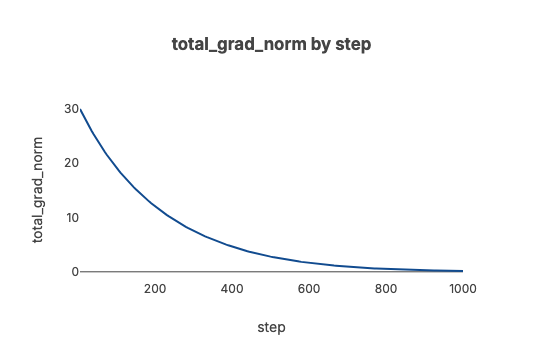

In [27]:
from src.eval import plot_metric, plot_train_vs_val_loss

plot_metric(step_metrics_df, col='global_loss')
plot_metric(step_metrics_df, col='total_grad_norm')

##### Fit on all data

In [28]:
n_epochs = 1000

metric_log_cb = MetricLogCallback()
mlflow_log_cb = MLflowLogCallback()

model = init_model()

train(
    model,
    dataloader,
    val_dataloader,
    epochs=n_epochs,
    patience=args.early_stopping_patience,
    print_steps=100,
    lr=args.learning_rate,
    l2_reg=args.l2_reg,
    gradient_clipping=False,
    device=device,
    progress_bar_type='tqdm_notebook',
    callbacks=[metric_log_cb.process_payload, mlflow_log_cb.process_payload]
)

Epochs:   0%|          | 0/1000 [00:00<?, ?it/s]

Training Epoch 1:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:04:55.032 | INFO     | src.train_utils:train:161 - Step 100, Global Loss: 134.9482
2024-09-20 22:04:55.033 | INFO     | src.train_utils:train:164 - Step 100, Learning Rate: 0.000300
2024-09-20 22:04:55.033 | INFO     | src.train_utils:train:167 - Step 100, Gradient Norms: {'grad_norm_user_embedding.weight': 22.63197898864746, 'grad_norm_item_embedding.weight': 23.09489631652832, 'total_grad_norm': 32.33544044564375}
2024-09-20 22:04:55.672 | INFO     | src.train_utils:train:161 - Step 200, Global Loss: 132.3638
2024-09-20 22:04:55.672 | INFO     | src.train_utils:train:164 - Step 200, Learning Rate: 0.000300
2024-09-20 22:04:55.672 | INFO     | src.train_utils:train:167 - Step 200, Gradient Norms: {'grad_norm_user_embedding.weight': 26.099863052368164, 'grad_norm_item_embedding.weight': 25.964710235595703, 'total_grad_norm': 36.81533687161943}
2024-09-20 22:04:56.281 | INFO     | src.train_utils:train:161 - Step 300, Global Loss: 132.1530
2024-09-20 22:04:56.282 | INFO   

Training Epoch 2:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:05:12.459 | INFO     | src.train_utils:train:161 - Step 2700, Global Loss: 111.5366
2024-09-20 22:05:12.460 | INFO     | src.train_utils:train:164 - Step 2700, Learning Rate: 0.000300
2024-09-20 22:05:12.460 | INFO     | src.train_utils:train:167 - Step 2700, Gradient Norms: {'grad_norm_user_embedding.weight': 21.514144897460938, 'grad_norm_item_embedding.weight': 21.330488204956055, 'total_grad_norm': 30.296008940629687}
2024-09-20 22:05:13.081 | INFO     | src.train_utils:train:161 - Step 2800, Global Loss: 110.2412
2024-09-20 22:05:13.081 | INFO     | src.train_utils:train:164 - Step 2800, Learning Rate: 0.000300
2024-09-20 22:05:13.081 | INFO     | src.train_utils:train:167 - Step 2800, Gradient Norms: {'grad_norm_user_embedding.weight': 21.990018844604492, 'grad_norm_item_embedding.weight': 21.824642181396484, 'total_grad_norm': 30.98186461677301}
2024-09-20 22:05:13.721 | INFO     | src.train_utils:train:161 - Step 2900, Global Loss: 111.2341
2024-09-20 22:05:13.721

Training Epoch 3:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:05:29.520 | INFO     | src.train_utils:train:161 - Step 5400, Global Loss: 97.7934
2024-09-20 22:05:29.520 | INFO     | src.train_utils:train:164 - Step 5400, Learning Rate: 0.000300
2024-09-20 22:05:29.520 | INFO     | src.train_utils:train:167 - Step 5400, Gradient Norms: {'grad_norm_user_embedding.weight': 18.2154598236084, 'grad_norm_item_embedding.weight': 18.262332916259766, 'total_grad_norm': 25.79371590387466}
2024-09-20 22:05:30.597 | INFO     | src.train_utils:train:161 - Step 5500, Global Loss: 97.6977
2024-09-20 22:05:30.597 | INFO     | src.train_utils:train:164 - Step 5500, Learning Rate: 0.000300
2024-09-20 22:05:30.598 | INFO     | src.train_utils:train:167 - Step 5500, Gradient Norms: {'grad_norm_user_embedding.weight': 17.98227310180664, 'grad_norm_item_embedding.weight': 17.576631546020508, 'total_grad_norm': 25.145578585757814}
2024-09-20 22:05:31.299 | INFO     | src.train_utils:train:161 - Step 5600, Global Loss: 98.0166
2024-09-20 22:05:31.300 | INF

Training Epoch 4:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:05:46.923 | INFO     | src.train_utils:train:161 - Step 8000, Global Loss: 83.5581
2024-09-20 22:05:46.923 | INFO     | src.train_utils:train:164 - Step 8000, Learning Rate: 0.000300
2024-09-20 22:05:46.923 | INFO     | src.train_utils:train:167 - Step 8000, Gradient Norms: {'grad_norm_user_embedding.weight': 17.619688034057617, 'grad_norm_item_embedding.weight': 17.71767234802246, 'total_grad_norm': 24.98738321332174}
2024-09-20 22:05:47.656 | INFO     | src.train_utils:train:161 - Step 8100, Global Loss: 85.5306
2024-09-20 22:05:47.657 | INFO     | src.train_utils:train:164 - Step 8100, Learning Rate: 0.000300
2024-09-20 22:05:47.657 | INFO     | src.train_utils:train:167 - Step 8100, Gradient Norms: {'grad_norm_user_embedding.weight': 18.782855987548828, 'grad_norm_item_embedding.weight': 18.891010284423828, 'total_grad_norm': 26.63955608892922}
2024-09-20 22:05:48.385 | INFO     | src.train_utils:train:161 - Step 8200, Global Loss: 85.7632
2024-09-20 22:05:48.386 | IN

Training Epoch 5:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:06:06.751 | INFO     | src.train_utils:train:161 - Step 10700, Global Loss: 72.1938
2024-09-20 22:06:06.751 | INFO     | src.train_utils:train:164 - Step 10700, Learning Rate: 0.000300
2024-09-20 22:06:06.752 | INFO     | src.train_utils:train:167 - Step 10700, Gradient Norms: {'grad_norm_user_embedding.weight': 15.761631965637207, 'grad_norm_item_embedding.weight': 15.885674476623535, 'total_grad_norm': 22.378196884410617}
2024-09-20 22:06:07.451 | INFO     | src.train_utils:train:161 - Step 10800, Global Loss: 72.1120
2024-09-20 22:06:07.451 | INFO     | src.train_utils:train:164 - Step 10800, Learning Rate: 0.000300
2024-09-20 22:06:07.451 | INFO     | src.train_utils:train:167 - Step 10800, Gradient Norms: {'grad_norm_user_embedding.weight': 14.422700881958008, 'grad_norm_item_embedding.weight': 14.569092750549316, 'total_grad_norm': 20.500555219421276}
2024-09-20 22:06:08.161 | INFO     | src.train_utils:train:161 - Step 10900, Global Loss: 72.2745
2024-09-20 22:06:0

Training Epoch 6:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:06:26.451 | INFO     | src.train_utils:train:161 - Step 13300, Global Loss: 63.9425
2024-09-20 22:06:26.452 | INFO     | src.train_utils:train:164 - Step 13300, Learning Rate: 0.000300
2024-09-20 22:06:26.452 | INFO     | src.train_utils:train:167 - Step 13300, Gradient Norms: {'grad_norm_user_embedding.weight': 12.793246269226074, 'grad_norm_item_embedding.weight': 13.157355308532715, 'total_grad_norm': 18.351652481998478}
2024-09-20 22:06:27.498 | INFO     | src.train_utils:train:161 - Step 13400, Global Loss: 63.7552
2024-09-20 22:06:27.498 | INFO     | src.train_utils:train:164 - Step 13400, Learning Rate: 0.000300
2024-09-20 22:06:27.498 | INFO     | src.train_utils:train:167 - Step 13400, Gradient Norms: {'grad_norm_user_embedding.weight': 15.249763488769531, 'grad_norm_item_embedding.weight': 15.579806327819824, 'total_grad_norm': 21.801047031640085}
2024-09-20 22:06:28.213 | INFO     | src.train_utils:train:161 - Step 13500, Global Loss: 63.2731
2024-09-20 22:06:2

Training Epoch 7:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:06:47.097 | INFO     | src.train_utils:train:161 - Step 16000, Global Loss: 54.0897
2024-09-20 22:06:47.098 | INFO     | src.train_utils:train:164 - Step 16000, Learning Rate: 0.000300
2024-09-20 22:06:47.098 | INFO     | src.train_utils:train:167 - Step 16000, Gradient Norms: {'grad_norm_user_embedding.weight': 12.921280860900879, 'grad_norm_item_embedding.weight': 13.888466835021973, 'total_grad_norm': 18.969686610848072}
2024-09-20 22:06:47.975 | INFO     | src.train_utils:train:161 - Step 16100, Global Loss: 53.2894
2024-09-20 22:06:47.975 | INFO     | src.train_utils:train:164 - Step 16100, Learning Rate: 0.000300
2024-09-20 22:06:47.975 | INFO     | src.train_utils:train:167 - Step 16100, Gradient Norms: {'grad_norm_user_embedding.weight': 13.155388832092285, 'grad_norm_item_embedding.weight': 13.852398872375488, 'total_grad_norm': 19.103748580918044}
2024-09-20 22:06:48.734 | INFO     | src.train_utils:train:161 - Step 16200, Global Loss: 52.9906
2024-09-20 22:06:4

Training Epoch 8:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:07:06.156 | INFO     | src.train_utils:train:161 - Step 18600, Global Loss: 47.0288
2024-09-20 22:07:06.157 | INFO     | src.train_utils:train:164 - Step 18600, Learning Rate: 0.000300
2024-09-20 22:07:06.157 | INFO     | src.train_utils:train:167 - Step 18600, Gradient Norms: {'grad_norm_user_embedding.weight': 13.3966646194458, 'grad_norm_item_embedding.weight': 14.143587112426758, 'total_grad_norm': 19.481059502314427}
2024-09-20 22:07:06.861 | INFO     | src.train_utils:train:161 - Step 18700, Global Loss: 46.7170
2024-09-20 22:07:06.862 | INFO     | src.train_utils:train:164 - Step 18700, Learning Rate: 0.000300
2024-09-20 22:07:06.862 | INFO     | src.train_utils:train:167 - Step 18700, Gradient Norms: {'grad_norm_user_embedding.weight': 13.684181213378906, 'grad_norm_item_embedding.weight': 14.458008766174316, 'total_grad_norm': 19.90705485408039}
2024-09-20 22:07:07.548 | INFO     | src.train_utils:train:161 - Step 18800, Global Loss: 46.3275
2024-09-20 22:07:07.5

Training Epoch 9:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:07:26.746 | INFO     | src.train_utils:train:161 - Step 21300, Global Loss: 38.8346
2024-09-20 22:07:26.746 | INFO     | src.train_utils:train:164 - Step 21300, Learning Rate: 0.000300
2024-09-20 22:07:26.747 | INFO     | src.train_utils:train:167 - Step 21300, Gradient Norms: {'grad_norm_user_embedding.weight': 12.691096305847168, 'grad_norm_item_embedding.weight': 13.348953247070312, 'total_grad_norm': 18.418970607413343}
2024-09-20 22:07:27.424 | INFO     | src.train_utils:train:161 - Step 21400, Global Loss: 38.8453
2024-09-20 22:07:27.424 | INFO     | src.train_utils:train:164 - Step 21400, Learning Rate: 0.000300
2024-09-20 22:07:27.425 | INFO     | src.train_utils:train:167 - Step 21400, Gradient Norms: {'grad_norm_user_embedding.weight': 12.472687721252441, 'grad_norm_item_embedding.weight': 13.312675476074219, 'total_grad_norm': 18.242677087619278}
2024-09-20 22:07:28.097 | INFO     | src.train_utils:train:161 - Step 21500, Global Loss: 39.1165
2024-09-20 22:07:2

Training Epoch 10:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:07:45.839 | INFO     | src.train_utils:train:161 - Step 24000, Global Loss: 33.7285
2024-09-20 22:07:45.839 | INFO     | src.train_utils:train:164 - Step 24000, Learning Rate: 0.000300
2024-09-20 22:07:45.840 | INFO     | src.train_utils:train:167 - Step 24000, Gradient Norms: {'grad_norm_user_embedding.weight': 10.182865142822266, 'grad_norm_item_embedding.weight': 10.677584648132324, 'total_grad_norm': 14.754713024485966}
2024-09-20 22:07:46.520 | INFO     | src.train_utils:train:161 - Step 24100, Global Loss: 33.2387
2024-09-20 22:07:46.520 | INFO     | src.train_utils:train:164 - Step 24100, Learning Rate: 0.000300
2024-09-20 22:07:46.520 | INFO     | src.train_utils:train:167 - Step 24100, Gradient Norms: {'grad_norm_user_embedding.weight': 9.386569023132324, 'grad_norm_item_embedding.weight': 9.683754920959473, 'total_grad_norm': 13.486392675405611}
2024-09-20 22:07:47.192 | INFO     | src.train_utils:train:161 - Step 24200, Global Loss: 33.0215
2024-09-20 22:07:47.

Training Epoch 11:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:08:04.950 | INFO     | src.train_utils:train:161 - Step 26600, Global Loss: 27.9163
2024-09-20 22:08:04.950 | INFO     | src.train_utils:train:164 - Step 26600, Learning Rate: 0.000300
2024-09-20 22:08:04.951 | INFO     | src.train_utils:train:167 - Step 26600, Gradient Norms: {'grad_norm_user_embedding.weight': 8.777908325195312, 'grad_norm_item_embedding.weight': 9.623345375061035, 'total_grad_norm': 13.025377183530686}
2024-09-20 22:08:05.742 | INFO     | src.train_utils:train:161 - Step 26700, Global Loss: 28.1152
2024-09-20 22:08:05.742 | INFO     | src.train_utils:train:164 - Step 26700, Learning Rate: 0.000300
2024-09-20 22:08:05.743 | INFO     | src.train_utils:train:167 - Step 26700, Gradient Norms: {'grad_norm_user_embedding.weight': 8.628994941711426, 'grad_norm_item_embedding.weight': 8.951149940490723, 'total_grad_norm': 12.433126676794878}
2024-09-20 22:08:06.462 | INFO     | src.train_utils:train:161 - Step 26800, Global Loss: 27.9054
2024-09-20 22:08:06.46

Training Epoch 12:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:08:25.700 | INFO     | src.train_utils:train:161 - Step 29300, Global Loss: 23.6842
2024-09-20 22:08:25.700 | INFO     | src.train_utils:train:164 - Step 29300, Learning Rate: 0.000300
2024-09-20 22:08:25.700 | INFO     | src.train_utils:train:167 - Step 29300, Gradient Norms: {'grad_norm_user_embedding.weight': 7.556643009185791, 'grad_norm_item_embedding.weight': 8.34733772277832, 'total_grad_norm': 11.259702510563699}
2024-09-20 22:08:26.377 | INFO     | src.train_utils:train:161 - Step 29400, Global Loss: 23.7843
2024-09-20 22:08:26.377 | INFO     | src.train_utils:train:164 - Step 29400, Learning Rate: 0.000300
2024-09-20 22:08:26.377 | INFO     | src.train_utils:train:167 - Step 29400, Gradient Norms: {'grad_norm_user_embedding.weight': 7.147968769073486, 'grad_norm_item_embedding.weight': 7.777807235717773, 'total_grad_norm': 10.563509971578277}
2024-09-20 22:08:27.046 | INFO     | src.train_utils:train:161 - Step 29500, Global Loss: 23.5172
2024-09-20 22:08:27.046

Training Epoch 13:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:08:45.477 | INFO     | src.train_utils:train:161 - Step 31900, Global Loss: 19.8946
2024-09-20 22:08:45.477 | INFO     | src.train_utils:train:164 - Step 31900, Learning Rate: 0.000300
2024-09-20 22:08:45.478 | INFO     | src.train_utils:train:167 - Step 31900, Gradient Norms: {'grad_norm_user_embedding.weight': 7.5207343101501465, 'grad_norm_item_embedding.weight': 7.911818504333496, 'total_grad_norm': 10.915966132660156}
2024-09-20 22:08:46.177 | INFO     | src.train_utils:train:161 - Step 32000, Global Loss: 19.1812
2024-09-20 22:08:46.178 | INFO     | src.train_utils:train:164 - Step 32000, Learning Rate: 0.000300
2024-09-20 22:08:46.178 | INFO     | src.train_utils:train:167 - Step 32000, Gradient Norms: {'grad_norm_user_embedding.weight': 7.030107498168945, 'grad_norm_item_embedding.weight': 7.599527359008789, 'total_grad_norm': 10.352546909632157}
2024-09-20 22:08:46.855 | INFO     | src.train_utils:train:161 - Step 32100, Global Loss: 19.2171
2024-09-20 22:08:46.8

Training Epoch 14:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:09:03.855 | INFO     | src.train_utils:train:161 - Step 34600, Global Loss: 16.2554
2024-09-20 22:09:03.855 | INFO     | src.train_utils:train:164 - Step 34600, Learning Rate: 0.000300
2024-09-20 22:09:03.856 | INFO     | src.train_utils:train:167 - Step 34600, Gradient Norms: {'grad_norm_user_embedding.weight': 6.732151508331299, 'grad_norm_item_embedding.weight': 7.224844932556152, 'total_grad_norm': 9.875234084851341}
2024-09-20 22:09:04.516 | INFO     | src.train_utils:train:161 - Step 34700, Global Loss: 15.7572
2024-09-20 22:09:04.516 | INFO     | src.train_utils:train:164 - Step 34700, Learning Rate: 0.000300
2024-09-20 22:09:04.516 | INFO     | src.train_utils:train:167 - Step 34700, Gradient Norms: {'grad_norm_user_embedding.weight': 6.058047294616699, 'grad_norm_item_embedding.weight': 6.712246894836426, 'total_grad_norm': 9.041802663244423}
2024-09-20 22:09:05.179 | INFO     | src.train_utils:train:161 - Step 34800, Global Loss: 15.9567
2024-09-20 22:09:05.179 

Training Epoch 15:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:09:22.024 | INFO     | src.train_utils:train:161 - Step 37200, Global Loss: 12.7342
2024-09-20 22:09:22.024 | INFO     | src.train_utils:train:164 - Step 37200, Learning Rate: 0.000300
2024-09-20 22:09:22.025 | INFO     | src.train_utils:train:167 - Step 37200, Gradient Norms: {'grad_norm_user_embedding.weight': 5.298336505889893, 'grad_norm_item_embedding.weight': 5.965235710144043, 'total_grad_norm': 7.978496525487945}
2024-09-20 22:09:22.739 | INFO     | src.train_utils:train:161 - Step 37300, Global Loss: 12.9284
2024-09-20 22:09:22.740 | INFO     | src.train_utils:train:164 - Step 37300, Learning Rate: 0.000300
2024-09-20 22:09:22.740 | INFO     | src.train_utils:train:167 - Step 37300, Gradient Norms: {'grad_norm_user_embedding.weight': 6.385833740234375, 'grad_norm_item_embedding.weight': 7.037169933319092, 'total_grad_norm': 9.502664533083655}
2024-09-20 22:09:23.419 | INFO     | src.train_utils:train:161 - Step 37400, Global Loss: 13.0853
2024-09-20 22:09:23.419 

Training Epoch 16:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:09:42.049 | INFO     | src.train_utils:train:161 - Step 39900, Global Loss: 10.8503
2024-09-20 22:09:42.049 | INFO     | src.train_utils:train:164 - Step 39900, Learning Rate: 0.000300
2024-09-20 22:09:42.050 | INFO     | src.train_utils:train:167 - Step 39900, Gradient Norms: {'grad_norm_user_embedding.weight': 4.559265613555908, 'grad_norm_item_embedding.weight': 4.917291164398193, 'total_grad_norm': 6.705718106990621}
2024-09-20 22:09:42.721 | INFO     | src.train_utils:train:161 - Step 40000, Global Loss: 10.5309
2024-09-20 22:09:42.722 | INFO     | src.train_utils:train:164 - Step 40000, Learning Rate: 0.000300
2024-09-20 22:09:42.722 | INFO     | src.train_utils:train:167 - Step 40000, Gradient Norms: {'grad_norm_user_embedding.weight': 5.424666404724121, 'grad_norm_item_embedding.weight': 6.067848205566406, 'total_grad_norm': 8.139151518944587}
2024-09-20 22:09:43.397 | INFO     | src.train_utils:train:161 - Step 40100, Global Loss: 10.4996
2024-09-20 22:09:43.397 

Training Epoch 17:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:10:01.265 | INFO     | src.train_utils:train:161 - Step 42500, Global Loss: 10.3603
2024-09-20 22:10:01.265 | INFO     | src.train_utils:train:164 - Step 42500, Learning Rate: 0.000300
2024-09-20 22:10:01.265 | INFO     | src.train_utils:train:167 - Step 42500, Gradient Norms: {'grad_norm_user_embedding.weight': 4.760992050170898, 'grad_norm_item_embedding.weight': 5.350720405578613, 'total_grad_norm': 7.162210144952873}
2024-09-20 22:10:01.966 | INFO     | src.train_utils:train:161 - Step 42600, Global Loss: 8.5617
2024-09-20 22:10:01.966 | INFO     | src.train_utils:train:164 - Step 42600, Learning Rate: 0.000300
2024-09-20 22:10:01.966 | INFO     | src.train_utils:train:167 - Step 42600, Gradient Norms: {'grad_norm_user_embedding.weight': 5.331215858459473, 'grad_norm_item_embedding.weight': 5.616973876953125, 'total_grad_norm': 7.744175751096019}
2024-09-20 22:10:02.850 | INFO     | src.train_utils:train:161 - Step 42700, Global Loss: 8.6438
2024-09-20 22:10:02.850 | 

Training Epoch 18:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:10:20.405 | INFO     | src.train_utils:train:161 - Step 45200, Global Loss: 6.8097
2024-09-20 22:10:20.405 | INFO     | src.train_utils:train:164 - Step 45200, Learning Rate: 0.000300
2024-09-20 22:10:20.405 | INFO     | src.train_utils:train:167 - Step 45200, Gradient Norms: {'grad_norm_user_embedding.weight': 3.5804362297058105, 'grad_norm_item_embedding.weight': 4.13723611831665, 'total_grad_norm': 5.471402589253855}
2024-09-20 22:10:21.142 | INFO     | src.train_utils:train:161 - Step 45300, Global Loss: 6.8776
2024-09-20 22:10:21.142 | INFO     | src.train_utils:train:164 - Step 45300, Learning Rate: 0.000300
2024-09-20 22:10:21.142 | INFO     | src.train_utils:train:167 - Step 45300, Gradient Norms: {'grad_norm_user_embedding.weight': 4.03444242477417, 'grad_norm_item_embedding.weight': 4.5923237800598145, 'total_grad_norm': 6.112786875044847}
2024-09-20 22:10:21.822 | INFO     | src.train_utils:train:161 - Step 45400, Global Loss: 6.9176
2024-09-20 22:10:21.822 | I

Training Epoch 19:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:10:38.871 | INFO     | src.train_utils:train:161 - Step 47900, Global Loss: 5.7078
2024-09-20 22:10:38.871 | INFO     | src.train_utils:train:164 - Step 47900, Learning Rate: 0.000300
2024-09-20 22:10:38.871 | INFO     | src.train_utils:train:167 - Step 47900, Gradient Norms: {'grad_norm_user_embedding.weight': 3.9102976322174072, 'grad_norm_item_embedding.weight': 4.213923454284668, 'total_grad_norm': 5.748702327577545}
2024-09-20 22:10:39.572 | INFO     | src.train_utils:train:161 - Step 48000, Global Loss: 5.5733
2024-09-20 22:10:39.572 | INFO     | src.train_utils:train:164 - Step 48000, Learning Rate: 0.000300
2024-09-20 22:10:39.572 | INFO     | src.train_utils:train:167 - Step 48000, Gradient Norms: {'grad_norm_user_embedding.weight': 3.738426923751831, 'grad_norm_item_embedding.weight': 4.455375671386719, 'total_grad_norm': 5.81603028167987}
2024-09-20 22:10:40.242 | INFO     | src.train_utils:train:161 - Step 48100, Global Loss: 5.5001
2024-09-20 22:10:40.243 | I

Training Epoch 20:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:10:57.285 | INFO     | src.train_utils:train:161 - Step 50500, Global Loss: 4.7156
2024-09-20 22:10:57.285 | INFO     | src.train_utils:train:164 - Step 50500, Learning Rate: 0.000300
2024-09-20 22:10:57.285 | INFO     | src.train_utils:train:167 - Step 50500, Gradient Norms: {'grad_norm_user_embedding.weight': 2.776118516921997, 'grad_norm_item_embedding.weight': 2.9361040592193604, 'total_grad_norm': 4.04073521361665}
2024-09-20 22:10:57.916 | INFO     | src.train_utils:train:161 - Step 50600, Global Loss: 4.4515
2024-09-20 22:10:57.916 | INFO     | src.train_utils:train:164 - Step 50600, Learning Rate: 0.000300
2024-09-20 22:10:57.917 | INFO     | src.train_utils:train:167 - Step 50600, Gradient Norms: {'grad_norm_user_embedding.weight': 3.4848663806915283, 'grad_norm_item_embedding.weight': 4.035757541656494, 'total_grad_norm': 5.332132090103483}
2024-09-20 22:10:58.533 | INFO     | src.train_utils:train:161 - Step 50700, Global Loss: 4.3290
2024-09-20 22:10:58.533 | 

Training Epoch 21:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:11:15.160 | INFO     | src.train_utils:train:161 - Step 53200, Global Loss: 3.4011
2024-09-20 22:11:15.161 | INFO     | src.train_utils:train:164 - Step 53200, Learning Rate: 0.000300
2024-09-20 22:11:15.161 | INFO     | src.train_utils:train:167 - Step 53200, Gradient Norms: {'grad_norm_user_embedding.weight': 2.442514181137085, 'grad_norm_item_embedding.weight': 2.7870447635650635, 'total_grad_norm': 3.705872911902296}
2024-09-20 22:11:15.822 | INFO     | src.train_utils:train:161 - Step 53300, Global Loss: 3.4976
2024-09-20 22:11:15.823 | INFO     | src.train_utils:train:164 - Step 53300, Learning Rate: 0.000300
2024-09-20 22:11:15.823 | INFO     | src.train_utils:train:167 - Step 53300, Gradient Norms: {'grad_norm_user_embedding.weight': 3.7957797050476074, 'grad_norm_item_embedding.weight': 4.097146987915039, 'total_grad_norm': 5.585208770478735}
2024-09-20 22:11:16.458 | INFO     | src.train_utils:train:161 - Step 53400, Global Loss: 3.5017
2024-09-20 22:11:16.458 |

Training Epoch 22:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:11:32.113 | INFO     | src.train_utils:train:161 - Step 55800, Global Loss: 2.8772
2024-09-20 22:11:32.114 | INFO     | src.train_utils:train:164 - Step 55800, Learning Rate: 0.000300
2024-09-20 22:11:32.114 | INFO     | src.train_utils:train:167 - Step 55800, Gradient Norms: {'grad_norm_user_embedding.weight': 2.3937504291534424, 'grad_norm_item_embedding.weight': 2.700756311416626, 'total_grad_norm': 3.6088953671073685}
2024-09-20 22:11:32.841 | INFO     | src.train_utils:train:161 - Step 55900, Global Loss: 2.7079
2024-09-20 22:11:32.841 | INFO     | src.train_utils:train:164 - Step 55900, Learning Rate: 0.000300
2024-09-20 22:11:32.841 | INFO     | src.train_utils:train:167 - Step 55900, Gradient Norms: {'grad_norm_user_embedding.weight': 2.422755718231201, 'grad_norm_item_embedding.weight': 2.9119009971618652, 'total_grad_norm': 3.7879958668792457}
2024-09-20 22:11:33.478 | INFO     | src.train_utils:train:161 - Step 56000, Global Loss: 2.7048
2024-09-20 22:11:33.479

Training Epoch 23:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:11:50.576 | INFO     | src.train_utils:train:161 - Step 58500, Global Loss: 2.2646
2024-09-20 22:11:50.577 | INFO     | src.train_utils:train:164 - Step 58500, Learning Rate: 0.000300
2024-09-20 22:11:50.577 | INFO     | src.train_utils:train:167 - Step 58500, Gradient Norms: {'grad_norm_user_embedding.weight': 2.3451101779937744, 'grad_norm_item_embedding.weight': 2.768974542617798, 'total_grad_norm': 3.6286032801334778}
2024-09-20 22:11:51.206 | INFO     | src.train_utils:train:161 - Step 58600, Global Loss: 2.2057
2024-09-20 22:11:51.206 | INFO     | src.train_utils:train:164 - Step 58600, Learning Rate: 0.000300
2024-09-20 22:11:51.206 | INFO     | src.train_utils:train:167 - Step 58600, Gradient Norms: {'grad_norm_user_embedding.weight': 2.3954017162323, 'grad_norm_item_embedding.weight': 2.8547415733337402, 'total_grad_norm': 3.726593462218363}
2024-09-20 22:11:51.813 | INFO     | src.train_utils:train:161 - Step 58700, Global Loss: 2.2100
2024-09-20 22:11:51.813 | 

Training Epoch 24:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:12:07.404 | INFO     | src.train_utils:train:161 - Step 61100, Global Loss: 1.6893
2024-09-20 22:12:07.404 | INFO     | src.train_utils:train:164 - Step 61100, Learning Rate: 0.000300
2024-09-20 22:12:07.404 | INFO     | src.train_utils:train:167 - Step 61100, Gradient Norms: {'grad_norm_user_embedding.weight': 2.7908334732055664, 'grad_norm_item_embedding.weight': 3.185962677001953, 'total_grad_norm': 4.23545861205302}
2024-09-20 22:12:08.051 | INFO     | src.train_utils:train:161 - Step 61200, Global Loss: 1.7574
2024-09-20 22:12:08.051 | INFO     | src.train_utils:train:164 - Step 61200, Learning Rate: 0.000300
2024-09-20 22:12:08.051 | INFO     | src.train_utils:train:167 - Step 61200, Gradient Norms: {'grad_norm_user_embedding.weight': 1.7994139194488525, 'grad_norm_item_embedding.weight': 2.126054048538208, 'total_grad_norm': 2.785317983787845}
2024-09-20 22:12:08.672 | INFO     | src.train_utils:train:161 - Step 61300, Global Loss: 1.7270
2024-09-20 22:12:08.672 | 

Training Epoch 25:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:12:24.196 | INFO     | src.train_utils:train:161 - Step 63800, Global Loss: 1.3037
2024-09-20 22:12:24.196 | INFO     | src.train_utils:train:164 - Step 63800, Learning Rate: 0.000300
2024-09-20 22:12:24.196 | INFO     | src.train_utils:train:167 - Step 63800, Gradient Norms: {'grad_norm_user_embedding.weight': 2.327242851257324, 'grad_norm_item_embedding.weight': 2.358898162841797, 'total_grad_norm': 3.3136776897258318}
2024-09-20 22:12:24.816 | INFO     | src.train_utils:train:161 - Step 63900, Global Loss: 1.2952
2024-09-20 22:12:24.817 | INFO     | src.train_utils:train:164 - Step 63900, Learning Rate: 0.000300
2024-09-20 22:12:24.817 | INFO     | src.train_utils:train:167 - Step 63900, Gradient Norms: {'grad_norm_user_embedding.weight': 1.7019727230072021, 'grad_norm_item_embedding.weight': 2.1333281993865967, 'total_grad_norm': 2.7290658394693614}
2024-09-20 22:12:25.442 | INFO     | src.train_utils:train:161 - Step 64000, Global Loss: 1.3175
2024-09-20 22:12:25.442

Training Epoch 26:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:12:40.830 | INFO     | src.train_utils:train:161 - Step 66500, Global Loss: 1.0209
2024-09-20 22:12:40.831 | INFO     | src.train_utils:train:164 - Step 66500, Learning Rate: 0.000300
2024-09-20 22:12:40.831 | INFO     | src.train_utils:train:167 - Step 66500, Gradient Norms: {'grad_norm_user_embedding.weight': 1.0616241693496704, 'grad_norm_item_embedding.weight': 1.4385478496551514, 'total_grad_norm': 1.787866268123776}
2024-09-20 22:12:41.445 | INFO     | src.train_utils:train:161 - Step 66600, Global Loss: 1.0381
2024-09-20 22:12:41.445 | INFO     | src.train_utils:train:164 - Step 66600, Learning Rate: 0.000300
2024-09-20 22:12:41.445 | INFO     | src.train_utils:train:167 - Step 66600, Gradient Norms: {'grad_norm_user_embedding.weight': 1.141329050064087, 'grad_norm_item_embedding.weight': 1.266587257385254, 'total_grad_norm': 1.7049560935962222}
2024-09-20 22:12:42.051 | INFO     | src.train_utils:train:161 - Step 66700, Global Loss: 1.0346
2024-09-20 22:12:42.052 

Training Epoch 27:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:12:57.797 | INFO     | src.train_utils:train:161 - Step 69100, Global Loss: 0.8505
2024-09-20 22:12:57.797 | INFO     | src.train_utils:train:164 - Step 69100, Learning Rate: 0.000300
2024-09-20 22:12:57.797 | INFO     | src.train_utils:train:167 - Step 69100, Gradient Norms: {'grad_norm_user_embedding.weight': 1.3394184112548828, 'grad_norm_item_embedding.weight': 1.403896689414978, 'total_grad_norm': 1.9403524409134774}
2024-09-20 22:12:58.449 | INFO     | src.train_utils:train:161 - Step 69200, Global Loss: 0.8633
2024-09-20 22:12:58.449 | INFO     | src.train_utils:train:164 - Step 69200, Learning Rate: 0.000300
2024-09-20 22:12:58.449 | INFO     | src.train_utils:train:167 - Step 69200, Gradient Norms: {'grad_norm_user_embedding.weight': 1.4470393657684326, 'grad_norm_item_embedding.weight': 2.099926233291626, 'total_grad_norm': 2.5502182477877975}
2024-09-20 22:12:59.501 | INFO     | src.train_utils:train:161 - Step 69300, Global Loss: 0.8441
2024-09-20 22:12:59.502

Training Epoch 28:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:13:15.430 | INFO     | src.train_utils:train:161 - Step 71800, Global Loss: 0.5869
2024-09-20 22:13:15.430 | INFO     | src.train_utils:train:164 - Step 71800, Learning Rate: 0.000300
2024-09-20 22:13:15.431 | INFO     | src.train_utils:train:167 - Step 71800, Gradient Norms: {'grad_norm_user_embedding.weight': 1.1217838525772095, 'grad_norm_item_embedding.weight': 1.2701159715652466, 'total_grad_norm': 1.6945777034789808}
2024-09-20 22:13:16.069 | INFO     | src.train_utils:train:161 - Step 71900, Global Loss: 0.6134
2024-09-20 22:13:16.069 | INFO     | src.train_utils:train:164 - Step 71900, Learning Rate: 0.000300
2024-09-20 22:13:16.069 | INFO     | src.train_utils:train:167 - Step 71900, Gradient Norms: {'grad_norm_user_embedding.weight': 1.2157838344573975, 'grad_norm_item_embedding.weight': 1.3615779876708984, 'total_grad_norm': 1.8253835072767217}
2024-09-20 22:13:16.790 | INFO     | src.train_utils:train:161 - Step 72000, Global Loss: 0.6195
2024-09-20 22:13:16.7

Training Epoch 29:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:13:31.791 | INFO     | src.train_utils:train:161 - Step 74400, Global Loss: 0.5341
2024-09-20 22:13:31.791 | INFO     | src.train_utils:train:164 - Step 74400, Learning Rate: 0.000300
2024-09-20 22:13:31.791 | INFO     | src.train_utils:train:167 - Step 74400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.8565183877944946, 'grad_norm_item_embedding.weight': 1.057605266571045, 'total_grad_norm': 1.360938150140884}
2024-09-20 22:13:32.438 | INFO     | src.train_utils:train:161 - Step 74500, Global Loss: 0.4957
2024-09-20 22:13:32.438 | INFO     | src.train_utils:train:164 - Step 74500, Learning Rate: 0.000300
2024-09-20 22:13:32.438 | INFO     | src.train_utils:train:167 - Step 74500, Gradient Norms: {'grad_norm_user_embedding.weight': 1.2110127210617065, 'grad_norm_item_embedding.weight': 1.59762442111969, 'total_grad_norm': 2.0047332993521367}
2024-09-20 22:13:33.064 | INFO     | src.train_utils:train:161 - Step 74600, Global Loss: 0.5116
2024-09-20 22:13:33.064 |

Training Epoch 30:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:13:48.682 | INFO     | src.train_utils:train:161 - Step 77100, Global Loss: 0.3827
2024-09-20 22:13:48.683 | INFO     | src.train_utils:train:164 - Step 77100, Learning Rate: 0.000300
2024-09-20 22:13:48.684 | INFO     | src.train_utils:train:167 - Step 77100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.904938280582428, 'grad_norm_item_embedding.weight': 1.0435336828231812, 'total_grad_norm': 1.3812587877910472}
2024-09-20 22:13:49.326 | INFO     | src.train_utils:train:161 - Step 77200, Global Loss: 0.3861
2024-09-20 22:13:49.327 | INFO     | src.train_utils:train:164 - Step 77200, Learning Rate: 0.000300
2024-09-20 22:13:49.327 | INFO     | src.train_utils:train:167 - Step 77200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6794838309288025, 'grad_norm_item_embedding.weight': 0.6658571362495422, 'total_grad_norm': 0.9513485178356683}
2024-09-20 22:13:49.949 | INFO     | src.train_utils:train:161 - Step 77300, Global Loss: 0.3755
2024-09-20 22:13:49.94

Training Epoch 31:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:14:04.788 | INFO     | src.train_utils:train:161 - Step 79700, Global Loss: 0.3208
2024-09-20 22:14:04.788 | INFO     | src.train_utils:train:164 - Step 79700, Learning Rate: 0.000300
2024-09-20 22:14:04.789 | INFO     | src.train_utils:train:167 - Step 79700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.7066146731376648, 'grad_norm_item_embedding.weight': 0.8960527181625366, 'total_grad_norm': 1.1411462526862712}
2024-09-20 22:14:05.434 | INFO     | src.train_utils:train:161 - Step 79800, Global Loss: 0.2977
2024-09-20 22:14:05.434 | INFO     | src.train_utils:train:164 - Step 79800, Learning Rate: 0.000300
2024-09-20 22:14:05.434 | INFO     | src.train_utils:train:167 - Step 79800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.7205669283866882, 'grad_norm_item_embedding.weight': 0.7862818837165833, 'total_grad_norm': 1.0665157752914511}
2024-09-20 22:14:06.056 | INFO     | src.train_utils:train:161 - Step 79900, Global Loss: 0.2883
2024-09-20 22:14:06.0

Training Epoch 32:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:14:21.591 | INFO     | src.train_utils:train:161 - Step 82400, Global Loss: 0.2109
2024-09-20 22:14:21.592 | INFO     | src.train_utils:train:164 - Step 82400, Learning Rate: 0.000300
2024-09-20 22:14:21.592 | INFO     | src.train_utils:train:167 - Step 82400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.922867476940155, 'grad_norm_item_embedding.weight': 1.1855987310409546, 'total_grad_norm': 1.5024409243094416}
2024-09-20 22:14:22.239 | INFO     | src.train_utils:train:161 - Step 82500, Global Loss: 0.2280
2024-09-20 22:14:22.240 | INFO     | src.train_utils:train:164 - Step 82500, Learning Rate: 0.000300
2024-09-20 22:14:22.240 | INFO     | src.train_utils:train:167 - Step 82500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5266633629798889, 'grad_norm_item_embedding.weight': 0.6164141297340393, 'total_grad_norm': 0.8107654884373529}
2024-09-20 22:14:22.854 | INFO     | src.train_utils:train:161 - Step 82600, Global Loss: 0.2338
2024-09-20 22:14:22.85

Training Epoch 33:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:14:37.655 | INFO     | src.train_utils:train:161 - Step 85000, Global Loss: 0.1753
2024-09-20 22:14:37.656 | INFO     | src.train_utils:train:164 - Step 85000, Learning Rate: 0.000300
2024-09-20 22:14:37.656 | INFO     | src.train_utils:train:167 - Step 85000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5084705948829651, 'grad_norm_item_embedding.weight': 0.5905084609985352, 'total_grad_norm': 0.7792577162733103}
2024-09-20 22:14:38.310 | INFO     | src.train_utils:train:161 - Step 85100, Global Loss: 0.1602
2024-09-20 22:14:38.310 | INFO     | src.train_utils:train:164 - Step 85100, Learning Rate: 0.000300
2024-09-20 22:14:38.310 | INFO     | src.train_utils:train:167 - Step 85100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.6154811978340149, 'grad_norm_item_embedding.weight': 0.7656614184379578, 'total_grad_norm': 0.982371880996}
2024-09-20 22:14:38.928 | INFO     | src.train_utils:train:161 - Step 85200, Global Loss: 0.1638
2024-09-20 22:14:38.928 |

Training Epoch 34:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:14:54.600 | INFO     | src.train_utils:train:161 - Step 87700, Global Loss: 0.1348
2024-09-20 22:14:54.600 | INFO     | src.train_utils:train:164 - Step 87700, Learning Rate: 0.000300
2024-09-20 22:14:54.600 | INFO     | src.train_utils:train:167 - Step 87700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.5519611239433289, 'grad_norm_item_embedding.weight': 0.5228288769721985, 'total_grad_norm': 0.7602704235604546}
2024-09-20 22:14:55.348 | INFO     | src.train_utils:train:161 - Step 87800, Global Loss: 0.1403
2024-09-20 22:14:55.348 | INFO     | src.train_utils:train:164 - Step 87800, Learning Rate: 0.000300
2024-09-20 22:14:55.349 | INFO     | src.train_utils:train:167 - Step 87800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3856551945209503, 'grad_norm_item_embedding.weight': 0.41315436363220215, 'total_grad_norm': 0.5651782526330272}
2024-09-20 22:14:55.977 | INFO     | src.train_utils:train:161 - Step 87900, Global Loss: 0.1379
2024-09-20 22:14:55.

Training Epoch 35:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:15:11.628 | INFO     | src.train_utils:train:161 - Step 90400, Global Loss: 0.1123
2024-09-20 22:15:11.628 | INFO     | src.train_utils:train:164 - Step 90400, Learning Rate: 0.000300
2024-09-20 22:15:11.629 | INFO     | src.train_utils:train:167 - Step 90400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.4731960892677307, 'grad_norm_item_embedding.weight': 0.4885793924331665, 'total_grad_norm': 0.6801649517643763}
2024-09-20 22:15:12.248 | INFO     | src.train_utils:train:161 - Step 90500, Global Loss: 0.1212
2024-09-20 22:15:12.248 | INFO     | src.train_utils:train:164 - Step 90500, Learning Rate: 0.000300
2024-09-20 22:15:12.248 | INFO     | src.train_utils:train:167 - Step 90500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.4864729940891266, 'grad_norm_item_embedding.weight': 0.6116584539413452, 'total_grad_norm': 0.7815254559231939}
2024-09-20 22:15:12.858 | INFO     | src.train_utils:train:161 - Step 90600, Global Loss: 0.1210
2024-09-20 22:15:12.8

Training Epoch 36:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:15:27.782 | INFO     | src.train_utils:train:161 - Step 93000, Global Loss: 0.1037
2024-09-20 22:15:27.782 | INFO     | src.train_utils:train:164 - Step 93000, Learning Rate: 0.000300
2024-09-20 22:15:27.782 | INFO     | src.train_utils:train:167 - Step 93000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.42772015929222107, 'grad_norm_item_embedding.weight': 0.4855865240097046, 'total_grad_norm': 0.6471003067259282}
2024-09-20 22:15:28.418 | INFO     | src.train_utils:train:161 - Step 93100, Global Loss: 0.0987
2024-09-20 22:15:28.419 | INFO     | src.train_utils:train:164 - Step 93100, Learning Rate: 0.000300
2024-09-20 22:15:28.419 | INFO     | src.train_utils:train:167 - Step 93100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3652062714099884, 'grad_norm_item_embedding.weight': 0.34108930826187134, 'total_grad_norm': 0.49971745705723347}
2024-09-20 22:15:29.049 | INFO     | src.train_utils:train:161 - Step 93200, Global Loss: 0.0965
2024-09-20 22:15:2

Training Epoch 37:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:15:44.816 | INFO     | src.train_utils:train:161 - Step 95700, Global Loss: 0.0813
2024-09-20 22:15:44.817 | INFO     | src.train_utils:train:164 - Step 95700, Learning Rate: 0.000300
2024-09-20 22:15:44.817 | INFO     | src.train_utils:train:167 - Step 95700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2623175382614136, 'grad_norm_item_embedding.weight': 0.26053014397621155, 'total_grad_norm': 0.3697113019638346}
2024-09-20 22:15:45.450 | INFO     | src.train_utils:train:161 - Step 95800, Global Loss: 0.0801
2024-09-20 22:15:45.450 | INFO     | src.train_utils:train:164 - Step 95800, Learning Rate: 0.000300
2024-09-20 22:15:45.450 | INFO     | src.train_utils:train:167 - Step 95800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2964424192905426, 'grad_norm_item_embedding.weight': 0.30027589201927185, 'total_grad_norm': 0.4219522713326701}
2024-09-20 22:15:46.076 | INFO     | src.train_utils:train:161 - Step 95900, Global Loss: 0.0783
2024-09-20 22:15:46

Training Epoch 38:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:16:02.103 | INFO     | src.train_utils:train:161 - Step 98300, Global Loss: 0.0614
2024-09-20 22:16:02.104 | INFO     | src.train_utils:train:164 - Step 98300, Learning Rate: 0.000300
2024-09-20 22:16:02.104 | INFO     | src.train_utils:train:167 - Step 98300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3289411664009094, 'grad_norm_item_embedding.weight': 0.3617074489593506, 'total_grad_norm': 0.488911617356217}
2024-09-20 22:16:02.738 | INFO     | src.train_utils:train:161 - Step 98400, Global Loss: 0.0646
2024-09-20 22:16:02.739 | INFO     | src.train_utils:train:164 - Step 98400, Learning Rate: 0.000300
2024-09-20 22:16:02.739 | INFO     | src.train_utils:train:167 - Step 98400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.24798008799552917, 'grad_norm_item_embedding.weight': 0.23223507404327393, 'total_grad_norm': 0.3397458662856037}
2024-09-20 22:16:03.375 | INFO     | src.train_utils:train:161 - Step 98500, Global Loss: 0.0637
2024-09-20 22:16:03.

Training Epoch 39:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:16:19.086 | INFO     | src.train_utils:train:161 - Step 101000, Global Loss: 0.0477
2024-09-20 22:16:19.086 | INFO     | src.train_utils:train:164 - Step 101000, Learning Rate: 0.000300
2024-09-20 22:16:19.086 | INFO     | src.train_utils:train:167 - Step 101000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.24957197904586792, 'grad_norm_item_embedding.weight': 0.19960977137088776, 'total_grad_norm': 0.3195782119475751}
2024-09-20 22:16:19.744 | INFO     | src.train_utils:train:161 - Step 101100, Global Loss: 0.0497
2024-09-20 22:16:19.745 | INFO     | src.train_utils:train:164 - Step 101100, Learning Rate: 0.000300
2024-09-20 22:16:19.745 | INFO     | src.train_utils:train:167 - Step 101100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3354475796222687, 'grad_norm_item_embedding.weight': 0.3653338849544525, 'total_grad_norm': 0.4959777476564361}
2024-09-20 22:16:20.366 | INFO     | src.train_utils:train:161 - Step 101200, Global Loss: 0.0522
2024-09-20 2

Training Epoch 40:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:16:35.418 | INFO     | src.train_utils:train:161 - Step 103600, Global Loss: 0.0480
2024-09-20 22:16:35.418 | INFO     | src.train_utils:train:164 - Step 103600, Learning Rate: 0.000300
2024-09-20 22:16:35.419 | INFO     | src.train_utils:train:167 - Step 103600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.31365731358528137, 'grad_norm_item_embedding.weight': 0.2692515254020691, 'total_grad_norm': 0.41337306914804767}
2024-09-20 22:16:36.157 | INFO     | src.train_utils:train:161 - Step 103700, Global Loss: 0.0463
2024-09-20 22:16:36.157 | INFO     | src.train_utils:train:164 - Step 103700, Learning Rate: 0.000300
2024-09-20 22:16:36.157 | INFO     | src.train_utils:train:167 - Step 103700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2355588674545288, 'grad_norm_item_embedding.weight': 0.18163421750068665, 'total_grad_norm': 0.2974541460520378}
2024-09-20 22:16:36.782 | INFO     | src.train_utils:train:161 - Step 103800, Global Loss: 0.0475
2024-09-20 

Training Epoch 41:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:16:52.442 | INFO     | src.train_utils:train:161 - Step 106300, Global Loss: 0.0369
2024-09-20 22:16:52.442 | INFO     | src.train_utils:train:164 - Step 106300, Learning Rate: 0.000300
2024-09-20 22:16:52.443 | INFO     | src.train_utils:train:167 - Step 106300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.3247244358062744, 'grad_norm_item_embedding.weight': 0.34079092741012573, 'total_grad_norm': 0.47072753840704584}
2024-09-20 22:16:53.077 | INFO     | src.train_utils:train:161 - Step 106400, Global Loss: 0.0393
2024-09-20 22:16:53.077 | INFO     | src.train_utils:train:164 - Step 106400, Learning Rate: 0.000300
2024-09-20 22:16:53.077 | INFO     | src.train_utils:train:167 - Step 106400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.32461896538734436, 'grad_norm_item_embedding.weight': 0.2699742019176483, 'total_grad_norm': 0.42221267435999715}
2024-09-20 22:16:53.709 | INFO     | src.train_utils:train:161 - Step 106500, Global Loss: 0.0400
2024-09-20

Training Epoch 42:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:17:09.153 | INFO     | src.train_utils:train:161 - Step 108900, Global Loss: 0.0275
2024-09-20 22:17:09.153 | INFO     | src.train_utils:train:164 - Step 108900, Learning Rate: 0.000300
2024-09-20 22:17:09.153 | INFO     | src.train_utils:train:167 - Step 108900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.22531172633171082, 'grad_norm_item_embedding.weight': 0.16293984651565552, 'total_grad_norm': 0.27805533191277076}
2024-09-20 22:17:09.814 | INFO     | src.train_utils:train:161 - Step 109000, Global Loss: 0.0362
2024-09-20 22:17:09.814 | INFO     | src.train_utils:train:164 - Step 109000, Learning Rate: 0.000300
2024-09-20 22:17:09.814 | INFO     | src.train_utils:train:167 - Step 109000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2507469356060028, 'grad_norm_item_embedding.weight': 0.18995612859725952, 'total_grad_norm': 0.3145748821941439}
2024-09-20 22:17:10.448 | INFO     | src.train_utils:train:161 - Step 109100, Global Loss: 0.0394
2024-09-20

Training Epoch 43:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:17:26.256 | INFO     | src.train_utils:train:161 - Step 111600, Global Loss: 0.0308
2024-09-20 22:17:26.256 | INFO     | src.train_utils:train:164 - Step 111600, Learning Rate: 0.000300
2024-09-20 22:17:26.256 | INFO     | src.train_utils:train:167 - Step 111600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.20376524329185486, 'grad_norm_item_embedding.weight': 0.14314791560173035, 'total_grad_norm': 0.24902128446160765}
2024-09-20 22:17:26.913 | INFO     | src.train_utils:train:161 - Step 111700, Global Loss: 0.0318
2024-09-20 22:17:26.913 | INFO     | src.train_utils:train:164 - Step 111700, Learning Rate: 0.000300
2024-09-20 22:17:26.913 | INFO     | src.train_utils:train:167 - Step 111700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.23521025478839874, 'grad_norm_item_embedding.weight': 0.18806764483451843, 'total_grad_norm': 0.30115328819593856}
2024-09-20 22:17:27.530 | INFO     | src.train_utils:train:161 - Step 111800, Global Loss: 0.0349
2024-09-

Training Epoch 44:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:17:43.364 | INFO     | src.train_utils:train:161 - Step 114300, Global Loss: 0.0297
2024-09-20 22:17:43.364 | INFO     | src.train_utils:train:164 - Step 114300, Learning Rate: 0.000300
2024-09-20 22:17:43.364 | INFO     | src.train_utils:train:167 - Step 114300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.20163297653198242, 'grad_norm_item_embedding.weight': 0.1456294059753418, 'total_grad_norm': 0.24872430743672377}
2024-09-20 22:17:44.013 | INFO     | src.train_utils:train:161 - Step 114400, Global Loss: 0.0315
2024-09-20 22:17:44.013 | INFO     | src.train_utils:train:164 - Step 114400, Learning Rate: 0.000300
2024-09-20 22:17:44.014 | INFO     | src.train_utils:train:167 - Step 114400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.20415708422660828, 'grad_norm_item_embedding.weight': 0.1423816978931427, 'total_grad_norm': 0.24890291869490921}
2024-09-20 22:17:44.625 | INFO     | src.train_utils:train:161 - Step 114500, Global Loss: 0.0330
2024-09-20

Training Epoch 45:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:17:59.578 | INFO     | src.train_utils:train:161 - Step 116900, Global Loss: 0.0280
2024-09-20 22:17:59.578 | INFO     | src.train_utils:train:164 - Step 116900, Learning Rate: 0.000300
2024-09-20 22:17:59.578 | INFO     | src.train_utils:train:167 - Step 116900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.19170042872428894, 'grad_norm_item_embedding.weight': 0.12493688613176346, 'total_grad_norm': 0.22881931712462}
2024-09-20 22:18:00.237 | INFO     | src.train_utils:train:161 - Step 117000, Global Loss: 0.0285
2024-09-20 22:18:00.237 | INFO     | src.train_utils:train:164 - Step 117000, Learning Rate: 0.000300
2024-09-20 22:18:00.238 | INFO     | src.train_utils:train:167 - Step 117000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.20309020578861237, 'grad_norm_item_embedding.weight': 0.14932145178318024, 'total_grad_norm': 0.25207643215877507}
2024-09-20 22:18:00.879 | INFO     | src.train_utils:train:161 - Step 117100, Global Loss: 0.0297
2024-09-20 

Training Epoch 46:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:18:16.775 | INFO     | src.train_utils:train:161 - Step 119600, Global Loss: 0.0278
2024-09-20 22:18:16.776 | INFO     | src.train_utils:train:164 - Step 119600, Learning Rate: 0.000300
2024-09-20 22:18:16.776 | INFO     | src.train_utils:train:167 - Step 119600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.22081135213375092, 'grad_norm_item_embedding.weight': 0.15832732617855072, 'total_grad_norm': 0.2717079230460248}
2024-09-20 22:18:17.401 | INFO     | src.train_utils:train:161 - Step 119700, Global Loss: 0.0284
2024-09-20 22:18:17.402 | INFO     | src.train_utils:train:164 - Step 119700, Learning Rate: 0.000300
2024-09-20 22:18:17.402 | INFO     | src.train_utils:train:167 - Step 119700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.19907356798648834, 'grad_norm_item_embedding.weight': 0.1315862238407135, 'total_grad_norm': 0.23863197559323301}
2024-09-20 22:18:18.035 | INFO     | src.train_utils:train:161 - Step 119800, Global Loss: 0.0296
2024-09-20

Training Epoch 47:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:18:36.654 | INFO     | src.train_utils:train:161 - Step 122200, Global Loss: 0.0275
2024-09-20 22:18:36.654 | INFO     | src.train_utils:train:164 - Step 122200, Learning Rate: 0.000300
2024-09-20 22:18:36.654 | INFO     | src.train_utils:train:167 - Step 122200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.19661688804626465, 'grad_norm_item_embedding.weight': 0.1299070566892624, 'total_grad_norm': 0.2356566231674056}
2024-09-20 22:18:37.432 | INFO     | src.train_utils:train:161 - Step 122300, Global Loss: 0.0273
2024-09-20 22:18:37.437 | INFO     | src.train_utils:train:164 - Step 122300, Learning Rate: 0.000300
2024-09-20 22:18:37.439 | INFO     | src.train_utils:train:167 - Step 122300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.21007606387138367, 'grad_norm_item_embedding.weight': 0.1437978893518448, 'total_grad_norm': 0.25457766122293424}
2024-09-20 22:18:38.373 | INFO     | src.train_utils:train:161 - Step 122400, Global Loss: 0.0275
2024-09-20 

Training Epoch 48:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:18:56.928 | INFO     | src.train_utils:train:161 - Step 124900, Global Loss: 0.0264
2024-09-20 22:18:56.929 | INFO     | src.train_utils:train:164 - Step 124900, Learning Rate: 0.000300
2024-09-20 22:18:56.929 | INFO     | src.train_utils:train:167 - Step 124900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.21568182110786438, 'grad_norm_item_embedding.weight': 0.13458572328090668, 'total_grad_norm': 0.25422817481044385}
2024-09-20 22:18:57.702 | INFO     | src.train_utils:train:161 - Step 125000, Global Loss: 0.0269
2024-09-20 22:18:57.702 | INFO     | src.train_utils:train:164 - Step 125000, Learning Rate: 0.000300
2024-09-20 22:18:57.703 | INFO     | src.train_utils:train:167 - Step 125000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.21412521600723267, 'grad_norm_item_embedding.weight': 0.1392003893852234, 'total_grad_norm': 0.25539451156033455}
2024-09-20 22:18:58.497 | INFO     | src.train_utils:train:161 - Step 125100, Global Loss: 0.0276
2024-09-2

Training Epoch 49:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:19:16.168 | INFO     | src.train_utils:train:161 - Step 127500, Global Loss: 0.0264
2024-09-20 22:19:16.169 | INFO     | src.train_utils:train:164 - Step 127500, Learning Rate: 0.000300
2024-09-20 22:19:16.169 | INFO     | src.train_utils:train:167 - Step 127500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18258658051490784, 'grad_norm_item_embedding.weight': 0.11657445132732391, 'total_grad_norm': 0.21662747306469124}
2024-09-20 22:19:16.864 | INFO     | src.train_utils:train:161 - Step 127600, Global Loss: 0.0271
2024-09-20 22:19:16.865 | INFO     | src.train_utils:train:164 - Step 127600, Learning Rate: 0.000300
2024-09-20 22:19:16.865 | INFO     | src.train_utils:train:167 - Step 127600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.20898747444152832, 'grad_norm_item_embedding.weight': 0.13064193725585938, 'total_grad_norm': 0.24646111304506507}
2024-09-20 22:19:17.543 | INFO     | src.train_utils:train:161 - Step 127700, Global Loss: 0.0274
2024-09-

Training Epoch 50:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:19:36.728 | INFO     | src.train_utils:train:161 - Step 130200, Global Loss: 0.0272
2024-09-20 22:19:36.729 | INFO     | src.train_utils:train:164 - Step 130200, Learning Rate: 0.000300
2024-09-20 22:19:36.729 | INFO     | src.train_utils:train:167 - Step 130200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1969803422689438, 'grad_norm_item_embedding.weight': 0.11701358109712601, 'total_grad_norm': 0.2291144548071202}
2024-09-20 22:19:37.394 | INFO     | src.train_utils:train:161 - Step 130300, Global Loss: 0.0274
2024-09-20 22:19:37.394 | INFO     | src.train_utils:train:164 - Step 130300, Learning Rate: 0.000300
2024-09-20 22:19:37.395 | INFO     | src.train_utils:train:167 - Step 130300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.21030770242214203, 'grad_norm_item_embedding.weight': 0.1381193995475769, 'total_grad_norm': 0.25160742880420567}
2024-09-20 22:19:38.080 | INFO     | src.train_utils:train:161 - Step 130400, Global Loss: 0.0284
2024-09-20 

Training Epoch 51:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:19:57.818 | INFO     | src.train_utils:train:161 - Step 132900, Global Loss: 0.0279
2024-09-20 22:19:57.818 | INFO     | src.train_utils:train:164 - Step 132900, Learning Rate: 0.000300
2024-09-20 22:19:57.819 | INFO     | src.train_utils:train:167 - Step 132900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.2120703011751175, 'grad_norm_item_embedding.weight': 0.12753088772296906, 'total_grad_norm': 0.24746300726353743}
2024-09-20 22:19:58.477 | INFO     | src.train_utils:train:161 - Step 133000, Global Loss: 0.0281
2024-09-20 22:19:58.477 | INFO     | src.train_utils:train:164 - Step 133000, Learning Rate: 0.000300
2024-09-20 22:19:58.477 | INFO     | src.train_utils:train:167 - Step 133000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18268844485282898, 'grad_norm_item_embedding.weight': 0.11285732686519623, 'total_grad_norm': 0.21473668552416209}
2024-09-20 22:19:59.395 | INFO     | src.train_utils:train:161 - Step 133100, Global Loss: 0.0288
2024-09-2

Training Epoch 52:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:20:17.457 | INFO     | src.train_utils:train:161 - Step 135500, Global Loss: 0.0282
2024-09-20 22:20:17.457 | INFO     | src.train_utils:train:164 - Step 135500, Learning Rate: 0.000300
2024-09-20 22:20:17.457 | INFO     | src.train_utils:train:167 - Step 135500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1871234029531479, 'grad_norm_item_embedding.weight': 0.11227084696292877, 'total_grad_norm': 0.21821986850545835}
2024-09-20 22:20:18.076 | INFO     | src.train_utils:train:161 - Step 135600, Global Loss: 0.0283
2024-09-20 22:20:18.076 | INFO     | src.train_utils:train:164 - Step 135600, Learning Rate: 0.000300
2024-09-20 22:20:18.077 | INFO     | src.train_utils:train:167 - Step 135600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.20674043893814087, 'grad_norm_item_embedding.weight': 0.12672187387943268, 'total_grad_norm': 0.2424872005113878}
2024-09-20 22:20:18.781 | INFO     | src.train_utils:train:161 - Step 135700, Global Loss: 0.0284
2024-09-20

Training Epoch 53:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:20:34.589 | INFO     | src.train_utils:train:161 - Step 138200, Global Loss: 0.0271
2024-09-20 22:20:34.589 | INFO     | src.train_utils:train:164 - Step 138200, Learning Rate: 0.000300
2024-09-20 22:20:34.589 | INFO     | src.train_utils:train:167 - Step 138200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17715153098106384, 'grad_norm_item_embedding.weight': 0.10847074538469315, 'total_grad_norm': 0.2077223327744173}
2024-09-20 22:20:35.210 | INFO     | src.train_utils:train:161 - Step 138300, Global Loss: 0.0282
2024-09-20 22:20:35.210 | INFO     | src.train_utils:train:164 - Step 138300, Learning Rate: 0.000300
2024-09-20 22:20:35.211 | INFO     | src.train_utils:train:167 - Step 138300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17111258208751678, 'grad_norm_item_embedding.weight': 0.0930335596203804, 'total_grad_norm': 0.1947684752835942}
2024-09-20 22:20:35.826 | INFO     | src.train_utils:train:161 - Step 138400, Global Loss: 0.0293
2024-09-20 

Training Epoch 54:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:20:51.582 | INFO     | src.train_utils:train:161 - Step 140800, Global Loss: 0.0285
2024-09-20 22:20:51.582 | INFO     | src.train_utils:train:164 - Step 140800, Learning Rate: 0.000300
2024-09-20 22:20:51.582 | INFO     | src.train_utils:train:167 - Step 140800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.193167582154274, 'grad_norm_item_embedding.weight': 0.10533864051103592, 'total_grad_norm': 0.22002259879394537}
2024-09-20 22:20:52.206 | INFO     | src.train_utils:train:161 - Step 140900, Global Loss: 0.0292
2024-09-20 22:20:52.207 | INFO     | src.train_utils:train:164 - Step 140900, Learning Rate: 0.000300
2024-09-20 22:20:52.207 | INFO     | src.train_utils:train:167 - Step 140900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17868183553218842, 'grad_norm_item_embedding.weight': 0.10019616782665253, 'total_grad_norm': 0.2048571951294334}
2024-09-20 22:20:52.835 | INFO     | src.train_utils:train:161 - Step 141000, Global Loss: 0.0297
2024-09-20 

Training Epoch 55:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:21:08.592 | INFO     | src.train_utils:train:161 - Step 143500, Global Loss: 0.0281
2024-09-20 22:21:08.592 | INFO     | src.train_utils:train:164 - Step 143500, Learning Rate: 0.000300
2024-09-20 22:21:08.592 | INFO     | src.train_utils:train:167 - Step 143500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18817511200904846, 'grad_norm_item_embedding.weight': 0.10952703654766083, 'total_grad_norm': 0.21772929181561806}
2024-09-20 22:21:09.211 | INFO     | src.train_utils:train:161 - Step 143600, Global Loss: 0.0292
2024-09-20 22:21:09.211 | INFO     | src.train_utils:train:164 - Step 143600, Learning Rate: 0.000300
2024-09-20 22:21:09.211 | INFO     | src.train_utils:train:167 - Step 143600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18045300245285034, 'grad_norm_item_embedding.weight': 0.10296543687582016, 'total_grad_norm': 0.20776228552188417}
2024-09-20 22:21:09.833 | INFO     | src.train_utils:train:161 - Step 143700, Global Loss: 0.0296
2024-09-

Training Epoch 56:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:21:25.441 | INFO     | src.train_utils:train:161 - Step 146100, Global Loss: 0.0285
2024-09-20 22:21:25.441 | INFO     | src.train_utils:train:164 - Step 146100, Learning Rate: 0.000300
2024-09-20 22:21:25.441 | INFO     | src.train_utils:train:167 - Step 146100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17446251213550568, 'grad_norm_item_embedding.weight': 0.09324189275503159, 'total_grad_norm': 0.19781612347119806}
2024-09-20 22:21:26.091 | INFO     | src.train_utils:train:161 - Step 146200, Global Loss: 0.0294
2024-09-20 22:21:26.091 | INFO     | src.train_utils:train:164 - Step 146200, Learning Rate: 0.000300
2024-09-20 22:21:26.092 | INFO     | src.train_utils:train:167 - Step 146200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1549907773733139, 'grad_norm_item_embedding.weight': 0.09081040322780609, 'total_grad_norm': 0.1796348251458522}
2024-09-20 22:21:26.703 | INFO     | src.train_utils:train:161 - Step 146300, Global Loss: 0.0300
2024-09-20

Training Epoch 57:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:21:42.452 | INFO     | src.train_utils:train:161 - Step 148800, Global Loss: 0.0293
2024-09-20 22:21:42.453 | INFO     | src.train_utils:train:164 - Step 148800, Learning Rate: 0.000300
2024-09-20 22:21:42.453 | INFO     | src.train_utils:train:167 - Step 148800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.172138050198555, 'grad_norm_item_embedding.weight': 0.08295569568872452, 'total_grad_norm': 0.19108415887603164}
2024-09-20 22:21:43.176 | INFO     | src.train_utils:train:161 - Step 148900, Global Loss: 0.0308
2024-09-20 22:21:43.177 | INFO     | src.train_utils:train:164 - Step 148900, Learning Rate: 0.000300
2024-09-20 22:21:43.177 | INFO     | src.train_utils:train:167 - Step 148900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17494328320026398, 'grad_norm_item_embedding.weight': 0.10586376488208771, 'total_grad_norm': 0.20448053465280677}
2024-09-20 22:21:43.794 | INFO     | src.train_utils:train:161 - Step 149000, Global Loss: 0.0311
2024-09-20

Training Epoch 58:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:21:58.805 | INFO     | src.train_utils:train:161 - Step 151400, Global Loss: 0.0276
2024-09-20 22:21:58.806 | INFO     | src.train_utils:train:164 - Step 151400, Learning Rate: 0.000300
2024-09-20 22:21:58.806 | INFO     | src.train_utils:train:167 - Step 151400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1726210117340088, 'grad_norm_item_embedding.weight': 0.09606817364692688, 'total_grad_norm': 0.1975527971959114}
2024-09-20 22:21:59.459 | INFO     | src.train_utils:train:161 - Step 151500, Global Loss: 0.0294
2024-09-20 22:21:59.459 | INFO     | src.train_utils:train:164 - Step 151500, Learning Rate: 0.000300
2024-09-20 22:21:59.460 | INFO     | src.train_utils:train:167 - Step 151500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14645838737487793, 'grad_norm_item_embedding.weight': 0.08278980851173401, 'total_grad_norm': 0.16823855570546065}
2024-09-20 22:22:00.083 | INFO     | src.train_utils:train:161 - Step 151600, Global Loss: 0.0301
2024-09-20

Training Epoch 59:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:22:15.874 | INFO     | src.train_utils:train:161 - Step 154100, Global Loss: 0.0292
2024-09-20 22:22:15.874 | INFO     | src.train_utils:train:164 - Step 154100, Learning Rate: 0.000300
2024-09-20 22:22:15.874 | INFO     | src.train_utils:train:167 - Step 154100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1707044392824173, 'grad_norm_item_embedding.weight': 0.08541425317525864, 'total_grad_norm': 0.19088111545203124}
2024-09-20 22:22:16.510 | INFO     | src.train_utils:train:161 - Step 154200, Global Loss: 0.0305
2024-09-20 22:22:16.511 | INFO     | src.train_utils:train:164 - Step 154200, Learning Rate: 0.000300
2024-09-20 22:22:16.511 | INFO     | src.train_utils:train:167 - Step 154200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18531455099582672, 'grad_norm_item_embedding.weight': 0.08627305924892426, 'total_grad_norm': 0.20441263063458984}
2024-09-20 22:22:17.157 | INFO     | src.train_utils:train:161 - Step 154300, Global Loss: 0.0313
2024-09-2

Training Epoch 60:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:22:33.163 | INFO     | src.train_utils:train:161 - Step 156800, Global Loss: 0.0298
2024-09-20 22:22:33.163 | INFO     | src.train_utils:train:164 - Step 156800, Learning Rate: 0.000300
2024-09-20 22:22:33.163 | INFO     | src.train_utils:train:167 - Step 156800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15676066279411316, 'grad_norm_item_embedding.weight': 0.07415562123060226, 'total_grad_norm': 0.1734155747323354}
2024-09-20 22:22:33.784 | INFO     | src.train_utils:train:161 - Step 156900, Global Loss: 0.0310
2024-09-20 22:22:33.784 | INFO     | src.train_utils:train:164 - Step 156900, Learning Rate: 0.000300
2024-09-20 22:22:33.784 | INFO     | src.train_utils:train:167 - Step 156900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1746133416891098, 'grad_norm_item_embedding.weight': 0.10873393714427948, 'total_grad_norm': 0.2057009678701924}
2024-09-20 22:22:34.396 | INFO     | src.train_utils:train:161 - Step 157000, Global Loss: 0.0315
2024-09-20 

Training Epoch 61:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:22:49.792 | INFO     | src.train_utils:train:161 - Step 159400, Global Loss: 0.0295
2024-09-20 22:22:49.793 | INFO     | src.train_utils:train:164 - Step 159400, Learning Rate: 0.000300
2024-09-20 22:22:49.793 | INFO     | src.train_utils:train:167 - Step 159400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16869282722473145, 'grad_norm_item_embedding.weight': 0.08804470300674438, 'total_grad_norm': 0.19028699294649362}
2024-09-20 22:22:50.421 | INFO     | src.train_utils:train:161 - Step 159500, Global Loss: 0.0305
2024-09-20 22:22:50.421 | INFO     | src.train_utils:train:164 - Step 159500, Learning Rate: 0.000300
2024-09-20 22:22:50.421 | INFO     | src.train_utils:train:167 - Step 159500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1664390116930008, 'grad_norm_item_embedding.weight': 0.08652281016111374, 'total_grad_norm': 0.18758502416642694}
2024-09-20 22:22:51.051 | INFO     | src.train_utils:train:161 - Step 159600, Global Loss: 0.0313
2024-09-2

Training Epoch 62:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:23:06.992 | INFO     | src.train_utils:train:161 - Step 162100, Global Loss: 0.0302
2024-09-20 22:23:06.993 | INFO     | src.train_utils:train:164 - Step 162100, Learning Rate: 0.000300
2024-09-20 22:23:06.993 | INFO     | src.train_utils:train:167 - Step 162100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18816280364990234, 'grad_norm_item_embedding.weight': 0.07981184870004654, 'total_grad_norm': 0.20438975480759994}
2024-09-20 22:23:07.612 | INFO     | src.train_utils:train:161 - Step 162200, Global Loss: 0.0308
2024-09-20 22:23:07.612 | INFO     | src.train_utils:train:164 - Step 162200, Learning Rate: 0.000300
2024-09-20 22:23:07.613 | INFO     | src.train_utils:train:167 - Step 162200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16686265170574188, 'grad_norm_item_embedding.weight': 0.09487590938806534, 'total_grad_norm': 0.19194942749715121}
2024-09-20 22:23:08.244 | INFO     | src.train_utils:train:161 - Step 162300, Global Loss: 0.0321
2024-09-

Training Epoch 63:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:23:23.561 | INFO     | src.train_utils:train:161 - Step 164700, Global Loss: 0.0298
2024-09-20 22:23:23.561 | INFO     | src.train_utils:train:164 - Step 164700, Learning Rate: 0.000300
2024-09-20 22:23:23.561 | INFO     | src.train_utils:train:167 - Step 164700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15824879705905914, 'grad_norm_item_embedding.weight': 0.07080548256635666, 'total_grad_norm': 0.17336694648085005}
2024-09-20 22:23:24.305 | INFO     | src.train_utils:train:161 - Step 164800, Global Loss: 0.0309
2024-09-20 22:23:24.305 | INFO     | src.train_utils:train:164 - Step 164800, Learning Rate: 0.000300
2024-09-20 22:23:24.305 | INFO     | src.train_utils:train:167 - Step 164800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16604769229888916, 'grad_norm_item_embedding.weight': 0.09077718108892441, 'total_grad_norm': 0.18924146671445438}
2024-09-20 22:23:24.916 | INFO     | src.train_utils:train:161 - Step 164900, Global Loss: 0.0317
2024-09-

Training Epoch 64:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:23:40.680 | INFO     | src.train_utils:train:161 - Step 167400, Global Loss: 0.0305
2024-09-20 22:23:40.680 | INFO     | src.train_utils:train:164 - Step 167400, Learning Rate: 0.000300
2024-09-20 22:23:40.680 | INFO     | src.train_utils:train:167 - Step 167400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14372128248214722, 'grad_norm_item_embedding.weight': 0.07069280743598938, 'total_grad_norm': 0.16016641364997541}
2024-09-20 22:23:41.312 | INFO     | src.train_utils:train:161 - Step 167500, Global Loss: 0.0313
2024-09-20 22:23:41.313 | INFO     | src.train_utils:train:164 - Step 167500, Learning Rate: 0.000300
2024-09-20 22:23:41.313 | INFO     | src.train_utils:train:167 - Step 167500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15938688814640045, 'grad_norm_item_embedding.weight': 0.07343125343322754, 'total_grad_norm': 0.1754888289714421}
2024-09-20 22:23:41.944 | INFO     | src.train_utils:train:161 - Step 167600, Global Loss: 0.0321
2024-09-2

Training Epoch 65:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:23:57.103 | INFO     | src.train_utils:train:161 - Step 170000, Global Loss: 0.0271
2024-09-20 22:23:57.103 | INFO     | src.train_utils:train:164 - Step 170000, Learning Rate: 0.000300
2024-09-20 22:23:57.103 | INFO     | src.train_utils:train:167 - Step 170000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16204287111759186, 'grad_norm_item_embedding.weight': 0.07351803034543991, 'total_grad_norm': 0.1779404194271372}
2024-09-20 22:23:57.748 | INFO     | src.train_utils:train:161 - Step 170100, Global Loss: 0.0306
2024-09-20 22:23:57.748 | INFO     | src.train_utils:train:164 - Step 170100, Learning Rate: 0.000300
2024-09-20 22:23:57.748 | INFO     | src.train_utils:train:167 - Step 170100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.156538188457489, 'grad_norm_item_embedding.weight': 0.08544174581766129, 'total_grad_norm': 0.17833815176210105}
2024-09-20 22:23:58.362 | INFO     | src.train_utils:train:161 - Step 170200, Global Loss: 0.0313
2024-09-20 

Training Epoch 66:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:24:14.220 | INFO     | src.train_utils:train:161 - Step 172700, Global Loss: 0.0303
2024-09-20 22:24:14.220 | INFO     | src.train_utils:train:164 - Step 172700, Learning Rate: 0.000300
2024-09-20 22:24:14.220 | INFO     | src.train_utils:train:167 - Step 172700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15760257840156555, 'grad_norm_item_embedding.weight': 0.07802322506904602, 'total_grad_norm': 0.17585845549474335}
2024-09-20 22:24:14.848 | INFO     | src.train_utils:train:161 - Step 172800, Global Loss: 0.0305
2024-09-20 22:24:14.848 | INFO     | src.train_utils:train:164 - Step 172800, Learning Rate: 0.000300
2024-09-20 22:24:14.848 | INFO     | src.train_utils:train:167 - Step 172800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18641382455825806, 'grad_norm_item_embedding.weight': 0.0818827673792839, 'total_grad_norm': 0.2036047680682526}
2024-09-20 22:24:15.473 | INFO     | src.train_utils:train:161 - Step 172900, Global Loss: 0.0319
2024-09-20

Training Epoch 67:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:24:30.545 | INFO     | src.train_utils:train:161 - Step 175300, Global Loss: 0.0318
2024-09-20 22:24:30.545 | INFO     | src.train_utils:train:164 - Step 175300, Learning Rate: 0.000300
2024-09-20 22:24:30.546 | INFO     | src.train_utils:train:167 - Step 175300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17617474496364594, 'grad_norm_item_embedding.weight': 0.07712524384260178, 'total_grad_norm': 0.19231704032868868}
2024-09-20 22:24:31.201 | INFO     | src.train_utils:train:161 - Step 175400, Global Loss: 0.0305
2024-09-20 22:24:31.202 | INFO     | src.train_utils:train:164 - Step 175400, Learning Rate: 0.000300
2024-09-20 22:24:31.202 | INFO     | src.train_utils:train:167 - Step 175400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17394839227199554, 'grad_norm_item_embedding.weight': 0.07529008388519287, 'total_grad_norm': 0.18954324019983254}
2024-09-20 22:24:31.843 | INFO     | src.train_utils:train:161 - Step 175500, Global Loss: 0.0317
2024-09-

Training Epoch 68:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:24:47.579 | INFO     | src.train_utils:train:161 - Step 178000, Global Loss: 0.0306
2024-09-20 22:24:47.580 | INFO     | src.train_utils:train:164 - Step 178000, Learning Rate: 0.000300
2024-09-20 22:24:47.580 | INFO     | src.train_utils:train:167 - Step 178000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17097124457359314, 'grad_norm_item_embedding.weight': 0.08615387976169586, 'total_grad_norm': 0.19145144937825923}
2024-09-20 22:24:48.217 | INFO     | src.train_utils:train:161 - Step 178100, Global Loss: 0.0310
2024-09-20 22:24:48.217 | INFO     | src.train_utils:train:164 - Step 178100, Learning Rate: 0.000300
2024-09-20 22:24:48.217 | INFO     | src.train_utils:train:167 - Step 178100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15524835884571075, 'grad_norm_item_embedding.weight': 0.07301328331232071, 'total_grad_norm': 0.17156046299871014}
2024-09-20 22:24:48.826 | INFO     | src.train_utils:train:161 - Step 178200, Global Loss: 0.0317
2024-09-

Training Epoch 69:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:25:05.055 | INFO     | src.train_utils:train:161 - Step 180700, Global Loss: 0.0305
2024-09-20 22:25:05.056 | INFO     | src.train_utils:train:164 - Step 180700, Learning Rate: 0.000300
2024-09-20 22:25:05.056 | INFO     | src.train_utils:train:167 - Step 180700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15278853476047516, 'grad_norm_item_embedding.weight': 0.07659315317869186, 'total_grad_norm': 0.1709118119619223}
2024-09-20 22:25:05.682 | INFO     | src.train_utils:train:161 - Step 180800, Global Loss: 0.0312
2024-09-20 22:25:05.683 | INFO     | src.train_utils:train:164 - Step 180800, Learning Rate: 0.000300
2024-09-20 22:25:05.683 | INFO     | src.train_utils:train:167 - Step 180800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17213265597820282, 'grad_norm_item_embedding.weight': 0.07699119299650192, 'total_grad_norm': 0.18856642079950217}
2024-09-20 22:25:06.305 | INFO     | src.train_utils:train:161 - Step 180900, Global Loss: 0.0322
2024-09-2

Training Epoch 70:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:25:21.522 | INFO     | src.train_utils:train:161 - Step 183300, Global Loss: 0.0287
2024-09-20 22:25:21.522 | INFO     | src.train_utils:train:164 - Step 183300, Learning Rate: 0.000300
2024-09-20 22:25:21.522 | INFO     | src.train_utils:train:167 - Step 183300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1717754751443863, 'grad_norm_item_embedding.weight': 0.08529427647590637, 'total_grad_norm': 0.1917861503358051}
2024-09-20 22:25:22.159 | INFO     | src.train_utils:train:161 - Step 183400, Global Loss: 0.0305
2024-09-20 22:25:22.160 | INFO     | src.train_utils:train:164 - Step 183400, Learning Rate: 0.000300
2024-09-20 22:25:22.160 | INFO     | src.train_utils:train:167 - Step 183400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18334311246871948, 'grad_norm_item_embedding.weight': 0.0736161395907402, 'total_grad_norm': 0.19757032393039414}
2024-09-20 22:25:22.820 | INFO     | src.train_utils:train:161 - Step 183500, Global Loss: 0.0312
2024-09-20 

Training Epoch 71:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:25:39.219 | INFO     | src.train_utils:train:161 - Step 186000, Global Loss: 0.0295
2024-09-20 22:25:39.219 | INFO     | src.train_utils:train:164 - Step 186000, Learning Rate: 0.000300
2024-09-20 22:25:39.220 | INFO     | src.train_utils:train:167 - Step 186000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1446179747581482, 'grad_norm_item_embedding.weight': 0.0689176619052887, 'total_grad_norm': 0.16019988372542618}
2024-09-20 22:25:39.857 | INFO     | src.train_utils:train:161 - Step 186100, Global Loss: 0.0306
2024-09-20 22:25:39.858 | INFO     | src.train_utils:train:164 - Step 186100, Learning Rate: 0.000300
2024-09-20 22:25:39.858 | INFO     | src.train_utils:train:167 - Step 186100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17519691586494446, 'grad_norm_item_embedding.weight': 0.07470562309026718, 'total_grad_norm': 0.1904596793284434}
2024-09-20 22:25:40.485 | INFO     | src.train_utils:train:161 - Step 186200, Global Loss: 0.0313
2024-09-20 

Training Epoch 72:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:25:55.711 | INFO     | src.train_utils:train:161 - Step 188600, Global Loss: 0.0287
2024-09-20 22:25:55.711 | INFO     | src.train_utils:train:164 - Step 188600, Learning Rate: 0.000300
2024-09-20 22:25:55.712 | INFO     | src.train_utils:train:167 - Step 188600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18623782694339752, 'grad_norm_item_embedding.weight': 0.06445766985416412, 'total_grad_norm': 0.19707693773657867}
2024-09-20 22:25:56.357 | INFO     | src.train_utils:train:161 - Step 188700, Global Loss: 0.0304
2024-09-20 22:25:56.357 | INFO     | src.train_utils:train:164 - Step 188700, Learning Rate: 0.000300
2024-09-20 22:25:56.358 | INFO     | src.train_utils:train:167 - Step 188700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14901293814182281, 'grad_norm_item_embedding.weight': 0.0690792128443718, 'total_grad_norm': 0.16424613657817566}
2024-09-20 22:25:56.973 | INFO     | src.train_utils:train:161 - Step 188800, Global Loss: 0.0313
2024-09-2

Training Epoch 73:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:26:13.077 | INFO     | src.train_utils:train:161 - Step 191300, Global Loss: 0.0296
2024-09-20 22:26:13.077 | INFO     | src.train_utils:train:164 - Step 191300, Learning Rate: 0.000300
2024-09-20 22:26:13.077 | INFO     | src.train_utils:train:167 - Step 191300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17784179747104645, 'grad_norm_item_embedding.weight': 0.06625868380069733, 'total_grad_norm': 0.1897838720933196}
2024-09-20 22:26:13.719 | INFO     | src.train_utils:train:161 - Step 191400, Global Loss: 0.0306
2024-09-20 22:26:13.720 | INFO     | src.train_utils:train:164 - Step 191400, Learning Rate: 0.000300
2024-09-20 22:26:13.720 | INFO     | src.train_utils:train:167 - Step 191400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1752425879240036, 'grad_norm_item_embedding.weight': 0.0747818648815155, 'total_grad_norm': 0.19053160351358872}
2024-09-20 22:26:14.412 | INFO     | src.train_utils:train:161 - Step 191500, Global Loss: 0.0314
2024-09-20 

Training Epoch 74:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:26:30.227 | INFO     | src.train_utils:train:161 - Step 193900, Global Loss: 0.0291
2024-09-20 22:26:30.228 | INFO     | src.train_utils:train:164 - Step 193900, Learning Rate: 0.000300
2024-09-20 22:26:30.228 | INFO     | src.train_utils:train:167 - Step 193900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1692681610584259, 'grad_norm_item_embedding.weight': 0.06105657294392586, 'total_grad_norm': 0.1799433673347205}
2024-09-20 22:26:30.897 | INFO     | src.train_utils:train:161 - Step 194000, Global Loss: 0.0294
2024-09-20 22:26:30.898 | INFO     | src.train_utils:train:164 - Step 194000, Learning Rate: 0.000300
2024-09-20 22:26:30.898 | INFO     | src.train_utils:train:167 - Step 194000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15599454939365387, 'grad_norm_item_embedding.weight': 0.0612504705786705, 'total_grad_norm': 0.16758854252793565}
2024-09-20 22:26:31.541 | INFO     | src.train_utils:train:161 - Step 194100, Global Loss: 0.0306
2024-09-20 

Training Epoch 75:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:26:47.659 | INFO     | src.train_utils:train:161 - Step 196600, Global Loss: 0.0311
2024-09-20 22:26:47.660 | INFO     | src.train_utils:train:164 - Step 196600, Learning Rate: 0.000300
2024-09-20 22:26:47.660 | INFO     | src.train_utils:train:167 - Step 196600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17853358387947083, 'grad_norm_item_embedding.weight': 0.07178941369056702, 'total_grad_norm': 0.19242650672629127}
2024-09-20 22:26:48.315 | INFO     | src.train_utils:train:161 - Step 196700, Global Loss: 0.0310
2024-09-20 22:26:48.315 | INFO     | src.train_utils:train:164 - Step 196700, Learning Rate: 0.000300
2024-09-20 22:26:48.316 | INFO     | src.train_utils:train:167 - Step 196700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16759636998176575, 'grad_norm_item_embedding.weight': 0.07224947214126587, 'total_grad_norm': 0.18250624497741566}
2024-09-20 22:26:48.950 | INFO     | src.train_utils:train:161 - Step 196800, Global Loss: 0.0312
2024-09-

Training Epoch 76:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:27:05.071 | INFO     | src.train_utils:train:161 - Step 199300, Global Loss: 0.0306
2024-09-20 22:27:05.071 | INFO     | src.train_utils:train:164 - Step 199300, Learning Rate: 0.000300
2024-09-20 22:27:05.071 | INFO     | src.train_utils:train:167 - Step 199300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17392152547836304, 'grad_norm_item_embedding.weight': 0.0749998688697815, 'total_grad_norm': 0.18940347767452767}
2024-09-20 22:27:05.716 | INFO     | src.train_utils:train:161 - Step 199400, Global Loss: 0.0301
2024-09-20 22:27:05.716 | INFO     | src.train_utils:train:164 - Step 199400, Learning Rate: 0.000300
2024-09-20 22:27:05.716 | INFO     | src.train_utils:train:167 - Step 199400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17589439451694489, 'grad_norm_item_embedding.weight': 0.08017609268426895, 'total_grad_norm': 0.19330557120941738}
2024-09-20 22:27:06.370 | INFO     | src.train_utils:train:161 - Step 199500, Global Loss: 0.0313
2024-09-2

Training Epoch 77:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:27:21.807 | INFO     | src.train_utils:train:161 - Step 201900, Global Loss: 0.0301
2024-09-20 22:27:21.807 | INFO     | src.train_utils:train:164 - Step 201900, Learning Rate: 0.000300
2024-09-20 22:27:21.808 | INFO     | src.train_utils:train:167 - Step 201900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1639147251844406, 'grad_norm_item_embedding.weight': 0.08142521977424622, 'total_grad_norm': 0.18302487139068008}
2024-09-20 22:27:22.437 | INFO     | src.train_utils:train:161 - Step 202000, Global Loss: 0.0294
2024-09-20 22:27:22.438 | INFO     | src.train_utils:train:164 - Step 202000, Learning Rate: 0.000300
2024-09-20 22:27:22.438 | INFO     | src.train_utils:train:167 - Step 202000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1531309336423874, 'grad_norm_item_embedding.weight': 0.05988029018044472, 'total_grad_norm': 0.16442241936634894}
2024-09-20 22:27:23.084 | INFO     | src.train_utils:train:161 - Step 202100, Global Loss: 0.0310
2024-09-20

Training Epoch 78:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:27:39.400 | INFO     | src.train_utils:train:161 - Step 204600, Global Loss: 0.0294
2024-09-20 22:27:39.401 | INFO     | src.train_utils:train:164 - Step 204600, Learning Rate: 0.000300
2024-09-20 22:27:39.401 | INFO     | src.train_utils:train:167 - Step 204600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15354138612747192, 'grad_norm_item_embedding.weight': 0.0677107498049736, 'total_grad_norm': 0.16780853045389904}
2024-09-20 22:27:40.019 | INFO     | src.train_utils:train:161 - Step 204700, Global Loss: 0.0297
2024-09-20 22:27:40.019 | INFO     | src.train_utils:train:164 - Step 204700, Learning Rate: 0.000300
2024-09-20 22:27:40.019 | INFO     | src.train_utils:train:167 - Step 204700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17134977877140045, 'grad_norm_item_embedding.weight': 0.06553632020950317, 'total_grad_norm': 0.18345505158378825}
2024-09-20 22:27:40.623 | INFO     | src.train_utils:train:161 - Step 204800, Global Loss: 0.0311
2024-09-2

Training Epoch 79:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:27:55.577 | INFO     | src.train_utils:train:161 - Step 207200, Global Loss: 0.0310
2024-09-20 22:27:55.578 | INFO     | src.train_utils:train:164 - Step 207200, Learning Rate: 0.000300
2024-09-20 22:27:55.578 | INFO     | src.train_utils:train:167 - Step 207200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15382756292819977, 'grad_norm_item_embedding.weight': 0.07165565341711044, 'total_grad_norm': 0.16969811956254055}
2024-09-20 22:27:56.258 | INFO     | src.train_utils:train:161 - Step 207300, Global Loss: 0.0293
2024-09-20 22:27:56.258 | INFO     | src.train_utils:train:164 - Step 207300, Learning Rate: 0.000300
2024-09-20 22:27:56.258 | INFO     | src.train_utils:train:167 - Step 207300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1768374890089035, 'grad_norm_item_embedding.weight': 0.06803668290376663, 'total_grad_norm': 0.18947424030596285}
2024-09-20 22:27:56.917 | INFO     | src.train_utils:train:161 - Step 207400, Global Loss: 0.0308
2024-09-2

Training Epoch 80:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:28:13.548 | INFO     | src.train_utils:train:161 - Step 209900, Global Loss: 0.0278
2024-09-20 22:28:13.549 | INFO     | src.train_utils:train:164 - Step 209900, Learning Rate: 0.000300
2024-09-20 22:28:13.549 | INFO     | src.train_utils:train:167 - Step 209900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1641872078180313, 'grad_norm_item_embedding.weight': 0.06895874440670013, 'total_grad_norm': 0.17808073349250894}
2024-09-20 22:28:14.183 | INFO     | src.train_utils:train:161 - Step 210000, Global Loss: 0.0295
2024-09-20 22:28:14.183 | INFO     | src.train_utils:train:164 - Step 210000, Learning Rate: 0.000300
2024-09-20 22:28:14.184 | INFO     | src.train_utils:train:167 - Step 210000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16456341743469238, 'grad_norm_item_embedding.weight': 0.0790129154920578, 'total_grad_norm': 0.18254905963148615}
2024-09-20 22:28:14.815 | INFO     | src.train_utils:train:161 - Step 210100, Global Loss: 0.0307
2024-09-20

Training Epoch 81:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:28:30.289 | INFO     | src.train_utils:train:161 - Step 212500, Global Loss: 0.0302
2024-09-20 22:28:30.289 | INFO     | src.train_utils:train:164 - Step 212500, Learning Rate: 0.000300
2024-09-20 22:28:30.289 | INFO     | src.train_utils:train:167 - Step 212500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15416492521762848, 'grad_norm_item_embedding.weight': 0.06050478294491768, 'total_grad_norm': 0.165612961227582}
2024-09-20 22:28:30.941 | INFO     | src.train_utils:train:161 - Step 212600, Global Loss: 0.0298
2024-09-20 22:28:30.941 | INFO     | src.train_utils:train:164 - Step 212600, Learning Rate: 0.000300
2024-09-20 22:28:30.942 | INFO     | src.train_utils:train:167 - Step 212600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15743395686149597, 'grad_norm_item_embedding.weight': 0.06305935978889465, 'total_grad_norm': 0.16959343628234153}
2024-09-20 22:28:31.585 | INFO     | src.train_utils:train:161 - Step 212700, Global Loss: 0.0299
2024-09-20

Training Epoch 82:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:28:47.412 | INFO     | src.train_utils:train:161 - Step 215200, Global Loss: 0.0306
2024-09-20 22:28:47.412 | INFO     | src.train_utils:train:164 - Step 215200, Learning Rate: 0.000300
2024-09-20 22:28:47.413 | INFO     | src.train_utils:train:167 - Step 215200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1595127135515213, 'grad_norm_item_embedding.weight': 0.06595023721456528, 'total_grad_norm': 0.17260863122459177}
2024-09-20 22:28:48.051 | INFO     | src.train_utils:train:161 - Step 215300, Global Loss: 0.0310
2024-09-20 22:28:48.051 | INFO     | src.train_utils:train:164 - Step 215300, Learning Rate: 0.000300
2024-09-20 22:28:48.052 | INFO     | src.train_utils:train:167 - Step 215300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1495148092508316, 'grad_norm_item_embedding.weight': 0.05926453694701195, 'total_grad_norm': 0.16083209730913883}
2024-09-20 22:28:48.715 | INFO     | src.train_utils:train:161 - Step 215400, Global Loss: 0.0313
2024-09-20

Training Epoch 83:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:29:04.587 | INFO     | src.train_utils:train:161 - Step 217800, Global Loss: 0.0284
2024-09-20 22:29:04.587 | INFO     | src.train_utils:train:164 - Step 217800, Learning Rate: 0.000300
2024-09-20 22:29:04.587 | INFO     | src.train_utils:train:167 - Step 217800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.154916912317276, 'grad_norm_item_embedding.weight': 0.06498711556196213, 'total_grad_norm': 0.16799575861009824}
2024-09-20 22:29:05.290 | INFO     | src.train_utils:train:161 - Step 217900, Global Loss: 0.0288
2024-09-20 22:29:05.291 | INFO     | src.train_utils:train:164 - Step 217900, Learning Rate: 0.000300
2024-09-20 22:29:05.291 | INFO     | src.train_utils:train:167 - Step 217900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.172316774725914, 'grad_norm_item_embedding.weight': 0.07238159328699112, 'total_grad_norm': 0.18690148714952695}
2024-09-20 22:29:05.933 | INFO     | src.train_utils:train:161 - Step 218000, Global Loss: 0.0303
2024-09-20 2

Training Epoch 84:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:29:22.046 | INFO     | src.train_utils:train:161 - Step 220500, Global Loss: 0.0287
2024-09-20 22:29:22.046 | INFO     | src.train_utils:train:164 - Step 220500, Learning Rate: 0.000300
2024-09-20 22:29:22.046 | INFO     | src.train_utils:train:167 - Step 220500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1742953062057495, 'grad_norm_item_embedding.weight': 0.05995769798755646, 'total_grad_norm': 0.18431977461282611}
2024-09-20 22:29:22.680 | INFO     | src.train_utils:train:161 - Step 220600, Global Loss: 0.0299
2024-09-20 22:29:22.680 | INFO     | src.train_utils:train:164 - Step 220600, Learning Rate: 0.000300
2024-09-20 22:29:22.681 | INFO     | src.train_utils:train:167 - Step 220600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1857214719057083, 'grad_norm_item_embedding.weight': 0.07431764155626297, 'total_grad_norm': 0.20003893864272523}
2024-09-20 22:29:23.342 | INFO     | src.train_utils:train:161 - Step 220700, Global Loss: 0.0313
2024-09-20

Training Epoch 85:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:29:39.098 | INFO     | src.train_utils:train:161 - Step 223200, Global Loss: 0.0291
2024-09-20 22:29:39.098 | INFO     | src.train_utils:train:164 - Step 223200, Learning Rate: 0.000300
2024-09-20 22:29:39.098 | INFO     | src.train_utils:train:167 - Step 223200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17635716497898102, 'grad_norm_item_embedding.weight': 0.0582604706287384, 'total_grad_norm': 0.18573134382032996}
2024-09-20 22:29:39.724 | INFO     | src.train_utils:train:161 - Step 223300, Global Loss: 0.0299
2024-09-20 22:29:39.724 | INFO     | src.train_utils:train:164 - Step 223300, Learning Rate: 0.000300
2024-09-20 22:29:39.725 | INFO     | src.train_utils:train:167 - Step 223300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16104212403297424, 'grad_norm_item_embedding.weight': 0.06524458527565002, 'total_grad_norm': 0.17375678870433647}
2024-09-20 22:29:40.334 | INFO     | src.train_utils:train:161 - Step 223400, Global Loss: 0.0311
2024-09-2

Training Epoch 86:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:29:55.811 | INFO     | src.train_utils:train:161 - Step 225800, Global Loss: 0.0296
2024-09-20 22:29:55.811 | INFO     | src.train_utils:train:164 - Step 225800, Learning Rate: 0.000300
2024-09-20 22:29:55.811 | INFO     | src.train_utils:train:167 - Step 225800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1606159657239914, 'grad_norm_item_embedding.weight': 0.06476862728595734, 'total_grad_norm': 0.17318332346377244}
2024-09-20 22:29:56.444 | INFO     | src.train_utils:train:161 - Step 225900, Global Loss: 0.0303
2024-09-20 22:29:56.444 | INFO     | src.train_utils:train:164 - Step 225900, Learning Rate: 0.000300
2024-09-20 22:29:56.445 | INFO     | src.train_utils:train:167 - Step 225900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15016432106494904, 'grad_norm_item_embedding.weight': 0.059650223702192307, 'total_grad_norm': 0.16157806939253447}
2024-09-20 22:29:57.065 | INFO     | src.train_utils:train:161 - Step 226000, Global Loss: 0.0307
2024-09-

Training Epoch 87:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:30:12.819 | INFO     | src.train_utils:train:161 - Step 228500, Global Loss: 0.0301
2024-09-20 22:30:12.819 | INFO     | src.train_utils:train:164 - Step 228500, Learning Rate: 0.000300
2024-09-20 22:30:12.819 | INFO     | src.train_utils:train:167 - Step 228500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15730729699134827, 'grad_norm_item_embedding.weight': 0.05189763754606247, 'total_grad_norm': 0.16564706598544607}
2024-09-20 22:30:13.429 | INFO     | src.train_utils:train:161 - Step 228600, Global Loss: 0.0299
2024-09-20 22:30:13.429 | INFO     | src.train_utils:train:164 - Step 228600, Learning Rate: 0.000300
2024-09-20 22:30:13.429 | INFO     | src.train_utils:train:167 - Step 228600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16346007585525513, 'grad_norm_item_embedding.weight': 0.06336333602666855, 'total_grad_norm': 0.17531146212108972}
2024-09-20 22:30:14.061 | INFO     | src.train_utils:train:161 - Step 228700, Global Loss: 0.0308
2024-09-

Training Epoch 88:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:30:29.364 | INFO     | src.train_utils:train:161 - Step 231100, Global Loss: 0.0293
2024-09-20 22:30:29.364 | INFO     | src.train_utils:train:164 - Step 231100, Learning Rate: 0.000300
2024-09-20 22:30:29.364 | INFO     | src.train_utils:train:167 - Step 231100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16591906547546387, 'grad_norm_item_embedding.weight': 0.0665595605969429, 'total_grad_norm': 0.1787716739170649}
2024-09-20 22:30:29.998 | INFO     | src.train_utils:train:161 - Step 231200, Global Loss: 0.0301
2024-09-20 22:30:29.998 | INFO     | src.train_utils:train:164 - Step 231200, Learning Rate: 0.000300
2024-09-20 22:30:29.998 | INFO     | src.train_utils:train:167 - Step 231200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1742585152387619, 'grad_norm_item_embedding.weight': 0.069304458796978, 'total_grad_norm': 0.1875343652303754}
2024-09-20 22:30:30.621 | INFO     | src.train_utils:train:161 - Step 231300, Global Loss: 0.0307
2024-09-20 22:

Training Epoch 89:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:30:46.229 | INFO     | src.train_utils:train:161 - Step 233800, Global Loss: 0.0299
2024-09-20 22:30:46.229 | INFO     | src.train_utils:train:164 - Step 233800, Learning Rate: 0.000300
2024-09-20 22:30:46.229 | INFO     | src.train_utils:train:167 - Step 233800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15838223695755005, 'grad_norm_item_embedding.weight': 0.06747043877840042, 'total_grad_norm': 0.17215456163758022}
2024-09-20 22:30:46.855 | INFO     | src.train_utils:train:161 - Step 233900, Global Loss: 0.0306
2024-09-20 22:30:46.855 | INFO     | src.train_utils:train:164 - Step 233900, Learning Rate: 0.000300
2024-09-20 22:30:46.855 | INFO     | src.train_utils:train:167 - Step 233900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15039139986038208, 'grad_norm_item_embedding.weight': 0.06867572665214539, 'total_grad_norm': 0.16532975710127176}
2024-09-20 22:30:47.474 | INFO     | src.train_utils:train:161 - Step 234000, Global Loss: 0.0309
2024-09-

Training Epoch 90:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:31:02.406 | INFO     | src.train_utils:train:161 - Step 236400, Global Loss: 0.0278
2024-09-20 22:31:02.406 | INFO     | src.train_utils:train:164 - Step 236400, Learning Rate: 0.000300
2024-09-20 22:31:02.406 | INFO     | src.train_utils:train:167 - Step 236400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15912863612174988, 'grad_norm_item_embedding.weight': 0.059572894126176834, 'total_grad_norm': 0.169914250575215}
2024-09-20 22:31:03.048 | INFO     | src.train_utils:train:161 - Step 236500, Global Loss: 0.0298
2024-09-20 22:31:03.049 | INFO     | src.train_utils:train:164 - Step 236500, Learning Rate: 0.000300
2024-09-20 22:31:03.049 | INFO     | src.train_utils:train:167 - Step 236500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17463360726833344, 'grad_norm_item_embedding.weight': 0.060476940125226974, 'total_grad_norm': 0.18480897455064463}
2024-09-20 22:31:03.679 | INFO     | src.train_utils:train:161 - Step 236600, Global Loss: 0.0303
2024-09-

Training Epoch 91:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:31:19.259 | INFO     | src.train_utils:train:161 - Step 239100, Global Loss: 0.0290
2024-09-20 22:31:19.259 | INFO     | src.train_utils:train:164 - Step 239100, Learning Rate: 0.000300
2024-09-20 22:31:19.260 | INFO     | src.train_utils:train:167 - Step 239100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13731132447719574, 'grad_norm_item_embedding.weight': 0.06193839758634567, 'total_grad_norm': 0.1506345409434568}
2024-09-20 22:31:19.886 | INFO     | src.train_utils:train:161 - Step 239200, Global Loss: 0.0290
2024-09-20 22:31:19.887 | INFO     | src.train_utils:train:164 - Step 239200, Learning Rate: 0.000300
2024-09-20 22:31:19.887 | INFO     | src.train_utils:train:167 - Step 239200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16762350499629974, 'grad_norm_item_embedding.weight': 0.0655670017004013, 'total_grad_norm': 0.17999075292699054}
2024-09-20 22:31:20.504 | INFO     | src.train_utils:train:161 - Step 239300, Global Loss: 0.0297
2024-09-20

Training Epoch 92:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:31:35.725 | INFO     | src.train_utils:train:161 - Step 241700, Global Loss: 0.0260
2024-09-20 22:31:35.725 | INFO     | src.train_utils:train:164 - Step 241700, Learning Rate: 0.000300
2024-09-20 22:31:35.726 | INFO     | src.train_utils:train:167 - Step 241700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16086557507514954, 'grad_norm_item_embedding.weight': 0.05863608047366142, 'total_grad_norm': 0.17121893346698627}
2024-09-20 22:31:36.419 | INFO     | src.train_utils:train:161 - Step 241800, Global Loss: 0.0289
2024-09-20 22:31:36.420 | INFO     | src.train_utils:train:164 - Step 241800, Learning Rate: 0.000300
2024-09-20 22:31:36.420 | INFO     | src.train_utils:train:167 - Step 241800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13852794468402863, 'grad_norm_item_embedding.weight': 0.05499028041958809, 'total_grad_norm': 0.14904335744677194}
2024-09-20 22:31:37.036 | INFO     | src.train_utils:train:161 - Step 241900, Global Loss: 0.0297
2024-09-

Training Epoch 93:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:31:53.482 | INFO     | src.train_utils:train:161 - Step 244400, Global Loss: 0.0294
2024-09-20 22:31:53.482 | INFO     | src.train_utils:train:164 - Step 244400, Learning Rate: 0.000300
2024-09-20 22:31:53.482 | INFO     | src.train_utils:train:167 - Step 244400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1436622440814972, 'grad_norm_item_embedding.weight': 0.052188292145729065, 'total_grad_norm': 0.15284782697709393}
2024-09-20 22:31:54.105 | INFO     | src.train_utils:train:161 - Step 244500, Global Loss: 0.0296
2024-09-20 22:31:54.105 | INFO     | src.train_utils:train:164 - Step 244500, Learning Rate: 0.000300
2024-09-20 22:31:54.105 | INFO     | src.train_utils:train:167 - Step 244500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16590158641338348, 'grad_norm_item_embedding.weight': 0.05503547936677933, 'total_grad_norm': 0.17479199170330584}
2024-09-20 22:31:54.732 | INFO     | src.train_utils:train:161 - Step 244600, Global Loss: 0.0304
2024-09-

Training Epoch 94:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:32:10.344 | INFO     | src.train_utils:train:161 - Step 247100, Global Loss: 0.0289
2024-09-20 22:32:10.344 | INFO     | src.train_utils:train:164 - Step 247100, Learning Rate: 0.000300
2024-09-20 22:32:10.344 | INFO     | src.train_utils:train:167 - Step 247100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16556531190872192, 'grad_norm_item_embedding.weight': 0.060855019837617874, 'total_grad_norm': 0.17639502812400706}
2024-09-20 22:32:10.975 | INFO     | src.train_utils:train:161 - Step 247200, Global Loss: 0.0298
2024-09-20 22:32:10.975 | INFO     | src.train_utils:train:164 - Step 247200, Learning Rate: 0.000300
2024-09-20 22:32:10.975 | INFO     | src.train_utils:train:167 - Step 247200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17598849534988403, 'grad_norm_item_embedding.weight': 0.0631823018193245, 'total_grad_norm': 0.18698650688941265}
2024-09-20 22:32:11.586 | INFO     | src.train_utils:train:161 - Step 247300, Global Loss: 0.0303
2024-09-

Training Epoch 95:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:32:26.654 | INFO     | src.train_utils:train:161 - Step 249700, Global Loss: 0.0289
2024-09-20 22:32:26.655 | INFO     | src.train_utils:train:164 - Step 249700, Learning Rate: 0.000300
2024-09-20 22:32:26.655 | INFO     | src.train_utils:train:167 - Step 249700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16209308803081512, 'grad_norm_item_embedding.weight': 0.06576389074325562, 'total_grad_norm': 0.17492586576334684}
2024-09-20 22:32:27.286 | INFO     | src.train_utils:train:161 - Step 249800, Global Loss: 0.0296
2024-09-20 22:32:27.286 | INFO     | src.train_utils:train:164 - Step 249800, Learning Rate: 0.000300
2024-09-20 22:32:27.287 | INFO     | src.train_utils:train:167 - Step 249800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17079924046993256, 'grad_norm_item_embedding.weight': 0.05965650826692581, 'total_grad_norm': 0.18091788060804723}
2024-09-20 22:32:27.897 | INFO     | src.train_utils:train:161 - Step 249900, Global Loss: 0.0296
2024-09-

Training Epoch 96:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:32:43.411 | INFO     | src.train_utils:train:161 - Step 252400, Global Loss: 0.0290
2024-09-20 22:32:43.412 | INFO     | src.train_utils:train:164 - Step 252400, Learning Rate: 0.000300
2024-09-20 22:32:43.412 | INFO     | src.train_utils:train:167 - Step 252400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15293963253498077, 'grad_norm_item_embedding.weight': 0.061580147594213486, 'total_grad_norm': 0.16487160391547134}
2024-09-20 22:32:44.032 | INFO     | src.train_utils:train:161 - Step 252500, Global Loss: 0.0301
2024-09-20 22:32:44.033 | INFO     | src.train_utils:train:164 - Step 252500, Learning Rate: 0.000300
2024-09-20 22:32:44.033 | INFO     | src.train_utils:train:167 - Step 252500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13841120898723602, 'grad_norm_item_embedding.weight': 0.05936069414019585, 'total_grad_norm': 0.15060330269324843}
2024-09-20 22:32:44.650 | INFO     | src.train_utils:train:161 - Step 252600, Global Loss: 0.0310
2024-09

Training Epoch 97:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:32:59.612 | INFO     | src.train_utils:train:161 - Step 255000, Global Loss: 0.0307
2024-09-20 22:32:59.612 | INFO     | src.train_utils:train:164 - Step 255000, Learning Rate: 0.000300
2024-09-20 22:32:59.612 | INFO     | src.train_utils:train:167 - Step 255000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16340290009975433, 'grad_norm_item_embedding.weight': 0.06705860048532486, 'total_grad_norm': 0.17662775450098636}
2024-09-20 22:33:00.245 | INFO     | src.train_utils:train:161 - Step 255100, Global Loss: 0.0302
2024-09-20 22:33:00.245 | INFO     | src.train_utils:train:164 - Step 255100, Learning Rate: 0.000300
2024-09-20 22:33:00.246 | INFO     | src.train_utils:train:167 - Step 255100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.11031335592269897, 'grad_norm_item_embedding.weight': 0.044131889939308167, 'total_grad_norm': 0.11881355227642709}
2024-09-20 22:33:00.895 | INFO     | src.train_utils:train:161 - Step 255200, Global Loss: 0.0306
2024-09

Training Epoch 98:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:33:17.259 | INFO     | src.train_utils:train:161 - Step 257700, Global Loss: 0.0287
2024-09-20 22:33:17.259 | INFO     | src.train_utils:train:164 - Step 257700, Learning Rate: 0.000300
2024-09-20 22:33:17.260 | INFO     | src.train_utils:train:167 - Step 257700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12811772525310516, 'grad_norm_item_embedding.weight': 0.05045824497938156, 'total_grad_norm': 0.13769599126492182}
2024-09-20 22:33:17.883 | INFO     | src.train_utils:train:161 - Step 257800, Global Loss: 0.0294
2024-09-20 22:33:17.883 | INFO     | src.train_utils:train:164 - Step 257800, Learning Rate: 0.000300
2024-09-20 22:33:17.883 | INFO     | src.train_utils:train:167 - Step 257800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12474729120731354, 'grad_norm_item_embedding.weight': 0.05669860169291496, 'total_grad_norm': 0.1370278004548497}
2024-09-20 22:33:18.569 | INFO     | src.train_utils:train:161 - Step 257900, Global Loss: 0.0304
2024-09-2

Training Epoch 99:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:33:33.667 | INFO     | src.train_utils:train:161 - Step 260300, Global Loss: 0.0271
2024-09-20 22:33:33.667 | INFO     | src.train_utils:train:164 - Step 260300, Learning Rate: 0.000300
2024-09-20 22:33:33.667 | INFO     | src.train_utils:train:167 - Step 260300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14740727841854095, 'grad_norm_item_embedding.weight': 0.053169719874858856, 'total_grad_norm': 0.1567033019509551}
2024-09-20 22:33:34.420 | INFO     | src.train_utils:train:161 - Step 260400, Global Loss: 0.0288
2024-09-20 22:33:34.420 | INFO     | src.train_utils:train:164 - Step 260400, Learning Rate: 0.000300
2024-09-20 22:33:34.420 | INFO     | src.train_utils:train:167 - Step 260400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1614767163991928, 'grad_norm_item_embedding.weight': 0.06112204119563103, 'total_grad_norm': 0.17265756241469923}
2024-09-20 22:33:35.044 | INFO     | src.train_utils:train:161 - Step 260500, Global Loss: 0.0300
2024-09-2

Training Epoch 100:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:33:50.617 | INFO     | src.train_utils:train:161 - Step 263000, Global Loss: 0.0290
2024-09-20 22:33:50.618 | INFO     | src.train_utils:train:164 - Step 263000, Learning Rate: 0.000300
2024-09-20 22:33:50.618 | INFO     | src.train_utils:train:167 - Step 263000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.153778538107872, 'grad_norm_item_embedding.weight': 0.05904347449541092, 'total_grad_norm': 0.16472392255857823}
2024-09-20 22:33:51.240 | INFO     | src.train_utils:train:161 - Step 263100, Global Loss: 0.0302
2024-09-20 22:33:51.240 | INFO     | src.train_utils:train:164 - Step 263100, Learning Rate: 0.000300
2024-09-20 22:33:51.240 | INFO     | src.train_utils:train:167 - Step 263100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14372894167900085, 'grad_norm_item_embedding.weight': 0.055842332541942596, 'total_grad_norm': 0.1541958974158863}
2024-09-20 22:33:51.859 | INFO     | src.train_utils:train:161 - Step 263200, Global Loss: 0.0305
2024-09-20

Training Epoch 101:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:34:07.379 | INFO     | src.train_utils:train:161 - Step 265700, Global Loss: 0.0295
2024-09-20 22:34:07.380 | INFO     | src.train_utils:train:164 - Step 265700, Learning Rate: 0.000300
2024-09-20 22:34:07.380 | INFO     | src.train_utils:train:167 - Step 265700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1470908373594284, 'grad_norm_item_embedding.weight': 0.05838460847735405, 'total_grad_norm': 0.15825446894843678}
2024-09-20 22:34:07.992 | INFO     | src.train_utils:train:161 - Step 265800, Global Loss: 0.0301
2024-09-20 22:34:07.992 | INFO     | src.train_utils:train:164 - Step 265800, Learning Rate: 0.000300
2024-09-20 22:34:07.992 | INFO     | src.train_utils:train:167 - Step 265800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16692481935024261, 'grad_norm_item_embedding.weight': 0.06290194392204285, 'total_grad_norm': 0.1783831546539161}
2024-09-20 22:34:08.609 | INFO     | src.train_utils:train:161 - Step 265900, Global Loss: 0.0311
2024-09-20

Training Epoch 102:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:34:23.640 | INFO     | src.train_utils:train:161 - Step 268300, Global Loss: 0.0281
2024-09-20 22:34:23.641 | INFO     | src.train_utils:train:164 - Step 268300, Learning Rate: 0.000300
2024-09-20 22:34:23.641 | INFO     | src.train_utils:train:167 - Step 268300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.160530686378479, 'grad_norm_item_embedding.weight': 0.061984769999980927, 'total_grad_norm': 0.17208199493583318}
2024-09-20 22:34:24.265 | INFO     | src.train_utils:train:161 - Step 268400, Global Loss: 0.0293
2024-09-20 22:34:24.265 | INFO     | src.train_utils:train:164 - Step 268400, Learning Rate: 0.000300
2024-09-20 22:34:24.265 | INFO     | src.train_utils:train:167 - Step 268400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14730089902877808, 'grad_norm_item_embedding.weight': 0.061340805143117905, 'total_grad_norm': 0.15956268119548578}
2024-09-20 22:34:24.883 | INFO     | src.train_utils:train:161 - Step 268500, Global Loss: 0.0305
2024-09-

Training Epoch 103:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:34:41.375 | INFO     | src.train_utils:train:161 - Step 271000, Global Loss: 0.0289
2024-09-20 22:34:41.376 | INFO     | src.train_utils:train:164 - Step 271000, Learning Rate: 0.000300
2024-09-20 22:34:41.376 | INFO     | src.train_utils:train:167 - Step 271000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16299277544021606, 'grad_norm_item_embedding.weight': 0.06956041604280472, 'total_grad_norm': 0.17721539528424946}
2024-09-20 22:34:41.997 | INFO     | src.train_utils:train:161 - Step 271100, Global Loss: 0.0294
2024-09-20 22:34:41.997 | INFO     | src.train_utils:train:164 - Step 271100, Learning Rate: 0.000300
2024-09-20 22:34:41.998 | INFO     | src.train_utils:train:167 - Step 271100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17835316061973572, 'grad_norm_item_embedding.weight': 0.0723208636045456, 'total_grad_norm': 0.19245819602073727}
2024-09-20 22:34:42.613 | INFO     | src.train_utils:train:161 - Step 271200, Global Loss: 0.0303
2024-09-2

Training Epoch 104:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:34:57.674 | INFO     | src.train_utils:train:161 - Step 273600, Global Loss: 0.0281
2024-09-20 22:34:57.674 | INFO     | src.train_utils:train:164 - Step 273600, Learning Rate: 0.000300
2024-09-20 22:34:57.675 | INFO     | src.train_utils:train:167 - Step 273600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18208332359790802, 'grad_norm_item_embedding.weight': 0.06739532947540283, 'total_grad_norm': 0.1941557806699522}
2024-09-20 22:34:58.707 | INFO     | src.train_utils:train:161 - Step 273700, Global Loss: 0.0287
2024-09-20 22:34:58.707 | INFO     | src.train_utils:train:164 - Step 273700, Learning Rate: 0.000300
2024-09-20 22:34:58.708 | INFO     | src.train_utils:train:167 - Step 273700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1546781212091446, 'grad_norm_item_embedding.weight': 0.06404778361320496, 'total_grad_norm': 0.16741397721383586}
2024-09-20 22:34:59.349 | INFO     | src.train_utils:train:161 - Step 273800, Global Loss: 0.0298
2024-09-20

Training Epoch 105:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:35:15.027 | INFO     | src.train_utils:train:161 - Step 276300, Global Loss: 0.0285
2024-09-20 22:35:15.027 | INFO     | src.train_utils:train:164 - Step 276300, Learning Rate: 0.000300
2024-09-20 22:35:15.027 | INFO     | src.train_utils:train:167 - Step 276300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14738363027572632, 'grad_norm_item_embedding.weight': 0.06790639460086823, 'total_grad_norm': 0.1622751148541908}
2024-09-20 22:35:15.731 | INFO     | src.train_utils:train:161 - Step 276400, Global Loss: 0.0294
2024-09-20 22:35:15.732 | INFO     | src.train_utils:train:164 - Step 276400, Learning Rate: 0.000300
2024-09-20 22:35:15.732 | INFO     | src.train_utils:train:167 - Step 276400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1818905472755432, 'grad_norm_item_embedding.weight': 0.07184769213199615, 'total_grad_norm': 0.19556651567405584}
2024-09-20 22:35:16.344 | INFO     | src.train_utils:train:161 - Step 276500, Global Loss: 0.0302
2024-09-20

Training Epoch 106:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:35:32.647 | INFO     | src.train_utils:train:161 - Step 278900, Global Loss: 0.0279
2024-09-20 22:35:32.647 | INFO     | src.train_utils:train:164 - Step 278900, Learning Rate: 0.000300
2024-09-20 22:35:32.647 | INFO     | src.train_utils:train:167 - Step 278900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14500127732753754, 'grad_norm_item_embedding.weight': 0.056354016065597534, 'total_grad_norm': 0.15556717376535154}
2024-09-20 22:35:33.285 | INFO     | src.train_utils:train:161 - Step 279000, Global Loss: 0.0289
2024-09-20 22:35:33.285 | INFO     | src.train_utils:train:164 - Step 279000, Learning Rate: 0.000300
2024-09-20 22:35:33.286 | INFO     | src.train_utils:train:167 - Step 279000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18660421669483185, 'grad_norm_item_embedding.weight': 0.06556897610425949, 'total_grad_norm': 0.19778883769225378}
2024-09-20 22:35:33.904 | INFO     | src.train_utils:train:161 - Step 279100, Global Loss: 0.0297
2024-09

Training Epoch 107:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:35:49.525 | INFO     | src.train_utils:train:161 - Step 281600, Global Loss: 0.0279
2024-09-20 22:35:49.525 | INFO     | src.train_utils:train:164 - Step 281600, Learning Rate: 0.000300
2024-09-20 22:35:49.525 | INFO     | src.train_utils:train:167 - Step 281600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1294524371623993, 'grad_norm_item_embedding.weight': 0.04821648821234703, 'total_grad_norm': 0.13814037506397736}
2024-09-20 22:35:50.142 | INFO     | src.train_utils:train:161 - Step 281700, Global Loss: 0.0287
2024-09-20 22:35:50.142 | INFO     | src.train_utils:train:164 - Step 281700, Learning Rate: 0.000300
2024-09-20 22:35:50.142 | INFO     | src.train_utils:train:167 - Step 281700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14616945385932922, 'grad_norm_item_embedding.weight': 0.054809410125017166, 'total_grad_norm': 0.15610759328036194}
2024-09-20 22:35:50.764 | INFO     | src.train_utils:train:161 - Step 281800, Global Loss: 0.0295
2024-09-

Training Epoch 108:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:36:05.745 | INFO     | src.train_utils:train:161 - Step 284200, Global Loss: 0.0250
2024-09-20 22:36:05.746 | INFO     | src.train_utils:train:164 - Step 284200, Learning Rate: 0.000300
2024-09-20 22:36:05.746 | INFO     | src.train_utils:train:167 - Step 284200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1582125723361969, 'grad_norm_item_embedding.weight': 0.05758986249566078, 'total_grad_norm': 0.1683680798355361}
2024-09-20 22:36:06.399 | INFO     | src.train_utils:train:161 - Step 284300, Global Loss: 0.0293
2024-09-20 22:36:06.399 | INFO     | src.train_utils:train:164 - Step 284300, Learning Rate: 0.000300
2024-09-20 22:36:06.399 | INFO     | src.train_utils:train:167 - Step 284300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14370235800743103, 'grad_norm_item_embedding.weight': 0.054769307374954224, 'total_grad_norm': 0.15378571041299025}
2024-09-20 22:36:07.020 | INFO     | src.train_utils:train:161 - Step 284400, Global Loss: 0.0298
2024-09-2

Training Epoch 109:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:36:22.599 | INFO     | src.train_utils:train:161 - Step 286900, Global Loss: 0.0278
2024-09-20 22:36:22.600 | INFO     | src.train_utils:train:164 - Step 286900, Learning Rate: 0.000300
2024-09-20 22:36:22.600 | INFO     | src.train_utils:train:167 - Step 286900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14921262860298157, 'grad_norm_item_embedding.weight': 0.05217817798256874, 'total_grad_norm': 0.15807267566594782}
2024-09-20 22:36:23.220 | INFO     | src.train_utils:train:161 - Step 287000, Global Loss: 0.0286
2024-09-20 22:36:23.220 | INFO     | src.train_utils:train:164 - Step 287000, Learning Rate: 0.000300
2024-09-20 22:36:23.221 | INFO     | src.train_utils:train:167 - Step 287000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1667630523443222, 'grad_norm_item_embedding.weight': 0.06217232346534729, 'total_grad_norm': 0.1779755978562087}
2024-09-20 22:36:23.847 | INFO     | src.train_utils:train:161 - Step 287100, Global Loss: 0.0298
2024-09-20

Training Epoch 110:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:36:39.302 | INFO     | src.train_utils:train:161 - Step 289600, Global Loss: 0.0296
2024-09-20 22:36:39.302 | INFO     | src.train_utils:train:164 - Step 289600, Learning Rate: 0.000300
2024-09-20 22:36:39.302 | INFO     | src.train_utils:train:167 - Step 289600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13062413036823273, 'grad_norm_item_embedding.weight': 0.06233694404363632, 'total_grad_norm': 0.14473616696305214}
2024-09-20 22:36:39.923 | INFO     | src.train_utils:train:161 - Step 289700, Global Loss: 0.0300
2024-09-20 22:36:39.924 | INFO     | src.train_utils:train:164 - Step 289700, Learning Rate: 0.000300
2024-09-20 22:36:39.924 | INFO     | src.train_utils:train:167 - Step 289700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14878882467746735, 'grad_norm_item_embedding.weight': 0.05648563429713249, 'total_grad_norm': 0.15915005884652228}
2024-09-20 22:36:40.533 | INFO     | src.train_utils:train:161 - Step 289800, Global Loss: 0.0309
2024-09-

Training Epoch 111:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:36:55.393 | INFO     | src.train_utils:train:161 - Step 292200, Global Loss: 0.0288
2024-09-20 22:36:55.393 | INFO     | src.train_utils:train:164 - Step 292200, Learning Rate: 0.000300
2024-09-20 22:36:55.393 | INFO     | src.train_utils:train:167 - Step 292200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14549466967582703, 'grad_norm_item_embedding.weight': 0.06462862342596054, 'total_grad_norm': 0.15920288273147767}
2024-09-20 22:36:56.114 | INFO     | src.train_utils:train:161 - Step 292300, Global Loss: 0.0290
2024-09-20 22:36:56.114 | INFO     | src.train_utils:train:164 - Step 292300, Learning Rate: 0.000300
2024-09-20 22:36:56.114 | INFO     | src.train_utils:train:167 - Step 292300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1745186150074005, 'grad_norm_item_embedding.weight': 0.06504207849502563, 'total_grad_norm': 0.18624505083103376}
2024-09-20 22:36:56.729 | INFO     | src.train_utils:train:161 - Step 292400, Global Loss: 0.0293
2024-09-2

Training Epoch 112:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:37:12.343 | INFO     | src.train_utils:train:161 - Step 294900, Global Loss: 0.0285
2024-09-20 22:37:12.343 | INFO     | src.train_utils:train:164 - Step 294900, Learning Rate: 0.000300
2024-09-20 22:37:12.343 | INFO     | src.train_utils:train:167 - Step 294900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1677316576242447, 'grad_norm_item_embedding.weight': 0.061352819204330444, 'total_grad_norm': 0.17860032864946274}
2024-09-20 22:37:12.956 | INFO     | src.train_utils:train:161 - Step 295000, Global Loss: 0.0289
2024-09-20 22:37:12.956 | INFO     | src.train_utils:train:164 - Step 295000, Learning Rate: 0.000300
2024-09-20 22:37:12.957 | INFO     | src.train_utils:train:167 - Step 295000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14504419267177582, 'grad_norm_item_embedding.weight': 0.0536469891667366, 'total_grad_norm': 0.15464739659775453}
2024-09-20 22:37:13.580 | INFO     | src.train_utils:train:161 - Step 295100, Global Loss: 0.0301
2024-09-2

Training Epoch 113:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:37:28.721 | INFO     | src.train_utils:train:161 - Step 297500, Global Loss: 0.0269
2024-09-20 22:37:28.721 | INFO     | src.train_utils:train:164 - Step 297500, Learning Rate: 0.000300
2024-09-20 22:37:28.721 | INFO     | src.train_utils:train:167 - Step 297500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14157050848007202, 'grad_norm_item_embedding.weight': 0.0552285835146904, 'total_grad_norm': 0.15196185478055102}
2024-09-20 22:37:29.353 | INFO     | src.train_utils:train:161 - Step 297600, Global Loss: 0.0290
2024-09-20 22:37:29.353 | INFO     | src.train_utils:train:164 - Step 297600, Learning Rate: 0.000300
2024-09-20 22:37:29.353 | INFO     | src.train_utils:train:167 - Step 297600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14158150553703308, 'grad_norm_item_embedding.weight': 0.04859105125069618, 'total_grad_norm': 0.1496877181728037}
2024-09-20 22:37:29.972 | INFO     | src.train_utils:train:161 - Step 297700, Global Loss: 0.0295
2024-09-20

Training Epoch 114:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:37:45.605 | INFO     | src.train_utils:train:161 - Step 300200, Global Loss: 0.0283
2024-09-20 22:37:45.606 | INFO     | src.train_utils:train:164 - Step 300200, Learning Rate: 0.000300
2024-09-20 22:37:45.606 | INFO     | src.train_utils:train:167 - Step 300200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14187341928482056, 'grad_norm_item_embedding.weight': 0.04788665473461151, 'total_grad_norm': 0.1497370989475834}
2024-09-20 22:37:46.228 | INFO     | src.train_utils:train:161 - Step 300300, Global Loss: 0.0292
2024-09-20 22:37:46.228 | INFO     | src.train_utils:train:164 - Step 300300, Learning Rate: 0.000300
2024-09-20 22:37:46.228 | INFO     | src.train_utils:train:167 - Step 300300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1600182056427002, 'grad_norm_item_embedding.weight': 0.05040530860424042, 'total_grad_norm': 0.16776925008057406}
2024-09-20 22:37:46.840 | INFO     | src.train_utils:train:161 - Step 300400, Global Loss: 0.0299
2024-09-20

Training Epoch 115:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:38:02.716 | INFO     | src.train_utils:train:161 - Step 302800, Global Loss: 0.0309
2024-09-20 22:38:02.717 | INFO     | src.train_utils:train:164 - Step 302800, Learning Rate: 0.000300
2024-09-20 22:38:02.717 | INFO     | src.train_utils:train:167 - Step 302800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12226298451423645, 'grad_norm_item_embedding.weight': 0.052802689373493195, 'total_grad_norm': 0.1331779313077134}
2024-09-20 22:38:03.370 | INFO     | src.train_utils:train:161 - Step 302900, Global Loss: 0.0295
2024-09-20 22:38:03.370 | INFO     | src.train_utils:train:164 - Step 302900, Learning Rate: 0.000300
2024-09-20 22:38:03.370 | INFO     | src.train_utils:train:167 - Step 302900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1547674983739853, 'grad_norm_item_embedding.weight': 0.05663950741291046, 'total_grad_norm': 0.16480598397181662}
2024-09-20 22:38:03.990 | INFO     | src.train_utils:train:161 - Step 303000, Global Loss: 0.0302
2024-09-2

Training Epoch 116:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:38:20.901 | INFO     | src.train_utils:train:161 - Step 305500, Global Loss: 0.0276
2024-09-20 22:38:20.901 | INFO     | src.train_utils:train:164 - Step 305500, Learning Rate: 0.000300
2024-09-20 22:38:20.901 | INFO     | src.train_utils:train:167 - Step 305500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1628255695104599, 'grad_norm_item_embedding.weight': 0.06077977642416954, 'total_grad_norm': 0.1737997333386264}
2024-09-20 22:38:21.650 | INFO     | src.train_utils:train:161 - Step 305600, Global Loss: 0.0284
2024-09-20 22:38:21.650 | INFO     | src.train_utils:train:164 - Step 305600, Learning Rate: 0.000300
2024-09-20 22:38:21.650 | INFO     | src.train_utils:train:167 - Step 305600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1463988572359085, 'grad_norm_item_embedding.weight': 0.05654923617839813, 'total_grad_norm': 0.15694088540702253}
2024-09-20 22:38:22.673 | INFO     | src.train_utils:train:161 - Step 305700, Global Loss: 0.0295
2024-09-20 

Training Epoch 117:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:38:45.392 | INFO     | src.train_utils:train:161 - Step 308100, Global Loss: 0.0302
2024-09-20 22:38:45.393 | INFO     | src.train_utils:train:164 - Step 308100, Learning Rate: 0.000300
2024-09-20 22:38:45.393 | INFO     | src.train_utils:train:167 - Step 308100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15058377385139465, 'grad_norm_item_embedding.weight': 0.054364465177059174, 'total_grad_norm': 0.1600967458173827}
2024-09-20 22:38:46.452 | INFO     | src.train_utils:train:161 - Step 308200, Global Loss: 0.0292
2024-09-20 22:38:46.452 | INFO     | src.train_utils:train:164 - Step 308200, Learning Rate: 0.000300
2024-09-20 22:38:46.453 | INFO     | src.train_utils:train:167 - Step 308200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15481993556022644, 'grad_norm_item_embedding.weight': 0.055369120091199875, 'total_grad_norm': 0.1644230881188721}
2024-09-20 22:38:47.532 | INFO     | src.train_utils:train:161 - Step 308300, Global Loss: 0.0300
2024-09-

Training Epoch 118:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:39:10.008 | INFO     | src.train_utils:train:161 - Step 310800, Global Loss: 0.0297
2024-09-20 22:39:10.008 | INFO     | src.train_utils:train:164 - Step 310800, Learning Rate: 0.000300
2024-09-20 22:39:10.008 | INFO     | src.train_utils:train:167 - Step 310800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14044484496116638, 'grad_norm_item_embedding.weight': 0.04807123914361, 'total_grad_norm': 0.14844392378594753}
2024-09-20 22:39:10.745 | INFO     | src.train_utils:train:161 - Step 310900, Global Loss: 0.0303
2024-09-20 22:39:10.746 | INFO     | src.train_utils:train:164 - Step 310900, Learning Rate: 0.000300
2024-09-20 22:39:10.746 | INFO     | src.train_utils:train:167 - Step 310900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15903396904468536, 'grad_norm_item_embedding.weight': 0.06076852232217789, 'total_grad_norm': 0.17024869049518992}
2024-09-20 22:39:11.735 | INFO     | src.train_utils:train:161 - Step 311000, Global Loss: 0.0302
2024-09-20 

Training Epoch 119:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:39:32.659 | INFO     | src.train_utils:train:161 - Step 313500, Global Loss: 0.0287
2024-09-20 22:39:32.660 | INFO     | src.train_utils:train:164 - Step 313500, Learning Rate: 0.000300
2024-09-20 22:39:32.660 | INFO     | src.train_utils:train:167 - Step 313500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17976853251457214, 'grad_norm_item_embedding.weight': 0.059732865542173386, 'total_grad_norm': 0.18943268067659852}
2024-09-20 22:39:33.552 | INFO     | src.train_utils:train:161 - Step 313600, Global Loss: 0.0290
2024-09-20 22:39:33.553 | INFO     | src.train_utils:train:164 - Step 313600, Learning Rate: 0.000300
2024-09-20 22:39:33.553 | INFO     | src.train_utils:train:167 - Step 313600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17213992774486542, 'grad_norm_item_embedding.weight': 0.05836750194430351, 'total_grad_norm': 0.1817661134734023}
2024-09-20 22:39:34.313 | INFO     | src.train_utils:train:161 - Step 313700, Global Loss: 0.0301
2024-09-

Training Epoch 120:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:39:54.731 | INFO     | src.train_utils:train:161 - Step 316100, Global Loss: 0.0275
2024-09-20 22:39:54.732 | INFO     | src.train_utils:train:164 - Step 316100, Learning Rate: 0.000300
2024-09-20 22:39:54.733 | INFO     | src.train_utils:train:167 - Step 316100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16204291582107544, 'grad_norm_item_embedding.weight': 0.05900086835026741, 'total_grad_norm': 0.17245001894427767}
2024-09-20 22:39:55.880 | INFO     | src.train_utils:train:161 - Step 316200, Global Loss: 0.0284
2024-09-20 22:39:55.881 | INFO     | src.train_utils:train:164 - Step 316200, Learning Rate: 0.000300
2024-09-20 22:39:55.882 | INFO     | src.train_utils:train:167 - Step 316200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14092113077640533, 'grad_norm_item_embedding.weight': 0.06449942290782928, 'total_grad_norm': 0.15498045249238288}
2024-09-20 22:39:57.058 | INFO     | src.train_utils:train:161 - Step 316300, Global Loss: 0.0292
2024-09-

Training Epoch 121:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:40:12.896 | INFO     | src.train_utils:train:161 - Step 318800, Global Loss: 0.0272
2024-09-20 22:40:12.896 | INFO     | src.train_utils:train:164 - Step 318800, Learning Rate: 0.000300
2024-09-20 22:40:12.896 | INFO     | src.train_utils:train:167 - Step 318800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16416433453559875, 'grad_norm_item_embedding.weight': 0.059459589421749115, 'total_grad_norm': 0.1746006056911572}
2024-09-20 22:40:13.518 | INFO     | src.train_utils:train:161 - Step 318900, Global Loss: 0.0286
2024-09-20 22:40:13.519 | INFO     | src.train_utils:train:164 - Step 318900, Learning Rate: 0.000300
2024-09-20 22:40:13.519 | INFO     | src.train_utils:train:167 - Step 318900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15594308078289032, 'grad_norm_item_embedding.weight': 0.055989332497119904, 'total_grad_norm': 0.1656896188586723}
2024-09-20 22:40:14.121 | INFO     | src.train_utils:train:161 - Step 319000, Global Loss: 0.0298
2024-09-

Training Epoch 122:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:40:29.139 | INFO     | src.train_utils:train:161 - Step 321400, Global Loss: 0.0281
2024-09-20 22:40:29.139 | INFO     | src.train_utils:train:164 - Step 321400, Learning Rate: 0.000300
2024-09-20 22:40:29.139 | INFO     | src.train_utils:train:167 - Step 321400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16098231077194214, 'grad_norm_item_embedding.weight': 0.0468667671084404, 'total_grad_norm': 0.16766573365082965}
2024-09-20 22:40:29.770 | INFO     | src.train_utils:train:161 - Step 321500, Global Loss: 0.0290
2024-09-20 22:40:29.771 | INFO     | src.train_utils:train:164 - Step 321500, Learning Rate: 0.000300
2024-09-20 22:40:29.771 | INFO     | src.train_utils:train:167 - Step 321500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1580720841884613, 'grad_norm_item_embedding.weight': 0.05173593387007713, 'total_grad_norm': 0.16632315128415825}
2024-09-20 22:40:30.377 | INFO     | src.train_utils:train:161 - Step 321600, Global Loss: 0.0297
2024-09-20

Training Epoch 123:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:40:45.991 | INFO     | src.train_utils:train:161 - Step 324100, Global Loss: 0.0289
2024-09-20 22:40:45.991 | INFO     | src.train_utils:train:164 - Step 324100, Learning Rate: 0.000300
2024-09-20 22:40:45.991 | INFO     | src.train_utils:train:167 - Step 324100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15462221205234528, 'grad_norm_item_embedding.weight': 0.06415069848299026, 'total_grad_norm': 0.16740173408843756}
2024-09-20 22:40:46.607 | INFO     | src.train_utils:train:161 - Step 324200, Global Loss: 0.0287
2024-09-20 22:40:46.608 | INFO     | src.train_utils:train:164 - Step 324200, Learning Rate: 0.000300
2024-09-20 22:40:46.608 | INFO     | src.train_utils:train:167 - Step 324200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1548270434141159, 'grad_norm_item_embedding.weight': 0.0546976663172245, 'total_grad_norm': 0.16420489661671775}
2024-09-20 22:40:47.218 | INFO     | src.train_utils:train:161 - Step 324300, Global Loss: 0.0297
2024-09-20

Training Epoch 124:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:41:05.061 | INFO     | src.train_utils:train:161 - Step 326700, Global Loss: 0.0279
2024-09-20 22:41:05.061 | INFO     | src.train_utils:train:164 - Step 326700, Learning Rate: 0.000300
2024-09-20 22:41:05.061 | INFO     | src.train_utils:train:167 - Step 326700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15185196697711945, 'grad_norm_item_embedding.weight': 0.05457816645503044, 'total_grad_norm': 0.1613623132221808}
2024-09-20 22:41:05.929 | INFO     | src.train_utils:train:161 - Step 326800, Global Loss: 0.0292
2024-09-20 22:41:05.929 | INFO     | src.train_utils:train:164 - Step 326800, Learning Rate: 0.000300
2024-09-20 22:41:05.930 | INFO     | src.train_utils:train:167 - Step 326800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.196365088224411, 'grad_norm_item_embedding.weight': 0.06691284477710724, 'total_grad_norm': 0.20745258896804825}
2024-09-20 22:41:06.853 | INFO     | src.train_utils:train:161 - Step 326900, Global Loss: 0.0301
2024-09-20 

Training Epoch 125:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:41:23.715 | INFO     | src.train_utils:train:161 - Step 329400, Global Loss: 0.0278
2024-09-20 22:41:23.716 | INFO     | src.train_utils:train:164 - Step 329400, Learning Rate: 0.000300
2024-09-20 22:41:23.716 | INFO     | src.train_utils:train:167 - Step 329400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14678961038589478, 'grad_norm_item_embedding.weight': 0.058176200836896896, 'total_grad_norm': 0.15789762525464957}
2024-09-20 22:41:24.432 | INFO     | src.train_utils:train:161 - Step 329500, Global Loss: 0.0290
2024-09-20 22:41:24.433 | INFO     | src.train_utils:train:164 - Step 329500, Learning Rate: 0.000300
2024-09-20 22:41:24.433 | INFO     | src.train_utils:train:167 - Step 329500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1374729424715042, 'grad_norm_item_embedding.weight': 0.05354040116071701, 'total_grad_norm': 0.14753096104961838}
2024-09-20 22:41:25.091 | INFO     | src.train_utils:train:161 - Step 329600, Global Loss: 0.0300
2024-09-

Training Epoch 126:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:41:46.322 | INFO     | src.train_utils:train:161 - Step 332100, Global Loss: 0.0277
2024-09-20 22:41:46.323 | INFO     | src.train_utils:train:164 - Step 332100, Learning Rate: 0.000300
2024-09-20 22:41:46.323 | INFO     | src.train_utils:train:167 - Step 332100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1598641723394394, 'grad_norm_item_embedding.weight': 0.06451864540576935, 'total_grad_norm': 0.17239260193746533}
2024-09-20 22:41:47.069 | INFO     | src.train_utils:train:161 - Step 332200, Global Loss: 0.0292
2024-09-20 22:41:47.070 | INFO     | src.train_utils:train:164 - Step 332200, Learning Rate: 0.000300
2024-09-20 22:41:47.070 | INFO     | src.train_utils:train:167 - Step 332200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13119883835315704, 'grad_norm_item_embedding.weight': 0.05720553919672966, 'total_grad_norm': 0.14312794590856953}
2024-09-20 22:41:47.836 | INFO     | src.train_utils:train:161 - Step 332300, Global Loss: 0.0298
2024-09-2

Training Epoch 127:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:42:05.269 | INFO     | src.train_utils:train:161 - Step 334700, Global Loss: 0.0274
2024-09-20 22:42:05.270 | INFO     | src.train_utils:train:164 - Step 334700, Learning Rate: 0.000300
2024-09-20 22:42:05.270 | INFO     | src.train_utils:train:167 - Step 334700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17110662162303925, 'grad_norm_item_embedding.weight': 0.06435930728912354, 'total_grad_norm': 0.18281027432282287}
2024-09-20 22:42:06.124 | INFO     | src.train_utils:train:161 - Step 334800, Global Loss: 0.0284
2024-09-20 22:42:06.125 | INFO     | src.train_utils:train:164 - Step 334800, Learning Rate: 0.000300
2024-09-20 22:42:06.126 | INFO     | src.train_utils:train:167 - Step 334800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1320374459028244, 'grad_norm_item_embedding.weight': 0.04950380697846413, 'total_grad_norm': 0.14101246053417518}
2024-09-20 22:42:06.832 | INFO     | src.train_utils:train:161 - Step 334900, Global Loss: 0.0292
2024-09-2

Training Epoch 128:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:42:27.183 | INFO     | src.train_utils:train:161 - Step 337400, Global Loss: 0.0282
2024-09-20 22:42:27.184 | INFO     | src.train_utils:train:164 - Step 337400, Learning Rate: 0.000300
2024-09-20 22:42:27.184 | INFO     | src.train_utils:train:167 - Step 337400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16424748301506042, 'grad_norm_item_embedding.weight': 0.06167250871658325, 'total_grad_norm': 0.17544439007326396}
2024-09-20 22:42:28.297 | INFO     | src.train_utils:train:161 - Step 337500, Global Loss: 0.0290
2024-09-20 22:42:28.298 | INFO     | src.train_utils:train:164 - Step 337500, Learning Rate: 0.000300
2024-09-20 22:42:28.298 | INFO     | src.train_utils:train:167 - Step 337500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14291062951087952, 'grad_norm_item_embedding.weight': 0.062060270458459854, 'total_grad_norm': 0.1558041244530229}
2024-09-20 22:42:29.189 | INFO     | src.train_utils:train:161 - Step 337600, Global Loss: 0.0303
2024-09-

Training Epoch 129:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:42:47.493 | INFO     | src.train_utils:train:161 - Step 340000, Global Loss: 0.0278
2024-09-20 22:42:47.494 | INFO     | src.train_utils:train:164 - Step 340000, Learning Rate: 0.000300
2024-09-20 22:42:47.494 | INFO     | src.train_utils:train:167 - Step 340000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16101956367492676, 'grad_norm_item_embedding.weight': 0.0601748526096344, 'total_grad_norm': 0.1718962267551415}
2024-09-20 22:42:48.159 | INFO     | src.train_utils:train:161 - Step 340100, Global Loss: 0.0287
2024-09-20 22:42:48.159 | INFO     | src.train_utils:train:164 - Step 340100, Learning Rate: 0.000300
2024-09-20 22:42:48.159 | INFO     | src.train_utils:train:167 - Step 340100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12285773456096649, 'grad_norm_item_embedding.weight': 0.05938524752855301, 'total_grad_norm': 0.13645743133109464}
2024-09-20 22:42:48.857 | INFO     | src.train_utils:train:161 - Step 340200, Global Loss: 0.0294
2024-09-20

Training Epoch 130:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:43:08.774 | INFO     | src.train_utils:train:161 - Step 342700, Global Loss: 0.0283
2024-09-20 22:43:08.774 | INFO     | src.train_utils:train:164 - Step 342700, Learning Rate: 0.000300
2024-09-20 22:43:08.774 | INFO     | src.train_utils:train:167 - Step 342700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13659131526947021, 'grad_norm_item_embedding.weight': 0.054056864231824875, 'total_grad_norm': 0.14689905369886408}
2024-09-20 22:43:09.454 | INFO     | src.train_utils:train:161 - Step 342800, Global Loss: 0.0294
2024-09-20 22:43:09.454 | INFO     | src.train_utils:train:164 - Step 342800, Learning Rate: 0.000300
2024-09-20 22:43:09.454 | INFO     | src.train_utils:train:167 - Step 342800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1265014410018921, 'grad_norm_item_embedding.weight': 0.057207219302654266, 'total_grad_norm': 0.13883544401879933}
2024-09-20 22:43:10.078 | INFO     | src.train_utils:train:161 - Step 342900, Global Loss: 0.0303
2024-09

Training Epoch 131:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:43:30.169 | INFO     | src.train_utils:train:161 - Step 345300, Global Loss: 0.0286
2024-09-20 22:43:30.169 | INFO     | src.train_utils:train:164 - Step 345300, Learning Rate: 0.000300
2024-09-20 22:43:30.169 | INFO     | src.train_utils:train:167 - Step 345300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15231609344482422, 'grad_norm_item_embedding.weight': 0.05524745211005211, 'total_grad_norm': 0.16202615000963555}
2024-09-20 22:43:30.811 | INFO     | src.train_utils:train:161 - Step 345400, Global Loss: 0.0290
2024-09-20 22:43:30.811 | INFO     | src.train_utils:train:164 - Step 345400, Learning Rate: 0.000300
2024-09-20 22:43:30.812 | INFO     | src.train_utils:train:167 - Step 345400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17753048241138458, 'grad_norm_item_embedding.weight': 0.05832571163773537, 'total_grad_norm': 0.1868661575119133}
2024-09-20 22:43:31.507 | INFO     | src.train_utils:train:161 - Step 345500, Global Loss: 0.0300
2024-09-2

Training Epoch 132:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:43:47.045 | INFO     | src.train_utils:train:161 - Step 348000, Global Loss: 0.0295
2024-09-20 22:43:47.046 | INFO     | src.train_utils:train:164 - Step 348000, Learning Rate: 0.000300
2024-09-20 22:43:47.046 | INFO     | src.train_utils:train:167 - Step 348000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1652519851922989, 'grad_norm_item_embedding.weight': 0.06337494403123856, 'total_grad_norm': 0.1769875762333571}
2024-09-20 22:43:47.673 | INFO     | src.train_utils:train:161 - Step 348100, Global Loss: 0.0296
2024-09-20 22:43:47.673 | INFO     | src.train_utils:train:164 - Step 348100, Learning Rate: 0.000300
2024-09-20 22:43:47.673 | INFO     | src.train_utils:train:167 - Step 348100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1556641310453415, 'grad_norm_item_embedding.weight': 0.05768638849258423, 'total_grad_norm': 0.1660091597214401}
2024-09-20 22:43:48.280 | INFO     | src.train_utils:train:161 - Step 348200, Global Loss: 0.0297
2024-09-20 2

Training Epoch 133:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:44:03.280 | INFO     | src.train_utils:train:161 - Step 350600, Global Loss: 0.0289
2024-09-20 22:44:03.280 | INFO     | src.train_utils:train:164 - Step 350600, Learning Rate: 0.000300
2024-09-20 22:44:03.281 | INFO     | src.train_utils:train:167 - Step 350600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.176815927028656, 'grad_norm_item_embedding.weight': 0.0605974905192852, 'total_grad_norm': 0.1869115510294585}
2024-09-20 22:44:03.939 | INFO     | src.train_utils:train:161 - Step 350700, Global Loss: 0.0287
2024-09-20 22:44:03.940 | INFO     | src.train_utils:train:164 - Step 350700, Learning Rate: 0.000300
2024-09-20 22:44:03.940 | INFO     | src.train_utils:train:167 - Step 350700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13070902228355408, 'grad_norm_item_embedding.weight': 0.06572896987199783, 'total_grad_norm': 0.14630497594667324}
2024-09-20 22:44:04.559 | INFO     | src.train_utils:train:161 - Step 350800, Global Loss: 0.0300
2024-09-20 2

Training Epoch 134:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:44:21.163 | INFO     | src.train_utils:train:161 - Step 353300, Global Loss: 0.0294
2024-09-20 22:44:21.164 | INFO     | src.train_utils:train:164 - Step 353300, Learning Rate: 0.000300
2024-09-20 22:44:21.164 | INFO     | src.train_utils:train:167 - Step 353300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18232005834579468, 'grad_norm_item_embedding.weight': 0.06125711649656296, 'total_grad_norm': 0.19233574289946073}
2024-09-20 22:44:21.789 | INFO     | src.train_utils:train:161 - Step 353400, Global Loss: 0.0295
2024-09-20 22:44:21.790 | INFO     | src.train_utils:train:164 - Step 353400, Learning Rate: 0.000300
2024-09-20 22:44:21.790 | INFO     | src.train_utils:train:167 - Step 353400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1552508920431137, 'grad_norm_item_embedding.weight': 0.06656413525342941, 'total_grad_norm': 0.16891898526281582}
2024-09-20 22:44:22.460 | INFO     | src.train_utils:train:161 - Step 353500, Global Loss: 0.0301
2024-09-2

Training Epoch 135:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:44:38.615 | INFO     | src.train_utils:train:161 - Step 356000, Global Loss: 0.0283
2024-09-20 22:44:38.615 | INFO     | src.train_utils:train:164 - Step 356000, Learning Rate: 0.000300
2024-09-20 22:44:38.616 | INFO     | src.train_utils:train:167 - Step 356000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14692102372646332, 'grad_norm_item_embedding.weight': 0.0582791343331337, 'total_grad_norm': 0.15805772588346145}
2024-09-20 22:44:39.269 | INFO     | src.train_utils:train:161 - Step 356100, Global Loss: 0.0291
2024-09-20 22:44:39.270 | INFO     | src.train_utils:train:164 - Step 356100, Learning Rate: 0.000300
2024-09-20 22:44:39.270 | INFO     | src.train_utils:train:167 - Step 356100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17521142959594727, 'grad_norm_item_embedding.weight': 0.059087954461574554, 'total_grad_norm': 0.18490654781134358}
2024-09-20 22:44:39.922 | INFO     | src.train_utils:train:161 - Step 356200, Global Loss: 0.0299
2024-09-

Training Epoch 136:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:44:55.232 | INFO     | src.train_utils:train:161 - Step 358600, Global Loss: 0.0283
2024-09-20 22:44:55.232 | INFO     | src.train_utils:train:164 - Step 358600, Learning Rate: 0.000300
2024-09-20 22:44:55.232 | INFO     | src.train_utils:train:167 - Step 358600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16695189476013184, 'grad_norm_item_embedding.weight': 0.06394298374652863, 'total_grad_norm': 0.17877818752411312}
2024-09-20 22:44:56.392 | INFO     | src.train_utils:train:161 - Step 358700, Global Loss: 0.0287
2024-09-20 22:44:56.392 | INFO     | src.train_utils:train:164 - Step 358700, Learning Rate: 0.000300
2024-09-20 22:44:56.392 | INFO     | src.train_utils:train:167 - Step 358700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16816933453083038, 'grad_norm_item_embedding.weight': 0.05282563343644142, 'total_grad_norm': 0.17627102037630468}
2024-09-20 22:44:57.363 | INFO     | src.train_utils:train:161 - Step 358800, Global Loss: 0.0296
2024-09-

Training Epoch 137:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:45:13.180 | INFO     | src.train_utils:train:161 - Step 361300, Global Loss: 0.0293
2024-09-20 22:45:13.181 | INFO     | src.train_utils:train:164 - Step 361300, Learning Rate: 0.000300
2024-09-20 22:45:13.181 | INFO     | src.train_utils:train:167 - Step 361300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1311357617378235, 'grad_norm_item_embedding.weight': 0.053050387650728226, 'total_grad_norm': 0.1414600001288412}
2024-09-20 22:45:13.820 | INFO     | src.train_utils:train:161 - Step 361400, Global Loss: 0.0293
2024-09-20 22:45:13.820 | INFO     | src.train_utils:train:164 - Step 361400, Learning Rate: 0.000300
2024-09-20 22:45:13.820 | INFO     | src.train_utils:train:167 - Step 361400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.19157136976718903, 'grad_norm_item_embedding.weight': 0.06593649089336395, 'total_grad_norm': 0.20260111190664215}
2024-09-20 22:45:14.479 | INFO     | src.train_utils:train:161 - Step 361500, Global Loss: 0.0297
2024-09-2

Training Epoch 138:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:45:29.314 | INFO     | src.train_utils:train:161 - Step 363900, Global Loss: 0.0283
2024-09-20 22:45:29.314 | INFO     | src.train_utils:train:164 - Step 363900, Learning Rate: 0.000300
2024-09-20 22:45:29.315 | INFO     | src.train_utils:train:167 - Step 363900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17326557636260986, 'grad_norm_item_embedding.weight': 0.06105203926563263, 'total_grad_norm': 0.18370713500231758}
2024-09-20 22:45:29.946 | INFO     | src.train_utils:train:161 - Step 364000, Global Loss: 0.0298
2024-09-20 22:45:29.947 | INFO     | src.train_utils:train:164 - Step 364000, Learning Rate: 0.000300
2024-09-20 22:45:29.947 | INFO     | src.train_utils:train:167 - Step 364000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1258174628019333, 'grad_norm_item_embedding.weight': 0.056872688233852386, 'total_grad_norm': 0.13807438796844562}
2024-09-20 22:45:30.582 | INFO     | src.train_utils:train:161 - Step 364100, Global Loss: 0.0303
2024-09-

Training Epoch 139:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:45:46.412 | INFO     | src.train_utils:train:161 - Step 366600, Global Loss: 0.0281
2024-09-20 22:45:46.413 | INFO     | src.train_utils:train:164 - Step 366600, Learning Rate: 0.000300
2024-09-20 22:45:46.413 | INFO     | src.train_utils:train:167 - Step 366600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1581197828054428, 'grad_norm_item_embedding.weight': 0.06226631626486778, 'total_grad_norm': 0.1699381059551887}
2024-09-20 22:45:47.035 | INFO     | src.train_utils:train:161 - Step 366700, Global Loss: 0.0285
2024-09-20 22:45:47.035 | INFO     | src.train_utils:train:164 - Step 366700, Learning Rate: 0.000300
2024-09-20 22:45:47.036 | INFO     | src.train_utils:train:167 - Step 366700, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13417981564998627, 'grad_norm_item_embedding.weight': 0.053382884711027145, 'total_grad_norm': 0.14440898624370685}
2024-09-20 22:45:47.651 | INFO     | src.train_utils:train:161 - Step 366800, Global Loss: 0.0293
2024-09-2

Training Epoch 140:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:46:02.863 | INFO     | src.train_utils:train:161 - Step 369200, Global Loss: 0.0289
2024-09-20 22:46:02.863 | INFO     | src.train_utils:train:164 - Step 369200, Learning Rate: 0.000300
2024-09-20 22:46:02.864 | INFO     | src.train_utils:train:167 - Step 369200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1250831037759781, 'grad_norm_item_embedding.weight': 0.0523376502096653, 'total_grad_norm': 0.1355913436754035}
2024-09-20 22:46:03.536 | INFO     | src.train_utils:train:161 - Step 369300, Global Loss: 0.0283
2024-09-20 22:46:03.536 | INFO     | src.train_utils:train:164 - Step 369300, Learning Rate: 0.000300
2024-09-20 22:46:03.536 | INFO     | src.train_utils:train:167 - Step 369300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14475969970226288, 'grad_norm_item_embedding.weight': 0.05719051882624626, 'total_grad_norm': 0.15564744167992148}
2024-09-20 22:46:04.141 | INFO     | src.train_utils:train:161 - Step 369400, Global Loss: 0.0291
2024-09-20 

Training Epoch 141:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:46:20.879 | INFO     | src.train_utils:train:161 - Step 371900, Global Loss: 0.0285
2024-09-20 22:46:20.880 | INFO     | src.train_utils:train:164 - Step 371900, Learning Rate: 0.000300
2024-09-20 22:46:20.880 | INFO     | src.train_utils:train:167 - Step 371900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1393747627735138, 'grad_norm_item_embedding.weight': 0.05889641493558884, 'total_grad_norm': 0.15130800438323908}
2024-09-20 22:46:21.541 | INFO     | src.train_utils:train:161 - Step 372000, Global Loss: 0.0282
2024-09-20 22:46:21.542 | INFO     | src.train_utils:train:164 - Step 372000, Learning Rate: 0.000300
2024-09-20 22:46:21.542 | INFO     | src.train_utils:train:167 - Step 372000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12655848264694214, 'grad_norm_item_embedding.weight': 0.05535346642136574, 'total_grad_norm': 0.13813419480620148}
2024-09-20 22:46:22.168 | INFO     | src.train_utils:train:161 - Step 372100, Global Loss: 0.0291
2024-09-2

Training Epoch 142:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:46:37.565 | INFO     | src.train_utils:train:161 - Step 374500, Global Loss: 0.0247
2024-09-20 22:46:37.565 | INFO     | src.train_utils:train:164 - Step 374500, Learning Rate: 0.000300
2024-09-20 22:46:37.565 | INFO     | src.train_utils:train:167 - Step 374500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15748757123947144, 'grad_norm_item_embedding.weight': 0.046531666070222855, 'total_grad_norm': 0.16421793763830528}
2024-09-20 22:46:38.229 | INFO     | src.train_utils:train:161 - Step 374600, Global Loss: 0.0277
2024-09-20 22:46:38.230 | INFO     | src.train_utils:train:164 - Step 374600, Learning Rate: 0.000300
2024-09-20 22:46:38.230 | INFO     | src.train_utils:train:167 - Step 374600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14789995551109314, 'grad_norm_item_embedding.weight': 0.04878726229071617, 'total_grad_norm': 0.15573886413482815}
2024-09-20 22:46:38.877 | INFO     | src.train_utils:train:161 - Step 374700, Global Loss: 0.0284
2024-09

Training Epoch 143:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:46:55.139 | INFO     | src.train_utils:train:161 - Step 377200, Global Loss: 0.0276
2024-09-20 22:46:55.139 | INFO     | src.train_utils:train:164 - Step 377200, Learning Rate: 0.000300
2024-09-20 22:46:55.139 | INFO     | src.train_utils:train:167 - Step 377200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14620596170425415, 'grad_norm_item_embedding.weight': 0.0548601970076561, 'total_grad_norm': 0.15615961210756343}
2024-09-20 22:46:55.770 | INFO     | src.train_utils:train:161 - Step 377300, Global Loss: 0.0286
2024-09-20 22:46:55.770 | INFO     | src.train_utils:train:164 - Step 377300, Learning Rate: 0.000300
2024-09-20 22:46:55.770 | INFO     | src.train_utils:train:167 - Step 377300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1542440503835678, 'grad_norm_item_embedding.weight': 0.05770432949066162, 'total_grad_norm': 0.16468459770329297}
2024-09-20 22:46:56.379 | INFO     | src.train_utils:train:161 - Step 377400, Global Loss: 0.0295
2024-09-20

Training Epoch 144:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:47:12.313 | INFO     | src.train_utils:train:161 - Step 379900, Global Loss: 0.0284
2024-09-20 22:47:12.313 | INFO     | src.train_utils:train:164 - Step 379900, Learning Rate: 0.000300
2024-09-20 22:47:12.313 | INFO     | src.train_utils:train:167 - Step 379900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18685998022556305, 'grad_norm_item_embedding.weight': 0.052473850548267365, 'total_grad_norm': 0.1940880140587247}
2024-09-20 22:47:12.978 | INFO     | src.train_utils:train:161 - Step 380000, Global Loss: 0.0288
2024-09-20 22:47:12.978 | INFO     | src.train_utils:train:164 - Step 380000, Learning Rate: 0.000300
2024-09-20 22:47:12.978 | INFO     | src.train_utils:train:167 - Step 380000, Gradient Norms: {'grad_norm_user_embedding.weight': 0.14510037004947662, 'grad_norm_item_embedding.weight': 0.0549195371568203, 'total_grad_norm': 0.15514597303834354}
2024-09-20 22:47:13.633 | INFO     | src.train_utils:train:161 - Step 380100, Global Loss: 0.0296
2024-09-2

Training Epoch 145:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:47:29.321 | INFO     | src.train_utils:train:161 - Step 382500, Global Loss: 0.0269
2024-09-20 22:47:29.322 | INFO     | src.train_utils:train:164 - Step 382500, Learning Rate: 0.000300
2024-09-20 22:47:29.322 | INFO     | src.train_utils:train:167 - Step 382500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.16982801258563995, 'grad_norm_item_embedding.weight': 0.06294307857751846, 'total_grad_norm': 0.18111704778845072}
2024-09-20 22:47:29.984 | INFO     | src.train_utils:train:161 - Step 382600, Global Loss: 0.0279
2024-09-20 22:47:29.984 | INFO     | src.train_utils:train:164 - Step 382600, Learning Rate: 0.000300
2024-09-20 22:47:29.984 | INFO     | src.train_utils:train:167 - Step 382600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18017299473285675, 'grad_norm_item_embedding.weight': 0.061261966824531555, 'total_grad_norm': 0.1903032753533581}
2024-09-20 22:47:30.619 | INFO     | src.train_utils:train:161 - Step 382700, Global Loss: 0.0290
2024-09-

Training Epoch 146:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:47:46.420 | INFO     | src.train_utils:train:161 - Step 385200, Global Loss: 0.0291
2024-09-20 22:47:46.420 | INFO     | src.train_utils:train:164 - Step 385200, Learning Rate: 0.000300
2024-09-20 22:47:46.420 | INFO     | src.train_utils:train:167 - Step 385200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17851242423057556, 'grad_norm_item_embedding.weight': 0.063762366771698, 'total_grad_norm': 0.18955823648949027}
2024-09-20 22:47:47.048 | INFO     | src.train_utils:train:161 - Step 385300, Global Loss: 0.0290
2024-09-20 22:47:47.048 | INFO     | src.train_utils:train:164 - Step 385300, Learning Rate: 0.000300
2024-09-20 22:47:47.048 | INFO     | src.train_utils:train:167 - Step 385300, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1675381362438202, 'grad_norm_item_embedding.weight': 0.058208439499139786, 'total_grad_norm': 0.17736191678310728}
2024-09-20 22:47:47.661 | INFO     | src.train_utils:train:161 - Step 385400, Global Loss: 0.0295
2024-09-20

Training Epoch 147:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:48:03.278 | INFO     | src.train_utils:train:161 - Step 387800, Global Loss: 0.0261
2024-09-20 22:48:03.278 | INFO     | src.train_utils:train:164 - Step 387800, Learning Rate: 0.000300
2024-09-20 22:48:03.279 | INFO     | src.train_utils:train:167 - Step 387800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15278077125549316, 'grad_norm_item_embedding.weight': 0.05409800633788109, 'total_grad_norm': 0.16207577966851416}
2024-09-20 22:48:03.909 | INFO     | src.train_utils:train:161 - Step 387900, Global Loss: 0.0272
2024-09-20 22:48:03.910 | INFO     | src.train_utils:train:164 - Step 387900, Learning Rate: 0.000300
2024-09-20 22:48:03.910 | INFO     | src.train_utils:train:167 - Step 387900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.17482665181159973, 'grad_norm_item_embedding.weight': 0.05727216973900795, 'total_grad_norm': 0.1839686375724625}
2024-09-20 22:48:04.576 | INFO     | src.train_utils:train:161 - Step 388000, Global Loss: 0.0289
2024-09-2

Training Epoch 148:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:48:20.283 | INFO     | src.train_utils:train:161 - Step 390500, Global Loss: 0.0279
2024-09-20 22:48:20.283 | INFO     | src.train_utils:train:164 - Step 390500, Learning Rate: 0.000300
2024-09-20 22:48:20.284 | INFO     | src.train_utils:train:167 - Step 390500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1565021425485611, 'grad_norm_item_embedding.weight': 0.05978471413254738, 'total_grad_norm': 0.16753248242117272}
2024-09-20 22:48:20.912 | INFO     | src.train_utils:train:161 - Step 390600, Global Loss: 0.0282
2024-09-20 22:48:20.913 | INFO     | src.train_utils:train:164 - Step 390600, Learning Rate: 0.000300
2024-09-20 22:48:20.913 | INFO     | src.train_utils:train:167 - Step 390600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13957653939723969, 'grad_norm_item_embedding.weight': 0.0555247887969017, 'total_grad_norm': 0.15021522067037596}
2024-09-20 22:48:21.527 | INFO     | src.train_utils:train:161 - Step 390700, Global Loss: 0.0290
2024-09-20

Training Epoch 149:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:48:36.540 | INFO     | src.train_utils:train:161 - Step 393100, Global Loss: 0.0257
2024-09-20 22:48:36.540 | INFO     | src.train_utils:train:164 - Step 393100, Learning Rate: 0.000300
2024-09-20 22:48:36.541 | INFO     | src.train_utils:train:167 - Step 393100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.11952099949121475, 'grad_norm_item_embedding.weight': 0.04904869198799133, 'total_grad_norm': 0.12919382146647648}
2024-09-20 22:48:37.293 | INFO     | src.train_utils:train:161 - Step 393200, Global Loss: 0.0285
2024-09-20 22:48:37.293 | INFO     | src.train_utils:train:164 - Step 393200, Learning Rate: 0.000300
2024-09-20 22:48:37.293 | INFO     | src.train_utils:train:167 - Step 393200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15229395031929016, 'grad_norm_item_embedding.weight': 0.05700176581740379, 'total_grad_norm': 0.16261195715615923}
2024-09-20 22:48:37.916 | INFO     | src.train_utils:train:161 - Step 393300, Global Loss: 0.0298
2024-09-

Training Epoch 150:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:48:53.595 | INFO     | src.train_utils:train:161 - Step 395800, Global Loss: 0.0273
2024-09-20 22:48:53.596 | INFO     | src.train_utils:train:164 - Step 395800, Learning Rate: 0.000300
2024-09-20 22:48:53.596 | INFO     | src.train_utils:train:167 - Step 395800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.18199382722377777, 'grad_norm_item_embedding.weight': 0.05743485689163208, 'total_grad_norm': 0.19084159906508993}
2024-09-20 22:48:54.215 | INFO     | src.train_utils:train:161 - Step 395900, Global Loss: 0.0287
2024-09-20 22:48:54.216 | INFO     | src.train_utils:train:164 - Step 395900, Learning Rate: 0.000300
2024-09-20 22:48:54.216 | INFO     | src.train_utils:train:167 - Step 395900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.15483562648296356, 'grad_norm_item_embedding.weight': 0.05408148095011711, 'total_grad_norm': 0.16400877357668914}
2024-09-20 22:48:54.831 | INFO     | src.train_utils:train:161 - Step 396000, Global Loss: 0.0296
2024-09-

Training Epoch 151:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:49:10.351 | INFO     | src.train_utils:train:161 - Step 398500, Global Loss: 0.0275
2024-09-20 22:49:10.351 | INFO     | src.train_utils:train:164 - Step 398500, Learning Rate: 0.000300
2024-09-20 22:49:10.351 | INFO     | src.train_utils:train:167 - Step 398500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12865570187568665, 'grad_norm_item_embedding.weight': 0.04844304174184799, 'total_grad_norm': 0.13747369900576614}
2024-09-20 22:49:10.963 | INFO     | src.train_utils:train:161 - Step 398600, Global Loss: 0.0284
2024-09-20 22:49:10.963 | INFO     | src.train_utils:train:164 - Step 398600, Learning Rate: 0.000300
2024-09-20 22:49:10.963 | INFO     | src.train_utils:train:167 - Step 398600, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13311649858951569, 'grad_norm_item_embedding.weight': 0.05608493462204933, 'total_grad_norm': 0.14444902937815843}
2024-09-20 22:49:11.578 | INFO     | src.train_utils:train:161 - Step 398700, Global Loss: 0.0295
2024-09-

Training Epoch 152:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:49:26.812 | INFO     | src.train_utils:train:161 - Step 401100, Global Loss: 0.0285
2024-09-20 22:49:26.812 | INFO     | src.train_utils:train:164 - Step 401100, Learning Rate: 0.000300
2024-09-20 22:49:26.812 | INFO     | src.train_utils:train:167 - Step 401100, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1512942612171173, 'grad_norm_item_embedding.weight': 0.055472232401371, 'total_grad_norm': 0.16114317250453103}
2024-09-20 22:49:27.451 | INFO     | src.train_utils:train:161 - Step 401200, Global Loss: 0.0282
2024-09-20 22:49:27.451 | INFO     | src.train_utils:train:164 - Step 401200, Learning Rate: 0.000300
2024-09-20 22:49:27.452 | INFO     | src.train_utils:train:167 - Step 401200, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1386554092168808, 'grad_norm_item_embedding.weight': 0.05166373774409294, 'total_grad_norm': 0.14796778129981908}
2024-09-20 22:49:28.083 | INFO     | src.train_utils:train:161 - Step 401300, Global Loss: 0.0292
2024-09-20 2

Training Epoch 153:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:49:43.988 | INFO     | src.train_utils:train:161 - Step 403800, Global Loss: 0.0272
2024-09-20 22:49:43.988 | INFO     | src.train_utils:train:164 - Step 403800, Learning Rate: 0.000300
2024-09-20 22:49:43.988 | INFO     | src.train_utils:train:167 - Step 403800, Gradient Norms: {'grad_norm_user_embedding.weight': 0.12835854291915894, 'grad_norm_item_embedding.weight': 0.051043037325143814, 'total_grad_norm': 0.1381351048781793}
2024-09-20 22:49:44.685 | INFO     | src.train_utils:train:161 - Step 403900, Global Loss: 0.0284
2024-09-20 22:49:44.685 | INFO     | src.train_utils:train:164 - Step 403900, Learning Rate: 0.000300
2024-09-20 22:49:44.685 | INFO     | src.train_utils:train:167 - Step 403900, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1212085708975792, 'grad_norm_item_embedding.weight': 0.04315052181482315, 'total_grad_norm': 0.12866034817271796}
2024-09-20 22:49:45.309 | INFO     | src.train_utils:train:161 - Step 404000, Global Loss: 0.0294
2024-09-2

Training Epoch 154:   0%|          | 0/2656 [00:00<?, ?it/s]

2024-09-20 22:50:00.451 | INFO     | src.train_utils:train:161 - Step 406400, Global Loss: 0.0277
2024-09-20 22:50:00.451 | INFO     | src.train_utils:train:164 - Step 406400, Learning Rate: 0.000300
2024-09-20 22:50:00.451 | INFO     | src.train_utils:train:167 - Step 406400, Gradient Norms: {'grad_norm_user_embedding.weight': 0.1492316871881485, 'grad_norm_item_embedding.weight': 0.05826476961374283, 'total_grad_norm': 0.16020262119941714}
2024-09-20 22:50:01.100 | INFO     | src.train_utils:train:161 - Step 406500, Global Loss: 0.0278
2024-09-20 22:50:01.101 | INFO     | src.train_utils:train:164 - Step 406500, Learning Rate: 0.000300
2024-09-20 22:50:01.101 | INFO     | src.train_utils:train:167 - Step 406500, Gradient Norms: {'grad_norm_user_embedding.weight': 0.13564927875995636, 'grad_norm_item_embedding.weight': 0.053315646946430206, 'total_grad_norm': 0.1457507634196567}
2024-09-20 22:50:01.718 | INFO     | src.train_utils:train:161 - Step 406600, Global Loss: 0.0289
2024-09-2

# Evaluate

In [29]:
model.eval()

[autoreload of src.model failed: Traceback (most recent call last):
  File "/Users/dvq/frostmourne/reco-algo/.venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/Users/dvq/frostmourne/reco-algo/.venv/lib/python3.11/site-packages/IPython/extensions/autoreload.py", line 475, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "/Users/dvq/frostmourne/reco-algo/.venv/lib/python3.11/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 621, in _exec
  File "<frozen importlib._bootstrap_external>", line 940, in exec_module
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "/Users/dvq/frostmourne/reco-algo/notebooks/../src/model/__init__.py", line 11, in <module>
    from .two_tower import TwoTowerPairwiseRanking, TwoTowerRatingPrediction
ImportError: cannot import name 'Two

MatrixFactorizationRatingPrediction(
  (user_embedding): Embedding(20366, 128)
  (item_embedding): Embedding(4696, 128)
)

## Ranking metrics

In [30]:
from src.eval import create_label_df, create_rec_df, merge_recs_with_target
from src.eval import log_ranking_metrics

In [31]:
user_col = args.user_col
item_col = args.item_col
rating_col = args.rating_col

In [32]:
val_user_indices = val_df['user_indice'].unique()
val_user_indices[:5]

array([ 8046, 19677,  3240, 12758,   846])

In [33]:
recommendations = model.recommend(
    torch.tensor(val_user_indices, device=device),
    k=args.top_K,
    batch_size=16,
    progress_bar_type='tqdm_notebook'
)

Generating recommendations:   0%|          | 0/45 [00:00<?, ?it/s]

In [34]:
recommendations_df = pd.DataFrame(recommendations).pipe(create_rec_df, idm, args.user_col, args.item_col)
recommendations_df

,user_indice,recommendation,score,rec_ranking,user_id,parent_asin
0,8046,1282,0.996755,1.0,AEWCUX5UKUYPDZJIOB6XMLCBJ3KA,B019WRM1IA
1,8046,3943,0.993942,2.0,AEWCUX5UKUYPDZJIOB6XMLCBJ3KA,B004GUTRYK
2,8046,48,0.992476,3.0,AEWCUX5UKUYPDZJIOB6XMLCBJ3KA,B07YBXFDYN
3,8046,848,0.991602,4.0,AEWCUX5UKUYPDZJIOB6XMLCBJ3KA,B005G4CXPK
4,8046,2372,0.988191,5.0,AEWCUX5UKUYPDZJIOB6XMLCBJ3KA,B01N3ASPNV
...,...,...,...,...,...,...
70795,10747,2133,0.962978,96.0,AEJRRYS5EDL5BMOEG4MPCXFFVQ7A,B07KRWJCQW
70796,10747,3897,0.962834,97.0,AEJRRYS5EDL5BMOEG4MPCXFFVQ7A,B078T3R8YS
70797,10747,2837,0.962689,98.0,AEJRRYS5EDL5BMOEG4MPCXFFVQ7A,B087T1FS9K
70798,10747,1470,0.962592,99.0,AEJRRYS5EDL5BMOEG4MPCXFFVQ7A,B07DKT3WJ2


In [35]:
label_df = create_label_df(val_df, user_col=user_col, item_col=item_col, rating_col=rating_col, timestamp_col=timestamp_col)
label_df

,user_id,parent_asin,rating,rating_rank
463,AFUQQLR2N2LY7XPE4VJ5YF3LDZVA,B07YN82X3B,5.0,1.0
1229,AGVEONQRPWTQGUN64P22EVTGIW2A,B08FC5TTBF,4.0,1.0
224,AGJO7OFBOKRLDTSEL2HHSZSKDQ4Q,B07PZ8NZSZ,1.0,1.0
1527,AF4QBZD2EXOTKIOOH4BOC4HZDHYA,B08NRVRF3J,3.0,1.0
1306,AESEOKCWWKUG7YPP43J2CRWAXQIA,B09GM4283G,5.0,1.0
...,...,...,...,...
672,AFB6FYPPCN33UMUU5536IHXNOHCQ,B005NYK7YC,0.0,18.0
1867,AESD4RLWUKM6JTD6SNNWYLHLLQQA,B00B9775W4,0.0,18.0
470,AG4RCXKPTC6QRORJLUSBY4SO2IAA,B000FUIS40,0.0,18.0
1332,AFB6FYPPCN33UMUU5536IHXNOHCQ,B000U34SZA,0.0,19.0


In [36]:
eval_df = merge_recs_with_target(recommendations_df, label_df, k=args.top_K, user_col=user_col, item_col=item_col, rating_col=rating_col)
eval_df

,user_indice,recommendation,score,rec_ranking,user_id,parent_asin,rating,rating_rank
69,8087.0,2628.0,0.998562,1,AE2AZ2MNROPF33U6SS53VI22OXJA,B07R7F4XDZ,0,NaN
82,8087.0,2684.0,0.997871,2,AE2AZ2MNROPF33U6SS53VI22OXJA,B08D3XL1KF,0,NaN
64,8087.0,2441.0,0.997800,3,AE2AZ2MNROPF33U6SS53VI22OXJA,B07D53QSMK,0,NaN
33,8087.0,1282.0,0.997147,4,AE2AZ2MNROPF33U6SS53VI22OXJA,B019WRM1IA,0,NaN
59,8087.0,2488.0,0.997100,5,AE2AZ2MNROPF33U6SS53VI22OXJA,B077GG9D5D,0,NaN
...,...,...,...,...,...,...,...,...
72492,17141.0,4158.0,0.961437,98,AHZNHP6OKXRZV2UJMYDPLWCKFKEA,B07BL3DKBQ,0,NaN
72525,17141.0,1671.0,0.961368,99,AHZNHP6OKXRZV2UJMYDPLWCKFKEA,B08Y8V7QKM,0,NaN
72479,17141.0,4035.0,0.961367,100,AHZNHP6OKXRZV2UJMYDPLWCKFKEA,B072MQNKYV,0,NaN
72434,NaN,NaN,NaN,101,AHZNHP6OKXRZV2UJMYDPLWCKFKEA,B004GUTRYK,0,2.0


In [37]:
ranking_report = log_ranking_metrics(args, eval_df)

## Classification metrics

In [38]:
from evidently.metric_preset import ClassificationPreset
from src.eval import log_classification_metrics

In [39]:
val_user_indices = val_df['user_indice'].values
val_item_indices = val_df['item_indice'].values

In [40]:
users = torch.tensor(val_user_indices, device=device)
items = torch.tensor(val_item_indices, device=device)
classifications = model.predict(users, items)

In [41]:
eval_classification_df = val_df.assign(
    classification_proba=classifications.cpu().detach().numpy(),
    label=lambda df: df['rating'].gt(0).astype(int)
)
eval_classification_df

,user_id,parent_asin,rating,timestamp,main_category,title,description,categories,price,user_indice,item_indice,item_sequence,classification_proba,label
0,AEWCUX5UKUYPDZJIOB6XMLCBJ3KA,B0BLFYF8K2,4.0,1630263342566,Computers,"Logitech G600 MMO Gaming Mouse, RGB Backlit, 2...","[With 20 buttons, the Logitech G600 MMO Gaming...","[Video Games, PC, Accessories, Gaming Mice]",37.99,8046,2332,"[1614, 3373, 970, 912, 455, 572, 1904, 4, 3467...",0.863420,1
1,AFFPVZ3JNCTQIKAK4XK37E2ENWWA,B00HVBPRUO,4.0,1655428133046,Video Games,Gold Wireless Stereo Headset - PlayStation 4,[A Headset for Gamers: Experience everything f...,"[Video Games, PlayStation 4, Accessories, Head...",None,19677,621,"[-1, -1, 4649, 2405, 2655, 579, 3089, 3955, 44...",0.966877,1
2,AG7A42N537XQMGC5URJ6VZ2JO2FA,B00J48C36S,0.0,1634619046379,Video Games,Assassin's Creed Unity - Xbox One,"[Paris, 1789. The French Revolution turns a on...","[Video Games, Xbox One, Games]",23.5,3240,662,"[-1, -1, 2006, 3075, 2589, 1270, 421, 1524, 15...",0.393129,0
3,AFBRTNVOROW7UVA66UPX5YCFC6MQ,B07YBXFDYK,3.0,1636189764550,Video Games,The Evil Within 2 - PlayStation 4,"[From Shinji Mikami, The Evil Within 2 takes t...","[Video Games, PlayStation 4, Games]",20.98,12758,4410,"[-1, -1, -1, -1, 4407, 378, 3920, 831, 1594, 2...",0.928202,1
4,AEIS45LEWNPTLJCOLT2NPJ4NFZWQ,B081243BT6,0.0,1637350483061,Cell Phones & Accessories,Orzly Carrying case for Nintendo Switch OLED a...,[],"[Video Games, Nintendo Switch, Accessories, Ca...",29.99,846,2216,"[991, 1867, 3847, 635, 933, 4635, 3781, 154, 4...",0.729976,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1893,AFUWPAK6VCGEL2OVIL2YGZNFQJZQ,B08N6NCR3Q,4.0,1642699950266,Video Games,Thrustmaster T 16000M SPACE SIM DUO STICK (PC),[The THRUSTMASTER T.16000M FCS Space Sim Duo c...,"[Video Games, PC, Accessories, Controllers, Fl...",119.51,19807,1968,"[-1, -1, -1, -1, 628, 2575, 892, 3726, 1213, 249]",0.920566,1
1894,AE5UUBPDQX4MRFFDW7D3IKHQYIEQ,B0C3KJJ6XS,0.0,1657945454164,Computers,Razer Nari Ultimate Wireless 7.1 Surround Soun...,[Razer Nari Ultimate: 2.4GHz wireless PC gamin...,"[Video Games, PC, Accessories, Headsets]",100.42,2133,3530,"[4328, 4344, 3319, 2180, 2315, 3243, 1797, 979...",0.895567,0
1895,AFH63KLSVQQYRNFS7NLQGD3GSP3A,B094YHB1QK,5.0,1652564728981,Video Games,PlayStation DualSense Wireless Controller – Ga...,[Plot a course for astronomical adventures on ...,"[Video Games, PlayStation 5, Accessories, Cont...",74.99,11918,1339,"[-1, 1127, 575, 2328, 2637, 4378, 3947, 4223, ...",0.689189,1
1896,AFPPTJOEUPVXA5C63SNRGID3EQNA,B0BVVTQ5JP,4.0,1635968491390,Computers,Logitech G502 HERO High Performance Wired Gami...,[Logitech updated its iconic G502 gaming mouse...,"[Video Games, PC, Accessories, Gaming Mice]",45.87,11328,1289,"[-1, -1, -1, -1, -1, 3308, 3848, 2264, 2084, 1...",0.960720,1


In [42]:
log_classification_metrics(args, eval_classification_df, target_col='label', prediction_col='classification_proba')

# Predict

In [43]:
user_id = 'AGDFN4SG6LPD37Z7AYXTTRZH5FAQ'
val_df.loc[lambda df: df[args.user_col].eq(user_id)]

,user_id,parent_asin,rating,timestamp,main_category,title,description,categories,price,user_indice,item_indice,item_sequence


In [44]:
item_id = 'B0853767GV'
user_indice = idm.get_user_index(user_id)
item_indice = idm.get_item_index(item_id)
user = torch.tensor([user_indice], device=device)
item = torch.tensor([item_indice], device=device)

model.predict(user, item)

tensor([0.5000], device='mps:0', grad_fn=<SigmoidBackward0>)

# Clean up

In [45]:
all_params = [args]

if args.log_to_mlflow:
    for params in all_params:
        params_dict = params.dict()
        params_ = {f"{params.__repr_name__()}.{k}": v for k, v in params_dict.items()}
        mlflow.log_params(params_)

    mlflow.end_run()

2024/09/20 22:50:21 INFO mlflow.tracking._tracking_service.client: 🏃 View run 056-mf at: http://localhost:5003/#/experiments/1/runs/00e6166fb53b4b89b62e644689fe26dd.
2024/09/20 22:50:21 INFO mlflow.tracking._tracking_service.client: 🧪 View experiment at: http://localhost:5003/#/experiments/1.
